In [7]:
save_to_file = True
folder_to_save_to = r"C:\Users\Jim\Documents\fantasy prediction/"
gameweek_to_predict = 1
#Import all neccessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from selenium import webdriver
import urllib.request
import json
import urllib
import re
import requests
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
from itertools import product
from bs4 import BeautifulSoup
from sklearn.utils import compute_class_weight
import keras
from keras.preprocessing.sequence import TimeseriesGenerator

In [8]:
#def funtion that formats the data to a shifting window suitable for supervised learning 
def to_supervised_window(train, n_input, n_out=10):
    data=train
    X, y = list(), list()
    in_start = 0
    #iterate over data
    for i in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        #make sure there is enough data for this one
        if out_end <= len(data):
            row = np.append(data[in_start:in_end, :],np.repeat([data[in_end:out_end, 0]], n_input).reshape(n_input, 1), axis=1)
            X.append(np.append(row,np.repeat([data[in_end:out_end, 2]], n_input).reshape(n_input, 1), axis=1))
            y.append(data[in_end:out_end, 1])
        in_start += 1
    return np.array(X), np.array(y)

In [9]:
#Get list of fpl player names and ids
fpl_url = 'https://fantasy.premierleague.com/api/bootstrap-static/'
response=requests.get(fpl_url)
fpl_response = json.loads(response.content)

players = fpl_response['elements']
players_df_whole = pd.DataFrame.from_dict(players)
players_df = players_df_whole[['team', 'web_name', 'id', 'chance_of_playing_next_round','now_cost', 'minutes', 'first_name', 'second_name']]
players_df.dropna()
players_df=players_df[players_df['minutes'] > 270]

teams = fpl_response['teams']
teams_df_whole = pd.DataFrame.from_dict(teams)
teams_df = teams_df_whole[['name', 'id']]
players_df = pd.merge(players_df, teams_df, how='left', left_on = ['team'], right_on = ['id'])
players_df['team_name'] = players_df['name']
players_df = players_df[['team', 'web_name', 'id_x', 'chance_of_playing_next_round','now_cost', 'minutes', 'team_name', 'first_name', 'second_name']]
players_df['full_name'] = players_df['first_name'] + players_df['second_name']

In [10]:
#load the player links for past seasons and odds data from file
players_links_201617 = pd.read_csv((folder_to_save_to + "players_links_2016-17.csv"))
players_links_201718 = pd.read_csv((folder_to_save_to + "players_links_2017-18.csv"))
players_links_201819 = pd.read_csv((folder_to_save_to + "players_links_2018-19.csv"))
players_links_201920 = pd.read_csv((folder_to_save_to + "players_links_2019-20.csv"))
odds_data = pd.read_csv((folder_to_save_to + "odds_data.csv"))
odds_data = odds_data[['home_team', 'away_team', 'home_odds', 'away_odds']]

In [11]:
#define manual odds if want to add
manual_odds_defined = False

#required columns are [['home_team', 'away_team', 'home_odds', 'away_odds']]
if manual_odds_defined == True:
    manual_odds = pd.DataFrame()
    manual_odds['home_team'] = ['team_a', 'team_b', 'team_c']
    manual_odds['away_team'] = ['team_1', 'team_2', 'team_3']
    manual_odds['home_odds'] = [0.8, 3.5, 2]
    manual_odds['away_odds'] = [3.1, 0.6, 0.8]
    odds_data = odds_data.append(manual_odds)

MesutÖzil
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 27 samples
Epoch 1/200
104/104 [==============================] - 0s 4ms/step - loss: 0.1043 - mse: 0.1043 - val_loss: 0.0968 - val_mse: 0.0968
Epoch 2/200
104/104 [==============================] - 0s 96us/step - loss: 0.0859 - mse: 0.0859 - val_loss: 0.0857 - val_mse: 0.0857
Epoch 3/200
104/104 [==============================] - 0s 86us/step - loss: 0.0922 - mse: 0.0922 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 4/200
104/104 [==============================] - 0s 77us/step - loss: 0.0758 - mse: 0.0758 - val_loss: 0.0703 - val_mse: 0.0703
Epoch 5/200
104/104 [==============================] - 0s 77us/step - loss: 0.0732 - mse: 0.0732 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 6/200
104/104 [==============================] - 0s 77us/step - loss: 0.0854 - mse: 0.0854 - val_loss: 0.0601 - val_mse: 0.0601
Epoch 7/200
104/104 [==============================] - 0s 77us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 8/200
104/10

Epoch 62/200
104/104 [==============================] - 0s 67us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 63/200
104/104 [==============================] - 0s 77us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 64/200
104/104 [==============================] - 0s 67us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 65/200
104/104 [==============================] - 0s 77us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 66/200
104/104 [==============================] - 0s 67us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 67/200
104/104 [==============================] - 0s 77us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 68/200
104/104 [==============================] - 0s 77us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 69/200
104/104 [==============================] -

Epoch 123/200
104/104 [==============================] - 0s 86us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 124/200
104/104 [==============================] - 0s 77us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0552 - val_mse: 0.0552
Epoch 125/200
104/104 [==============================] - 0s 67us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0553 - val_mse: 0.0553
Epoch 126/200
104/104 [==============================] - 0s 77us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 127/200
104/104 [==============================] - 0s 67us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0545 - val_mse: 0.0545
Epoch 128/200
104/104 [==============================] - 0s 67us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 129/200
104/104 [==============================] - 0s 77us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0535 - val_mse: 0.0535
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 67us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 185/200
104/104 [==============================] - 0s 77us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 186/200
104/104 [==============================] - 0s 77us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 187/200
104/104 [==============================] - 0s 67us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 188/200
104/104 [==============================] - 0s 77us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 189/200
104/104 [==============================] - 0s 67us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 190/200
104/104 [==============================] - 0s 77us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 191/200
104/104 [=========================

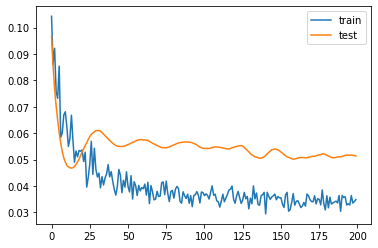

7.312565743923187
SokratisPapastathopoulos
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 49 samples, validate on 13 samples
Epoch 1/200
49/49 [==============================] - 0s 8ms/step - loss: 0.1540 - mse: 0.1540 - val_loss: 0.1597 - val_mse: 0.1597
Epoch 2/200
49/49 [==============================] - 0s 143us/step - loss: 0.1214 - mse: 0.1214 - val_loss: 0.1368 - val_mse: 0.1368
Epoch 3/200
49/49 [==============================] - 0s 163us/step - loss: 0.1329 - mse: 0.1329 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 4/200
49/49 [==============================] - 0s 163us/step - loss: 0.1196 - mse: 0.1196 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 5/200
49/49 [==============================] - 0s 143us/step - loss: 0.1302 - mse: 0.1302 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 6/200
49/49 [==============================] - 0s 143us/step - loss: 0.1396 - mse: 0.1396 - val_loss: 0.0696 - val_mse: 0.0696
Epoch 7/200
49/49 [==============================] - 0s 143us/step - loss: 0.1149 - mse: 0.1149 - val_loss: 0.0588 - val_mse: 0.0588
Epoch 8/200
49/49 [========

Epoch 62/200
49/49 [==============================] - 0s 122us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0329 - val_mse: 0.0329
Epoch 63/200
49/49 [==============================] - 0s 143us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 64/200
49/49 [==============================] - 0s 143us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 65/200
49/49 [==============================] - 0s 143us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 66/200
49/49 [==============================] - 0s 143us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 67/200
49/49 [==============================] - 0s 163us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 68/200
49/49 [==============================] - 0s 163us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 69/200
49/49 [==============================] - 0s 143us

Epoch 123/200
49/49 [==============================] - 0s 163us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 124/200
49/49 [==============================] - 0s 163us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 125/200
49/49 [==============================] - 0s 163us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 126/200
49/49 [==============================] - 0s 163us/step - loss: 0.0319 - mse: 0.0319 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 127/200
49/49 [==============================] - 0s 163us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 128/200
49/49 [==============================] - 0s 143us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 129/200
49/49 [==============================] - 0s 142us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 130/200
49/49 [==============================] - 

Epoch 184/200
49/49 [==============================] - 0s 123us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 185/200
49/49 [==============================] - 0s 143us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 186/200
49/49 [==============================] - 0s 143us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 187/200
49/49 [==============================] - 0s 143us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 188/200
49/49 [==============================] - 0s 143us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 189/200
49/49 [==============================] - 0s 143us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 190/200
49/49 [==============================] - 0s 143us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 191/200
49/49 [==============================] - 

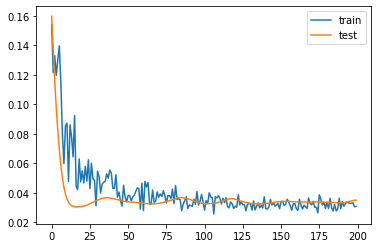

0.49479246139526367
DavidLuiz Moreira Marinho
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 27 samples
Epoch 1/200
104/104 [==============================] - 1s 5ms/step - loss: 0.1161 - mse: 0.1161 - val_loss: 0.1655 - val_mse: 0.1655
Epoch 2/200
104/104 [==============================] - 0s 77us/step - loss: 0.1166 - mse: 0.1166 - val_loss: 0.1533 - val_mse: 0.1533
Epoch 3/200
104/104 [==============================] - 0s 86us/step - loss: 0.1136 - mse: 0.1136 - val_loss: 0.1401 - val_mse: 0.1401
Epoch 4/200
104/104 [==============================] - 0s 77us/step - loss: 0.0957 - mse: 0.0957 - val_loss: 0.1288 - val_mse: 0.1288
Epoch 5/200
104/104 [==============================] - 0s 96us/step - loss: 0.0972 - mse: 0.0972 - val_loss: 0.1182 - val_mse: 0.1182
Epoch 6/200
104/104 [==============================] - 0s 96us/step - loss: 0.0980 - mse: 0.0980 - val_loss: 0.1085 - val_mse: 0.1085
Epoch 7/200
104/104 [==============================] - 0s 77us/step - loss: 0.0725 - mse: 0.0725 - val_loss: 0.0995 - val_mse: 0.0995
Epoch 8/200
104/10

Epoch 62/200
104/104 [==============================] - 0s 67us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0411 - val_mse: 0.0411
Epoch 63/200
104/104 [==============================] - 0s 77us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 64/200
104/104 [==============================] - 0s 87us/step - loss: 0.0427 - mse: 0.0427 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 65/200
104/104 [==============================] - 0s 77us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 66/200
104/104 [==============================] - 0s 77us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 67/200
104/104 [==============================] - 0s 77us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0407 - val_mse: 0.0407
Epoch 68/200
104/104 [==============================] - 0s 77us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0406 - val_mse: 0.0406
Epoch 69/200
104/104 [==============================] -

Epoch 123/200
104/104 [==============================] - 0s 86us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 124/200
104/104 [==============================] - 0s 77us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 125/200
104/104 [==============================] - 0s 77us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 126/200
104/104 [==============================] - 0s 86us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0396 - val_mse: 0.0396
Epoch 127/200
104/104 [==============================] - 0s 77us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 128/200
104/104 [==============================] - 0s 86us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0396 - val_mse: 0.0396
Epoch 129/200
104/104 [==============================] - 0s 77us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 77us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0396 - val_mse: 0.0396
Epoch 185/200
104/104 [==============================] - 0s 86us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 186/200
104/104 [==============================] - 0s 86us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0400 - val_mse: 0.0400
Epoch 187/200
104/104 [==============================] - 0s 106us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 188/200
104/104 [==============================] - 0s 106us/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 189/200
104/104 [==============================] - 0s 77us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0403 - val_mse: 0.0403
Epoch 190/200
104/104 [==============================] - 0s 77us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0403 - val_mse: 0.0403
Epoch 191/200
104/104 [=======================

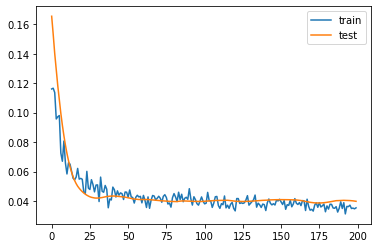

4.14480721950531
Pierre-EmerickAubameyang
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 60 samples, validate on 16 samples
Epoch 1/200
60/60 [==============================] - 0s 8ms/step - loss: 0.1595 - mse: 0.1595 - val_loss: 0.1047 - val_mse: 0.1047
Epoch 2/200
60/60 [==============================] - 0s 150us/step - loss: 0.1149 - mse: 0.1149 - val_loss: 0.0940 - val_mse: 0.0940
Epoch 3/200
60/60 [==============================] - 0s 133us/step - loss: 0.1307 - mse: 0.1307 - val_loss: 0.0858 - val_mse: 0.0858
Epoch 4/200
60/60 [==============================] - 0s 183us/step - loss: 0.1135 - mse: 0.1135 - val_loss: 0.0798 - val_mse: 0.0798
Epoch 5/200
60/60 [==============================] - 0s 150us/step - loss: 0.1193 - mse: 0.1193 - val_loss: 0.0754 - val_mse: 0.0754
Epoch 6/200
60/60 [==============================] - 0s 150us/step - loss: 0.0895 - mse: 0.0895 - val_loss: 0.0727 - val_mse: 0.0727
Epoch 7/200
60/60 [==============================] - 0s 250us/step - loss: 0.0687 - mse: 0.0687 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 8/200
60/60 [========

Epoch 62/200
60/60 [==============================] - 0s 133us/step - loss: 0.0720 - mse: 0.0720 - val_loss: 0.0676 - val_mse: 0.0676
Epoch 63/200
60/60 [==============================] - 0s 133us/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0674 - val_mse: 0.0674
Epoch 64/200
60/60 [==============================] - 0s 133us/step - loss: 0.0738 - mse: 0.0738 - val_loss: 0.0672 - val_mse: 0.0672
Epoch 65/200
60/60 [==============================] - 0s 150us/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0670 - val_mse: 0.0670
Epoch 66/200
60/60 [==============================] - 0s 133us/step - loss: 0.0722 - mse: 0.0722 - val_loss: 0.0668 - val_mse: 0.0668
Epoch 67/200
60/60 [==============================] - 0s 133us/step - loss: 0.0721 - mse: 0.0721 - val_loss: 0.0666 - val_mse: 0.0666
Epoch 68/200
60/60 [==============================] - 0s 217us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0663 - val_mse: 0.0663
Epoch 69/200
60/60 [==============================] - 0s 200us

Epoch 123/200
60/60 [==============================] - 0s 150us/step - loss: 0.0668 - mse: 0.0668 - val_loss: 0.0661 - val_mse: 0.0661
Epoch 124/200
60/60 [==============================] - 0s 133us/step - loss: 0.0696 - mse: 0.0696 - val_loss: 0.0659 - val_mse: 0.0659
Epoch 125/200
60/60 [==============================] - 0s 217us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 126/200
60/60 [==============================] - 0s 150us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0655 - val_mse: 0.0655
Epoch 127/200
60/60 [==============================] - 0s 133us/step - loss: 0.0655 - mse: 0.0655 - val_loss: 0.0653 - val_mse: 0.0653
Epoch 128/200
60/60 [==============================] - 0s 150us/step - loss: 0.0612 - mse: 0.0612 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 129/200
60/60 [==============================] - 0s 133us/step - loss: 0.0730 - mse: 0.0730 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 130/200
60/60 [==============================] - 

Epoch 184/200
60/60 [==============================] - 0s 150us/step - loss: 0.0612 - mse: 0.0612 - val_loss: 0.0646 - val_mse: 0.0646
Epoch 185/200
60/60 [==============================] - 0s 150us/step - loss: 0.0717 - mse: 0.0717 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 186/200
60/60 [==============================] - 0s 150us/step - loss: 0.0636 - mse: 0.0636 - val_loss: 0.0649 - val_mse: 0.0649
Epoch 187/200
60/60 [==============================] - 0s 167us/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 188/200
60/60 [==============================] - 0s 133us/step - loss: 0.0617 - mse: 0.0617 - val_loss: 0.0651 - val_mse: 0.0651
Epoch 189/200
60/60 [==============================] - 0s 167us/step - loss: 0.0675 - mse: 0.0675 - val_loss: 0.0653 - val_mse: 0.0653
Epoch 190/200
60/60 [==============================] - 0s 150us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 191/200
60/60 [==============================] - 

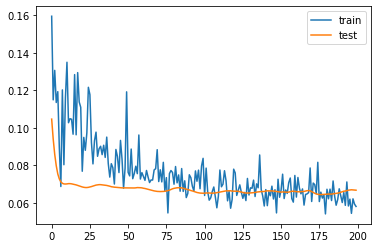

12.430273950099945
CédricSoares
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


AlexandreLacazette
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 0s 5ms/step - loss: 0.1280 - mse: 0.1280 - val_loss: 0.0793 - val_mse: 0.0793
Epoch 2/200
80/80 [==============================] - 0s 87us/step - loss: 0.1364 - mse: 0.1364 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1237 - mse: 0.1237 - val_loss: 0.0813 - val_mse: 0.0813
Epoch 4/200
80/80 [==============================] - 0s 100us/step - loss: 0.1020 - mse: 0.1020 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 5/200
80/80 [==============================] - 0s 100us/step - loss: 0.1086 - mse: 0.1086 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 6/200
80/80 [==============================] - 0s 150us/step - loss: 0.0904 - mse: 0.0904 - val_loss: 0.0853 - val_mse: 0.0853
Epoch 7/200
80/80 [==============================] - 0s 112us/step - loss: 0.1329 - mse: 0.1329 - val_loss: 0.0870 - val_mse: 0.0870
Epoch 8/200
80/80 [=========

80/80 [==============================] - 0s 100us/step - loss: 0.0511 - mse: 0.0511 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 63/200
80/80 [==============================] - 0s 100us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 64/200
80/80 [==============================] - 0s 87us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0829 - val_mse: 0.0829
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0664 - mse: 0.0664 - val_loss: 0.0830 - val_mse: 0.0830
Epoch 66/200
80/80 [==============================] - 0s 100us/step - loss: 0.0641 - mse: 0.0641 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 67/200
80/80 [==============================] - 0s 87us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 68/200
80/80 [==============================] - 0s 100us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 69/200
80/80 [==============================] - 0s 87us/step - loss: 0.

Epoch 124/200
80/80 [==============================] - 0s 87us/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0602 - mse: 0.0602 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 126/200
80/80 [==============================] - 0s 100us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 127/200
80/80 [==============================] - 0s 87us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 128/200
80/80 [==============================] - 0s 87us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 129/200
80/80 [==============================] - 0s 87us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0813 - val_mse: 0.0813
Epoch 130/200
80/80 [==============================] - 0s 100us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 131/200
80/80 [==============================] - 0s 1

Epoch 185/200
80/80 [==============================] - 0s 100us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 186/200
80/80 [==============================] - 0s 87us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 189/200
80/80 [==============================] - 0s 87us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 191/200
80/80 [==============================] - 0s 156us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 192/200
80/80 [==============================] - 0s

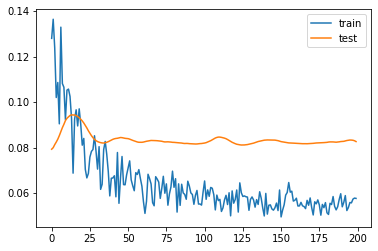

6.991581499576569
ShkodranMustafi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 26 samples
Epoch 1/200
104/104 [==============================] - 0s 4ms/step - loss: 0.1140 - mse: 0.1140 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 2/200
104/104 [==============================] - 0s 77us/step - loss: 0.1190 - mse: 0.1190 - val_loss: 0.0721 - val_mse: 0.0721
Epoch 3/200
104/104 [==============================] - 0s 77us/step - loss: 0.0845 - mse: 0.0845 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 4/200
104/104 [==============================] - 0s 77us/step - loss: 0.0979 - mse: 0.0979 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 5/200
104/104 [==============================] - 0s 87us/step - loss: 0.0819 - mse: 0.0819 - val_loss: 0.0523 - val_mse: 0.0523
Epoch 6/200
104/104 [==============================] - 0s 87us/step - loss: 0.0837 - mse: 0.0837 - val_loss: 0.0491 - val_mse: 0.0491
Epoch 7/200
104/104 [==============================] - 0s 77us/step - loss: 0.0753 - mse: 0.0753 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 8/200
104/10

Epoch 62/200
104/104 [==============================] - 0s 77us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 63/200
104/104 [==============================] - 0s 67us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 64/200
104/104 [==============================] - 0s 96us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 65/200
104/104 [==============================] - 0s 77us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 66/200
104/104 [==============================] - 0s 67us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 67/200
104/104 [==============================] - 0s 86us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 68/200
104/104 [==============================] - 0s 67us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 69/200
104/104 [==============================] -

Epoch 123/200
104/104 [==============================] - 0s 67us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 124/200
104/104 [==============================] - 0s 86us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 125/200
104/104 [==============================] - 0s 67us/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 126/200
104/104 [==============================] - 0s 77us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 127/200
104/104 [==============================] - 0s 67us/step - loss: 0.0393 - mse: 0.0393 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 128/200
104/104 [==============================] - 0s 77us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 129/200
104/104 [==============================] - 0s 86us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 77us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 185/200
104/104 [==============================] - 0s 77us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 186/200
104/104 [==============================] - 0s 96us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 187/200
104/104 [==============================] - 0s 96us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 188/200
104/104 [==============================] - 0s 86us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 189/200
104/104 [==============================] - 0s 106us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 190/200
104/104 [==============================] - 0s 96us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0469 - val_mse: 0.0469
Epoch 191/200
104/104 [========================

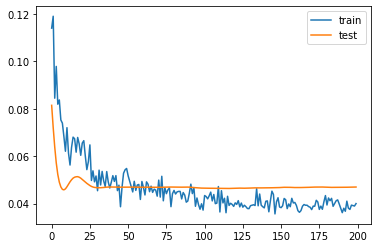

6.193070352077484
BerndLeno
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 9ms/step - loss: 0.1294 - mse: 0.1294 - val_loss: 0.1399 - val_mse: 0.1399
Epoch 2/200
52/52 [==============================] - 0s 154us/step - loss: 0.1423 - mse: 0.1423 - val_loss: 0.1250 - val_mse: 0.1250
Epoch 3/200
52/52 [==============================] - 0s 154us/step - loss: 0.0770 - mse: 0.0770 - val_loss: 0.1111 - val_mse: 0.1111
Epoch 4/200
52/52 [==============================] - 0s 154us/step - loss: 0.0916 - mse: 0.0916 - val_loss: 0.0999 - val_mse: 0.0999
Epoch 5/200
52/52 [==============================] - 0s 173us/step - loss: 0.1056 - mse: 0.1056 - val_loss: 0.0902 - val_mse: 0.0902
Epoch 6/200
52/52 [==============================] - 0s 134us/step - loss: 0.0716 - mse: 0.0716 - val_loss: 0.0817 - val_mse: 0.0817
Epoch 7/200
52/52 [==============================] - 0s 173us/step - loss: 0.0872 - mse: 0.0872 - val_loss: 0.0744 - val_mse: 0.0744
Epoch 8/200
52/52 [========

Epoch 62/200
52/52 [==============================] - 0s 154us/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0502 - val_mse: 0.0502
Epoch 63/200
52/52 [==============================] - 0s 115us/step - loss: 0.0605 - mse: 0.0605 - val_loss: 0.0504 - val_mse: 0.0504
Epoch 64/200
52/52 [==============================] - 0s 135us/step - loss: 0.0593 - mse: 0.0593 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 65/200
52/52 [==============================] - 0s 115us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 66/200
52/52 [==============================] - 0s 135us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0512 - val_mse: 0.0512
Epoch 67/200
52/52 [==============================] - 0s 135us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0514 - val_mse: 0.0514
Epoch 68/200
52/52 [==============================] - 0s 135us/step - loss: 0.0507 - mse: 0.0507 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 69/200
52/52 [==============================] - 0s 115us

Epoch 123/200
52/52 [==============================] - 0s 173us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0489 - val_mse: 0.0489
Epoch 124/200
52/52 [==============================] - 0s 135us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0491 - val_mse: 0.0491
Epoch 125/200
52/52 [==============================] - 0s 135us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 127/200
52/52 [==============================] - 0s 173us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 128/200
52/52 [==============================] - 0s 154us/step - loss: 0.0591 - mse: 0.0591 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 129/200
52/52 [==============================] - 0s 115us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 115us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 185/200
52/52 [==============================] - 0s 135us/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.0491 - val_mse: 0.0491
Epoch 186/200
52/52 [==============================] - 0s 115us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 187/200
52/52 [==============================] - 0s 154us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0489 - val_mse: 0.0489
Epoch 188/200
52/52 [==============================] - 0s 135us/step - loss: 0.0511 - mse: 0.0511 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 189/200
52/52 [==============================] - 0s 135us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 190/200
52/52 [==============================] - 0s 135us/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 191/200
52/52 [==============================] - 

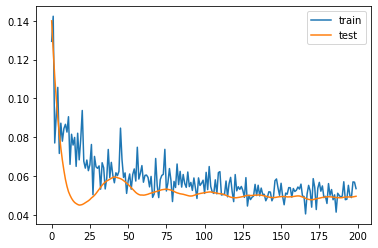

3.9388963878154755
GranitXhaka
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 28 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.2218 - mse: 0.2218 - val_loss: 0.1327 - val_mse: 0.1327
Epoch 2/200
108/108 [==============================] - 0s 74us/step - loss: 0.1595 - mse: 0.1595 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 3/200
108/108 [==============================] - 0s 74us/step - loss: 0.1531 - mse: 0.1531 - val_loss: 0.0993 - val_mse: 0.0993
Epoch 4/200
108/108 [==============================] - 0s 74us/step - loss: 0.1510 - mse: 0.1510 - val_loss: 0.0865 - val_mse: 0.0865
Epoch 5/200
108/108 [==============================] - 0s 93us/step - loss: 0.1018 - mse: 0.1018 - val_loss: 0.0760 - val_mse: 0.0760
Epoch 6/200
108/108 [==============================] - 0s 74us/step - loss: 0.0936 - mse: 0.0936 - val_loss: 0.0676 - val_mse: 0.0676
Epoch 7/200
108/108 [==============================] - 0s 74us/step - loss: 0.0867 - mse: 0.0867 - val_loss: 0.0610 - val_mse: 0.0610
Epoch 8/200
108/10

Epoch 62/200
108/108 [==============================] - 0s 65us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 63/200
108/108 [==============================] - 0s 83us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 64/200
108/108 [==============================] - 0s 74us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 65/200
108/108 [==============================] - 0s 74us/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 66/200
108/108 [==============================] - 0s 83us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 67/200
108/108 [==============================] - 0s 65us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 68/200
108/108 [==============================] - 0s 74us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 69/200
108/108 [==============================] -

Epoch 123/200
108/108 [==============================] - 0s 74us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 124/200
108/108 [==============================] - 0s 74us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 125/200
108/108 [==============================] - 0s 65us/step - loss: 0.0393 - mse: 0.0393 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 126/200
108/108 [==============================] - 0s 74us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 127/200
108/108 [==============================] - 0s 65us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 128/200
108/108 [==============================] - 0s 65us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 129/200
108/108 [==============================] - 0s 74us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 130/200
108/108 [=========================

Epoch 184/200
108/108 [==============================] - 0s 74us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 185/200
108/108 [==============================] - 0s 74us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 186/200
108/108 [==============================] - 0s 83us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 187/200
108/108 [==============================] - 0s 83us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 188/200
108/108 [==============================] - 0s 93us/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 189/200
108/108 [==============================] - 0s 74us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 190/200
108/108 [==============================] - 0s 93us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 191/200
108/108 [=========================

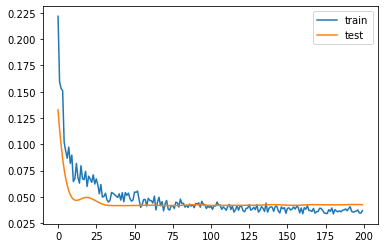

4.284386277198792
HéctorBellerín
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 27 samples
Epoch 1/200
104/104 [==============================] - 0s 5ms/step - loss: 0.1895 - mse: 0.1895 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 2/200
104/104 [==============================] - 0s 125us/step - loss: 0.1851 - mse: 0.1851 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 3/200
104/104 [==============================] - 0s 86us/step - loss: 0.2000 - mse: 0.2000 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 4/200
104/104 [==============================] - 0s 85us/step - loss: 0.1818 - mse: 0.1818 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 5/200
104/104 [==============================] - 0s 86us/step - loss: 0.1786 - mse: 0.1786 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 6/200
104/104 [==============================] - 0s 96us/step - loss: 0.1574 - mse: 0.1574 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 7/200
104/104 [==============================] - 0s 77us/step - loss: 0.1477 - mse: 0.1477 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 8/200
104/1

Epoch 62/200
104/104 [==============================] - 0s 77us/step - loss: 0.0581 - mse: 0.0581 - val_loss: 0.0370 - val_mse: 0.0370
Epoch 63/200
104/104 [==============================] - 0s 77us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0369 - val_mse: 0.0369
Epoch 64/200
104/104 [==============================] - 0s 125us/step - loss: 0.0562 - mse: 0.0562 - val_loss: 0.0368 - val_mse: 0.0368
Epoch 65/200
104/104 [==============================] - 0s 96us/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0368 - val_mse: 0.0368
Epoch 66/200
104/104 [==============================] - 0s 87us/step - loss: 0.0633 - mse: 0.0633 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 67/200
104/104 [==============================] - 0s 86us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 68/200
104/104 [==============================] - 0s 77us/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 69/200
104/104 [==============================] 

Epoch 123/200
104/104 [==============================] - 0s 86us/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 124/200
104/104 [==============================] - 0s 87us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 125/200
104/104 [==============================] - 0s 77us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 126/200
104/104 [==============================] - 0s 77us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 127/200
104/104 [==============================] - 0s 96us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 128/200
104/104 [==============================] - 0s 96us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 129/200
104/104 [==============================] - 0s 77us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 77us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 185/200
104/104 [==============================] - 0s 77us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 186/200
104/104 [==============================] - 0s 86us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 187/200
104/104 [==============================] - 0s 77us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 188/200
104/104 [==============================] - 0s 77us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 189/200
104/104 [==============================] - 0s 106us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 190/200
104/104 [==============================] - 0s 115us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 191/200
104/104 [=======================

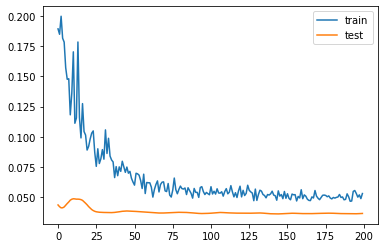

4.1463682651519775
EmilianoMartínez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 75 samples, validate on 19 samples
Epoch 1/200
75/75 [==============================] - 0s 6ms/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 2/200
75/75 [==============================] - 0s 106us/step - loss: 0.0891 - mse: 0.0891 - val_loss: 0.0356 - val_mse: 0.0356
Epoch 3/200
75/75 [==============================] - 0s 133us/step - loss: 0.0841 - mse: 0.0841 - val_loss: 0.0342 - val_mse: 0.0342
Epoch 4/200
75/75 [==============================] - 0s 120us/step - loss: 0.0725 - mse: 0.0725 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 5/200
75/75 [==============================] - 0s 107us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 6/200
75/75 [==============================] - 0s 120us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0316 - val_mse: 0.0316
Epoch 7/200
75/75 [==============================] - 0s 120us/step - loss: 0.0941 - mse: 0.0941 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 8/200
75/75 [========

Epoch 63/200
75/75 [==============================] - 0s 93us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0317 - val_mse: 0.0317
Epoch 64/200
75/75 [==============================] - 0s 93us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0317 - val_mse: 0.0317
Epoch 65/200
75/75 [==============================] - 0s 107us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0318 - val_mse: 0.0318
Epoch 66/200
75/75 [==============================] - 0s 93us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 67/200
75/75 [==============================] - 0s 120us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 68/200
75/75 [==============================] - 0s 120us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 69/200
75/75 [==============================] - 0s 93us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 70/200
75/75 [==============================] - 0s 80us/step

Epoch 125/200
75/75 [==============================] - 0s 107us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 126/200
75/75 [==============================] - 0s 93us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 127/200
75/75 [==============================] - 0s 93us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 128/200
75/75 [==============================] - 0s 107us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 129/200
75/75 [==============================] - 0s 107us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 130/200
75/75 [==============================] - 0s 93us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 131/200
75/75 [==============================] - 0s 93us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 132/200
75/75 [==============================] - 0s 9

Epoch 186/200
75/75 [==============================] - 0s 93us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 187/200
75/75 [==============================] - 0s 107us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 188/200
75/75 [==============================] - 0s 93us/step - loss: 0.0203 - mse: 0.0203 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 189/200
75/75 [==============================] - 0s 93us/step - loss: 0.0203 - mse: 0.0203 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 190/200
75/75 [==============================] - 0s 120us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 191/200
75/75 [==============================] - 0s 107us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 192/200
75/75 [==============================] - 0s 107us/step - loss: 0.0165 - mse: 0.0165 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 193/200
75/75 [==============================] - 0s 

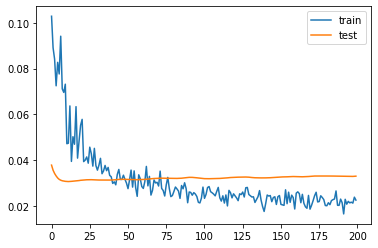

-0.16236422955989838
CalumChambers
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.3231 - mse: 0.3231 - val_loss: 0.3505 - val_mse: 0.3505
Epoch 2/200
108/108 [==============================] - 0s 278us/step - loss: 0.3258 - mse: 0.3258 - val_loss: 0.3102 - val_mse: 0.3102
Epoch 3/200
108/108 [==============================] - 0s 83us/step - loss: 0.2351 - mse: 0.2351 - val_loss: 0.2746 - val_mse: 0.2746
Epoch 4/200
108/108 [==============================] - 0s 74us/step - loss: 0.1864 - mse: 0.1864 - val_loss: 0.2450 - val_mse: 0.2450
Epoch 5/200
108/108 [==============================] - 0s 83us/step - loss: 0.1796 - mse: 0.1796 - val_loss: 0.2189 - val_mse: 0.2189
Epoch 6/200
108/108 [==============================] - 0s 74us/step - loss: 0.1885 - mse: 0.1885 - val_loss: 0.1960 - val_mse: 0.1960
Epoch 7/200
108/108 [==============================] - 0s 139us/step - loss: 0.1379 - mse: 0.1379 - val_loss: 0.1764 - val_mse: 0.1764
Epoch 8/200
108/

Epoch 62/200
108/108 [==============================] - 0s 74us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.1151 - val_mse: 0.1151
Epoch 63/200
108/108 [==============================] - 0s 74us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 64/200
108/108 [==============================] - 0s 65us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 65/200
108/108 [==============================] - 0s 74us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 66/200
108/108 [==============================] - 0s 83us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 67/200
108/108 [==============================] - 0s 65us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.1149 - val_mse: 0.1149
Epoch 69/200
108/108 [==============================] -

Epoch 123/200
108/108 [==============================] - 0s 74us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.1142 - val_mse: 0.1142
Epoch 124/200
108/108 [==============================] - 0s 65us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.1142 - val_mse: 0.1142
Epoch 125/200
108/108 [==============================] - 0s 74us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 126/200
108/108 [==============================] - 0s 83us/step - loss: 0.0501 - mse: 0.0501 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 127/200
108/108 [==============================] - 0s 74us/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 128/200
108/108 [==============================] - 0s 102us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.1150 - val_mse: 0.1150
Epoch 129/200
108/108 [==============================] - 0s 74us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.1152 - val_mse: 0.1152
Epoch 130/200
108/108 [========================

Epoch 184/200
108/108 [==============================] - 0s 65us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 185/200
108/108 [==============================] - 0s 65us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 186/200
108/108 [==============================] - 0s 74us/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.1150 - val_mse: 0.1150
Epoch 187/200
108/108 [==============================] - 0s 65us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.1153 - val_mse: 0.1153
Epoch 188/200
108/108 [==============================] - 0s 83us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.1157 - val_mse: 0.1157
Epoch 189/200
108/108 [==============================] - 0s 74us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 190/200
108/108 [==============================] - 0s 74us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.1162 - val_mse: 0.1162
Epoch 191/200
108/108 [=========================

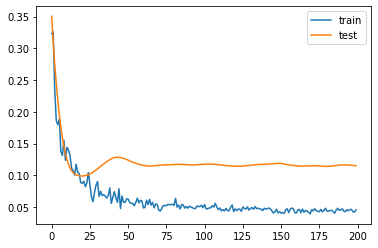

-0.19088456034660334
SeadKolasinac
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 78 samples, validate on 20 samples
Epoch 1/200
78/78 [==============================] - 0s 6ms/step - loss: 0.1144 - mse: 0.1144 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 2/200
78/78 [==============================] - 0s 102us/step - loss: 0.1835 - mse: 0.1835 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 3/200
78/78 [==============================] - 0s 115us/step - loss: 0.1009 - mse: 0.1009 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 4/200
78/78 [==============================] - 0s 103us/step - loss: 0.0953 - mse: 0.0953 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 5/200
78/78 [==============================] - 0s 115us/step - loss: 0.0809 - mse: 0.0809 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 6/200
78/78 [==============================] - 0s 115us/step - loss: 0.0904 - mse: 0.0904 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 7/200
78/78 [==============================] - 0s 115us/step - loss: 0.1043 - mse: 0.1043 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 8/200
78/78 [========

Epoch 63/200
78/78 [==============================] - 0s 128us/step - loss: 0.0472 - mse: 0.0472 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 64/200
78/78 [==============================] - 0s 141us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 65/200
78/78 [==============================] - 0s 102us/step - loss: 0.0497 - mse: 0.0497 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 66/200
78/78 [==============================] - 0s 103us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.0463 - val_mse: 0.0463
Epoch 67/200
78/78 [==============================] - 0s 103us/step - loss: 0.0466 - mse: 0.0466 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 68/200
78/78 [==============================] - 0s 103us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 69/200
78/78 [==============================] - 0s 102us/step - loss: 0.0466 - mse: 0.0466 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 70/200
78/78 [==============================] - 0s 90us/

78/78 [==============================] - 0s 103us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 125/200
78/78 [==============================] - 0s 154us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 126/200
78/78 [==============================] - 0s 154us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 127/200
78/78 [==============================] - 0s 103us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 128/200
78/78 [==============================] - 0s 102us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 129/200
78/78 [==============================] - 0s 115us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 130/200
78/78 [==============================] - 0s 102us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 131/200
78/78 [==============================] - 0s 115us/step 

Epoch 185/200
78/78 [==============================] - 0s 103us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 186/200
78/78 [==============================] - 0s 90us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 187/200
78/78 [==============================] - 0s 115us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 188/200
78/78 [==============================] - 0s 90us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 189/200
78/78 [==============================] - 0s 103us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 190/200
78/78 [==============================] - 0s 115us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 191/200
78/78 [==============================] - 0s 90us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 192/200
78/78 [==============================] - 0s 

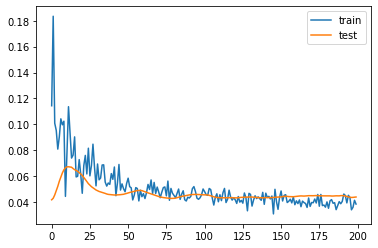

6.760244846343994
AinsleyMaitland-Niles
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 95 samples, validate on 24 samples
Epoch 1/200
95/95 [==============================] - 0s 5ms/step - loss: 0.1578 - mse: 0.1578 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 2/200
95/95 [==============================] - 0s 116us/step - loss: 0.1427 - mse: 0.1427 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 3/200
95/95 [==============================] - 0s 95us/step - loss: 0.1128 - mse: 0.1128 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 4/200
95/95 [==============================] - 0s 84us/step - loss: 0.0997 - mse: 0.0997 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 5/200
95/95 [==============================] - 0s 95us/step - loss: 0.1328 - mse: 0.1328 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 6/200
95/95 [==============================] - 0s 94us/step - loss: 0.1037 - mse: 0.1037 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 7/200
95/95 [==============================] - 0s 95us/step - loss: 0.1024 - mse: 0.1024 - val_loss: 0.0142 - val_mse: 0.0142
Epoch 8/200
95/95 [=============

Epoch 63/200
95/95 [==============================] - 0s 95us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 64/200
95/95 [==============================] - 0s 84us/step - loss: 0.0169 - mse: 0.0169 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 65/200
95/95 [==============================] - 0s 95us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 66/200
95/95 [==============================] - 0s 126us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 67/200
95/95 [==============================] - 0s 126us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 68/200
95/95 [==============================] - 0s 116us/step - loss: 0.0164 - mse: 0.0164 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 69/200
95/95 [==============================] - 0s 95us/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 70/200
95/95 [==============================] - 0s 105us/ste

Epoch 125/200
95/95 [==============================] - 0s 84us/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 126/200
95/95 [==============================] - 0s 105us/step - loss: 0.0155 - mse: 0.0155 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 127/200
95/95 [==============================] - 0s 95us/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 128/200
95/95 [==============================] - 0s 84us/step - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 129/200
95/95 [==============================] - 0s 84us/step - loss: 0.0157 - mse: 0.0157 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 130/200
95/95 [==============================] - 0s 105us/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 131/200
95/95 [==============================] - 0s 74us/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 132/200
95/95 [==============================] - 0s 95

95/95 [==============================] - 0s 84us/step - loss: 0.0139 - mse: 0.0139 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 187/200
95/95 [==============================] - 0s 84us/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 188/200
95/95 [==============================] - 0s 95us/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 189/200
95/95 [==============================] - 0s 74us/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 190/200
95/95 [==============================] - 0s 84us/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 191/200
95/95 [==============================] - 0s 74us/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 192/200
95/95 [==============================] - 0s 105us/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 193/200
95/95 [==============================] - 0s 95us/step - loss:

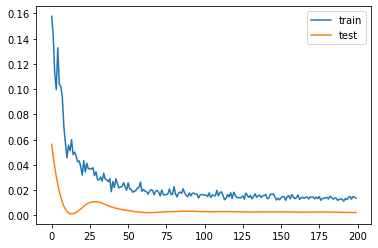

1.0953755378723142
RobHolding
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 98 samples, validate on 25 samples
Epoch 1/200
98/98 [==============================] - 1s 5ms/step - loss: 0.1775 - mse: 0.1775 - val_loss: 0.1315 - val_mse: 0.1315
Epoch 2/200
98/98 [==============================] - 0s 82us/step - loss: 0.1876 - mse: 0.1876 - val_loss: 0.1153 - val_mse: 0.1153
Epoch 3/200
98/98 [==============================] - 0s 92us/step - loss: 0.1280 - mse: 0.1280 - val_loss: 0.1025 - val_mse: 0.1025
Epoch 4/200
98/98 [==============================] - 0s 92us/step - loss: 0.1578 - mse: 0.1578 - val_loss: 0.0916 - val_mse: 0.0916
Epoch 5/200
98/98 [==============================] - 0s 112us/step - loss: 0.1397 - mse: 0.1397 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 6/200
98/98 [==============================] - 0s 112us/step - loss: 0.1183 - mse: 0.1183 - val_loss: 0.0746 - val_mse: 0.0746
Epoch 7/200
98/98 [==============================] - 0s 102us/step - loss: 0.1125 - mse: 0.1125 - val_loss: 0.0690 - val_mse: 0.0690
Epoch 8/200
98/98 [===========

Epoch 63/200
98/98 [==============================] - 0s 92us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0599 - val_mse: 0.0599
Epoch 64/200
98/98 [==============================] - 0s 92us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0600 - val_mse: 0.0600
Epoch 65/200
98/98 [==============================] - 0s 82us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0602 - val_mse: 0.0602
Epoch 66/200
98/98 [==============================] - 0s 82us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 67/200
98/98 [==============================] - 0s 71us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0604 - val_mse: 0.0604
Epoch 68/200
98/98 [==============================] - 0s 92us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 69/200
98/98 [==============================] - 0s 92us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 70/200
98/98 [==============================] - 0s 82us/step - 

Epoch 125/200
98/98 [==============================] - 0s 92us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 126/200
98/98 [==============================] - 0s 92us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0593 - val_mse: 0.0593
Epoch 127/200
98/98 [==============================] - 0s 82us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0593 - val_mse: 0.0593
Epoch 128/200
98/98 [==============================] - 0s 82us/step - loss: 0.0302 - mse: 0.0302 - val_loss: 0.0593 - val_mse: 0.0593
Epoch 129/200
98/98 [==============================] - 0s 82us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0592 - val_mse: 0.0592
Epoch 130/200
98/98 [==============================] - 0s 82us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0592 - val_mse: 0.0592
Epoch 131/200
98/98 [==============================] - 0s 92us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0592 - val_mse: 0.0592
Epoch 132/200
98/98 [==============================] - 0s 82us

Epoch 187/200
98/98 [==============================] - 0s 82us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0595 - val_mse: 0.0595
Epoch 188/200
98/98 [==============================] - 0s 82us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0595 - val_mse: 0.0595
Epoch 189/200
98/98 [==============================] - 0s 82us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 190/200
98/98 [==============================] - 0s 82us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 191/200
98/98 [==============================] - 0s 102us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 192/200
98/98 [==============================] - 0s 82us/step - loss: 0.0295 - mse: 0.0295 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 193/200
98/98 [==============================] - 0s 82us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 194/200
98/98 [==============================] - 0s 102

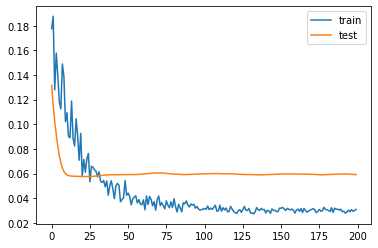

1.225551754236221
KieranTierney
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 20ms/step - loss: 0.1420 - mse: 0.1420 - val_loss: 0.1198 - val_mse: 0.1198
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.1083 - val_mse: 0.1083
Epoch 3/200
21/21 [==============================] - 0s 381us/step - loss: 0.1162 - mse: 0.1162 - val_loss: 0.0985 - val_mse: 0.0985
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.0881 - mse: 0.0881 - val_loss: 0.0895 - val_mse: 0.0895
Epoch 5/200
21/21 [==============================] - 0s 380us/step - loss: 0.1208 - mse: 0.1208 - val_loss: 0.0807 - val_mse: 0.0807
Epoch 6/200
21/21 [==============================] - 0s 333us/step - loss: 0.1201 - mse: 0.1201 - val_loss: 0.0732 - val_mse: 0.0732
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.0870 - mse: 0.0870 - val_loss: 0.0670 - val_mse: 0.0670
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 286us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0662 - val_mse: 0.0662
Epoch 63/200
21/21 [==============================] - 0s 286us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0659 - val_mse: 0.0659
Epoch 64/200
21/21 [==============================] - 0s 286us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0659 - val_mse: 0.0659
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 66/200
21/21 [==============================] - 0s 238us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 67/200
21/21 [==============================] - 0s 278us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0691 - val_mse: 0.0691
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0694 - val_mse: 0.0694
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0694 - val_mse: 0.0694
Epoch 126/200
21/21 [==============================] - 0s 286us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0693 - val_mse: 0.0693
Epoch 127/200
21/21 [==============================] - 0s 286us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0688 - val_mse: 0.0688
Epoch 128/200
21/21 [==============================] - 0s 286us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0679 - val_mse: 0.0679
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0673 - val_mse: 0.0673
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 286us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 185/200
21/21 [==============================] - 0s 286us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0617 - val_mse: 0.0617
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0621 - val_mse: 0.0621
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0626 - val_mse: 0.0626
Epoch 188/200
21/21 [==============================] - 0s 286us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 189/200
21/21 [==============================] - 0s 286us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0640 - val_mse: 0.0640
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0646 - val_mse: 0.0646
Epoch 191/200
21/21 [==============================] - 

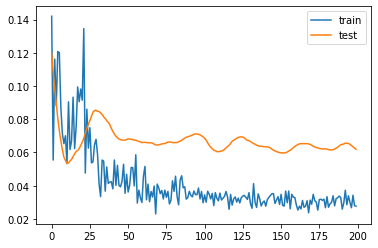

0.84713514149189
NicolasPépé
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 6 samples
Epoch 1/200
20/20 [==============================] - 0s 21ms/step - loss: 0.2563 - mse: 0.2563 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 2/200
20/20 [==============================] - 0s 349us/step - loss: 0.1081 - mse: 0.1081 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 3/200
20/20 [==============================] - 0s 399us/step - loss: 0.1516 - mse: 0.1516 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 4/200
20/20 [==============================] - 0s 399us/step - loss: 0.2057 - mse: 0.2057 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 5/200
20/20 [==============================] - 0s 300us/step - loss: 0.1117 - mse: 0.1117 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 6/200
20/20 [==============================] - 0s 400us/step - loss: 0.1402 - mse: 0.1402 - val_loss: 0.0502 - val_mse: 0.0502
Epoch 7/200
20/20 [==============================] - 0s 299us/step - loss: 0.1170 - mse: 0.1170 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 350us/step - loss: 0.0957 - mse: 0.0957 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 63/200
20/20 [==============================] - 0s 300us/step - loss: 0.0704 - mse: 0.0704 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 64/200
20/20 [==============================] - 0s 450us/step - loss: 0.0807 - mse: 0.0807 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 65/200
20/20 [==============================] - 0s 400us/step - loss: 0.0993 - mse: 0.0993 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 66/200
20/20 [==============================] - 0s 450us/step - loss: 0.1080 - mse: 0.1080 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 67/200
20/20 [==============================] - 0s 389us/step - loss: 0.0904 - mse: 0.0904 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 68/200
20/20 [==============================] - 0s 300us/step - loss: 0.1056 - mse: 0.1056 - val_loss: 0.0253 - val_mse: 0.0253
Epoch 69/200
20/20 [==============================] - 0s 400us

Epoch 123/200
20/20 [==============================] - 0s 350us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0214 - val_mse: 0.0214
Epoch 124/200
20/20 [==============================] - 0s 300us/step - loss: 0.0787 - mse: 0.0787 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 125/200
20/20 [==============================] - 0s 349us/step - loss: 0.0892 - mse: 0.0892 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 126/200
20/20 [==============================] - 0s 300us/step - loss: 0.0771 - mse: 0.0771 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0882 - mse: 0.0882 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 128/200
20/20 [==============================] - 0s 350us/step - loss: 0.0677 - mse: 0.0677 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 129/200
20/20 [==============================] - 0s 400us/step - loss: 0.0926 - mse: 0.0926 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 350us/step - loss: 0.0935 - mse: 0.0935 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 185/200
20/20 [==============================] - 0s 300us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 186/200
20/20 [==============================] - 0s 300us/step - loss: 0.0783 - mse: 0.0783 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 187/200
20/20 [==============================] - 0s 350us/step - loss: 0.0633 - mse: 0.0633 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 188/200
20/20 [==============================] - 0s 400us/step - loss: 0.0890 - mse: 0.0890 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 189/200
20/20 [==============================] - 0s 300us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 190/200
20/20 [==============================] - 0s 400us/step - loss: 0.0695 - mse: 0.0695 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 191/200
20/20 [==============================] - 

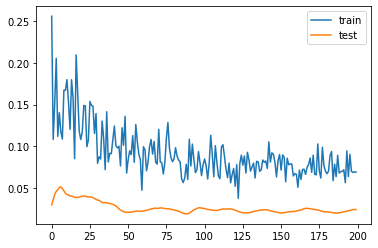

6.487186700105667
LucasTorreira
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 9ms/step - loss: 0.1242 - mse: 0.1242 - val_loss: 0.0188 - val_mse: 0.0188
Epoch 2/200
50/50 [==============================] - 0s 140us/step - loss: 0.1143 - mse: 0.1143 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 3/200
50/50 [==============================] - 0s 160us/step - loss: 0.1329 - mse: 0.1329 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 4/200
50/50 [==============================] - 0s 160us/step - loss: 0.1387 - mse: 0.1387 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 5/200
50/50 [==============================] - 0s 160us/step - loss: 0.1456 - mse: 0.1456 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 6/200
50/50 [==============================] - 0s 160us/step - loss: 0.1286 - mse: 0.1286 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 7/200
50/50 [==============================] - 0s 140us/step - loss: 0.0897 - mse: 0.0897 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 8/200
50/50 [========

Epoch 62/200
50/50 [==============================] - 0s 160us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 63/200
50/50 [==============================] - 0s 140us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 64/200
50/50 [==============================] - 0s 160us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 65/200
50/50 [==============================] - 0s 120us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 66/200
50/50 [==============================] - 0s 160us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 67/200
50/50 [==============================] - 0s 120us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 68/200
50/50 [==============================] - 0s 140us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0166 - val_mse: 0.0166
Epoch 69/200
50/50 [==============================] - 0s 140us

Epoch 123/200
50/50 [==============================] - 0s 140us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 124/200
50/50 [==============================] - 0s 160us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 125/200
50/50 [==============================] - 0s 140us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 126/200
50/50 [==============================] - 0s 140us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 127/200
50/50 [==============================] - 0s 140us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 128/200
50/50 [==============================] - 0s 140us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 129/200
50/50 [==============================] - 0s 120us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 140us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 185/200
50/50 [==============================] - 0s 140us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 186/200
50/50 [==============================] - 0s 160us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 187/200
50/50 [==============================] - 0s 140us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 188/200
50/50 [==============================] - 0s 140us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 189/200
50/50 [==============================] - 0s 160us/step - loss: 0.0211 - mse: 0.0211 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 190/200
50/50 [==============================] - 0s 120us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 191/200
50/50 [==============================] - 

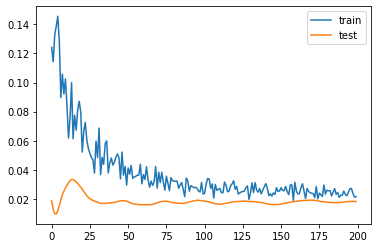

1.5557703673839567
JosephWillock
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 43 samples, validate on 11 samples
Epoch 1/200
43/43 [==============================] - 0s 11ms/step - loss: 0.1479 - mse: 0.1479 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 2/200
43/43 [==============================] - 0s 163us/step - loss: 0.1375 - mse: 0.1375 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 3/200
43/43 [==============================] - 0s 186us/step - loss: 0.1442 - mse: 0.1442 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 4/200
43/43 [==============================] - 0s 209us/step - loss: 0.1184 - mse: 0.1184 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 5/200
43/43 [==============================] - 0s 163us/step - loss: 0.1521 - mse: 0.1521 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 6/200
43/43 [==============================] - 0s 209us/step - loss: 0.1350 - mse: 0.1350 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 7/200
43/43 [==============================] - 0s 163us/step - loss: 0.0998 - mse: 0.0998 - val_loss: 0.0219 - val_mse: 0.0219
Epoch 8/200
43/43 [=======

Epoch 62/200
43/43 [==============================] - 0s 139us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 63/200
43/43 [==============================] - 0s 163us/step - loss: 0.0357 - mse: 0.0357 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 64/200
43/43 [==============================] - 0s 186us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 65/200
43/43 [==============================] - 0s 186us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 66/200
43/43 [==============================] - 0s 186us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 67/200
43/43 [==============================] - 0s 163us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 68/200
43/43 [==============================] - 0s 256us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 69/200
43/43 [==============================] - 0s 209us

Epoch 123/200
43/43 [==============================] - 0s 186us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 124/200
43/43 [==============================] - 0s 163us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 125/200
43/43 [==============================] - 0s 186us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 126/200
43/43 [==============================] - 0s 163us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 127/200
43/43 [==============================] - 0s 186us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 128/200
43/43 [==============================] - 0s 186us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 129/200
43/43 [==============================] - 0s 186us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 130/200
43/43 [==============================] - 

Epoch 184/200
43/43 [==============================] - 0s 186us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 185/200
43/43 [==============================] - 0s 163us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 186/200
43/43 [==============================] - 0s 163us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 187/200
43/43 [==============================] - 0s 186us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 188/200
43/43 [==============================] - 0s 209us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 189/200
43/43 [==============================] - 0s 163us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 190/200
43/43 [==============================] - 0s 186us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 191/200
43/43 [==============================] - 

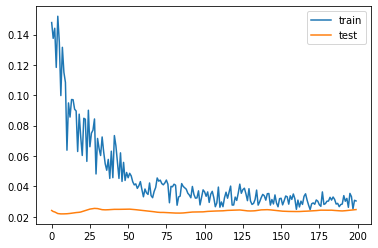

0.7093910872936249
ReissNelson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 75 samples, validate on 19 samples
Epoch 1/200
75/75 [==============================] - 0s 7ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 2/200
75/75 [==============================] - 0s 107us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 3/200
75/75 [==============================] - 0s 107us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 4/200
75/75 [==============================] - 0s 133us/step - loss: 0.0409 - mse: 0.0409 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 5/200
75/75 [==============================] - 0s 120us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 6/200
75/75 [==============================] - 0s 120us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 7/200
75/75 [==============================] - 0s 146us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 8/200
75/75 [========

Epoch 62/200
75/75 [==============================] - 0s 93us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 63/200
75/75 [==============================] - 0s 120us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 64/200
75/75 [==============================] - 0s 93us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 65/200
75/75 [==============================] - 0s 93us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 66/200
75/75 [==============================] - 0s 107us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 67/200
75/75 [==============================] - 0s 93us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 68/200
75/75 [==============================] - 0s 107us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 69/200
75/75 [==============================] - 0s 93us/step

75/75 [==============================] - 0s 93us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 124/200
75/75 [==============================] - 0s 93us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 125/200
75/75 [==============================] - 0s 120us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 126/200
75/75 [==============================] - 0s 93us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 127/200
75/75 [==============================] - 0s 120us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 128/200
75/75 [==============================] - 0s 93us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 129/200
75/75 [==============================] - 0s 107us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 130/200
75/75 [==============================] - 0s 107us/step - lo

Epoch 184/200
75/75 [==============================] - 0s 93us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 185/200
75/75 [==============================] - 0s 120us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 186/200
75/75 [==============================] - 0s 107us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 187/200
75/75 [==============================] - 0s 107us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 188/200
75/75 [==============================] - 0s 107us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 189/200
75/75 [==============================] - 0s 93us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 190/200
75/75 [==============================] - 0s 133us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 191/200
75/75 [==============================] - 0s

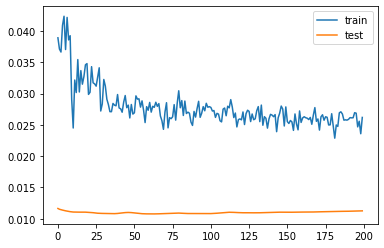

-0.34500402957201004
EdwardNketiah
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 60 samples, validate on 16 samples
Epoch 1/200
60/60 [==============================] - 0s 8ms/step - loss: 0.1377 - mse: 0.1377 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 2/200
60/60 [==============================] - 0s 117us/step - loss: 0.2378 - mse: 0.2378 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 3/200
60/60 [==============================] - 0s 133us/step - loss: 0.2473 - mse: 0.2473 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 4/200
60/60 [==============================] - 0s 133us/step - loss: 0.2242 - mse: 0.2242 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 5/200
60/60 [==============================] - 0s 133us/step - loss: 0.1945 - mse: 0.1945 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 6/200
60/60 [==============================] - 0s 150us/step - loss: 0.1791 - mse: 0.1791 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 7/200
60/60 [==============================] - 0s 150us/step - loss: 0.1473 - mse: 0.1473 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 8/200
60/60 [========

Epoch 62/200
60/60 [==============================] - 0s 133us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 63/200
60/60 [==============================] - 0s 118us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 64/200
60/60 [==============================] - 0s 133us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 65/200
60/60 [==============================] - 0s 117us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 66/200
60/60 [==============================] - 0s 133us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 67/200
60/60 [==============================] - 0s 133us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 68/200
60/60 [==============================] - 0s 150us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 69/200
60/60 [==============================] - 0s 133us

Epoch 123/200
60/60 [==============================] - 0s 117us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 124/200
60/60 [==============================] - 0s 120us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 125/200
60/60 [==============================] - 0s 150us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 126/200
60/60 [==============================] - 0s 100us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 127/200
60/60 [==============================] - 0s 133us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 128/200
60/60 [==============================] - 0s 117us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 129/200
60/60 [==============================] - 0s 117us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 130/200
60/60 [==============================] - 

Epoch 184/200
60/60 [==============================] - 0s 117us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 185/200
60/60 [==============================] - 0s 167us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 186/200
60/60 [==============================] - 0s 133us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 187/200
60/60 [==============================] - 0s 133us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 188/200
60/60 [==============================] - 0s 117us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 189/200
60/60 [==============================] - 0s 133us/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 190/200
60/60 [==============================] - 0s 150us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 191/200
60/60 [==============================] - 

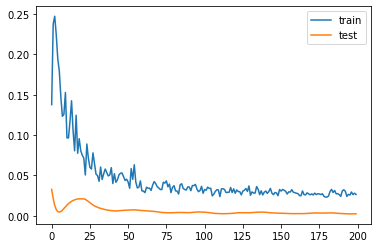

-0.6108873039484023
BukayoSaka
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 34 samples, validate on 9 samples
Epoch 1/200
34/34 [==============================] - 0s 12ms/step - loss: 0.1198 - mse: 0.1198 - val_loss: 2.0512e-04 - val_mse: 2.0512e-04
Epoch 2/200
34/34 [==============================] - 0s 235us/step - loss: 0.1323 - mse: 0.1323 - val_loss: 7.7602e-05 - val_mse: 7.7602e-05
Epoch 3/200
34/34 [==============================] - 0s 235us/step - loss: 0.1166 - mse: 0.1166 - val_loss: 3.5925e-04 - val_mse: 3.5925e-04
Epoch 4/200
34/34 [==============================] - 0s 235us/step - loss: 0.1331 - mse: 0.1331 - val_loss: 9.7449e-04 - val_mse: 9.7449e-04
Epoch 5/200
34/34 [==============================] - 0s 235us/step - loss: 0.0596 - mse: 0.0596 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 6/200
34/34 [==============================] - 0s 206us/step - loss: 0.0968 - mse: 0.0968 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 7/200
34/34 [==============================] - 0s 265us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0045 - val_mse: 0.

Epoch 62/200
34/34 [==============================] - 0s 206us/step - loss: 0.0664 - mse: 0.0664 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 63/200
34/34 [==============================] - 0s 206us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 64/200
34/34 [==============================] - 0s 176us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 65/200
34/34 [==============================] - 0s 206us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 66/200
34/34 [==============================] - 0s 206us/step - loss: 0.0753 - mse: 0.0753 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 67/200
34/34 [==============================] - 0s 235us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 68/200
34/34 [==============================] - 0s 176us/step - loss: 0.0547 - mse: 0.0547 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 69/200
34/34 [==============================] - 0s 176us

Epoch 123/200
34/34 [==============================] - 0s 206us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0166 - val_mse: 0.0166
Epoch 124/200
34/34 [==============================] - 0s 206us/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.0166 - val_mse: 0.0166
Epoch 125/200
34/34 [==============================] - 0s 265us/step - loss: 0.0573 - mse: 0.0573 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 126/200
34/34 [==============================] - 0s 176us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.0169 - val_mse: 0.0169
Epoch 127/200
34/34 [==============================] - 0s 206us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0171 - val_mse: 0.0171
Epoch 128/200
34/34 [==============================] - 0s 206us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 129/200
34/34 [==============================] - 0s 176us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 130/200
34/34 [==============================] - 

Epoch 184/200
34/34 [==============================] - 0s 206us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 185/200
34/34 [==============================] - 0s 176us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 186/200
34/34 [==============================] - 0s 206us/step - loss: 0.0505 - mse: 0.0505 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 187/200
34/34 [==============================] - 0s 176us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 188/200
34/34 [==============================] - 0s 206us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 189/200
34/34 [==============================] - 0s 176us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 190/200
34/34 [==============================] - 0s 235us/step - loss: 0.0556 - mse: 0.0556 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 191/200
34/34 [==============================] - 

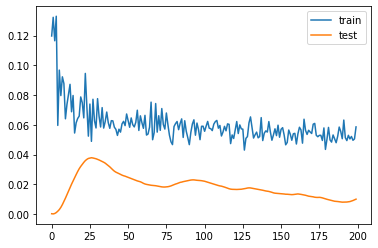

-0.6635450571775436
MatteoGuendouzi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 0s 8ms/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.0646 - val_mse: 0.0646
Epoch 2/200
51/51 [==============================] - 0s 157us/step - loss: 0.1030 - mse: 0.1030 - val_loss: 0.0550 - val_mse: 0.0550
Epoch 3/200
51/51 [==============================] - 0s 137us/step - loss: 0.1397 - mse: 0.1397 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 4/200
51/51 [==============================] - 0s 157us/step - loss: 0.1275 - mse: 0.1275 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 5/200
51/51 [==============================] - 0s 176us/step - loss: 0.0984 - mse: 0.0984 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 6/200
51/51 [==============================] - 0s 157us/step - loss: 0.1310 - mse: 0.1310 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.1246 - mse: 0.1246 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 8/200
51/51 [========

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 63/200
51/51 [==============================] - 0s 137us/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 64/200
51/51 [==============================] - 0s 157us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 65/200
51/51 [==============================] - 0s 196us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 66/200
51/51 [==============================] - 0s 157us/step - loss: 0.0219 - mse: 0.0219 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 67/200
51/51 [==============================] - 0s 157us/step - loss: 0.0185 - mse: 0.0185 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 68/200
51/51 [==============================] - 0s 137us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 69/200
51/51 [==============================] - 0s 157us

Epoch 123/200
51/51 [==============================] - 0s 157us/step - loss: 0.0158 - mse: 0.0158 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 124/200
51/51 [==============================] - 0s 137us/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 125/200
51/51 [==============================] - 0s 157us/step - loss: 0.0169 - mse: 0.0169 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 126/200
51/51 [==============================] - 0s 137us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 127/200
51/51 [==============================] - 0s 157us/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 128/200
51/51 [==============================] - 0s 176us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 129/200
51/51 [==============================] - 0s 137us/step - loss: 0.0146 - mse: 0.0146 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 157us/step - loss: 0.0155 - mse: 0.0155 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 185/200
51/51 [==============================] - 0s 157us/step - loss: 0.0152 - mse: 0.0152 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 187/200
51/51 [==============================] - 0s 157us/step - loss: 0.0149 - mse: 0.0149 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 188/200
51/51 [==============================] - 0s 157us/step - loss: 0.0145 - mse: 0.0145 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 189/200
51/51 [==============================] - 0s 157us/step - loss: 0.0163 - mse: 0.0163 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 190/200
51/51 [==============================] - 0s 137us/step - loss: 0.0151 - mse: 0.0151 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 191/200
51/51 [==============================] - 

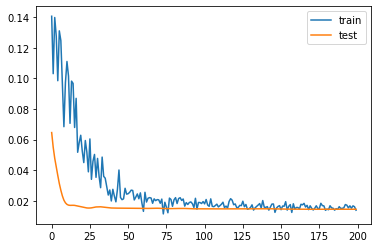

0.4239511825144291
Gabriel TeodoroMartinelli Silva
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 6 samples
Epoch 1/200
20/20 [==============================] - 0s 20ms/step - loss: 0.4145 - mse: 0.4145 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 2/200
20/20 [==============================] - 0s 400us/step - loss: 0.3343 - mse: 0.3343 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 3/200
20/20 [==============================] - 0s 349us/step - loss: 0.2212 - mse: 0.2212 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 4/200
20/20 [==============================] - 0s 450us/step - loss: 0.2040 - mse: 0.2040 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 5/200
20/20 [==============================] - 0s 400us/step - loss: 0.2029 - mse: 0.2029 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 6/200
20/20 [==============================] - 0s 350us/step - loss: 0.1518 - mse: 0.1518 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 7/200
20/20 [==============================] - 0s 350us/step - loss: 0.1908 - mse: 0.1908 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 400us/step - loss: 0.0806 - mse: 0.0806 - val_loss: 0.0416 - val_mse: 0.0416
Epoch 63/200
20/20 [==============================] - 0s 350us/step - loss: 0.1792 - mse: 0.1792 - val_loss: 0.0415 - val_mse: 0.0415
Epoch 64/200
20/20 [==============================] - 0s 350us/step - loss: 0.1066 - mse: 0.1066 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 65/200
20/20 [==============================] - 0s 277us/step - loss: 0.1845 - mse: 0.1845 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 66/200
20/20 [==============================] - 0s 350us/step - loss: 0.1081 - mse: 0.1081 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 67/200
20/20 [==============================] - 0s 300us/step - loss: 0.1257 - mse: 0.1257 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 68/200
20/20 [==============================] - 0s 300us/step - loss: 0.1446 - mse: 0.1446 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 69/200
20/20 [==============================] - 0s 350us

Epoch 123/200
20/20 [==============================] - 0s 350us/step - loss: 0.1194 - mse: 0.1194 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 124/200
20/20 [==============================] - 0s 300us/step - loss: 0.1472 - mse: 0.1472 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 125/200
20/20 [==============================] - 0s 300us/step - loss: 0.1018 - mse: 0.1018 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 126/200
20/20 [==============================] - 0s 300us/step - loss: 0.1275 - mse: 0.1275 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 127/200
20/20 [==============================] - 0s 300us/step - loss: 0.1150 - mse: 0.1150 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 128/200
20/20 [==============================] - 0s 350us/step - loss: 0.1167 - mse: 0.1167 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 129/200
20/20 [==============================] - 0s 300us/step - loss: 0.1002 - mse: 0.1002 - val_loss: 0.0482 - val_mse: 0.0482
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 350us/step - loss: 0.1156 - mse: 0.1156 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 185/200
20/20 [==============================] - 0s 300us/step - loss: 0.1038 - mse: 0.1038 - val_loss: 0.0497 - val_mse: 0.0497
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0923 - mse: 0.0923 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 187/200
20/20 [==============================] - 0s 300us/step - loss: 0.1083 - mse: 0.1083 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 188/200
20/20 [==============================] - 0s 400us/step - loss: 0.1161 - mse: 0.1161 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 189/200
20/20 [==============================] - 0s 300us/step - loss: 0.1037 - mse: 0.1037 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 190/200
20/20 [==============================] - 0s 300us/step - loss: 0.1155 - mse: 0.1155 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 191/200
20/20 [==============================] - 

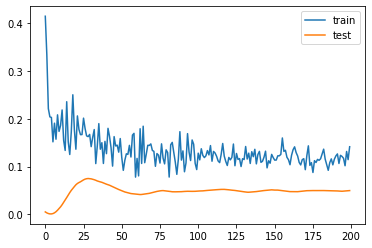

1.8927545547485352
WillianBorges Da Silva
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 107 samples, validate on 27 samples
Epoch 1/200
107/107 [==============================] - 0s 4ms/step - loss: 0.1333 - mse: 0.1333 - val_loss: 0.1014 - val_mse: 0.1014
Epoch 2/200
107/107 [==============================] - 0s 75us/step - loss: 0.0992 - mse: 0.0992 - val_loss: 0.0971 - val_mse: 0.0971
Epoch 3/200
107/107 [==============================] - 0s 84us/step - loss: 0.1250 - mse: 0.1250 - val_loss: 0.0932 - val_mse: 0.0932
Epoch 4/200
107/107 [==============================] - 0s 84us/step - loss: 0.1114 - mse: 0.1114 - val_loss: 0.0896 - val_mse: 0.0896
Epoch 5/200
107/107 [==============================] - 0s 75us/step - loss: 0.1065 - mse: 0.1065 - val_loss: 0.0864 - val_mse: 0.0864
Epoch 6/200
107/107 [==============================] - 0s 93us/step - loss: 0.1192 - mse: 0.1192 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 7/200
107/107 [==============================] - 0s 84us/step - loss: 0.0949 - mse: 0.0949 - val_loss: 0.0807 - val_mse: 0.0807
Epoch 8/200
107/10

Epoch 62/200
107/107 [==============================] - 0s 75us/step - loss: 0.0462 - mse: 0.0462 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 63/200
107/107 [==============================] - 0s 93us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 64/200
107/107 [==============================] - 0s 75us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 65/200
107/107 [==============================] - 0s 65us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 66/200
107/107 [==============================] - 0s 84us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 67/200
107/107 [==============================] - 0s 75us/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 68/200
107/107 [==============================] - 0s 84us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 69/200
107/107 [==============================] -

Epoch 123/200
107/107 [==============================] - 0s 84us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0491 - val_mse: 0.0491
Epoch 124/200
107/107 [==============================] - 0s 75us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 125/200
107/107 [==============================] - 0s 84us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 126/200
107/107 [==============================] - 0s 75us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 127/200
107/107 [==============================] - 0s 75us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 128/200
107/107 [==============================] - 0s 75us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 129/200
107/107 [==============================] - 0s 75us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 130/200
107/107 [=========================

Epoch 184/200
107/107 [==============================] - 0s 75us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 185/200
107/107 [==============================] - 0s 93us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 186/200
107/107 [==============================] - 0s 84us/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 187/200
107/107 [==============================] - 0s 75us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 188/200
107/107 [==============================] - 0s 65us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 189/200
107/107 [==============================] - 0s 65us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 190/200
107/107 [==============================] - 0s 84us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 191/200
107/107 [=========================

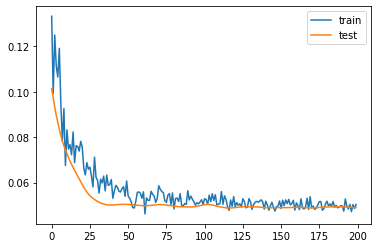

3.9395553916692734
DanielCeballos Fernández
no_player_data_so_far_this_season
TomHeaton
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AhmedEl Mohamady
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NeilTaylor
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ConorHourihane
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



José IgnacioPeleteiro Romallo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ØrjanNyland
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



BjornEngels
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JackGrealish
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JohnMcGinn
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KortneyHause
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Mahmoud AhmedIbrahim Hassan
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



TyroneMings
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MattTargett
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MarvelousNakamba
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AnwarEl Ghazi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



EzriKonsa Ngoyo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



FrédéricGuilbert
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



WesleyMoraes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MbwanaSamatta
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KeinanDavis
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Douglas LuizSoares de Paulo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



GlennMurray
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 5ms/step - loss: 0.2329 - mse: 0.2329 - val_loss: 0.1808 - val_mse: 0.1808
Epoch 2/200
80/80 [==============================] - 0s 112us/step - loss: 0.2347 - mse: 0.2347 - val_loss: 0.1515 - val_mse: 0.1515
Epoch 3/200
80/80 [==============================] - 0s 87us/step - loss: 0.1888 - mse: 0.1888 - val_loss: 0.1297 - val_mse: 0.1297
Epoch 4/200
80/80 [==============================] - 0s 100us/step - loss: 0.1968 - mse: 0.1968 - val_loss: 0.1111 - val_mse: 0.1111
Epoch 5/200
80/80 [==============================] - 0s 87us/step - loss: 0.2118 - mse: 0.2118 - val_loss: 0.0981 - val_mse: 0.0981
Epoch 6/200
80/80 [==============================] - 0s 100us/step - loss: 0.2445 - mse: 0.2445 - val_loss: 0.0877 - val_mse: 0.0877
Epoch 7/200
80/80 [==============================] - 0s 100us/step - loss: 0.1271 - mse: 0.1271 - val_loss: 0.0798 - val_mse: 0.0798
Epoch 8/200
80/80 [==========

Epoch 63/200
80/80 [==============================] - 0s 87us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 64/200
80/80 [==============================] - 0s 75us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 65/200
80/80 [==============================] - 0s 100us/step - loss: 0.0753 - mse: 0.0753 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 66/200
80/80 [==============================] - 0s 87us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 67/200
80/80 [==============================] - 0s 87us/step - loss: 0.0655 - mse: 0.0655 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 68/200
80/80 [==============================] - 0s 87us/step - loss: 0.0834 - mse: 0.0834 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 69/200
80/80 [==============================] - 0s 100us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 70/200
80/80 [==============================] - 0s 100us/step

Epoch 125/200
80/80 [==============================] - 0s 100us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 126/200
80/80 [==============================] - 0s 100us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 127/200
80/80 [==============================] - 0s 100us/step - loss: 0.0661 - mse: 0.0661 - val_loss: 0.0630 - val_mse: 0.0630
Epoch 128/200
80/80 [==============================] - 0s 87us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 129/200
80/80 [==============================] - 0s 100us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 130/200
80/80 [==============================] - 0s 87us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0632 - val_mse: 0.0632
Epoch 131/200
80/80 [==============================] - 0s 87us/step - loss: 0.0600 - mse: 0.0600 - val_loss: 0.0632 - val_mse: 0.0632
Epoch 132/200
80/80 [==============================] - 0s 

Epoch 186/200
80/80 [==============================] - 0s 87us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 187/200
80/80 [==============================] - 0s 87us/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 189/200
80/80 [==============================] - 0s 100us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 190/200
80/80 [==============================] - 0s 100us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 191/200
80/80 [==============================] - 0s 87us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 192/200
80/80 [==============================] - 0s 100us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 193/200
80/80 [==============================] - 0s 

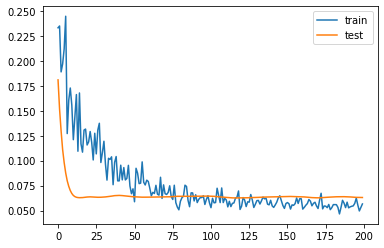

2.519670069217682
AdamLallana
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 97 samples, validate on 25 samples
Epoch 1/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0878 - mse: 0.0878 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 2/200
97/97 [==============================] - 0s 93us/step - loss: 0.0792 - mse: 0.0792 - val_loss: 0.0626 - val_mse: 0.0626
Epoch 3/200
97/97 [==============================] - 0s 103us/step - loss: 0.0749 - mse: 0.0749 - val_loss: 0.0604 - val_mse: 0.0604
Epoch 4/200
97/97 [==============================] - 0s 82us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0586 - val_mse: 0.0586
Epoch 5/200
97/97 [==============================] - 0s 93us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 6/200
97/97 [==============================] - 0s 82us/step - loss: 0.0614 - mse: 0.0614 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 7/200
97/97 [==============================] - 0s 93us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 8/200
97/97 [=============

Epoch 63/200
97/97 [==============================] - 0s 72us/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0590 - val_mse: 0.0590
Epoch 64/200
97/97 [==============================] - 0s 82us/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0591 - val_mse: 0.0591
Epoch 65/200
97/97 [==============================] - 0s 72us/step - loss: 0.0136 - mse: 0.0136 - val_loss: 0.0591 - val_mse: 0.0591
Epoch 66/200
97/97 [==============================] - 0s 82us/step - loss: 0.0156 - mse: 0.0156 - val_loss: 0.0590 - val_mse: 0.0590
Epoch 67/200
97/97 [==============================] - 0s 72us/step - loss: 0.0147 - mse: 0.0147 - val_loss: 0.0589 - val_mse: 0.0589
Epoch 68/200
97/97 [==============================] - 0s 72us/step - loss: 0.0153 - mse: 0.0153 - val_loss: 0.0588 - val_mse: 0.0588
Epoch 69/200
97/97 [==============================] - 0s 82us/step - loss: 0.0153 - mse: 0.0153 - val_loss: 0.0586 - val_mse: 0.0586
Epoch 70/200
97/97 [==============================] - 0s 72us/step - 

Epoch 125/200
97/97 [==============================] - 0s 82us/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 126/200
97/97 [==============================] - 0s 82us/step - loss: 0.0137 - mse: 0.0137 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 127/200
97/97 [==============================] - 0s 82us/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 128/200
97/97 [==============================] - 0s 82us/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 129/200
97/97 [==============================] - 0s 82us/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 130/200
97/97 [==============================] - 0s 72us/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 131/200
97/97 [==============================] - 0s 82us/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 132/200
97/97 [==============================] - 0s 82us

Epoch 187/200
97/97 [==============================] - 0s 72us/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 188/200
97/97 [==============================] - 0s 82us/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 189/200
97/97 [==============================] - 0s 72us/step - loss: 0.0125 - mse: 0.0125 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 190/200
97/97 [==============================] - 0s 72us/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 191/200
97/97 [==============================] - 0s 72us/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 192/200
97/97 [==============================] - 0s 72us/step - loss: 0.0145 - mse: 0.0145 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 193/200
97/97 [==============================] - 0s 72us/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 194/200
97/97 [==============================] - 0s 72us

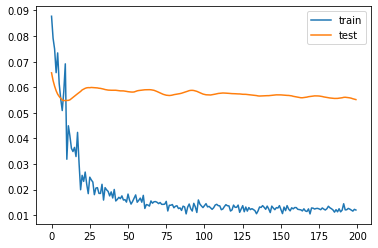

1.345250941812992
DaleStephens
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 79 samples, validate on 20 samples
Epoch 1/200
79/79 [==============================] - 0s 6ms/step - loss: 0.1323 - mse: 0.1323 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 2/200
79/79 [==============================] - 0s 114us/step - loss: 0.1175 - mse: 0.1175 - val_loss: 0.0632 - val_mse: 0.0632
Epoch 3/200
79/79 [==============================] - 0s 114us/step - loss: 0.1315 - mse: 0.1315 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 4/200
79/79 [==============================] - 0s 114us/step - loss: 0.0813 - mse: 0.0813 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 5/200
79/79 [==============================] - 0s 114us/step - loss: 0.0975 - mse: 0.0975 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 6/200
79/79 [==============================] - 0s 101us/step - loss: 0.0897 - mse: 0.0897 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 7/200
79/79 [==============================] - 0s 114us/step - loss: 0.0779 - mse: 0.0779 - val_loss: 0.0380 - val_mse: 0.0380
Epoch 8/200
79/79 [========

Epoch 62/200
79/79 [==============================] - 0s 101us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 63/200
79/79 [==============================] - 0s 101us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 64/200
79/79 [==============================] - 0s 101us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 65/200
79/79 [==============================] - 0s 114us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 66/200
79/79 [==============================] - 0s 89us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 67/200
79/79 [==============================] - 0s 101us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 68/200
79/79 [==============================] - 0s 101us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 69/200
79/79 [==============================] - 0s 89us/s

79/79 [==============================] - 0s 127us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 124/200
79/79 [==============================] - 0s 101us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 125/200
79/79 [==============================] - 0s 114us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0213 - val_mse: 0.0213
Epoch 126/200
79/79 [==============================] - 0s 101us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0213 - val_mse: 0.0213
Epoch 127/200
79/79 [==============================] - 0s 101us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0213 - val_mse: 0.0213
Epoch 128/200
79/79 [==============================] - 0s 114us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 129/200
79/79 [==============================] - 0s 152us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 130/200
79/79 [==============================] - 0s 114us/step 

Epoch 184/200
79/79 [==============================] - 0s 114us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 185/200
79/79 [==============================] - 0s 101us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 186/200
79/79 [==============================] - 0s 101us/step - loss: 0.0200 - mse: 0.0200 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 187/200
79/79 [==============================] - 0s 101us/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 188/200
79/79 [==============================] - 0s 114us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 189/200
79/79 [==============================] - 0s 89us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 190/200
79/79 [==============================] - 0s 127us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 191/200
79/79 [==============================] - 0

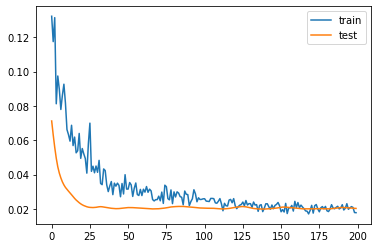

2.054629296064377
PascalGroß
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.2309 - mse: 0.2309 - val_loss: 0.1603 - val_mse: 0.1603
Epoch 2/200
80/80 [==============================] - 0s 100us/step - loss: 0.1769 - mse: 0.1769 - val_loss: 0.1328 - val_mse: 0.1328
Epoch 3/200
80/80 [==============================] - 0s 113us/step - loss: 0.1892 - mse: 0.1892 - val_loss: 0.1088 - val_mse: 0.1088
Epoch 4/200
80/80 [==============================] - 0s 100us/step - loss: 0.1117 - mse: 0.1117 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 5/200
80/80 [==============================] - 0s 112us/step - loss: 0.1203 - mse: 0.1203 - val_loss: 0.0732 - val_mse: 0.0732
Epoch 6/200
80/80 [==============================] - 0s 100us/step - loss: 0.1037 - mse: 0.1037 - val_loss: 0.0606 - val_mse: 0.0606
Epoch 7/200
80/80 [==============================] - 0s 88us/step - loss: 0.0837 - mse: 0.0837 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 8/200
80/80 [=========

Epoch 62/200
80/80 [==============================] - 0s 100us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 63/200
80/80 [==============================] - 0s 100us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 64/200
80/80 [==============================] - 0s 100us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 65/200
80/80 [==============================] - 0s 87us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0309 - val_mse: 0.0309
Epoch 66/200
80/80 [==============================] - 0s 87us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 67/200
80/80 [==============================] - 0s 87us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 68/200
80/80 [==============================] - 0s 87us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 69/200
80/80 [==============================] - 0s 100us/ste

Epoch 184/200
80/80 [==============================] - 0s 112us/step - loss: 0.0282 - mse: 0.0282 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 185/200
80/80 [==============================] - 0s 87us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 187/200
80/80 [==============================] - 0s 100us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 189/200
80/80 [==============================] - 0s 125us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 191/200
80/80 [==============================] - 0

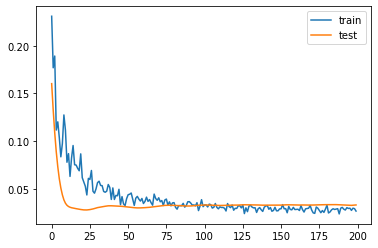

3.733903661370278
ShaneDuffy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.1319 - mse: 0.1319 - val_loss: 0.0714 - val_mse: 0.0714
Epoch 2/200
80/80 [==============================] - 0s 100us/step - loss: 0.1141 - mse: 0.1141 - val_loss: 0.0634 - val_mse: 0.0634
Epoch 3/200
80/80 [==============================] - 0s 100us/step - loss: 0.1169 - mse: 0.1169 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 4/200
80/80 [==============================] - 0s 100us/step - loss: 0.1089 - mse: 0.1089 - val_loss: 0.0491 - val_mse: 0.0491
Epoch 5/200
80/80 [==============================] - 0s 112us/step - loss: 0.0972 - mse: 0.0972 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 6/200
80/80 [==============================] - 0s 100us/step - loss: 0.0996 - mse: 0.0996 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 7/200
80/80 [==============================] - 0s 112us/step - loss: 0.0969 - mse: 0.0969 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 87us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 63/200
80/80 [==============================] - 0s 100us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 64/200
80/80 [==============================] - 0s 100us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 65/200
80/80 [==============================] - 0s 100us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 66/200
80/80 [==============================] - 0s 87us/step - loss: 0.0565 - mse: 0.0565 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 67/200
80/80 [==============================] - 0s 100us/step - loss: 0.0574 - mse: 0.0574 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 68/200
80/80 [==============================] - 0s 100us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 69/200
80/80 [==============================] - 0s 100us/s

Epoch 124/200
80/80 [==============================] - 0s 87us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 125/200
80/80 [==============================] - 0s 87us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 126/200
80/80 [==============================] - 0s 100us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 127/200
80/80 [==============================] - 0s 112us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 128/200
80/80 [==============================] - 0s 87us/step - loss: 0.0511 - mse: 0.0511 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 129/200
80/80 [==============================] - 0s 87us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 130/200
80/80 [==============================] - 0s 87us/step - loss: 0.0507 - mse: 0.0507 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 131/200
80/80 [==============================] - 0s 87

Epoch 185/200
80/80 [==============================] - 0s 87us/step - loss: 0.0511 - mse: 0.0511 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 186/200
80/80 [==============================] - 0s 88us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 187/200
80/80 [==============================] - 0s 100us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 189/200
80/80 [==============================] - 0s 100us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 190/200
80/80 [==============================] - 0s 100us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 191/200
80/80 [==============================] - 0s 100us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 192/200
80/80 [==============================] - 0s

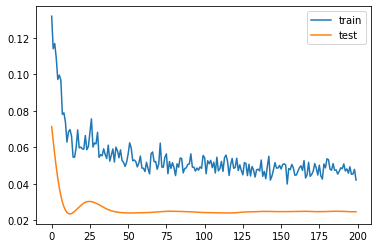

2.4485781192779545
DavyPröpper
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 5ms/step - loss: 0.1493 - mse: 0.1493 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 2/200
80/80 [==============================] - 0s 100us/step - loss: 0.1391 - mse: 0.1391 - val_loss: 0.0393 - val_mse: 0.0393
Epoch 3/200
80/80 [==============================] - 0s 112us/step - loss: 0.1383 - mse: 0.1383 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 4/200
80/80 [==============================] - 0s 87us/step - loss: 0.1245 - mse: 0.1245 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 5/200
80/80 [==============================] - 0s 100us/step - loss: 0.0865 - mse: 0.0865 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 6/200
80/80 [==============================] - 0s 100us/step - loss: 0.0979 - mse: 0.0979 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 7/200
80/80 [==============================] - 0s 100us/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 8/200
80/80 [=========

Epoch 63/200
80/80 [==============================] - 0s 87us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 64/200
80/80 [==============================] - 0s 87us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 65/200
80/80 [==============================] - 0s 87us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 66/200
80/80 [==============================] - 0s 87us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 67/200
80/80 [==============================] - 0s 87us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 68/200
80/80 [==============================] - 0s 100us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 69/200
80/80 [==============================] - 0s 87us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 70/200
80/80 [==============================] - 0s 87us/step -

Epoch 125/200
80/80 [==============================] - 0s 87us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0213 - val_mse: 0.0213
Epoch 126/200
80/80 [==============================] - 0s 100us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 127/200
80/80 [==============================] - 0s 100us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 128/200
80/80 [==============================] - 0s 100us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 129/200
80/80 [==============================] - 0s 87us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 130/200
80/80 [==============================] - 0s 87us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 131/200
80/80 [==============================] - 0s 87us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 132/200
80/80 [==============================] - 0s 8

Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 189/200
80/80 [==============================] - 0s 162us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 190/200
80/80 [==============================] - 0s 125us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 191/200
80/80 [==============================] - 0s 100us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 192/200
80/80 [==============================] - 0s 87us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 193/200
80/80 [==============================] - 0

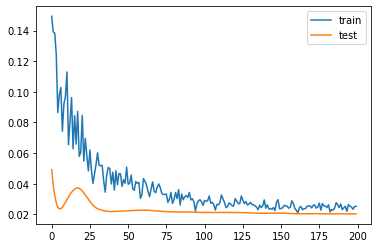

2.042857050895691
AaronMooy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 81 samples, validate on 21 samples
Epoch 1/200
81/81 [==============================] - 0s 5ms/step - loss: 0.1112 - mse: 0.1112 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 2/200
81/81 [==============================] - 0s 111us/step - loss: 0.0779 - mse: 0.0779 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 3/200
81/81 [==============================] - 0s 86us/step - loss: 0.0689 - mse: 0.0689 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 4/200
81/81 [==============================] - 0s 111us/step - loss: 0.0930 - mse: 0.0930 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 5/200
81/81 [==============================] - 0s 111us/step - loss: 0.0642 - mse: 0.0642 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 6/200
81/81 [==============================] - 0s 99us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0395 - val_mse: 0.0395
Epoch 7/200
81/81 [==============================] - 0s 99us/step - loss: 0.0749 - mse: 0.0749 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 8/200
81/81 [===========

Epoch 63/200
81/81 [==============================] - 0s 99us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 64/200
81/81 [==============================] - 0s 99us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 65/200
81/81 [==============================] - 0s 99us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 66/200
81/81 [==============================] - 0s 86us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 67/200
81/81 [==============================] - 0s 86us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 68/200
81/81 [==============================] - 0s 99us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 69/200
81/81 [==============================] - 0s 86us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 70/200
81/81 [==============================] - 0s 99us/step - 

Epoch 125/200
81/81 [==============================] - 0s 86us/step - loss: 0.0238 - mse: 0.0238 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 126/200
81/81 [==============================] - 0s 99us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 127/200
81/81 [==============================] - 0s 111us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 128/200
81/81 [==============================] - 0s 86us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 129/200
81/81 [==============================] - 0s 111us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 130/200
81/81 [==============================] - 0s 99us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 131/200
81/81 [==============================] - 0s 99us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 132/200
81/81 [==============================] - 0s 11

Epoch 187/200
81/81 [==============================] - 0s 99us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 188/200
81/81 [==============================] - 0s 86us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 189/200
81/81 [==============================] - 0s 110us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 190/200
81/81 [==============================] - 0s 99us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 191/200
81/81 [==============================] - 0s 86us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 192/200
81/81 [==============================] - 0s 99us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 193/200
81/81 [==============================] - 0s 99us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 194/200
81/81 [==============================] - 0s 99u

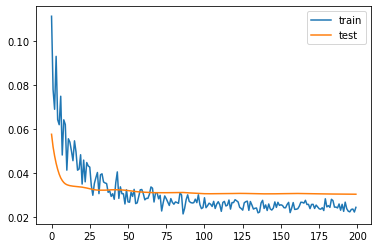

2.567057371139527
DanBurn
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 32 samples, validate on 9 samples
Epoch 1/200
32/32 [==============================] - 0s 15ms/step - loss: 0.3766 - mse: 0.3766 - val_loss: 0.0269 - val_mse: 0.0269
Epoch 2/200
32/32 [==============================] - 0s 250us/step - loss: 0.2735 - mse: 0.2735 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 3/200
32/32 [==============================] - 0s 250us/step - loss: 0.2930 - mse: 0.2930 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 4/200
32/32 [==============================] - 0s 219us/step - loss: 0.2949 - mse: 0.2949 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 5/200
32/32 [==============================] - 0s 312us/step - loss: 0.2077 - mse: 0.2077 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 6/200
32/32 [==============================] - 0s 219us/step - loss: 0.1950 - mse: 0.1950 - val_loss: 6.4328e-04 - val_mse: 6.4328e-04
Epoch 7/200
32/32 [==============================] - 0s 250us/step - loss: 0.1707 - mse: 0.1707 - val_loss: 9.2650e-05 - val_mse: 9.2650e-05
Epoch 8/200

Epoch 62/200
32/32 [==============================] - 0s 250us/step - loss: 0.0654 - mse: 0.0654 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 63/200
32/32 [==============================] - 0s 219us/step - loss: 0.0945 - mse: 0.0945 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 64/200
32/32 [==============================] - 0s 219us/step - loss: 0.0775 - mse: 0.0775 - val_loss: 0.0287 - val_mse: 0.0287
Epoch 65/200
32/32 [==============================] - 0s 250us/step - loss: 0.0809 - mse: 0.0809 - val_loss: 0.0297 - val_mse: 0.0297
Epoch 66/200
32/32 [==============================] - 0s 219us/step - loss: 0.0778 - mse: 0.0778 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 67/200
32/32 [==============================] - 0s 250us/step - loss: 0.0750 - mse: 0.0750 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 68/200
32/32 [==============================] - 0s 219us/step - loss: 0.0790 - mse: 0.0790 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 69/200
32/32 [==============================] - 0s 219us

Epoch 123/200
32/32 [==============================] - 0s 250us/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 124/200
32/32 [==============================] - 0s 250us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 125/200
32/32 [==============================] - 0s 250us/step - loss: 0.0618 - mse: 0.0618 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 126/200
32/32 [==============================] - 0s 250us/step - loss: 0.0712 - mse: 0.0712 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 127/200
32/32 [==============================] - 0s 250us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0251 - val_mse: 0.0251
Epoch 128/200
32/32 [==============================] - 0s 250us/step - loss: 0.0704 - mse: 0.0704 - val_loss: 0.0254 - val_mse: 0.0254
Epoch 129/200
32/32 [==============================] - 0s 281us/step - loss: 0.0690 - mse: 0.0690 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 130/200
32/32 [==============================] - 

Epoch 184/200
32/32 [==============================] - 0s 219us/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.0285 - val_mse: 0.0285
Epoch 185/200
32/32 [==============================] - 0s 250us/step - loss: 0.0725 - mse: 0.0725 - val_loss: 0.0283 - val_mse: 0.0283
Epoch 186/200
32/32 [==============================] - 0s 219us/step - loss: 0.0630 - mse: 0.0630 - val_loss: 0.0277 - val_mse: 0.0277
Epoch 187/200
32/32 [==============================] - 0s 219us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 188/200
32/32 [==============================] - 0s 187us/step - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 189/200
32/32 [==============================] - 0s 219us/step - loss: 0.0679 - mse: 0.0679 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 190/200
32/32 [==============================] - 0s 250us/step - loss: 0.0672 - mse: 0.0672 - val_loss: 0.0257 - val_mse: 0.0257
Epoch 191/200
32/32 [==============================] - 

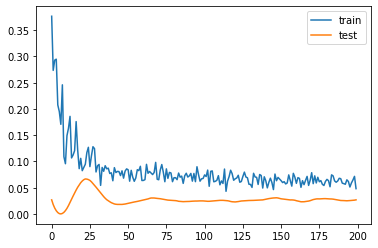

1.0187491849064827
LewisDunk
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 81 samples, validate on 21 samples
Epoch 1/200
81/81 [==============================] - 0s 6ms/step - loss: 0.3506 - mse: 0.3506 - val_loss: 0.1848 - val_mse: 0.1848
Epoch 2/200
81/81 [==============================] - 0s 100us/step - loss: 0.3221 - mse: 0.3221 - val_loss: 0.1461 - val_mse: 0.1461
Epoch 3/200
81/81 [==============================] - 0s 111us/step - loss: 0.2211 - mse: 0.2211 - val_loss: 0.1164 - val_mse: 0.1164
Epoch 4/200
81/81 [==============================] - 0s 99us/step - loss: 0.3099 - mse: 0.3099 - val_loss: 0.0920 - val_mse: 0.0920
Epoch 5/200
81/81 [==============================] - 0s 99us/step - loss: 0.2871 - mse: 0.2871 - val_loss: 0.0729 - val_mse: 0.0729
Epoch 6/200
81/81 [==============================] - 0s 111us/step - loss: 0.2470 - mse: 0.2470 - val_loss: 0.0602 - val_mse: 0.0602
Epoch 7/200
81/81 [==============================] - 0s 99us/step - loss: 0.1715 - mse: 0.1715 - val_loss: 0.0526 - val_mse: 0.0526
Epoch 8/200
81/81 [===========

Epoch 63/200
81/81 [==============================] - 0s 86us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 64/200
81/81 [==============================] - 0s 86us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 65/200
81/81 [==============================] - 0s 86us/step - loss: 0.0674 - mse: 0.0674 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 66/200
81/81 [==============================] - 0s 86us/step - loss: 0.0696 - mse: 0.0696 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 67/200
81/81 [==============================] - 0s 86us/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 68/200
81/81 [==============================] - 0s 99us/step - loss: 0.0705 - mse: 0.0705 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 69/200
81/81 [==============================] - 0s 86us/step - loss: 0.0716 - mse: 0.0716 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 70/200
81/81 [==============================] - 0s 111us/step -

Epoch 125/200
81/81 [==============================] - 0s 99us/step - loss: 0.0615 - mse: 0.0615 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 126/200
81/81 [==============================] - 0s 99us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 127/200
81/81 [==============================] - 0s 99us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 128/200
81/81 [==============================] - 0s 123us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 129/200
81/81 [==============================] - 0s 86us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 130/200
81/81 [==============================] - 0s 99us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 131/200
81/81 [==============================] - 0s 86us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 132/200
81/81 [==============================] - 0s 99u

Epoch 186/200
81/81 [==============================] - 0s 99us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 187/200
81/81 [==============================] - 0s 99us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 188/200
81/81 [==============================] - 0s 99us/step - loss: 0.0427 - mse: 0.0427 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 189/200
81/81 [==============================] - 0s 123us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 190/200
81/81 [==============================] - 0s 99us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 191/200
81/81 [==============================] - 0s 99us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 192/200
81/81 [==============================] - 0s 111us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 193/200
81/81 [==============================] - 0s 99

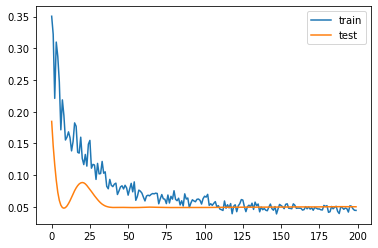

2.4851026535034175
MartínMontoya
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 10ms/step - loss: 0.1669 - mse: 0.1669 - val_loss: 0.1306 - val_mse: 0.1306
Epoch 2/200
51/51 [==============================] - 0s 161us/step - loss: 0.1375 - mse: 0.1375 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 3/200
51/51 [==============================] - 0s 157us/step - loss: 0.0982 - mse: 0.0982 - val_loss: 0.1048 - val_mse: 0.1048
Epoch 4/200
51/51 [==============================] - 0s 137us/step - loss: 0.1461 - mse: 0.1461 - val_loss: 0.0937 - val_mse: 0.0937
Epoch 5/200
51/51 [==============================] - 0s 157us/step - loss: 0.0962 - mse: 0.0962 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 6/200
51/51 [==============================] - 0s 157us/step - loss: 0.0958 - mse: 0.0958 - val_loss: 0.0748 - val_mse: 0.0748
Epoch 7/200
51/51 [==============================] - 0s 157us/step - loss: 0.0881 - mse: 0.0881 - val_loss: 0.0666 - val_mse: 0.0666
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 137us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 63/200
51/51 [==============================] - 0s 157us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 64/200
51/51 [==============================] - 0s 118us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 65/200
51/51 [==============================] - 0s 137us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 66/200
51/51 [==============================] - 0s 118us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 67/200
51/51 [==============================] - 0s 137us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 68/200
51/51 [==============================] - 0s 137us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 69/200
51/51 [==============================] - 0s 118us

Epoch 123/200
51/51 [==============================] - 0s 157us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 124/200
51/51 [==============================] - 0s 137us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 125/200
51/51 [==============================] - 0s 137us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 126/200
51/51 [==============================] - 0s 137us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 127/200
51/51 [==============================] - 0s 118us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 128/200
51/51 [==============================] - 0s 118us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 129/200
51/51 [==============================] - 0s 137us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 118us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 185/200
51/51 [==============================] - 0s 137us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 186/200
51/51 [==============================] - 0s 137us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 187/200
51/51 [==============================] - 0s 137us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 188/200
51/51 [==============================] - 0s 137us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 189/200
51/51 [==============================] - 0s 118us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 190/200
51/51 [==============================] - 0s 137us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 191/200
51/51 [==============================] - 

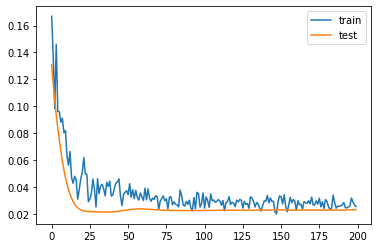

1.3734728991985319
SolomonMarch
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 82 samples, validate on 21 samples
Epoch 1/200
82/82 [==============================] - 0s 5ms/step - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0289 - val_mse: 0.0289
Epoch 2/200
82/82 [==============================] - 0s 122us/step - loss: 0.0577 - mse: 0.0577 - val_loss: 0.0286 - val_mse: 0.0286
Epoch 3/200
82/82 [==============================] - 0s 95us/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 4/200
82/82 [==============================] - 0s 108us/step - loss: 0.0515 - mse: 0.0515 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 5/200
82/82 [==============================] - 0s 116us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 6/200
82/82 [==============================] - 0s 97us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 7/200
82/82 [==============================] - 0s 122us/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 8/200
82/82 [==========

Epoch 63/200
82/82 [==============================] - 0s 110us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0257 - val_mse: 0.0257
Epoch 64/200
82/82 [==============================] - 0s 97us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 65/200
82/82 [==============================] - 0s 73us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 66/200
82/82 [==============================] - 0s 98us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 67/200
82/82 [==============================] - 0s 98us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 68/200
82/82 [==============================] - 0s 110us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 69/200
82/82 [==============================] - 0s 110us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 70/200
82/82 [==============================] - 0s 85us/step

Epoch 125/200
82/82 [==============================] - 0s 97us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 126/200
82/82 [==============================] - 0s 98us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 127/200
82/82 [==============================] - 0s 97us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 128/200
82/82 [==============================] - 0s 98us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 129/200
82/82 [==============================] - 0s 85us/step - loss: 0.0238 - mse: 0.0238 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 130/200
82/82 [==============================] - 0s 97us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 131/200
82/82 [==============================] - 0s 98us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 132/200
82/82 [==============================] - 0s 97us

Epoch 187/200
82/82 [==============================] - 0s 85us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 188/200
82/82 [==============================] - 0s 85us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 189/200
82/82 [==============================] - 0s 85us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 190/200
82/82 [==============================] - 0s 85us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 191/200
82/82 [==============================] - 0s 85us/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 192/200
82/82 [==============================] - 0s 85us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 193/200
82/82 [==============================] - 0s 85us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 194/200
82/82 [==============================] - 0s 98us

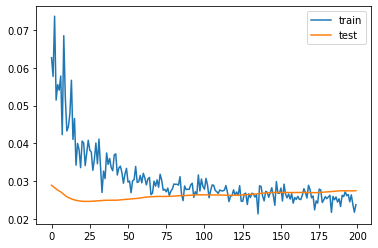

1.6447320729494095
AdamWebster
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 27ms/step - loss: 0.2247 - mse: 0.2247 - val_loss: 0.1012 - val_mse: 0.1012
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.2038 - mse: 0.2038 - val_loss: 0.0996 - val_mse: 0.0996
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.2802 - mse: 0.2802 - val_loss: 0.0981 - val_mse: 0.0981
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1975 - mse: 0.1975 - val_loss: 0.0970 - val_mse: 0.0970
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1946 - mse: 0.1946 - val_loss: 0.0967 - val_mse: 0.0967
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.2974 - mse: 0.2974 - val_loss: 0.0960 - val_mse: 0.0960
Epoch 7/200
21/21 [==============================] - 0s 476us/step - loss: 0.1437 - mse: 0.1437 - val_loss: 0.0952 - val_mse: 0.0952
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0579 - val_mse: 0.0579
Epoch 63/200
21/21 [==============================] - 0s 359us/step - loss: 0.1025 - mse: 0.1025 - val_loss: 0.0578 - val_mse: 0.0578
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.0958 - mse: 0.0958 - val_loss: 0.0577 - val_mse: 0.0577
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0539 - mse: 0.0539 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 286us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0608 - mse: 0.0608 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 125/200
21/21 [==============================] - 0s 286us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0520 - val_mse: 0.0520
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0520 - val_mse: 0.0520
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 129/200
21/21 [==============================] - 0s 428us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0489 - val_mse: 0.0489
Epoch 186/200
21/21 [==============================] - 0s 286us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 188/200
21/21 [==============================] - 0s 286us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0709 - mse: 0.0709 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 191/200
21/21 [==============================] - 

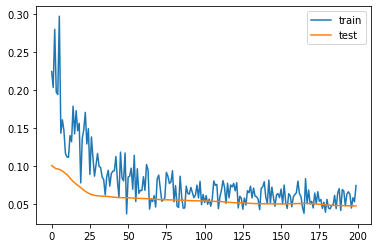

1.7669721841812134
NealMaupay
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 26ms/step - loss: 0.4083 - mse: 0.4083 - val_loss: 0.1588 - val_mse: 0.1588
Epoch 2/200
21/21 [==============================] - 0s 380us/step - loss: 0.2776 - mse: 0.2776 - val_loss: 0.1409 - val_mse: 0.1409
Epoch 3/200
21/21 [==============================] - 0s 381us/step - loss: 0.3083 - mse: 0.3083 - val_loss: 0.1274 - val_mse: 0.1274
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1880 - mse: 0.1880 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.2227 - mse: 0.2227 - val_loss: 0.1085 - val_mse: 0.1085
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.2840 - mse: 0.2840 - val_loss: 0.1022 - val_mse: 0.1022
Epoch 7/200
21/21 [==============================] - 0s 333us/step - loss: 0.2548 - mse: 0.2548 - val_loss: 0.0972 - val_mse: 0.0972
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.1484 - mse: 0.1484 - val_loss: 0.1002 - val_mse: 0.1002
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.1318 - mse: 0.1318 - val_loss: 0.0999 - val_mse: 0.0999
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.1450 - mse: 0.1450 - val_loss: 0.0996 - val_mse: 0.0996
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.0992 - val_mse: 0.0992
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.1323 - mse: 0.1323 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.1062 - mse: 0.1062 - val_loss: 0.0986 - val_mse: 0.0986
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.1194 - mse: 0.1194 - val_loss: 0.0984 - val_mse: 0.0984
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.1327 - mse: 0.1327 - val_loss: 0.0954 - val_mse: 0.0954
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0837 - mse: 0.0837 - val_loss: 0.0953 - val_mse: 0.0953
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0875 - mse: 0.0875 - val_loss: 0.0953 - val_mse: 0.0953
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.1140 - mse: 0.1140 - val_loss: 0.0952 - val_mse: 0.0952
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0986 - mse: 0.0986 - val_loss: 0.0950 - val_mse: 0.0950
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0806 - mse: 0.0806 - val_loss: 0.0949 - val_mse: 0.0949
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.1120 - mse: 0.1120 - val_loss: 0.0948 - val_mse: 0.0948
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.1109 - mse: 0.1109 - val_loss: 0.0923 - val_mse: 0.0923
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.1053 - mse: 0.1053 - val_loss: 0.0921 - val_mse: 0.0921
Epoch 186/200
21/21 [==============================] - 0s 428us/step - loss: 0.0962 - mse: 0.0962 - val_loss: 0.0919 - val_mse: 0.0919
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0823 - mse: 0.0823 - val_loss: 0.0917 - val_mse: 0.0917
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.1054 - mse: 0.1054 - val_loss: 0.0915 - val_mse: 0.0915
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.1048 - mse: 0.1048 - val_loss: 0.0914 - val_mse: 0.0914
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.1031 - mse: 0.1031 - val_loss: 0.0913 - val_mse: 0.0913
Epoch 191/200
21/21 [==============================] - 

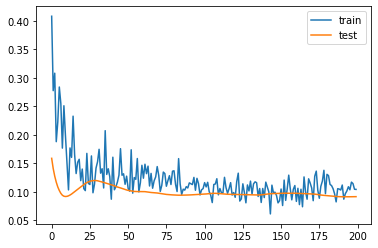

3.4806843996047974
LeandroTrossard
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 32ms/step - loss: 0.1869 - mse: 0.1869 - val_loss: 0.1713 - val_mse: 0.1713
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1357 - mse: 0.1357 - val_loss: 0.1702 - val_mse: 0.1702
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.0865 - mse: 0.0865 - val_loss: 0.1685 - val_mse: 0.1685
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1322 - mse: 0.1322 - val_loss: 0.1675 - val_mse: 0.1675
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.1534 - mse: 0.1534 - val_loss: 0.1662 - val_mse: 0.1662
Epoch 6/200
21/21 [==============================] - 0s 333us/step - loss: 0.1156 - mse: 0.1156 - val_loss: 0.1647 - val_mse: 0.1647
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.1947 - mse: 0.1947 - val_loss: 0.1633 - val_mse: 0.1633
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.1299 - val_mse: 0.1299
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.1293 - val_mse: 0.1293
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0579 - mse: 0.0579 - val_loss: 0.1285 - val_mse: 0.1285
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0788 - mse: 0.0788 - val_loss: 0.1277 - val_mse: 0.1277
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0393 - mse: 0.0393 - val_loss: 0.1269 - val_mse: 0.1269
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.1260 - val_mse: 0.1260
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.1253 - val_mse: 0.1253
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.1140 - val_mse: 0.1140
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 126/200
21/21 [==============================] - 0s 286us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.1135 - val_mse: 0.1135
Epoch 128/200
21/21 [==============================] - 0s 428us/step - loss: 0.0636 - mse: 0.0636 - val_loss: 0.1129 - val_mse: 0.1129
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.1125 - val_mse: 0.1125
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.1186 - val_mse: 0.1186
Epoch 185/200
21/21 [==============================] - 0s 286us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 186/200
21/21 [==============================] - 0s 428us/step - loss: 0.0282 - mse: 0.0282 - val_loss: 0.1195 - val_mse: 0.1195
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.1197 - val_mse: 0.1197
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.1200 - val_mse: 0.1200
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.1200 - val_mse: 0.1200
Epoch 191/200
21/21 [==============================] - 

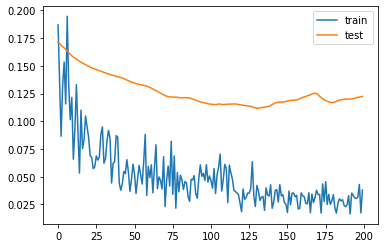

2.102785661816597
MathewRyan
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 1s 9ms/step - loss: 0.2742 - mse: 0.2742 - val_loss: 0.2200 - val_mse: 0.2200
Epoch 2/200
80/80 [==============================] - 0s 125us/step - loss: 0.1858 - mse: 0.1858 - val_loss: 0.1952 - val_mse: 0.1952
Epoch 3/200
80/80 [==============================] - 0s 100us/step - loss: 0.1780 - mse: 0.1780 - val_loss: 0.1738 - val_mse: 0.1738
Epoch 4/200
80/80 [==============================] - 0s 125us/step - loss: 0.2384 - mse: 0.2384 - val_loss: 0.1572 - val_mse: 0.1572
Epoch 5/200
80/80 [==============================] - 0s 112us/step - loss: 0.1680 - mse: 0.1680 - val_loss: 0.1419 - val_mse: 0.1419
Epoch 6/200
80/80 [==============================] - 0s 112us/step - loss: 0.1554 - mse: 0.1554 - val_loss: 0.1295 - val_mse: 0.1295
Epoch 7/200
80/80 [==============================] - 0s 100us/step - loss: 0.1457 - mse: 0.1457 - val_loss: 0.1193 - val_mse: 0.1193
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 100us/step - loss: 0.0709 - mse: 0.0709 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 63/200
80/80 [==============================] - 0s 112us/step - loss: 0.0743 - mse: 0.0743 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 64/200
80/80 [==============================] - 0s 112us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 65/200
80/80 [==============================] - 0s 100us/step - loss: 0.0655 - mse: 0.0655 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 66/200
80/80 [==============================] - 0s 112us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 67/200
80/80 [==============================] - 0s 100us/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0830 - val_mse: 0.0830
Epoch 68/200
80/80 [==============================] - 0s 87us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 69/200
80/80 [==============================] - 0s 112us/

Epoch 124/200
80/80 [==============================] - 0s 100us/step - loss: 0.0591 - mse: 0.0591 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 125/200
80/80 [==============================] - 0s 87us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0817 - val_mse: 0.0817
Epoch 126/200
80/80 [==============================] - 0s 112us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0818 - val_mse: 0.0818
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0635 - mse: 0.0635 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 128/200
80/80 [==============================] - 0s 100us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0822 - val_mse: 0.0822
Epoch 129/200
80/80 [==============================] - 0s 112us/step - loss: 0.0613 - mse: 0.0613 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 130/200
80/80 [==============================] - 0s 137us/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 131/200
80/80 [==============================] - 0

Epoch 185/200
80/80 [==============================] - 0s 87us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 186/200
80/80 [==============================] - 0s 125us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 187/200
80/80 [==============================] - 0s 125us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0581 - mse: 0.0581 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 191/200
80/80 [==============================] - 0s 100us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 192/200
80/80 [==============================] - 0

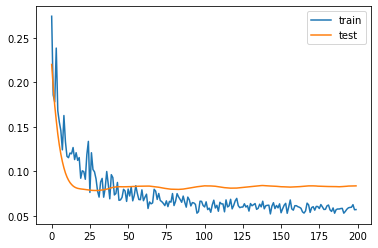

3.012986570596695
AlirezaJahanbakhsh
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 1s 16ms/step - loss: 0.1970 - mse: 0.1970 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.2343 - mse: 0.2343 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.1196 - mse: 0.1196 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 4/200
50/50 [==============================] - 0s 180us/step - loss: 0.1164 - mse: 0.1164 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.1707 - mse: 0.1707 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.1801 - mse: 0.1801 - val_loss: 0.0302 - val_mse: 0.0302
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1931 - mse: 0.1931 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 200us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 63/200
50/50 [==============================] - 0s 180us/step - loss: 0.0632 - mse: 0.0632 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 64/200
50/50 [==============================] - 0s 200us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 65/200
50/50 [==============================] - 0s 220us/step - loss: 0.0670 - mse: 0.0670 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 66/200
50/50 [==============================] - 0s 240us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 67/200
50/50 [==============================] - 0s 240us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 68/200
50/50 [==============================] - 0s 220us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 69/200
50/50 [==============================] - 0s 180us

Epoch 123/200
50/50 [==============================] - 0s 200us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 124/200
50/50 [==============================] - 0s 220us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 125/200
50/50 [==============================] - 0s 200us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 128/200
50/50 [==============================] - 0s 200us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 129/200
50/50 [==============================] - 0s 180us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 140us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 185/200
50/50 [==============================] - 0s 160us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 186/200
50/50 [==============================] - 0s 140us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 187/200
50/50 [==============================] - 0s 160us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 188/200
50/50 [==============================] - 0s 160us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 189/200
50/50 [==============================] - 0s 140us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 190/200
50/50 [==============================] - 0s 140us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 191/200
50/50 [==============================] - 

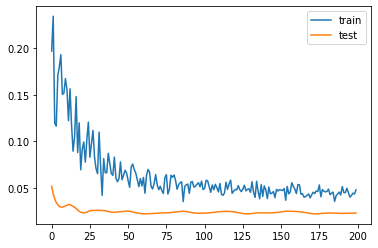

1.291355013847351
BernardoFernandes da Silva Junior
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 49 samples, validate on 13 samples
Epoch 1/200
49/49 [==============================] - 1s 12ms/step - loss: 0.0756 - mse: 0.0756 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 2/200
49/49 [==============================] - 0s 175us/step - loss: 0.0663 - mse: 0.0663 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 3/200
49/49 [==============================] - 0s 143us/step - loss: 0.0895 - mse: 0.0895 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 4/200
49/49 [==============================] - 0s 184us/step - loss: 0.1127 - mse: 0.1127 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 5/200
49/49 [==============================] - 0s 184us/step - loss: 0.1272 - mse: 0.1272 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 6/200
49/49 [==============================] - 0s 163us/step - loss: 0.0997 - mse: 0.0997 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 7/200
49/49 [==============================] - 0s 143us/step - loss: 0.1155 - mse: 0.1155 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 8/200
49/49 [=======

Epoch 62/200
49/49 [==============================] - 0s 143us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0257 - val_mse: 0.0257
Epoch 63/200
49/49 [==============================] - 0s 163us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 64/200
49/49 [==============================] - 0s 163us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 65/200
49/49 [==============================] - 0s 143us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0261 - val_mse: 0.0261
Epoch 66/200
49/49 [==============================] - 0s 163us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0262 - val_mse: 0.0262
Epoch 67/200
49/49 [==============================] - 0s 163us/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 68/200
49/49 [==============================] - 0s 163us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 69/200
49/49 [==============================] - 0s 184us

Epoch 123/200
49/49 [==============================] - 0s 163us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0269 - val_mse: 0.0269
Epoch 124/200
49/49 [==============================] - 0s 163us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 125/200
49/49 [==============================] - 0s 184us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 126/200
49/49 [==============================] - 0s 163us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 127/200
49/49 [==============================] - 0s 143us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 128/200
49/49 [==============================] - 0s 163us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 129/200
49/49 [==============================] - 0s 143us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0277 - val_mse: 0.0277
Epoch 130/200
49/49 [==============================] - 

Epoch 184/200
49/49 [==============================] - 0s 163us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 185/200
49/49 [==============================] - 0s 184us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 186/200
49/49 [==============================] - 0s 184us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 187/200
49/49 [==============================] - 0s 163us/step - loss: 0.0302 - mse: 0.0302 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 188/200
49/49 [==============================] - 0s 163us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 189/200
49/49 [==============================] - 0s 163us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0275 - val_mse: 0.0275
Epoch 190/200
49/49 [==============================] - 0s 163us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0275 - val_mse: 0.0275
Epoch 191/200
49/49 [==============================] - 

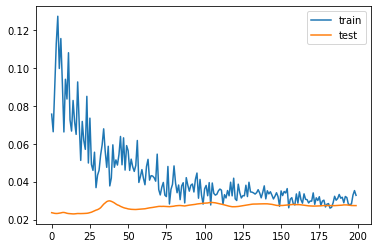

1.1453271955251696
YvesBissouma
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 11ms/step - loss: 0.2260 - mse: 0.2260 - val_loss: 0.1373 - val_mse: 0.1373
Epoch 2/200
51/51 [==============================] - 0s 157us/step - loss: 0.2767 - mse: 0.2767 - val_loss: 0.1129 - val_mse: 0.1129
Epoch 3/200
51/51 [==============================] - 0s 176us/step - loss: 0.2517 - mse: 0.2517 - val_loss: 0.0924 - val_mse: 0.0924
Epoch 4/200
51/51 [==============================] - 0s 176us/step - loss: 0.2055 - mse: 0.2055 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 5/200
51/51 [==============================] - 0s 137us/step - loss: 0.1430 - mse: 0.1430 - val_loss: 0.0628 - val_mse: 0.0628
Epoch 6/200
51/51 [==============================] - 0s 137us/step - loss: 0.1969 - mse: 0.1969 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 7/200
51/51 [==============================] - 0s 157us/step - loss: 0.1836 - mse: 0.1836 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 157us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 63/200
51/51 [==============================] - 0s 157us/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 64/200
51/51 [==============================] - 0s 157us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 65/200
51/51 [==============================] - 0s 176us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 66/200
51/51 [==============================] - 0s 137us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 67/200
51/51 [==============================] - 0s 157us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 68/200
51/51 [==============================] - 0s 157us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0283 - val_mse: 0.0283
Epoch 69/200
51/51 [==============================] - 0s 157us

Epoch 123/200
51/51 [==============================] - 0s 137us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 124/200
51/51 [==============================] - 0s 137us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0275 - val_mse: 0.0275
Epoch 125/200
51/51 [==============================] - 0s 196us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 126/200
51/51 [==============================] - 0s 157us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 127/200
51/51 [==============================] - 0s 157us/step - loss: 0.0295 - mse: 0.0295 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 128/200
51/51 [==============================] - 0s 157us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 129/200
51/51 [==============================] - 0s 157us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 137us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0283 - val_mse: 0.0283
Epoch 185/200
51/51 [==============================] - 0s 137us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 187/200
51/51 [==============================] - 0s 137us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 188/200
51/51 [==============================] - 0s 137us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 189/200
51/51 [==============================] - 0s 157us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 191/200
51/51 [==============================] - 

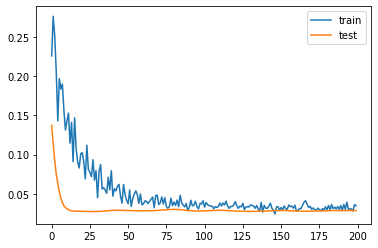

1.1203199923038483
TariqLamptey
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 6 samples, validate on 2 samples
Epoch 1/200
6/6 [==============================] - 0s 83ms/step - loss: 0.6431 - mse: 0.6431 - val_loss: 0.8301 - val_mse: 0.8301
Epoch 2/200
6/6 [==============================] - 0s 1ms/step - loss: 0.3739 - mse: 0.3739 - val_loss: 0.7626 - val_mse: 0.7626
Epoch 3/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1897 - mse: 0.1897 - val_loss: 0.6943 - val_mse: 0.6943
Epoch 4/200
6/6 [==============================] - 0s 1ms/step - loss: 0.4980 - mse: 0.4980 - val_loss: 0.6258 - val_mse: 0.6258
Epoch 5/200
6/6 [==============================] - 0s 1ms/step - loss: 0.2650 - mse: 0.2650 - val_loss: 0.5595 - val_mse: 0.5595
Epoch 6/200
6/6 [==============================] - 0s 1ms/step - loss: 0.3985 - mse: 0.3985 - val_loss: 0.5020 - val_mse: 0.5020
Epoch 7/200
6/6 [==============================] - 0s 1ms/step - loss: 0.7524 - mse: 0.7524 - val_loss: 0.4482 - val_mse: 0.4482
Epoch 8/200
6/6 [==============================] - 0s 

Epoch 64/200
6/6 [==============================] - 0s 999us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.2134 - val_mse: 0.2134
Epoch 65/200
6/6 [==============================] - 0s 999us/step - loss: 0.0992 - mse: 0.0992 - val_loss: 0.2167 - val_mse: 0.2167
Epoch 66/200
6/6 [==============================] - 0s 1ms/step - loss: 0.2128 - mse: 0.2128 - val_loss: 0.2192 - val_mse: 0.2192
Epoch 67/200
6/6 [==============================] - 0s 1000us/step - loss: 0.1021 - mse: 0.1021 - val_loss: 0.2223 - val_mse: 0.2223
Epoch 68/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1370 - mse: 0.1370 - val_loss: 0.2266 - val_mse: 0.2266
Epoch 69/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1631 - mse: 0.1631 - val_loss: 0.2316 - val_mse: 0.2316
Epoch 70/200
6/6 [==============================] - 0s 1ms/step - loss: 0.2964 - mse: 0.2964 - val_loss: 0.2374 - val_mse: 0.2374
Epoch 71/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1590 - ms

Epoch 127/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1466 - mse: 0.1466 - val_loss: 0.4084 - val_mse: 0.4084
Epoch 128/200
6/6 [==============================] - 0s 1000us/step - loss: 0.0877 - mse: 0.0877 - val_loss: 0.4156 - val_mse: 0.4156
Epoch 129/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.4227 - val_mse: 0.4227
Epoch 130/200
6/6 [==============================] - 0s 999us/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.4311 - val_mse: 0.4311
Epoch 131/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1106 - mse: 0.1106 - val_loss: 0.4354 - val_mse: 0.4354
Epoch 132/200
6/6 [==============================] - 0s 999us/step - loss: 0.0929 - mse: 0.0929 - val_loss: 0.4402 - val_mse: 0.4402
Epoch 133/200
6/6 [==============================] - 0s 999us/step - loss: 0.2911 - mse: 0.2911 - val_loss: 0.4461 - val_mse: 0.4461
Epoch 134/200
6/6 [==============================] - 0s 999us/step - loss:

Epoch 189/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.4960 - val_mse: 0.4960
Epoch 190/200
6/6 [==============================] - 0s 999us/step - loss: 0.0501 - mse: 0.0501 - val_loss: 0.4922 - val_mse: 0.4922
Epoch 191/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.4899 - val_mse: 0.4899
Epoch 192/200
6/6 [==============================] - 0s 999us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.4861 - val_mse: 0.4861
Epoch 193/200
6/6 [==============================] - 0s 999us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.4818 - val_mse: 0.4818
Epoch 194/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.4780 - val_mse: 0.4780
Epoch 195/200
6/6 [==============================] - 0s 999us/step - loss: 0.1535 - mse: 0.1535 - val_loss: 0.4743 - val_mse: 0.4743
Epoch 196/200
6/6 [==============================] - 0s 999us/step - loss: 

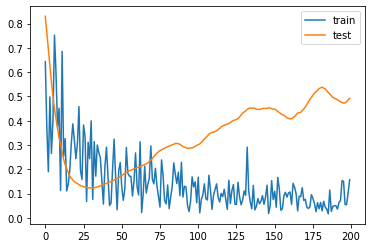

2.197676718235016
AaronConnolly
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 19 samples, validate on 5 samples
Epoch 1/200
19/19 [==============================] - 0s 24ms/step - loss: 0.1463 - mse: 0.1463 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 2/200
19/19 [==============================] - 0s 315us/step - loss: 0.0906 - mse: 0.0906 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 3/200
19/19 [==============================] - 0s 368us/step - loss: 0.1234 - mse: 0.1234 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 4/200
19/19 [==============================] - 0s 368us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 5/200
19/19 [==============================] - 0s 368us/step - loss: 0.0895 - mse: 0.0895 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 6/200
19/19 [==============================] - 0s 316us/step - loss: 0.0729 - mse: 0.0729 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 7/200
19/19 [==============================] - 0s 368us/step - loss: 0.1011 - mse: 0.1011 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 8/200
19/19 [========

Epoch 62/200
19/19 [==============================] - 0s 316us/step - loss: 0.0153 - mse: 0.0153 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 63/200
19/19 [==============================] - 0s 368us/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 64/200
19/19 [==============================] - 0s 368us/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 65/200
19/19 [==============================] - 0s 316us/step - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 66/200
19/19 [==============================] - 0s 316us/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 67/200
19/19 [==============================] - 0s 316us/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 68/200
19/19 [==============================] - 0s 421us/step - loss: 0.0146 - mse: 0.0146 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 69/200
19/19 [==============================] - 0s 316us

Epoch 123/200
19/19 [==============================] - 0s 316us/step - loss: 0.0067 - mse: 0.0067 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 124/200
19/19 [==============================] - 0s 368us/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 125/200
19/19 [==============================] - 0s 316us/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 126/200
19/19 [==============================] - 0s 316us/step - loss: 0.0125 - mse: 0.0125 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 127/200
19/19 [==============================] - 0s 368us/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 128/200
19/19 [==============================] - 0s 421us/step - loss: 0.0086 - mse: 0.0086 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 129/200
19/19 [==============================] - 0s 316us/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 130/200
19/19 [==============================] - 

Epoch 184/200
19/19 [==============================] - 0s 315us/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 185/200
19/19 [==============================] - 0s 316us/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 186/200
19/19 [==============================] - 0s 368us/step - loss: 0.0104 - mse: 0.0104 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 187/200
19/19 [==============================] - 0s 316us/step - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 188/200
19/19 [==============================] - 0s 368us/step - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 189/200
19/19 [==============================] - 0s 316us/step - loss: 0.0078 - mse: 0.0078 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 190/200
19/19 [==============================] - 0s 316us/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 191/200
19/19 [==============================] - 

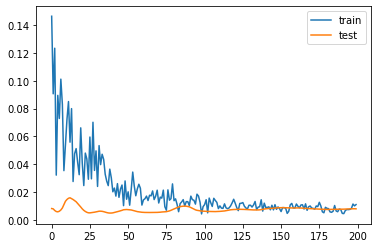

1.7064893543720245
StevenAlzate
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 18 samples, validate on 5 samples
Epoch 1/200
18/18 [==============================] - 0s 27ms/step - loss: 0.4321 - mse: 0.4321 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 2/200
18/18 [==============================] - 0s 444us/step - loss: 0.4350 - mse: 0.4350 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 3/200
18/18 [==============================] - 0s 333us/step - loss: 0.3800 - mse: 0.3800 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 4/200
18/18 [==============================] - 0s 500us/step - loss: 0.4157 - mse: 0.4157 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 5/200
18/18 [==============================] - 0s 444us/step - loss: 0.2184 - mse: 0.2184 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 6/200
18/18 [==============================] - 0s 444us/step - loss: 0.2382 - mse: 0.2382 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 7/200
18/18 [==============================] - 0s 389us/step - loss: 0.1267 - mse: 0.1267 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 8/200
18/18 [========

Epoch 62/200
18/18 [==============================] - 0s 389us/step - loss: 0.1477 - mse: 0.1477 - val_loss: 0.1253 - val_mse: 0.1253
Epoch 63/200
18/18 [==============================] - 0s 389us/step - loss: 0.1345 - mse: 0.1345 - val_loss: 0.1265 - val_mse: 0.1265
Epoch 64/200
18/18 [==============================] - 0s 389us/step - loss: 0.1705 - mse: 0.1705 - val_loss: 0.1273 - val_mse: 0.1273
Epoch 65/200
18/18 [==============================] - 0s 334us/step - loss: 0.1130 - mse: 0.1130 - val_loss: 0.1271 - val_mse: 0.1271
Epoch 66/200
18/18 [==============================] - 0s 389us/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.1268 - val_mse: 0.1268
Epoch 67/200
18/18 [==============================] - 0s 333us/step - loss: 0.1042 - mse: 0.1042 - val_loss: 0.1260 - val_mse: 0.1260
Epoch 68/200
18/18 [==============================] - 0s 444us/step - loss: 0.0924 - mse: 0.0924 - val_loss: 0.1254 - val_mse: 0.1254
Epoch 69/200
18/18 [==============================] - 0s 389us

Epoch 123/200
18/18 [==============================] - 0s 389us/step - loss: 0.0800 - mse: 0.0800 - val_loss: 0.1058 - val_mse: 0.1058
Epoch 124/200
18/18 [==============================] - 0s 389us/step - loss: 0.1131 - mse: 0.1131 - val_loss: 0.1052 - val_mse: 0.1052
Epoch 125/200
18/18 [==============================] - 0s 333us/step - loss: 0.1288 - mse: 0.1288 - val_loss: 0.1047 - val_mse: 0.1047
Epoch 126/200
18/18 [==============================] - 0s 333us/step - loss: 0.1026 - mse: 0.1026 - val_loss: 0.1044 - val_mse: 0.1044
Epoch 127/200
18/18 [==============================] - 0s 333us/step - loss: 0.0887 - mse: 0.0887 - val_loss: 0.1041 - val_mse: 0.1041
Epoch 128/200
18/18 [==============================] - 0s 389us/step - loss: 0.0950 - mse: 0.0950 - val_loss: 0.1029 - val_mse: 0.1029
Epoch 129/200
18/18 [==============================] - 0s 389us/step - loss: 0.0981 - mse: 0.0981 - val_loss: 0.1015 - val_mse: 0.1015
Epoch 130/200
18/18 [==============================] - 

Epoch 184/200
18/18 [==============================] - 0s 389us/step - loss: 0.0729 - mse: 0.0729 - val_loss: 0.0917 - val_mse: 0.0917
Epoch 185/200
18/18 [==============================] - 0s 444us/step - loss: 0.0873 - mse: 0.0873 - val_loss: 0.0930 - val_mse: 0.0930
Epoch 186/200
18/18 [==============================] - 0s 500us/step - loss: 0.0697 - mse: 0.0697 - val_loss: 0.0943 - val_mse: 0.0943
Epoch 187/200
18/18 [==============================] - 0s 389us/step - loss: 0.0951 - mse: 0.0951 - val_loss: 0.0954 - val_mse: 0.0954
Epoch 188/200
18/18 [==============================] - 0s 333us/step - loss: 0.0762 - mse: 0.0762 - val_loss: 0.0959 - val_mse: 0.0959
Epoch 189/200
18/18 [==============================] - 0s 389us/step - loss: 0.0834 - mse: 0.0834 - val_loss: 0.0966 - val_mse: 0.0966
Epoch 190/200
18/18 [==============================] - 0s 333us/step - loss: 0.0846 - mse: 0.0846 - val_loss: 0.0975 - val_mse: 0.0975
Epoch 191/200
18/18 [==============================] - 

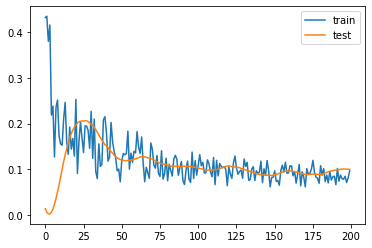

0.9394785761833191
AlexisMac Allister
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JamesTarkowski
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



PhilBardsley
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ErikPieters
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JackCork
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KevinLong
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JayRodriguez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AshleyBarnes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



BenMee
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AshleyWestwood
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Johann BergGudmundsson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ChrisWood
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MatthewLowton
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MatejVydra
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



RobbieBrady
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NickPope
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



CharlieTaylor
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JoshBrownhill
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DwightMcNeil
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



WillyCaballero
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 88 samples, validate on 22 samples
Epoch 1/200
88/88 [==============================] - 0s 6ms/step - loss: 0.1530 - mse: 0.1530 - val_loss: 0.2900 - val_mse: 0.2900
Epoch 2/200
88/88 [==============================] - 0s 102us/step - loss: 0.1305 - mse: 0.1305 - val_loss: 0.2659 - val_mse: 0.2659
Epoch 3/200
88/88 [==============================] - 0s 102us/step - loss: 0.1415 - mse: 0.1415 - val_loss: 0.2505 - val_mse: 0.2505
Epoch 4/200
88/88 [==============================] - 0s 102us/step - loss: 0.1031 - mse: 0.1031 - val_loss: 0.2371 - val_mse: 0.2371
Epoch 5/200
88/88 [==============================] - 0s 91us/step - loss: 0.1293 - mse: 0.1293 - val_loss: 0.2258 - val_mse: 0.2258
Epoch 6/200
88/88 [==============================] - 0s 91us/step - loss: 0.1354 - mse: 0.1354 - val_loss: 0.2164 - val_mse: 0.2164
Epoch 7/200
88/88 [==============================] - 0s 91us/step - loss: 0.1014 - mse: 0.1014 - val_loss: 0.2096 - val_mse: 0.2096
Epoch 8/200
88/88 [===========

Epoch 63/200
88/88 [==============================] - 0s 91us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.2327 - val_mse: 0.2327
Epoch 64/200
88/88 [==============================] - 0s 102us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.2331 - val_mse: 0.2331
Epoch 65/200
88/88 [==============================] - 0s 91us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.2337 - val_mse: 0.2337
Epoch 66/200
88/88 [==============================] - 0s 102us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.2344 - val_mse: 0.2344
Epoch 67/200
88/88 [==============================] - 0s 91us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.2348 - val_mse: 0.2348
Epoch 68/200
88/88 [==============================] - 0s 102us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.2352 - val_mse: 0.2352
Epoch 69/200
88/88 [==============================] - 0s 91us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.2355 - val_mse: 0.2355
Epoch 70/200
88/88 [==============================] - 0s 80us/step

Epoch 125/200
88/88 [==============================] - 0s 102us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.2372 - val_mse: 0.2372
Epoch 126/200
88/88 [==============================] - 0s 102us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.2367 - val_mse: 0.2367
Epoch 127/200
88/88 [==============================] - 0s 91us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.2358 - val_mse: 0.2358
Epoch 128/200
88/88 [==============================] - 0s 91us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.2350 - val_mse: 0.2350
Epoch 129/200
88/88 [==============================] - 0s 91us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.2340 - val_mse: 0.2340
Epoch 130/200
88/88 [==============================] - 0s 91us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.2334 - val_mse: 0.2334
Epoch 131/200
88/88 [==============================] - 0s 91us/step - loss: 0.0460 - mse: 0.0460 - val_loss: 0.2329 - val_mse: 0.2329
Epoch 132/200
88/88 [==============================] - 0s 91

Epoch 186/200
88/88 [==============================] - 0s 91us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.2344 - val_mse: 0.2344
Epoch 187/200
88/88 [==============================] - 0s 91us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.2350 - val_mse: 0.2350
Epoch 188/200
88/88 [==============================] - 0s 91us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.2357 - val_mse: 0.2357
Epoch 189/200
88/88 [==============================] - 0s 91us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.2362 - val_mse: 0.2362
Epoch 190/200
88/88 [==============================] - 0s 102us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.2371 - val_mse: 0.2371
Epoch 191/200
88/88 [==============================] - 0s 91us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.2376 - val_mse: 0.2376
Epoch 192/200
88/88 [==============================] - 0s 80us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.2380 - val_mse: 0.2380
Epoch 193/200
88/88 [==============================] - 0s 102

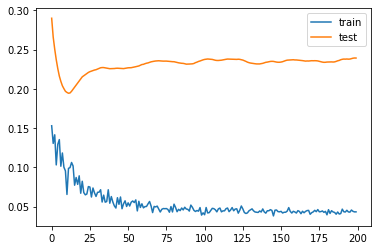

0.0027688071131706238
CésarAzpilicueta
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 106 samples, validate on 27 samples
Epoch 1/200
106/106 [==============================] - 1s 9ms/step - loss: 0.3675 - mse: 0.3675 - val_loss: 0.2796 - val_mse: 0.2796
Epoch 2/200
106/106 [==============================] - 0s 104us/step - loss: 0.3928 - mse: 0.3928 - val_loss: 0.2529 - val_mse: 0.2529
Epoch 3/200
106/106 [==============================] - 0s 132us/step - loss: 0.2853 - mse: 0.2853 - val_loss: 0.2267 - val_mse: 0.2267
Epoch 4/200
106/106 [==============================] - 0s 123us/step - loss: 0.2969 - mse: 0.2969 - val_loss: 0.2014 - val_mse: 0.2014
Epoch 5/200
106/106 [==============================] - 0s 104us/step - loss: 0.2888 - mse: 0.2888 - val_loss: 0.1765 - val_mse: 0.1765
Epoch 6/200
106/106 [==============================] - 0s 94us/step - loss: 0.2505 - mse: 0.2505 - val_loss: 0.1542 - val_mse: 0.1542
Epoch 7/200
106/106 [==============================] - 0s 123us/step - loss: 0.2525 - mse: 0.2525 - val_loss: 0.1347 - val_mse: 0.1347
Epoch 8/200
1

106/106 [==============================] - 0s 179us/step - loss: 0.0618 - mse: 0.0618 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 62/200
106/106 [==============================] - 0s 160us/step - loss: 0.0653 - mse: 0.0653 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 63/200
106/106 [==============================] - 0s 113us/step - loss: 0.0742 - mse: 0.0742 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 64/200
106/106 [==============================] - 0s 113us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 65/200
106/106 [==============================] - 0s 113us/step - loss: 0.0732 - mse: 0.0732 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 66/200
106/106 [==============================] - 0s 94us/step - loss: 0.0754 - mse: 0.0754 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 67/200
106/106 [==============================] - 0s 106us/step - loss: 0.0705 - mse: 0.0705 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 68/200
106/106 [==============================] - 0s 141

Epoch 122/200
106/106 [==============================] - 0s 94us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 123/200
106/106 [==============================] - 0s 104us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 124/200
106/106 [==============================] - 0s 94us/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 125/200
106/106 [==============================] - 0s 108us/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 126/200
106/106 [==============================] - 0s 94us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 127/200
106/106 [==============================] - 0s 94us/step - loss: 0.0656 - mse: 0.0656 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 128/200
106/106 [==============================] - 0s 94us/step - loss: 0.0628 - mse: 0.0628 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 129/200
106/106 [=======================

Epoch 183/200
106/106 [==============================] - 0s 104us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 184/200
106/106 [==============================] - 0s 85us/step - loss: 0.0586 - mse: 0.0586 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 185/200
106/106 [==============================] - 0s 85us/step - loss: 0.0672 - mse: 0.0672 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 186/200
106/106 [==============================] - 0s 75us/step - loss: 0.0639 - mse: 0.0639 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 187/200
106/106 [==============================] - 0s 85us/step - loss: 0.0648 - mse: 0.0648 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 188/200
106/106 [==============================] - 0s 104us/step - loss: 0.0614 - mse: 0.0614 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 189/200
106/106 [==============================] - 0s 94us/step - loss: 0.0608 - mse: 0.0608 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 190/200
106/106 [=======================

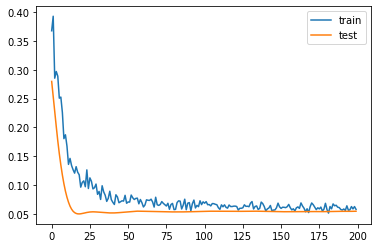

4.55913969874382
OlivierGiroud
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 100 samples, validate on 26 samples
Epoch 1/200
100/100 [==============================] - 0s 5ms/step - loss: 0.0869 - mse: 0.0869 - val_loss: 0.0919 - val_mse: 0.0919
Epoch 2/200
100/100 [==============================] - 0s 90us/step - loss: 0.1111 - mse: 0.1111 - val_loss: 0.0897 - val_mse: 0.0897
Epoch 3/200
100/100 [==============================] - 0s 90us/step - loss: 0.0838 - mse: 0.0838 - val_loss: 0.0885 - val_mse: 0.0885
Epoch 4/200
100/100 [==============================] - 0s 100us/step - loss: 0.0943 - mse: 0.0943 - val_loss: 0.0879 - val_mse: 0.0879
Epoch 5/200
100/100 [==============================] - 0s 100us/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.0878 - val_mse: 0.0878
Epoch 6/200
100/100 [==============================] - 0s 80us/step - loss: 0.0934 - mse: 0.0934 - val_loss: 0.0876 - val_mse: 0.0876
Epoch 7/200
100/100 [==============================] - 0s 80us/step - loss: 0.0842 - mse: 0.0842 - val_loss: 0.0877 - val_mse: 0.0877
Epoch 8/200
100/

Epoch 62/200
100/100 [==============================] - 0s 80us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0957 - val_mse: 0.0957
Epoch 63/200
100/100 [==============================] - 0s 80us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0957 - val_mse: 0.0957
Epoch 64/200
100/100 [==============================] - 0s 80us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0959 - val_mse: 0.0959
Epoch 65/200
100/100 [==============================] - 0s 100us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0959 - val_mse: 0.0959
Epoch 66/200
100/100 [==============================] - 0s 100us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0959 - val_mse: 0.0959
Epoch 67/200
100/100 [==============================] - 0s 90us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0960 - val_mse: 0.0960
Epoch 68/200
100/100 [==============================] - 0s 80us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0961 - val_mse: 0.0961
Epoch 69/200
100/100 [==============================]

Epoch 123/200
100/100 [==============================] - 0s 100us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0966 - val_mse: 0.0966
Epoch 124/200
100/100 [==============================] - 0s 100us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0966 - val_mse: 0.0966
Epoch 125/200
100/100 [==============================] - 0s 90us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0965 - val_mse: 0.0965
Epoch 126/200
100/100 [==============================] - 0s 90us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0963 - val_mse: 0.0963
Epoch 127/200
100/100 [==============================] - 0s 100us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0961 - val_mse: 0.0961
Epoch 128/200
100/100 [==============================] - 0s 90us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0957 - val_mse: 0.0957
Epoch 129/200
100/100 [==============================] - 0s 90us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0954 - val_mse: 0.0954
Epoch 130/200
100/100 [======================

Epoch 183/200
100/100 [==============================] - 0s 120us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 184/200
100/100 [==============================] - 0s 100us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0932 - val_mse: 0.0932
Epoch 185/200
100/100 [==============================] - 0s 90us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0930 - val_mse: 0.0930
Epoch 186/200
100/100 [==============================] - 0s 100us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0930 - val_mse: 0.0930
Epoch 187/200
100/100 [==============================] - 0s 100us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0930 - val_mse: 0.0930
Epoch 188/200
100/100 [==============================] - 0s 90us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0932 - val_mse: 0.0932
Epoch 189/200
100/100 [==============================] - 0s 90us/step - loss: 0.0295 - mse: 0.0295 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 190/200
100/100 [=====================

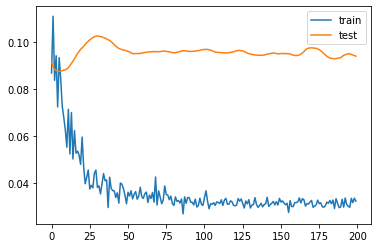

3.211178183555603
MarcosAlonso
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 26 samples
Epoch 1/200
104/104 [==============================] - 1s 6ms/step - loss: 0.2105 - mse: 0.2105 - val_loss: 0.1653 - val_mse: 0.1653
Epoch 2/200
104/104 [==============================] - 0s 86us/step - loss: 0.1538 - mse: 0.1538 - val_loss: 0.1378 - val_mse: 0.1378
Epoch 3/200
104/104 [==============================] - 0s 96us/step - loss: 0.1566 - mse: 0.1566 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 4/200
104/104 [==============================] - 0s 96us/step - loss: 0.1351 - mse: 0.1351 - val_loss: 0.0969 - val_mse: 0.0969
Epoch 5/200
104/104 [==============================] - 0s 96us/step - loss: 0.1151 - mse: 0.1151 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 6/200
104/104 [==============================] - 0s 96us/step - loss: 0.1249 - mse: 0.1249 - val_loss: 0.0725 - val_mse: 0.0725
Epoch 7/200
104/104 [==============================] - 0s 96us/step - loss: 0.1069 - mse: 0.1069 - val_loss: 0.0651 - val_mse: 0.0651
Epoch 8/200
104/10

Epoch 62/200
104/104 [==============================] - 0s 86us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0514 - val_mse: 0.0514
Epoch 63/200
104/104 [==============================] - 0s 134us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0515 - val_mse: 0.0515
Epoch 64/200
104/104 [==============================] - 0s 106us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 65/200
104/104 [==============================] - 0s 86us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 66/200
104/104 [==============================] - 0s 86us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 67/200
104/104 [==============================] - 0s 96us/step - loss: 0.0409 - mse: 0.0409 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 68/200
104/104 [==============================] - 0s 86us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0515 - val_mse: 0.0515
Epoch 69/200
104/104 [==============================]

Epoch 183/200
104/104 [==============================] - 0s 125us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 184/200
104/104 [==============================] - 0s 106us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 185/200
104/104 [==============================] - 0s 106us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 186/200
104/104 [==============================] - 0s 77us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 187/200
104/104 [==============================] - 0s 86us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 188/200
104/104 [==============================] - 0s 96us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 189/200
104/104 [==============================] - 0s 96us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 190/200
104/104 [======================

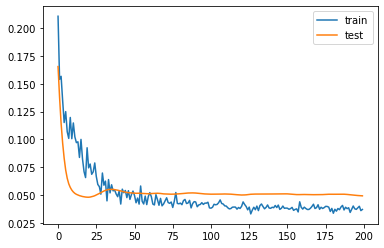

4.113546460866927
Jorge LuizFrello Filho
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 48 samples, validate on 13 samples
Epoch 1/200
48/48 [==============================] - 1s 13ms/step - loss: 0.1491 - mse: 0.1491 - val_loss: 0.0891 - val_mse: 0.0891
Epoch 2/200
48/48 [==============================] - 0s 229us/step - loss: 0.1424 - mse: 0.1424 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 3/200
48/48 [==============================] - 0s 208us/step - loss: 0.2263 - mse: 0.2263 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 4/200
48/48 [==============================] - 0s 187us/step - loss: 0.1426 - mse: 0.1426 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 5/200
48/48 [==============================] - 0s 167us/step - loss: 0.1061 - mse: 0.1061 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 6/200
48/48 [==============================] - 0s 187us/step - loss: 0.0933 - mse: 0.0933 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 7/200
48/48 [==============================] - 0s 167us/step - loss: 0.1247 - mse: 0.1247 - val_loss: 0.0392 - val_mse: 0.0392
Epoch 8/200
48/48 [=======

Epoch 62/200
48/48 [==============================] - 0s 208us/step - loss: 0.0510 - mse: 0.0510 - val_loss: 0.0345 - val_mse: 0.0345
Epoch 63/200
48/48 [==============================] - 0s 208us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 64/200
48/48 [==============================] - 0s 208us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 65/200
48/48 [==============================] - 0s 187us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 66/200
48/48 [==============================] - 0s 167us/step - loss: 0.0432 - mse: 0.0432 - val_loss: 0.0342 - val_mse: 0.0342
Epoch 67/200
48/48 [==============================] - 0s 167us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 68/200
48/48 [==============================] - 0s 167us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 69/200
48/48 [==============================] - 0s 271us

Epoch 123/200
48/48 [==============================] - 0s 167us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 124/200
48/48 [==============================] - 0s 167us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 125/200
48/48 [==============================] - 0s 187us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 126/200
48/48 [==============================] - 0s 146us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 127/200
48/48 [==============================] - 0s 167us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 128/200
48/48 [==============================] - 0s 187us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 129/200
48/48 [==============================] - 0s 167us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 130/200
48/48 [==============================] - 

Epoch 184/200
48/48 [==============================] - 0s 333us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 185/200
48/48 [==============================] - 0s 416us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 186/200
48/48 [==============================] - 0s 187us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 187/200
48/48 [==============================] - 0s 208us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 188/200
48/48 [==============================] - 0s 229us/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 189/200
48/48 [==============================] - 0s 187us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 190/200
48/48 [==============================] - 0s 167us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 191/200
48/48 [==============================] - 

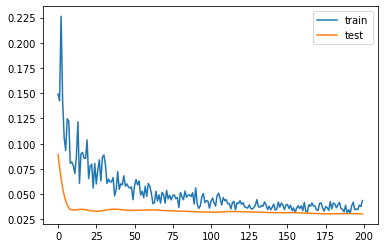

3.424011617898941
RossBarkley
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 100 samples, validate on 25 samples
Epoch 1/200
100/100 [==============================] - 0s 5ms/step - loss: 0.1672 - mse: 0.1672 - val_loss: 0.0958 - val_mse: 0.0958
Epoch 2/200
100/100 [==============================] - 0s 90us/step - loss: 0.1535 - mse: 0.1535 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 3/200
100/100 [==============================] - 0s 90us/step - loss: 0.1403 - mse: 0.1403 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 4/200
100/100 [==============================] - 0s 100us/step - loss: 0.1339 - mse: 0.1339 - val_loss: 0.0615 - val_mse: 0.0615
Epoch 5/200
100/100 [==============================] - 0s 100us/step - loss: 0.0976 - mse: 0.0976 - val_loss: 0.0528 - val_mse: 0.0528
Epoch 6/200
100/100 [==============================] - 0s 90us/step - loss: 0.1099 - mse: 0.1099 - val_loss: 0.0463 - val_mse: 0.0463
Epoch 7/200
100/100 [==============================] - 0s 90us/step - loss: 0.0994 - mse: 0.0994 - val_loss: 0.0415 - val_mse: 0.0415
Epoch 8/200
100/

Epoch 62/200
100/100 [==============================] - 0s 100us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 63/200
100/100 [==============================] - 0s 80us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 64/200
100/100 [==============================] - 0s 80us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 65/200
100/100 [==============================] - 0s 90us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 66/200
100/100 [==============================] - 0s 80us/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 67/200
100/100 [==============================] - 0s 90us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 68/200
100/100 [==============================] - 0s 80us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 69/200
100/100 [==============================] 

Epoch 123/200
100/100 [==============================] - 0s 90us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 124/200
100/100 [==============================] - 0s 110us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 125/200
100/100 [==============================] - 0s 100us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 126/200
100/100 [==============================] - 0s 80us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 127/200
100/100 [==============================] - 0s 80us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 128/200
100/100 [==============================] - 0s 90us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 129/200
100/100 [==============================] - 0s 80us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 130/200
100/100 [=======================

Epoch 184/200
100/100 [==============================] - 0s 80us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 185/200
100/100 [==============================] - 0s 100us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 186/200
100/100 [==============================] - 0s 120us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 187/200
100/100 [==============================] - 0s 100us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 188/200
100/100 [==============================] - 0s 80us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 189/200
100/100 [==============================] - 0s 90us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 190/200
100/100 [==============================] - 0s 80us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 191/200
100/100 [======================

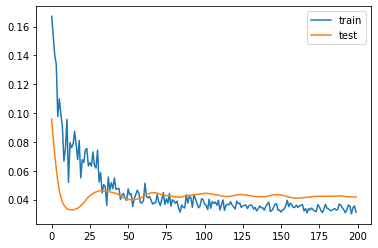

4.8097312450408936
MateoKovacic
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 48 samples, validate on 13 samples
Epoch 1/200
48/48 [==============================] - 0s 10ms/step - loss: 0.4195 - mse: 0.4195 - val_loss: 0.1511 - val_mse: 0.1511
Epoch 2/200
48/48 [==============================] - 0s 167us/step - loss: 0.4492 - mse: 0.4492 - val_loss: 0.1216 - val_mse: 0.1216
Epoch 3/200
48/48 [==============================] - 0s 166us/step - loss: 0.3594 - mse: 0.3594 - val_loss: 0.0985 - val_mse: 0.0985
Epoch 4/200
48/48 [==============================] - 0s 146us/step - loss: 0.3232 - mse: 0.3232 - val_loss: 0.0762 - val_mse: 0.0762
Epoch 5/200
48/48 [==============================] - 0s 167us/step - loss: 0.3283 - mse: 0.3283 - val_loss: 0.0587 - val_mse: 0.0587
Epoch 6/200
48/48 [==============================] - 0s 167us/step - loss: 0.4218 - mse: 0.4218 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 7/200
48/48 [==============================] - 0s 166us/step - loss: 0.2344 - mse: 0.2344 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 8/200
48/48 [=======

Epoch 62/200
48/48 [==============================] - 0s 146us/step - loss: 0.0991 - mse: 0.0991 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 63/200
48/48 [==============================] - 0s 167us/step - loss: 0.0866 - mse: 0.0866 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 64/200
48/48 [==============================] - 0s 146us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 65/200
48/48 [==============================] - 0s 146us/step - loss: 0.0771 - mse: 0.0771 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 66/200
48/48 [==============================] - 0s 187us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 67/200
48/48 [==============================] - 0s 146us/step - loss: 0.0722 - mse: 0.0722 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 68/200
48/48 [==============================] - 0s 187us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 69/200
48/48 [==============================] - 0s 167us

Epoch 123/200
48/48 [==============================] - 0s 167us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 124/200
48/48 [==============================] - 0s 354us/step - loss: 0.0577 - mse: 0.0577 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 125/200
48/48 [==============================] - 0s 187us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 126/200
48/48 [==============================] - 0s 187us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 127/200
48/48 [==============================] - 0s 187us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 128/200
48/48 [==============================] - 0s 187us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 129/200
48/48 [==============================] - 0s 208us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 130/200
48/48 [==============================] - 

Epoch 184/200
48/48 [==============================] - 0s 167us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 185/200
48/48 [==============================] - 0s 146us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 186/200
48/48 [==============================] - 0s 146us/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 187/200
48/48 [==============================] - 0s 167us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 188/200
48/48 [==============================] - 0s 146us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 189/200
48/48 [==============================] - 0s 291us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 190/200
48/48 [==============================] - 0s 312us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 191/200
48/48 [==============================] - 

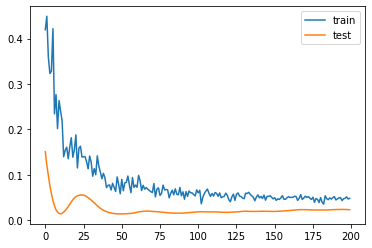

-0.546169638633728
AntonioRüdiger
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 73 samples, validate on 19 samples
Epoch 1/200
73/73 [==============================] - 1s 7ms/step - loss: 0.1439 - mse: 0.1439 - val_loss: 0.1222 - val_mse: 0.1222
Epoch 2/200
73/73 [==============================] - 0s 151us/step - loss: 0.1426 - mse: 0.1426 - val_loss: 0.1122 - val_mse: 0.1122
Epoch 3/200
73/73 [==============================] - 0s 109us/step - loss: 0.1113 - mse: 0.1113 - val_loss: 0.1031 - val_mse: 0.1031
Epoch 4/200
73/73 [==============================] - 0s 123us/step - loss: 0.1135 - mse: 0.1135 - val_loss: 0.0949 - val_mse: 0.0949
Epoch 5/200
73/73 [==============================] - 0s 137us/step - loss: 0.1128 - mse: 0.1128 - val_loss: 0.0875 - val_mse: 0.0875
Epoch 6/200
73/73 [==============================] - 0s 137us/step - loss: 0.0929 - mse: 0.0929 - val_loss: 0.0809 - val_mse: 0.0809
Epoch 7/200
73/73 [==============================] - 0s 110us/step - loss: 0.0933 - mse: 0.0933 - val_loss: 0.0749 - val_mse: 0.0749
Epoch 8/200
73/73 [========

Epoch 62/200
73/73 [==============================] - 0s 110us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 63/200
73/73 [==============================] - 0s 137us/step - loss: 0.0475 - mse: 0.0475 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 64/200
73/73 [==============================] - 0s 110us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 65/200
73/73 [==============================] - 0s 123us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 66/200
73/73 [==============================] - 0s 156us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 67/200
73/73 [==============================] - 0s 137us/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 68/200
73/73 [==============================] - 0s 123us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 69/200
73/73 [==============================] - 0s 123us

Epoch 123/200
73/73 [==============================] - 0s 110us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 124/200
73/73 [==============================] - 0s 110us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 125/200
73/73 [==============================] - 0s 137us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 126/200
73/73 [==============================] - 0s 123us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 127/200
73/73 [==============================] - 0s 96us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 128/200
73/73 [==============================] - 0s 123us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 129/200
73/73 [==============================] - 0s 123us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 130/200
73/73 [==============================] - 0

Epoch 184/200
73/73 [==============================] - 0s 110us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 185/200
73/73 [==============================] - 0s 123us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 186/200
73/73 [==============================] - 0s 110us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 187/200
73/73 [==============================] - 0s 123us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 188/200
73/73 [==============================] - 0s 123us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 189/200
73/73 [==============================] - 0s 123us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 190/200
73/73 [==============================] - 0s 137us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 191/200
73/73 [==============================] - 

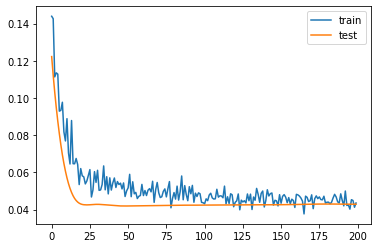

3.9442126154899597
KurtZouma
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 26 samples
Epoch 1/200
104/104 [==============================] - 1s 5ms/step - loss: 0.2079 - mse: 0.2079 - val_loss: 0.0649 - val_mse: 0.0649
Epoch 2/200
104/104 [==============================] - 0s 77us/step - loss: 0.2218 - mse: 0.2218 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 3/200
104/104 [==============================] - 0s 96us/step - loss: 0.1796 - mse: 0.1796 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 4/200
104/104 [==============================] - 0s 96us/step - loss: 0.2069 - mse: 0.2069 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 5/200
104/104 [==============================] - 0s 86us/step - loss: 0.1998 - mse: 0.1998 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 6/200
104/104 [==============================] - 0s 86us/step - loss: 0.1181 - mse: 0.1181 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 7/200
104/104 [==============================] - 0s 77us/step - loss: 0.1450 - mse: 0.1450 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 8/200
104/10

Epoch 62/200
104/104 [==============================] - 0s 115us/step - loss: 0.0475 - mse: 0.0475 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 63/200
104/104 [==============================] - 0s 86us/step - loss: 0.0448 - mse: 0.0448 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 64/200
104/104 [==============================] - 0s 115us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 65/200
104/104 [==============================] - 0s 96us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 66/200
104/104 [==============================] - 0s 125us/step - loss: 0.0418 - mse: 0.0418 - val_loss: 0.0216 - val_mse: 0.0216
Epoch 67/200
104/104 [==============================] - 0s 96us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 68/200
104/104 [==============================] - 0s 115us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 69/200
104/104 [=============================

Epoch 123/200
104/104 [==============================] - 0s 86us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 124/200
104/104 [==============================] - 0s 77us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 125/200
104/104 [==============================] - 0s 77us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 126/200
104/104 [==============================] - 0s 86us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0188 - val_mse: 0.0188
Epoch 127/200
104/104 [==============================] - 0s 67us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 128/200
104/104 [==============================] - 0s 86us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 129/200
104/104 [==============================] - 0s 86us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 86us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 185/200
104/104 [==============================] - 0s 86us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 186/200
104/104 [==============================] - 0s 86us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 187/200
104/104 [==============================] - 0s 86us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 188/200
104/104 [==============================] - 0s 125us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 189/200
104/104 [==============================] - 0s 96us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 190/200
104/104 [==============================] - 0s 106us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 191/200
104/104 [=======================

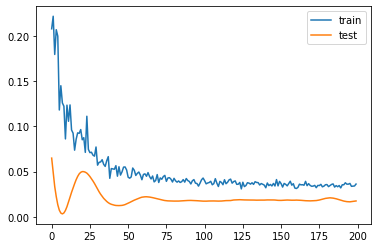

2.848334789276123
EmersonPalmieri dos Santos
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 55 samples, validate on 14 samples
Epoch 1/200
55/55 [==============================] - 1s 10ms/step - loss: 0.3914 - mse: 0.3914 - val_loss: 0.3242 - val_mse: 0.3242
Epoch 2/200
55/55 [==============================] - 0s 182us/step - loss: 0.3843 - mse: 0.3843 - val_loss: 0.2961 - val_mse: 0.2961
Epoch 3/200
55/55 [==============================] - 0s 163us/step - loss: 0.3809 - mse: 0.3809 - val_loss: 0.2641 - val_mse: 0.2641
Epoch 4/200
55/55 [==============================] - 0s 181us/step - loss: 0.2843 - mse: 0.2843 - val_loss: 0.2359 - val_mse: 0.2359
Epoch 5/200
55/55 [==============================] - 0s 145us/step - loss: 0.2674 - mse: 0.2674 - val_loss: 0.2085 - val_mse: 0.2085
Epoch 6/200
55/55 [==============================] - 0s 164us/step - loss: 0.2313 - mse: 0.2313 - val_loss: 0.1835 - val_mse: 0.1835
Epoch 7/200
55/55 [==============================] - 0s 145us/step - loss: 0.2014 - mse: 0.2014 - val_loss: 0.1606 - val_mse: 0.1606
Epoch 8/200
55/55 [=======

Epoch 62/200
55/55 [==============================] - 0s 145us/step - loss: 0.0639 - mse: 0.0639 - val_loss: 0.0756 - val_mse: 0.0756
Epoch 63/200
55/55 [==============================] - 0s 164us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0756 - val_mse: 0.0756
Epoch 64/200
55/55 [==============================] - 0s 200us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0757 - val_mse: 0.0757
Epoch 65/200
55/55 [==============================] - 0s 200us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0757 - val_mse: 0.0757
Epoch 66/200
55/55 [==============================] - 0s 236us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0759 - val_mse: 0.0759
Epoch 67/200
55/55 [==============================] - 0s 200us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0761 - val_mse: 0.0761
Epoch 68/200
55/55 [==============================] - 0s 164us/step - loss: 0.0580 - mse: 0.0580 - val_loss: 0.0763 - val_mse: 0.0763
Epoch 69/200
55/55 [==============================] - 0s 164us

Epoch 123/200
55/55 [==============================] - 0s 164us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0817 - val_mse: 0.0817
Epoch 124/200
55/55 [==============================] - 0s 164us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0819 - val_mse: 0.0819
Epoch 125/200
55/55 [==============================] - 0s 145us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 126/200
55/55 [==============================] - 0s 164us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 127/200
55/55 [==============================] - 0s 182us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0821 - val_mse: 0.0821
Epoch 128/200
55/55 [==============================] - 0s 145us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0822 - val_mse: 0.0822
Epoch 129/200
55/55 [==============================] - 0s 164us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0822 - val_mse: 0.0822
Epoch 130/200
55/55 [==============================] - 

Epoch 184/200
55/55 [==============================] - 0s 145us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0839 - val_mse: 0.0839
Epoch 185/200
55/55 [==============================] - 0s 145us/step - loss: 0.0409 - mse: 0.0409 - val_loss: 0.0838 - val_mse: 0.0838
Epoch 186/200
55/55 [==============================] - 0s 145us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 187/200
55/55 [==============================] - 0s 164us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 188/200
55/55 [==============================] - 0s 145us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 189/200
55/55 [==============================] - 0s 127us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 190/200
55/55 [==============================] - 0s 145us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0836 - val_mse: 0.0836
Epoch 191/200
55/55 [==============================] - 

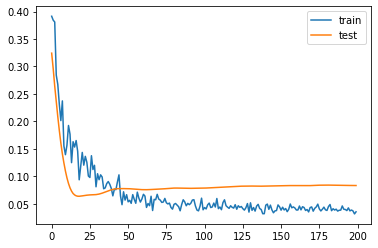

1.5325475931167603
KepaArrizabalaga
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 48 samples, validate on 13 samples
Epoch 1/200
48/48 [==============================] - 1s 12ms/step - loss: 0.1969 - mse: 0.1969 - val_loss: 0.1733 - val_mse: 0.1733
Epoch 2/200
48/48 [==============================] - 0s 187us/step - loss: 0.2188 - mse: 0.2188 - val_loss: 0.1599 - val_mse: 0.1599
Epoch 3/200
48/48 [==============================] - 0s 187us/step - loss: 0.1937 - mse: 0.1937 - val_loss: 0.1479 - val_mse: 0.1479
Epoch 4/200
48/48 [==============================] - 0s 187us/step - loss: 0.1680 - mse: 0.1680 - val_loss: 0.1368 - val_mse: 0.1368
Epoch 5/200
48/48 [==============================] - 0s 187us/step - loss: 0.1892 - mse: 0.1892 - val_loss: 0.1267 - val_mse: 0.1267
Epoch 6/200
48/48 [==============================] - 0s 271us/step - loss: 0.1269 - mse: 0.1269 - val_loss: 0.1182 - val_mse: 0.1182
Epoch 7/200
48/48 [==============================] - 0s 229us/step - loss: 0.1284 - mse: 0.1284 - val_loss: 0.1106 - val_mse: 0.1106
Epoch 8/200
48/48 [=======

Epoch 62/200
48/48 [==============================] - 0s 167us/step - loss: 0.0662 - mse: 0.0662 - val_loss: 0.0768 - val_mse: 0.0768
Epoch 63/200
48/48 [==============================] - 0s 167us/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0768 - val_mse: 0.0768
Epoch 64/200
48/48 [==============================] - 0s 187us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0768 - val_mse: 0.0768
Epoch 65/200
48/48 [==============================] - 0s 187us/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 66/200
48/48 [==============================] - 0s 187us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 67/200
48/48 [==============================] - 0s 208us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0766 - val_mse: 0.0766
Epoch 68/200
48/48 [==============================] - 0s 187us/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.0765 - val_mse: 0.0765
Epoch 69/200
48/48 [==============================] - 0s 167us

Epoch 123/200
48/48 [==============================] - 0s 167us/step - loss: 0.0563 - mse: 0.0563 - val_loss: 0.0751 - val_mse: 0.0751
Epoch 124/200
48/48 [==============================] - 0s 208us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.0751 - val_mse: 0.0751
Epoch 125/200
48/48 [==============================] - 0s 187us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0751 - val_mse: 0.0751
Epoch 126/200
48/48 [==============================] - 0s 250us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 127/200
48/48 [==============================] - 0s 292us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 128/200
48/48 [==============================] - 0s 250us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 129/200
48/48 [==============================] - 0s 271us/step - loss: 0.0586 - mse: 0.0586 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 130/200
48/48 [==============================] - 

Epoch 184/200
48/48 [==============================] - 0s 187us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 185/200
48/48 [==============================] - 0s 146us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 186/200
48/48 [==============================] - 0s 146us/step - loss: 0.0475 - mse: 0.0475 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 187/200
48/48 [==============================] - 0s 146us/step - loss: 0.0567 - mse: 0.0567 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 188/200
48/48 [==============================] - 0s 167us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 189/200
48/48 [==============================] - 0s 146us/step - loss: 0.0609 - mse: 0.0609 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 190/200
48/48 [==============================] - 0s 167us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 191/200
48/48 [==============================] - 

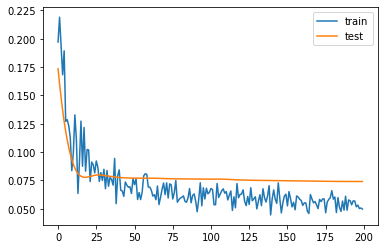

4.430189847946167
N'GoloKanté
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 27 samples
Epoch 1/200
104/104 [==============================] - 1s 5ms/step - loss: 0.3529 - mse: 0.3529 - val_loss: 0.2224 - val_mse: 0.2224
Epoch 2/200
104/104 [==============================] - 0s 106us/step - loss: 0.3435 - mse: 0.3435 - val_loss: 0.1912 - val_mse: 0.1912
Epoch 3/200
104/104 [==============================] - 0s 86us/step - loss: 0.2673 - mse: 0.2673 - val_loss: 0.1619 - val_mse: 0.1619
Epoch 4/200
104/104 [==============================] - 0s 96us/step - loss: 0.3053 - mse: 0.3053 - val_loss: 0.1346 - val_mse: 0.1346
Epoch 5/200
104/104 [==============================] - 0s 86us/step - loss: 0.2599 - mse: 0.2599 - val_loss: 0.1099 - val_mse: 0.1099
Epoch 6/200
104/104 [==============================] - 0s 106us/step - loss: 0.2429 - mse: 0.2429 - val_loss: 0.0881 - val_mse: 0.0881
Epoch 7/200
104/104 [==============================] - 0s 106us/step - loss: 0.1817 - mse: 0.1817 - val_loss: 0.0702 - val_mse: 0.0702
Epoch 8/200
104

Epoch 62/200
104/104 [==============================] - 0s 96us/step - loss: 0.0514 - mse: 0.0514 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 63/200
104/104 [==============================] - 0s 86us/step - loss: 0.0580 - mse: 0.0580 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 64/200
104/104 [==============================] - 0s 86us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 65/200
104/104 [==============================] - 0s 86us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 66/200
104/104 [==============================] - 0s 96us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 67/200
104/104 [==============================] - 0s 77us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 68/200
104/104 [==============================] - 0s 77us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 69/200
104/104 [==============================] -

Epoch 123/200
104/104 [==============================] - 0s 77us/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 124/200
104/104 [==============================] - 0s 106us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 125/200
104/104 [==============================] - 0s 86us/step - loss: 0.0514 - mse: 0.0514 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 126/200
104/104 [==============================] - 0s 77us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 127/200
104/104 [==============================] - 0s 77us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 128/200
104/104 [==============================] - 0s 96us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 129/200
104/104 [==============================] - 0s 77us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 130/200
104/104 [========================

Epoch 184/200
104/104 [==============================] - 0s 77us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 185/200
104/104 [==============================] - 0s 77us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 186/200
104/104 [==============================] - 0s 77us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 187/200
104/104 [==============================] - 0s 86us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 188/200
104/104 [==============================] - 0s 86us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 189/200
104/104 [==============================] - 0s 86us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 190/200
104/104 [==============================] - 0s 77us/step - loss: 0.0462 - mse: 0.0462 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 191/200
104/104 [=========================

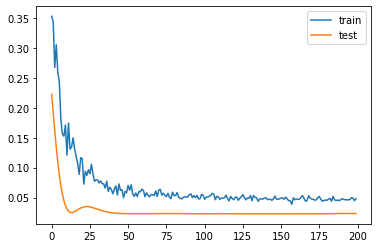

2.975527048110962
AndreasChristensen
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 77 samples, validate on 20 samples
Epoch 1/200
77/77 [==============================] - 0s 6ms/step - loss: 0.1233 - mse: 0.1233 - val_loss: 0.1927 - val_mse: 0.1927
Epoch 2/200
77/77 [==============================] - 0s 117us/step - loss: 0.1065 - mse: 0.1065 - val_loss: 0.1815 - val_mse: 0.1815
Epoch 3/200
77/77 [==============================] - 0s 104us/step - loss: 0.1364 - mse: 0.1364 - val_loss: 0.1714 - val_mse: 0.1714
Epoch 4/200
77/77 [==============================] - 0s 117us/step - loss: 0.1213 - mse: 0.1213 - val_loss: 0.1620 - val_mse: 0.1620
Epoch 5/200
77/77 [==============================] - 0s 117us/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.1539 - val_mse: 0.1539
Epoch 6/200
77/77 [==============================] - 0s 104us/step - loss: 0.1124 - mse: 0.1124 - val_loss: 0.1466 - val_mse: 0.1466
Epoch 7/200
77/77 [==============================] - 0s 117us/step - loss: 0.1124 - mse: 0.1124 - val_loss: 0.1401 - val_mse: 0.1401
Epoch 8/200
77/77 [========

Epoch 62/200
77/77 [==============================] - 0s 117us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.1049 - val_mse: 0.1049
Epoch 63/200
77/77 [==============================] - 0s 104us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.1049 - val_mse: 0.1049
Epoch 64/200
77/77 [==============================] - 0s 104us/step - loss: 0.0648 - mse: 0.0648 - val_loss: 0.1050 - val_mse: 0.1050
Epoch 65/200
77/77 [==============================] - 0s 143us/step - loss: 0.0733 - mse: 0.0733 - val_loss: 0.1051 - val_mse: 0.1051
Epoch 66/200
77/77 [==============================] - 0s 156us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.1053 - val_mse: 0.1053
Epoch 67/200
77/77 [==============================] - 0s 104us/step - loss: 0.0643 - mse: 0.0643 - val_loss: 0.1055 - val_mse: 0.1055
Epoch 68/200
77/77 [==============================] - 0s 117us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.1058 - val_mse: 0.1058
Epoch 69/200
77/77 [==============================] - 0s 117us

Epoch 123/200
77/77 [==============================] - 0s 117us/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0973 - val_mse: 0.0973
Epoch 124/200
77/77 [==============================] - 0s 117us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0973 - val_mse: 0.0973
Epoch 125/200
77/77 [==============================] - 0s 117us/step - loss: 0.0539 - mse: 0.0539 - val_loss: 0.0974 - val_mse: 0.0974
Epoch 126/200
77/77 [==============================] - 0s 104us/step - loss: 0.0601 - mse: 0.0601 - val_loss: 0.0975 - val_mse: 0.0975
Epoch 127/200
77/77 [==============================] - 0s 104us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0976 - val_mse: 0.0976
Epoch 128/200
77/77 [==============================] - 0s 117us/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 129/200
77/77 [==============================] - 0s 104us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 130/200
77/77 [==============================] - 

Epoch 184/200
77/77 [==============================] - 0s 117us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 185/200
77/77 [==============================] - 0s 104us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 186/200
77/77 [==============================] - 0s 104us/step - loss: 0.0543 - mse: 0.0543 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 187/200
77/77 [==============================] - 0s 117us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 188/200
77/77 [==============================] - 0s 130us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 189/200
77/77 [==============================] - 0s 104us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 190/200
77/77 [==============================] - 0s 104us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0910 - val_mse: 0.0910
Epoch 191/200
77/77 [==============================] - 

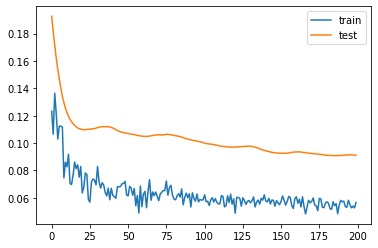

1.663770079612732
TammyAbraham
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 1s 7ms/step - loss: 0.1222 - mse: 0.1222 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 2/200
80/80 [==============================] - 0s 112us/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.0287 - val_mse: 0.0287
Epoch 3/200
80/80 [==============================] - 0s 112us/step - loss: 0.0994 - mse: 0.0994 - val_loss: 0.0268 - val_mse: 0.0268
Epoch 4/200
80/80 [==============================] - 0s 125us/step - loss: 0.0986 - mse: 0.0986 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 5/200
80/80 [==============================] - 0s 125us/step - loss: 0.0850 - mse: 0.0850 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 6/200
80/80 [==============================] - 0s 100us/step - loss: 0.0965 - mse: 0.0965 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 7/200
80/80 [==============================] - 0s 112us/step - loss: 0.0958 - mse: 0.0958 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 112us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 63/200
80/80 [==============================] - 0s 112us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 64/200
80/80 [==============================] - 0s 100us/step - loss: 0.0418 - mse: 0.0418 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 66/200
80/80 [==============================] - 0s 100us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 67/200
80/80 [==============================] - 0s 100us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 68/200
80/80 [==============================] - 0s 100us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 69/200
80/80 [==============================] - 0s 112us

Epoch 123/200
80/80 [==============================] - 0s 112us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0250 - val_mse: 0.0250
Epoch 124/200
80/80 [==============================] - 0s 100us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 126/200
80/80 [==============================] - 0s 100us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 127/200
80/80 [==============================] - 0s 200us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 128/200
80/80 [==============================] - 0s 112us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 129/200
80/80 [==============================] - 0s 125us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 125us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 185/200
80/80 [==============================] - 0s 112us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0275 - val_mse: 0.0275
Epoch 186/200
80/80 [==============================] - 0s 87us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 188/200
80/80 [==============================] - 0s 112us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 189/200
80/80 [==============================] - 0s 87us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 191/200
80/80 [==============================] - 0s

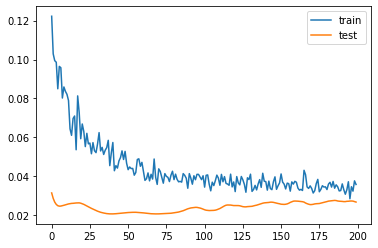

2.2603145837783813
ChristianPulisic
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 27ms/step - loss: 0.1798 - mse: 0.1798 - val_loss: 0.2466 - val_mse: 0.2466
Epoch 2/200
21/21 [==============================] - 0s 476us/step - loss: 0.1936 - mse: 0.1936 - val_loss: 0.2329 - val_mse: 0.2329
Epoch 3/200
21/21 [==============================] - 0s 571us/step - loss: 0.1540 - mse: 0.1540 - val_loss: 0.2159 - val_mse: 0.2159
Epoch 4/200
21/21 [==============================] - 0s 476us/step - loss: 0.1721 - mse: 0.1721 - val_loss: 0.1993 - val_mse: 0.1993
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1825 - mse: 0.1825 - val_loss: 0.1824 - val_mse: 0.1824
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.1156 - mse: 0.1156 - val_loss: 0.1651 - val_mse: 0.1651
Epoch 7/200
21/21 [==============================] - 0s 476us/step - loss: 0.1316 - mse: 0.1316 - val_loss: 0.1495 - val_mse: 0.1495
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 428us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0645 - val_mse: 0.0645
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0642 - val_mse: 0.0642
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0634 - val_mse: 0.0634
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 68/200
21/21 [==============================] - 0s 428us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0578 - val_mse: 0.0578
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0583 - val_mse: 0.0583
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0585 - val_mse: 0.0585
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0586 - val_mse: 0.0586
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0588 - val_mse: 0.0588
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0591 - val_mse: 0.0591
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0219 - mse: 0.0219 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 188/200
21/21 [==============================] - 0s 428us/step - loss: 0.0252 - mse: 0.0252 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0504 - val_mse: 0.0504
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0182 - mse: 0.0182 - val_loss: 0.0504 - val_mse: 0.0504
Epoch 191/200
21/21 [==============================] - 

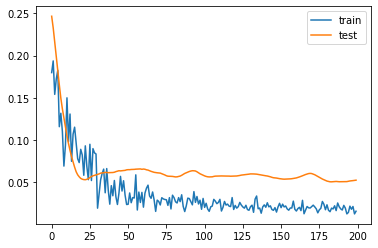

2.631593346595764
MasonMount
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 6 samples
Epoch 1/200
20/20 [==============================] - 0s 23ms/step - loss: 0.1403 - mse: 0.1403 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 2/200
20/20 [==============================] - 0s 350us/step - loss: 0.1635 - mse: 0.1635 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 3/200
20/20 [==============================] - 0s 399us/step - loss: 0.1233 - mse: 0.1233 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 4/200
20/20 [==============================] - 0s 399us/step - loss: 0.0698 - mse: 0.0698 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 5/200
20/20 [==============================] - 0s 400us/step - loss: 0.0936 - mse: 0.0936 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 6/200
20/20 [==============================] - 0s 450us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 7/200
20/20 [==============================] - 0s 349us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 450us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 63/200
20/20 [==============================] - 0s 400us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 64/200
20/20 [==============================] - 0s 400us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 65/200
20/20 [==============================] - 0s 350us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 66/200
20/20 [==============================] - 0s 400us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 67/200
20/20 [==============================] - 0s 350us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 68/200
20/20 [==============================] - 0s 350us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 69/200
20/20 [==============================] - 0s 400us

Epoch 123/200
20/20 [==============================] - 0s 300us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 124/200
20/20 [==============================] - 0s 400us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 125/200
20/20 [==============================] - 0s 350us/step - loss: 0.0252 - mse: 0.0252 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 126/200
20/20 [==============================] - 0s 350us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 128/200
20/20 [==============================] - 0s 350us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 129/200
20/20 [==============================] - 0s 400us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 350us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 185/200
20/20 [==============================] - 0s 400us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0235 - mse: 0.0235 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 187/200
20/20 [==============================] - 0s 400us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 188/200
20/20 [==============================] - 0s 400us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 189/200
20/20 [==============================] - 0s 400us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 190/200
20/20 [==============================] - 0s 350us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 191/200
20/20 [==============================] - 

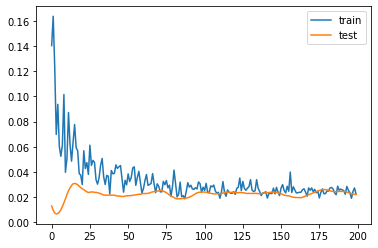

2.403370052576065
FikayoTomori
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 5 samples
Epoch 1/200
20/20 [==============================] - 0s 23ms/step - loss: 0.1651 - mse: 0.1651 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 2/200
20/20 [==============================] - 0s 350us/step - loss: 0.1204 - mse: 0.1204 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 3/200
20/20 [==============================] - 0s 400us/step - loss: 0.2046 - mse: 0.2046 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 4/200
20/20 [==============================] - 0s 349us/step - loss: 0.0666 - mse: 0.0666 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 5/200
20/20 [==============================] - 0s 449us/step - loss: 0.1901 - mse: 0.1901 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 6/200
20/20 [==============================] - 0s 450us/step - loss: 0.0944 - mse: 0.0944 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 7/200
20/20 [==============================] - 0s 400us/step - loss: 0.1252 - mse: 0.1252 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 400us/step - loss: 0.1293 - mse: 0.1293 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 63/200
20/20 [==============================] - 0s 350us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 64/200
20/20 [==============================] - 0s 350us/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 65/200
20/20 [==============================] - 0s 350us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 66/200
20/20 [==============================] - 0s 300us/step - loss: 0.0805 - mse: 0.0805 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 67/200
20/20 [==============================] - 0s 350us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 68/200
20/20 [==============================] - 0s 350us/step - loss: 0.0812 - mse: 0.0812 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 69/200
20/20 [==============================] - 0s 400us

Epoch 123/200
20/20 [==============================] - 0s 300us/step - loss: 0.0822 - mse: 0.0822 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 124/200
20/20 [==============================] - 0s 336us/step - loss: 0.0777 - mse: 0.0777 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 125/200
20/20 [==============================] - 0s 400us/step - loss: 0.0888 - mse: 0.0888 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 126/200
20/20 [==============================] - 0s 350us/step - loss: 0.0694 - mse: 0.0694 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0746 - mse: 0.0746 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 128/200
20/20 [==============================] - 0s 350us/step - loss: 0.0764 - mse: 0.0764 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 129/200
20/20 [==============================] - 0s 350us/step - loss: 0.0786 - mse: 0.0786 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 400us/step - loss: 0.0689 - mse: 0.0689 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 185/200
20/20 [==============================] - 0s 350us/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 186/200
20/20 [==============================] - 0s 450us/step - loss: 0.0727 - mse: 0.0727 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 187/200
20/20 [==============================] - 0s 350us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 188/200
20/20 [==============================] - 0s 350us/step - loss: 0.0682 - mse: 0.0682 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 189/200
20/20 [==============================] - 0s 350us/step - loss: 0.0689 - mse: 0.0689 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 190/200
20/20 [==============================] - 0s 350us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 191/200
20/20 [==============================] - 

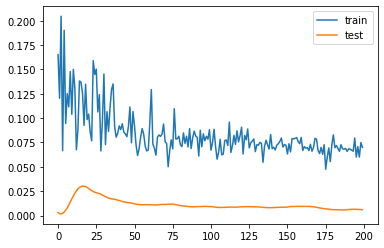

1.0790750831365585
CallumHudson-Odoi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 57 samples, validate on 15 samples
Epoch 1/200
57/57 [==============================] - 0s 8ms/step - loss: 0.2472 - mse: 0.2472 - val_loss: 0.0379 - val_mse: 0.0379
Epoch 2/200
57/57 [==============================] - 0s 158us/step - loss: 0.1955 - mse: 0.1955 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 3/200
57/57 [==============================] - 0s 158us/step - loss: 0.2408 - mse: 0.2408 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 4/200
57/57 [==============================] - 0s 140us/step - loss: 0.1841 - mse: 0.1841 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 5/200
57/57 [==============================] - 0s 158us/step - loss: 0.1717 - mse: 0.1717 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 6/200
57/57 [==============================] - 0s 158us/step - loss: 0.1786 - mse: 0.1786 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 7/200
57/57 [==============================] - 0s 158us/step - loss: 0.1471 - mse: 0.1471 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 8/200
57/57 [========

Epoch 62/200
57/57 [==============================] - 0s 175us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 63/200
57/57 [==============================] - 0s 210us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 64/200
57/57 [==============================] - 0s 263us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 65/200
57/57 [==============================] - 0s 123us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 66/200
57/57 [==============================] - 0s 140us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 67/200
57/57 [==============================] - 0s 140us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 68/200
57/57 [==============================] - 0s 193us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 69/200
57/57 [==============================] - 0s 140us

Epoch 123/200
57/57 [==============================] - 0s 140us/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 124/200
57/57 [==============================] - 0s 140us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 125/200
57/57 [==============================] - 0s 123us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 126/200
57/57 [==============================] - 0s 140us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 127/200
57/57 [==============================] - 0s 122us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 128/200
57/57 [==============================] - 0s 123us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 129/200
57/57 [==============================] - 0s 140us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 130/200
57/57 [==============================] - 

Epoch 184/200
57/57 [==============================] - 0s 140us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 185/200
57/57 [==============================] - 0s 140us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 186/200
57/57 [==============================] - 0s 123us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 187/200
57/57 [==============================] - 0s 123us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 188/200
57/57 [==============================] - 0s 123us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 189/200
57/57 [==============================] - 0s 140us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 190/200
57/57 [==============================] - 0s 140us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 191/200
57/57 [==============================] - 

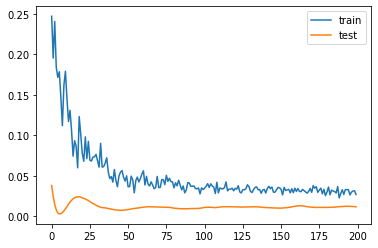

0.81082883477211
ReeceJames
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 5 samples
Epoch 1/200
20/20 [==============================] - 0s 24ms/step - loss: 0.3002 - mse: 0.3002 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 2/200
20/20 [==============================] - 0s 399us/step - loss: 0.2130 - mse: 0.2130 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 3/200
20/20 [==============================] - 0s 399us/step - loss: 0.2211 - mse: 0.2211 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 4/200
20/20 [==============================] - 0s 399us/step - loss: 0.2012 - mse: 0.2012 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 5/200
20/20 [==============================] - 0s 401us/step - loss: 0.1586 - mse: 0.1586 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 6/200
20/20 [==============================] - 0s 399us/step - loss: 0.2003 - mse: 0.2003 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 7/200
20/20 [==============================] - 0s 400us/step - loss: 0.2571 - mse: 0.2571 - val_loss: 0.0298 - val_mse: 0.0298
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 300us/step - loss: 0.0742 - mse: 0.0742 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 63/200
20/20 [==============================] - 0s 350us/step - loss: 0.0672 - mse: 0.0672 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 64/200
20/20 [==============================] - 0s 350us/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.0400 - val_mse: 0.0400
Epoch 65/200
20/20 [==============================] - 0s 350us/step - loss: 0.0673 - mse: 0.0673 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 66/200
20/20 [==============================] - 0s 350us/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0393 - val_mse: 0.0393
Epoch 67/200
20/20 [==============================] - 0s 350us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0386 - val_mse: 0.0386
Epoch 68/200
20/20 [==============================] - 0s 350us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0379 - val_mse: 0.0379
Epoch 69/200
20/20 [==============================] - 0s 350us

Epoch 123/200
20/20 [==============================] - 0s 400us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 124/200
20/20 [==============================] - 0s 350us/step - loss: 0.0718 - mse: 0.0718 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 125/200
20/20 [==============================] - 0s 300us/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 126/200
20/20 [==============================] - 0s 350us/step - loss: 0.0691 - mse: 0.0691 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0669 - mse: 0.0669 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 128/200
20/20 [==============================] - 0s 350us/step - loss: 0.0755 - mse: 0.0755 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 129/200
20/20 [==============================] - 0s 350us/step - loss: 0.0711 - mse: 0.0711 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 450us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 185/200
20/20 [==============================] - 0s 350us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 187/200
20/20 [==============================] - 0s 400us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 188/200
20/20 [==============================] - 0s 350us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 189/200
20/20 [==============================] - 0s 400us/step - loss: 0.0613 - mse: 0.0613 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 190/200
20/20 [==============================] - 0s 300us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 191/200
20/20 [==============================] - 

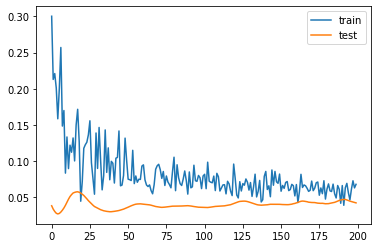

6.795911431312561
BenjaminChilwell
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 0s 4ms/step - loss: 0.1149 - mse: 0.1149 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 2/200
109/109 [==============================] - 0s 92us/step - loss: 0.0957 - mse: 0.0957 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 3/200
109/109 [==============================] - 0s 82us/step - loss: 0.1250 - mse: 0.1250 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 4/200
109/109 [==============================] - 0s 92us/step - loss: 0.1116 - mse: 0.1116 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 5/200
109/109 [==============================] - 0s 92us/step - loss: 0.0879 - mse: 0.0879 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 6/200
109/109 [==============================] - 0s 92us/step - loss: 0.0866 - mse: 0.0866 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 7/200
109/109 [==============================] - 0s 92us/step - loss: 0.0789 - mse: 0.0789 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 8/200
109/10

Epoch 62/200
109/109 [==============================] - 0s 83us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 63/200
109/109 [==============================] - 0s 83us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 64/200
109/109 [==============================] - 0s 73us/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 65/200
109/109 [==============================] - 0s 73us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 66/200
109/109 [==============================] - 0s 73us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 67/200
109/109 [==============================] - 0s 83us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 68/200
109/109 [==============================] - 0s 73us/step - loss: 0.0252 - mse: 0.0252 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 69/200
109/109 [==============================] -

Epoch 123/200
109/109 [==============================] - 0s 83us/step - loss: 0.0211 - mse: 0.0211 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 124/200
109/109 [==============================] - 0s 92us/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 125/200
109/109 [==============================] - 0s 83us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 126/200
109/109 [==============================] - 0s 83us/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 127/200
109/109 [==============================] - 0s 119us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 128/200
109/109 [==============================] - 0s 83us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 129/200
109/109 [==============================] - 0s 119us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 130/200
109/109 [=======================

Epoch 184/200
109/109 [==============================] - 0s 83us/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 185/200
109/109 [==============================] - 0s 83us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 186/200
109/109 [==============================] - 0s 73us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 187/200
109/109 [==============================] - 0s 73us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 188/200
109/109 [==============================] - 0s 73us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 189/200
109/109 [==============================] - 0s 73us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 190/200
109/109 [==============================] - 0s 83us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 191/200
109/109 [=========================

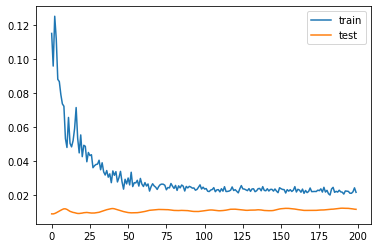

4.278271362185478
GaryCahill
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 103 samples, validate on 26 samples
Epoch 1/200
103/103 [==============================] - 1s 5ms/step - loss: 0.1027 - mse: 0.1027 - val_loss: 0.2239 - val_mse: 0.2239
Epoch 2/200
103/103 [==============================] - 0s 87us/step - loss: 0.1021 - mse: 0.1021 - val_loss: 0.2031 - val_mse: 0.2031
Epoch 3/200
103/103 [==============================] - 0s 97us/step - loss: 0.0983 - mse: 0.0983 - val_loss: 0.1825 - val_mse: 0.1825
Epoch 4/200
103/103 [==============================] - 0s 97us/step - loss: 0.0740 - mse: 0.0740 - val_loss: 0.1629 - val_mse: 0.1629
Epoch 5/200
103/103 [==============================] - 0s 107us/step - loss: 0.0828 - mse: 0.0828 - val_loss: 0.1451 - val_mse: 0.1451
Epoch 6/200
103/103 [==============================] - 0s 87us/step - loss: 0.0807 - mse: 0.0807 - val_loss: 0.1298 - val_mse: 0.1298
Epoch 7/200
103/103 [==============================] - 0s 107us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 8/200
103/

Epoch 62/200
103/103 [==============================] - 0s 97us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0877 - val_mse: 0.0877
Epoch 63/200
103/103 [==============================] - 0s 107us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0881 - val_mse: 0.0881
Epoch 64/200
103/103 [==============================] - 0s 97us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0886 - val_mse: 0.0886
Epoch 65/200
103/103 [==============================] - 0s 87us/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 66/200
103/103 [==============================] - 0s 97us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0894 - val_mse: 0.0894
Epoch 67/200
103/103 [==============================] - 0s 97us/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.0898 - val_mse: 0.0898
Epoch 68/200
103/103 [==============================] - 0s 87us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0902 - val_mse: 0.0902
Epoch 69/200
103/103 [==============================] 

Epoch 123/200
103/103 [==============================] - 0s 87us/step - loss: 0.0195 - mse: 0.0195 - val_loss: 0.0975 - val_mse: 0.0975
Epoch 124/200
103/103 [==============================] - 0s 87us/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0978 - val_mse: 0.0978
Epoch 125/200
103/103 [==============================] - 0s 97us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 126/200
103/103 [==============================] - 0s 87us/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 127/200
103/103 [==============================] - 0s 97us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 128/200
103/103 [==============================] - 0s 87us/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0978 - val_mse: 0.0978
Epoch 129/200
103/103 [==============================] - 0s 87us/step - loss: 0.0182 - mse: 0.0182 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 130/200
103/103 [=========================

Epoch 184/200
103/103 [==============================] - 0s 97us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 185/200
103/103 [==============================] - 0s 97us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 186/200
103/103 [==============================] - 0s 87us/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 187/200
103/103 [==============================] - 0s 97us/step - loss: 0.0163 - mse: 0.0163 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 188/200
103/103 [==============================] - 0s 97us/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0989 - val_mse: 0.0989
Epoch 189/200
103/103 [==============================] - 0s 78us/step - loss: 0.0157 - mse: 0.0157 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 190/200
103/103 [==============================] - 0s 87us/step - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 191/200
103/103 [=========================

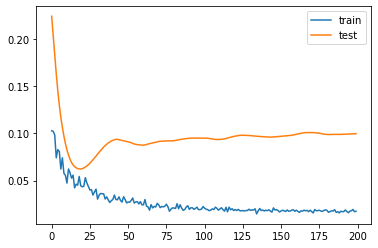

1.8078333735466006
MamadouSakho
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 12ms/step - loss: 0.5353 - mse: 0.5353 - val_loss: 0.3657 - val_mse: 0.3657
Epoch 2/200
51/51 [==============================] - 0s 157us/step - loss: 0.4520 - mse: 0.4520 - val_loss: 0.3165 - val_mse: 0.3165
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.4425 - mse: 0.4425 - val_loss: 0.2704 - val_mse: 0.2704
Epoch 4/200
51/51 [==============================] - 0s 216us/step - loss: 0.4114 - mse: 0.4114 - val_loss: 0.2279 - val_mse: 0.2279
Epoch 5/200
51/51 [==============================] - 0s 176us/step - loss: 0.2955 - mse: 0.2955 - val_loss: 0.1903 - val_mse: 0.1903
Epoch 6/200
51/51 [==============================] - 0s 176us/step - loss: 0.3685 - mse: 0.3685 - val_loss: 0.1570 - val_mse: 0.1570
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.2530 - mse: 0.2530 - val_loss: 0.1285 - val_mse: 0.1285
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0780 - mse: 0.0780 - val_loss: 0.0619 - val_mse: 0.0619
Epoch 63/200
51/51 [==============================] - 0s 196us/step - loss: 0.0765 - mse: 0.0765 - val_loss: 0.0611 - val_mse: 0.0611
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0840 - mse: 0.0840 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 65/200
51/51 [==============================] - 0s 137us/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.0599 - val_mse: 0.0599
Epoch 66/200
51/51 [==============================] - 0s 176us/step - loss: 0.0788 - mse: 0.0788 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 67/200
51/51 [==============================] - 0s 176us/step - loss: 0.0912 - mse: 0.0912 - val_loss: 0.0591 - val_mse: 0.0591
Epoch 68/200
51/51 [==============================] - 0s 157us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.0590 - val_mse: 0.0590
Epoch 69/200
51/51 [==============================] - 0s 216us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 124/200
51/51 [==============================] - 0s 235us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 126/200
51/51 [==============================] - 0s 176us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0579 - val_mse: 0.0579
Epoch 127/200
51/51 [==============================] - 0s 157us/step - loss: 0.0615 - mse: 0.0615 - val_loss: 0.0579 - val_mse: 0.0579
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 129/200
51/51 [==============================] - 0s 157us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.0579 - val_mse: 0.0579
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 186/200
51/51 [==============================] - 0s 176us/step - loss: 0.0602 - mse: 0.0602 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 188/200
51/51 [==============================] - 0s 157us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 189/200
51/51 [==============================] - 0s 196us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0570 - val_mse: 0.0570
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 191/200
51/51 [==============================] - 

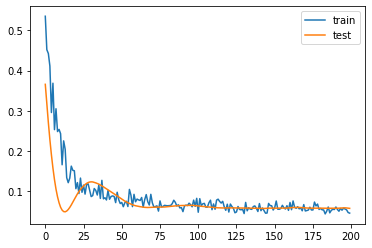

1.9633595943450926
VicenteGuaita
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 1s 11ms/step - loss: 0.4145 - mse: 0.4145 - val_loss: 0.5702 - val_mse: 0.5702
Epoch 2/200
52/52 [==============================] - 0s 192us/step - loss: 0.4427 - mse: 0.4427 - val_loss: 0.5252 - val_mse: 0.5252
Epoch 3/200
52/52 [==============================] - 0s 231us/step - loss: 0.3451 - mse: 0.3451 - val_loss: 0.4795 - val_mse: 0.4795
Epoch 4/200
52/52 [==============================] - 0s 308us/step - loss: 0.4297 - mse: 0.4297 - val_loss: 0.4315 - val_mse: 0.4315
Epoch 5/200
52/52 [==============================] - 0s 365us/step - loss: 0.3754 - mse: 0.3754 - val_loss: 0.3885 - val_mse: 0.3885
Epoch 6/200
52/52 [==============================] - 0s 250us/step - loss: 0.2952 - mse: 0.2952 - val_loss: 0.3467 - val_mse: 0.3467
Epoch 7/200
52/52 [==============================] - 0s 307us/step - loss: 0.3074 - mse: 0.3074 - val_loss: 0.3093 - val_mse: 0.3093
Epoch 8/200
52/52 [=======

Epoch 62/200
52/52 [==============================] - 0s 192us/step - loss: 0.0942 - mse: 0.0942 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 63/200
52/52 [==============================] - 0s 231us/step - loss: 0.0864 - mse: 0.0864 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 64/200
52/52 [==============================] - 0s 192us/step - loss: 0.0908 - mse: 0.0908 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 65/200
52/52 [==============================] - 0s 154us/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 66/200
52/52 [==============================] - 0s 231us/step - loss: 0.0922 - mse: 0.0922 - val_loss: 0.0821 - val_mse: 0.0821
Epoch 67/200
52/52 [==============================] - 0s 231us/step - loss: 0.0822 - mse: 0.0822 - val_loss: 0.0818 - val_mse: 0.0818
Epoch 68/200
52/52 [==============================] - 0s 192us/step - loss: 0.0889 - mse: 0.0889 - val_loss: 0.0816 - val_mse: 0.0816
Epoch 69/200
52/52 [==============================] - 0s 173us

Epoch 123/200
52/52 [==============================] - 0s 192us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 124/200
52/52 [==============================] - 0s 135us/step - loss: 0.0801 - mse: 0.0801 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 125/200
52/52 [==============================] - 0s 211us/step - loss: 0.0813 - mse: 0.0813 - val_loss: 0.0829 - val_mse: 0.0829
Epoch 126/200
52/52 [==============================] - 0s 250us/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 127/200
52/52 [==============================] - 0s 173us/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 128/200
52/52 [==============================] - 0s 154us/step - loss: 0.0748 - mse: 0.0748 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 129/200
52/52 [==============================] - 0s 154us/step - loss: 0.0667 - mse: 0.0667 - val_loss: 0.0817 - val_mse: 0.0817
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 173us/step - loss: 0.0661 - mse: 0.0661 - val_loss: 0.0786 - val_mse: 0.0786
Epoch 185/200
52/52 [==============================] - 0s 173us/step - loss: 0.0782 - mse: 0.0782 - val_loss: 0.0787 - val_mse: 0.0787
Epoch 186/200
52/52 [==============================] - 0s 231us/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0790 - val_mse: 0.0790
Epoch 187/200
52/52 [==============================] - 0s 192us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.0792 - val_mse: 0.0792
Epoch 188/200
52/52 [==============================] - 0s 173us/step - loss: 0.0727 - mse: 0.0727 - val_loss: 0.0793 - val_mse: 0.0793
Epoch 189/200
52/52 [==============================] - 0s 154us/step - loss: 0.0670 - mse: 0.0670 - val_loss: 0.0791 - val_mse: 0.0791
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0678 - mse: 0.0678 - val_loss: 0.0789 - val_mse: 0.0789
Epoch 191/200
52/52 [==============================] - 

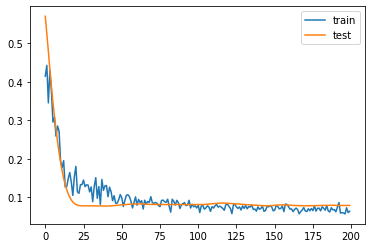

3.8690810203552246
JamesTomkins
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 1s 5ms/step - loss: 0.4131 - mse: 0.4131 - val_loss: 0.4114 - val_mse: 0.4114
Epoch 2/200
109/109 [==============================] - 0s 92us/step - loss: 0.3703 - mse: 0.3703 - val_loss: 0.3433 - val_mse: 0.3433
Epoch 3/200
109/109 [==============================] - 0s 83us/step - loss: 0.4299 - mse: 0.4299 - val_loss: 0.2812 - val_mse: 0.2812
Epoch 4/200
109/109 [==============================] - 0s 92us/step - loss: 0.4015 - mse: 0.4015 - val_loss: 0.2265 - val_mse: 0.2265
Epoch 5/200
109/109 [==============================] - 0s 83us/step - loss: 0.2953 - mse: 0.2953 - val_loss: 0.1792 - val_mse: 0.1792
Epoch 6/200
109/109 [==============================] - 0s 92us/step - loss: 0.3033 - mse: 0.3033 - val_loss: 0.1409 - val_mse: 0.1409
Epoch 7/200
109/109 [==============================] - 0s 73us/step - loss: 0.2635 - mse: 0.2635 - val_loss: 0.1107 - val_mse: 0.1107
Epoch 8/200
109/10

Epoch 62/200
109/109 [==============================] - 0s 83us/step - loss: 0.0593 - mse: 0.0593 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 63/200
109/109 [==============================] - 0s 92us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0502 - val_mse: 0.0502
Epoch 64/200
109/109 [==============================] - 0s 83us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 65/200
109/109 [==============================] - 0s 83us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 66/200
109/109 [==============================] - 0s 83us/step - loss: 0.0510 - mse: 0.0510 - val_loss: 0.0497 - val_mse: 0.0497
Epoch 67/200
109/109 [==============================] - 0s 73us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 68/200
109/109 [==============================] - 0s 73us/step - loss: 0.0515 - mse: 0.0515 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 69/200
109/109 [==============================] -

Epoch 123/200
109/109 [==============================] - 0s 92us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 124/200
109/109 [==============================] - 0s 83us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 125/200
109/109 [==============================] - 0s 83us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 126/200
109/109 [==============================] - 0s 92us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 127/200
109/109 [==============================] - 0s 83us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 128/200
109/109 [==============================] - 0s 83us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 129/200
109/109 [==============================] - 0s 92us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 130/200
109/109 [=========================

Epoch 184/200
109/109 [==============================] - 0s 83us/step - loss: 0.0357 - mse: 0.0357 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 185/200
109/109 [==============================] - 0s 83us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 186/200
109/109 [==============================] - 0s 73us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 187/200
109/109 [==============================] - 0s 83us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 188/200
109/109 [==============================] - 0s 92us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 189/200
109/109 [==============================] - 0s 83us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 190/200
109/109 [==============================] - 0s 83us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 191/200
109/109 [=========================

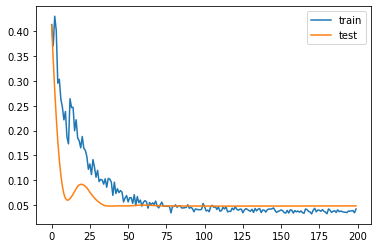

1.9350497424602509
JamesMcArthur
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 0s 4ms/step - loss: 0.1593 - mse: 0.1593 - val_loss: 0.1225 - val_mse: 0.1225
Epoch 2/200
111/111 [==============================] - 0s 81us/step - loss: 0.1761 - mse: 0.1761 - val_loss: 0.1092 - val_mse: 0.1092
Epoch 3/200
111/111 [==============================] - 0s 90us/step - loss: 0.1803 - mse: 0.1803 - val_loss: 0.0957 - val_mse: 0.0957
Epoch 4/200
111/111 [==============================] - 0s 81us/step - loss: 0.1599 - mse: 0.1599 - val_loss: 0.0841 - val_mse: 0.0841
Epoch 5/200
111/111 [==============================] - 0s 81us/step - loss: 0.1453 - mse: 0.1453 - val_loss: 0.0749 - val_mse: 0.0749
Epoch 6/200
111/111 [==============================] - 0s 90us/step - loss: 0.1602 - mse: 0.1602 - val_loss: 0.0671 - val_mse: 0.0671
Epoch 7/200
111/111 [==============================] - 0s 81us/step - loss: 0.1127 - mse: 0.1127 - val_loss: 0.0609 - val_mse: 0.0609
Epoch 8/200
111/11

Epoch 62/200
111/111 [==============================] - 0s 90us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 63/200
111/111 [==============================] - 0s 117us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 64/200
111/111 [==============================] - 0s 108us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 65/200
111/111 [==============================] - 0s 117us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 66/200
111/111 [==============================] - 0s 81us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 67/200
111/111 [==============================] - 0s 81us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 68/200
111/111 [==============================] - 0s 99us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 69/200
111/111 [==============================

Epoch 123/200
111/111 [==============================] - 0s 99us/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 124/200
111/111 [==============================] - 0s 90us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 125/200
111/111 [==============================] - 0s 90us/step - loss: 0.0295 - mse: 0.0295 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 126/200
111/111 [==============================] - 0s 81us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 127/200
111/111 [==============================] - 0s 126us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 128/200
111/111 [==============================] - 0s 99us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 129/200
111/111 [==============================] - 0s 81us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 130/200
111/111 [========================

Epoch 184/200
111/111 [==============================] - 0s 81us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0459 - val_mse: 0.0459
Epoch 185/200
111/111 [==============================] - 0s 72us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0459 - val_mse: 0.0459
Epoch 186/200
111/111 [==============================] - 0s 81us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 187/200
111/111 [==============================] - 0s 99us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 188/200
111/111 [==============================] - 0s 81us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 189/200
111/111 [==============================] - 0s 81us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 190/200
111/111 [==============================] - 0s 90us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 191/200
111/111 [=========================

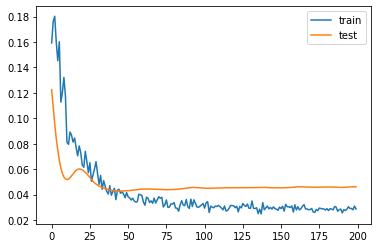

3.359643369913101
JamesMcCarthy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 105 samples, validate on 27 samples
Epoch 1/200
105/105 [==============================] - 0s 5ms/step - loss: 0.1120 - mse: 0.1120 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 2/200
105/105 [==============================] - 0s 95us/step - loss: 0.0996 - mse: 0.0996 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 3/200
105/105 [==============================] - 0s 86us/step - loss: 0.0814 - mse: 0.0814 - val_loss: 0.0577 - val_mse: 0.0577
Epoch 4/200
105/105 [==============================] - 0s 95us/step - loss: 0.1062 - mse: 0.1062 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 5/200
105/105 [==============================] - 0s 86us/step - loss: 0.0601 - mse: 0.0601 - val_loss: 0.0533 - val_mse: 0.0533
Epoch 6/200
105/105 [==============================] - 0s 95us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 7/200
105/105 [==============================] - 0s 86us/step - loss: 0.0623 - mse: 0.0623 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 8/200
105/10

Epoch 62/200
105/105 [==============================] - 0s 95us/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 63/200
105/105 [==============================] - 0s 86us/step - loss: 0.0112 - mse: 0.0112 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 64/200
105/105 [==============================] - 0s 86us/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 65/200
105/105 [==============================] - 0s 86us/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 66/200
105/105 [==============================] - 0s 86us/step - loss: 0.0100 - mse: 0.0100 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 67/200
105/105 [==============================] - 0s 95us/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 68/200
105/105 [==============================] - 0s 76us/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 69/200
105/105 [==============================] -

Epoch 123/200
105/105 [==============================] - 0s 124us/step - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 124/200
105/105 [==============================] - 0s 76us/step - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 125/200
105/105 [==============================] - 0s 76us/step - loss: 0.0066 - mse: 0.0066 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 126/200
105/105 [==============================] - 0s 95us/step - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 127/200
105/105 [==============================] - 0s 86us/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 128/200
105/105 [==============================] - 0s 76us/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 129/200
105/105 [==============================] - 0s 86us/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 130/200
105/105 [========================

Epoch 184/200
105/105 [==============================] - 0s 95us/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 185/200
105/105 [==============================] - 0s 86us/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 186/200
105/105 [==============================] - 0s 86us/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 187/200
105/105 [==============================] - 0s 86us/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 188/200
105/105 [==============================] - 0s 86us/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 189/200
105/105 [==============================] - 0s 86us/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 190/200
105/105 [==============================] - 0s 86us/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 191/200
105/105 [=========================

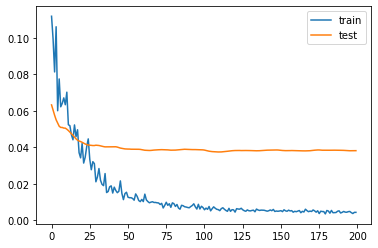

0.38375165313482285
ChristianBenteke
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 29 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.0922 - mse: 0.0922 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 2/200
112/112 [==============================] - 0s 89us/step - loss: 0.1082 - mse: 0.1082 - val_loss: 0.0887 - val_mse: 0.0887
Epoch 3/200
112/112 [==============================] - 0s 89us/step - loss: 0.0816 - mse: 0.0816 - val_loss: 0.0893 - val_mse: 0.0893
Epoch 4/200
112/112 [==============================] - 0s 89us/step - loss: 0.0707 - mse: 0.0707 - val_loss: 0.0897 - val_mse: 0.0897
Epoch 5/200
112/112 [==============================] - 0s 71us/step - loss: 0.0707 - mse: 0.0707 - val_loss: 0.0893 - val_mse: 0.0893
Epoch 6/200
112/112 [==============================] - 0s 80us/step - loss: 0.0612 - mse: 0.0612 - val_loss: 0.0891 - val_mse: 0.0891
Epoch 7/200
112/112 [==============================] - 0s 80us/step - loss: 0.0731 - mse: 0.0731 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 8/200
112/11

Epoch 62/200
112/112 [==============================] - 0s 80us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0878 - val_mse: 0.0878
Epoch 63/200
112/112 [==============================] - 0s 80us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0875 - val_mse: 0.0875
Epoch 64/200
112/112 [==============================] - 0s 80us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0870 - val_mse: 0.0870
Epoch 65/200
112/112 [==============================] - 0s 71us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0866 - val_mse: 0.0866
Epoch 66/200
112/112 [==============================] - 0s 89us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0862 - val_mse: 0.0862
Epoch 67/200
112/112 [==============================] - 0s 80us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.0858 - val_mse: 0.0858
Epoch 68/200
112/112 [==============================] - 0s 80us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0854 - val_mse: 0.0854
Epoch 69/200
112/112 [==============================] -

Epoch 123/200
112/112 [==============================] - 0s 80us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0855 - val_mse: 0.0855
Epoch 124/200
112/112 [==============================] - 0s 89us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0851 - val_mse: 0.0851
Epoch 125/200
112/112 [==============================] - 0s 80us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0849 - val_mse: 0.0849
Epoch 126/200
112/112 [==============================] - 0s 80us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0847 - val_mse: 0.0847
Epoch 127/200
112/112 [==============================] - 0s 89us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0846 - val_mse: 0.0846
Epoch 128/200
112/112 [==============================] - 0s 80us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0845 - val_mse: 0.0845
Epoch 129/200
112/112 [==============================] - 0s 71us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0844 - val_mse: 0.0844
Epoch 130/200
112/112 [=========================

Epoch 184/200
112/112 [==============================] - 0s 71us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 185/200
112/112 [==============================] - 0s 89us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 186/200
112/112 [==============================] - 0s 71us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0830 - val_mse: 0.0830
Epoch 187/200
112/112 [==============================] - 0s 71us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 188/200
112/112 [==============================] - 0s 80us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 189/200
112/112 [==============================] - 0s 80us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 190/200
112/112 [==============================] - 0s 62us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 191/200
112/112 [=========================

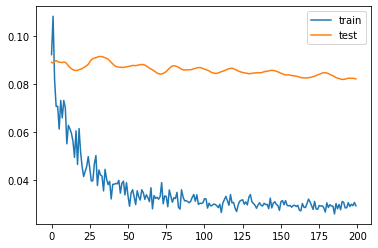

2.4324005842208862
CheikhouKouyaté
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.1306 - mse: 0.1306 - val_loss: 0.0683 - val_mse: 0.0683
Epoch 2/200
112/112 [==============================] - 0s 71us/step - loss: 0.0901 - mse: 0.0901 - val_loss: 0.0600 - val_mse: 0.0600
Epoch 3/200
112/112 [==============================] - 0s 80us/step - loss: 0.0967 - mse: 0.0967 - val_loss: 0.0533 - val_mse: 0.0533
Epoch 4/200
112/112 [==============================] - 0s 89us/step - loss: 0.0964 - mse: 0.0964 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 5/200
112/112 [==============================] - 0s 80us/step - loss: 0.0822 - mse: 0.0822 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 6/200
112/112 [==============================] - 0s 80us/step - loss: 0.0673 - mse: 0.0673 - val_loss: 0.0416 - val_mse: 0.0416
Epoch 7/200
112/112 [==============================] - 0s 89us/step - loss: 0.0796 - mse: 0.0796 - val_loss: 0.0395 - val_mse: 0.0395
Epoch 8/200
112/11

Epoch 62/200
112/112 [==============================] - 0s 71us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 63/200
112/112 [==============================] - 0s 80us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 64/200
112/112 [==============================] - 0s 80us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 65/200
112/112 [==============================] - 0s 71us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 66/200
112/112 [==============================] - 0s 80us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0346 - val_mse: 0.0346
Epoch 67/200
112/112 [==============================] - 0s 71us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0346 - val_mse: 0.0346
Epoch 68/200
112/112 [==============================] - 0s 71us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0346 - val_mse: 0.0346
Epoch 69/200
112/112 [==============================] -

Epoch 123/200
112/112 [==============================] - 0s 80us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 124/200
112/112 [==============================] - 0s 71us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 125/200
112/112 [==============================] - 0s 80us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 126/200
112/112 [==============================] - 0s 80us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 127/200
112/112 [==============================] - 0s 80us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 128/200
112/112 [==============================] - 0s 80us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 129/200
112/112 [==============================] - 0s 80us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 130/200
112/112 [=========================

Epoch 184/200
112/112 [==============================] - 0s 80us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 185/200
112/112 [==============================] - 0s 71us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 186/200
112/112 [==============================] - 0s 80us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 187/200
112/112 [==============================] - 0s 89us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 188/200
112/112 [==============================] - 0s 71us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 189/200
112/112 [==============================] - 0s 80us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 190/200
112/112 [==============================] - 0s 80us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 191/200
112/112 [=========================

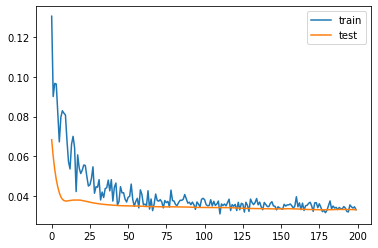

2.4861859381198883
JoelWard
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 5ms/step - loss: 0.1726 - mse: 0.1726 - val_loss: 0.1184 - val_mse: 0.1184
Epoch 2/200
111/111 [==============================] - 0s 90us/step - loss: 0.1523 - mse: 0.1523 - val_loss: 0.1012 - val_mse: 0.1012
Epoch 3/200
111/111 [==============================] - 0s 81us/step - loss: 0.1295 - mse: 0.1295 - val_loss: 0.0877 - val_mse: 0.0877
Epoch 4/200
111/111 [==============================] - 0s 90us/step - loss: 0.1634 - mse: 0.1634 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 5/200
111/111 [==============================] - 0s 81us/step - loss: 0.1517 - mse: 0.1517 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 6/200
111/111 [==============================] - 0s 81us/step - loss: 0.1558 - mse: 0.1558 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 7/200
111/111 [==============================] - 0s 90us/step - loss: 0.1351 - mse: 0.1351 - val_loss: 0.0628 - val_mse: 0.0628
Epoch 8/200
111/11

Epoch 62/200
111/111 [==============================] - 0s 72us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0670 - val_mse: 0.0670
Epoch 63/200
111/111 [==============================] - 0s 90us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0668 - val_mse: 0.0668
Epoch 64/200
111/111 [==============================] - 0s 81us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0667 - val_mse: 0.0667
Epoch 65/200
111/111 [==============================] - 0s 81us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0668 - val_mse: 0.0668
Epoch 66/200
111/111 [==============================] - 0s 90us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0669 - val_mse: 0.0669
Epoch 67/200
111/111 [==============================] - 0s 81us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0673 - val_mse: 0.0673
Epoch 68/200
111/111 [==============================] - 0s 81us/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0677 - val_mse: 0.0677
Epoch 69/200
111/111 [==============================] -

Epoch 123/200
111/111 [==============================] - 0s 90us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0682 - val_mse: 0.0682
Epoch 124/200
111/111 [==============================] - 0s 81us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0684 - val_mse: 0.0684
Epoch 125/200
111/111 [==============================] - 0s 81us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0685 - val_mse: 0.0685
Epoch 126/200
111/111 [==============================] - 0s 90us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0684 - val_mse: 0.0684
Epoch 127/200
111/111 [==============================] - 0s 72us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0684 - val_mse: 0.0684
Epoch 128/200
111/111 [==============================] - 0s 81us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0682 - val_mse: 0.0682
Epoch 129/200
111/111 [==============================] - 0s 81us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0681 - val_mse: 0.0681
Epoch 130/200
111/111 [=========================

Epoch 184/200
111/111 [==============================] - 0s 90us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0679 - val_mse: 0.0679
Epoch 185/200
111/111 [==============================] - 0s 90us/step - loss: 0.0357 - mse: 0.0357 - val_loss: 0.0681 - val_mse: 0.0681
Epoch 186/200
111/111 [==============================] - 0s 90us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0683 - val_mse: 0.0683
Epoch 187/200
111/111 [==============================] - 0s 90us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0684 - val_mse: 0.0684
Epoch 188/200
111/111 [==============================] - 0s 90us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0686 - val_mse: 0.0686
Epoch 189/200
111/111 [==============================] - 0s 81us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0686 - val_mse: 0.0686
Epoch 190/200
111/111 [==============================] - 0s 90us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0687 - val_mse: 0.0687
Epoch 191/200
111/111 [=========================

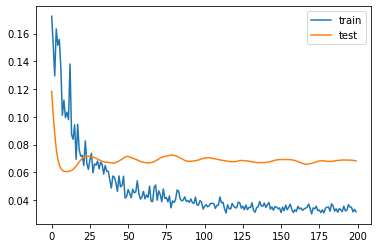

1.6319530606269834
MartinKelly
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 1s 5ms/step - loss: 0.1663 - mse: 0.1663 - val_loss: 0.0655 - val_mse: 0.0655
Epoch 2/200
112/112 [==============================] - 0s 89us/step - loss: 0.1720 - mse: 0.1720 - val_loss: 0.0533 - val_mse: 0.0533
Epoch 3/200
112/112 [==============================] - 0s 80us/step - loss: 0.1728 - mse: 0.1728 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 4/200
112/112 [==============================] - 0s 116us/step - loss: 0.1277 - mse: 0.1277 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 5/200
112/112 [==============================] - 0s 98us/step - loss: 0.1433 - mse: 0.1433 - val_loss: 0.0369 - val_mse: 0.0369
Epoch 6/200
112/112 [==============================] - 0s 89us/step - loss: 0.1374 - mse: 0.1374 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 7/200
112/112 [==============================] - 0s 80us/step - loss: 0.1341 - mse: 0.1341 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 8/200
112/1

Epoch 62/200
112/112 [==============================] - 0s 71us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 63/200
112/112 [==============================] - 0s 107us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 64/200
112/112 [==============================] - 0s 89us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 65/200
112/112 [==============================] - 0s 98us/step - loss: 0.0475 - mse: 0.0475 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 66/200
112/112 [==============================] - 0s 89us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 67/200
112/112 [==============================] - 0s 89us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 68/200
112/112 [==============================] - 0s 98us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0291 - val_mse: 0.0291
Epoch 69/200
112/112 [==============================] 

Epoch 123/200
112/112 [==============================] - 0s 71us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 124/200
112/112 [==============================] - 0s 89us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0297 - val_mse: 0.0297
Epoch 125/200
112/112 [==============================] - 0s 98us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0298 - val_mse: 0.0298
Epoch 126/200
112/112 [==============================] - 0s 89us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0299 - val_mse: 0.0299
Epoch 127/200
112/112 [==============================] - 0s 89us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0300 - val_mse: 0.0300
Epoch 128/200
112/112 [==============================] - 0s 107us/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 129/200
112/112 [==============================] - 0s 89us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0302 - val_mse: 0.0302
Epoch 130/200
112/112 [========================

Epoch 184/200
112/112 [==============================] - 0s 80us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 185/200
112/112 [==============================] - 0s 89us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 186/200
112/112 [==============================] - 0s 116us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 187/200
112/112 [==============================] - 0s 80us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 188/200
112/112 [==============================] - 0s 161us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 189/200
112/112 [==============================] - 0s 80us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 190/200
112/112 [==============================] - 0s 80us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 191/200
112/112 [=======================

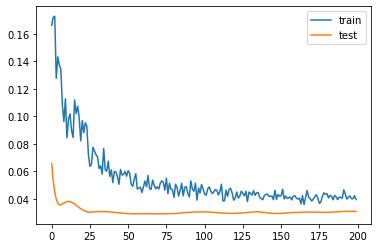

1.306661665439606
AndrosTownsend
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 1s 5ms/step - loss: 0.1376 - mse: 0.1376 - val_loss: 0.0782 - val_mse: 0.0782
Epoch 2/200
112/112 [==============================] - 0s 80us/step - loss: 0.1502 - mse: 0.1502 - val_loss: 0.0728 - val_mse: 0.0728
Epoch 3/200
112/112 [==============================] - 0s 116us/step - loss: 0.1181 - mse: 0.1181 - val_loss: 0.0694 - val_mse: 0.0694
Epoch 4/200
112/112 [==============================] - 0s 125us/step - loss: 0.1086 - mse: 0.1086 - val_loss: 0.0674 - val_mse: 0.0674
Epoch 5/200
112/112 [==============================] - 0s 232us/step - loss: 0.1402 - mse: 0.1402 - val_loss: 0.0664 - val_mse: 0.0664
Epoch 6/200
112/112 [==============================] - 0s 89us/step - loss: 0.0984 - mse: 0.0984 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 7/200
112/112 [==============================] - 0s 89us/step - loss: 0.1046 - mse: 0.1046 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 8/200
112

Epoch 62/200
112/112 [==============================] - 0s 89us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0579 - val_mse: 0.0579
Epoch 63/200
112/112 [==============================] - 0s 71us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0578 - val_mse: 0.0578
Epoch 64/200
112/112 [==============================] - 0s 71us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0577 - val_mse: 0.0577
Epoch 65/200
112/112 [==============================] - 0s 80us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0577 - val_mse: 0.0577
Epoch 66/200
112/112 [==============================] - 0s 80us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 67/200
112/112 [==============================] - 0s 71us/step - loss: 0.0497 - mse: 0.0497 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 68/200
112/112 [==============================] - 0s 89us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 69/200
112/112 [==============================] -

Epoch 123/200
112/112 [==============================] - 0s 80us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 124/200
112/112 [==============================] - 0s 98us/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 125/200
112/112 [==============================] - 0s 98us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0570 - val_mse: 0.0570
Epoch 126/200
112/112 [==============================] - 0s 80us/step - loss: 0.0409 - mse: 0.0409 - val_loss: 0.0570 - val_mse: 0.0570
Epoch 127/200
112/112 [==============================] - 0s 89us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 128/200
112/112 [==============================] - 0s 89us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 129/200
112/112 [==============================] - 0s 89us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 130/200
112/112 [=========================

Epoch 184/200
112/112 [==============================] - 0s 98us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 185/200
112/112 [==============================] - 0s 80us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 186/200
112/112 [==============================] - 0s 71us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 187/200
112/112 [==============================] - 0s 89us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 188/200
112/112 [==============================] - 0s 98us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 189/200
112/112 [==============================] - 0s 98us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 190/200
112/112 [==============================] - 0s 89us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0576 - val_mse: 0.0576
Epoch 191/200
112/112 [=========================

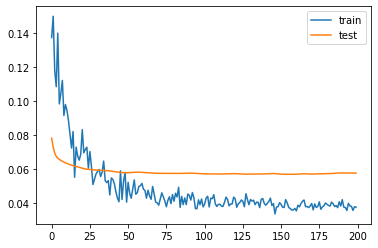

3.7744388580322266
LukaMilivojevic
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 92 samples, validate on 23 samples
Epoch 1/200
92/92 [==============================] - 1s 6ms/step - loss: 0.1338 - mse: 0.1338 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 2/200
92/92 [==============================] - 0s 109us/step - loss: 0.1275 - mse: 0.1275 - val_loss: 0.0530 - val_mse: 0.0530
Epoch 3/200
92/92 [==============================] - 0s 141us/step - loss: 0.1176 - mse: 0.1176 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 4/200
92/92 [==============================] - 0s 119us/step - loss: 0.1119 - mse: 0.1119 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 5/200
92/92 [==============================] - 0s 98us/step - loss: 0.1258 - mse: 0.1258 - val_loss: 0.0513 - val_mse: 0.0513
Epoch 6/200
92/92 [==============================] - 0s 130us/step - loss: 0.1068 - mse: 0.1068 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 7/200
92/92 [==============================] - 0s 109us/step - loss: 0.1116 - mse: 0.1116 - val_loss: 0.0524 - val_mse: 0.0524
Epoch 8/200
92/92 [=========

Epoch 63/200
92/92 [==============================] - 0s 109us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 64/200
92/92 [==============================] - 0s 87us/step - loss: 0.0567 - mse: 0.0567 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 65/200
92/92 [==============================] - 0s 98us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 66/200
92/92 [==============================] - 0s 87us/step - loss: 0.0600 - mse: 0.0600 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 67/200
92/92 [==============================] - 0s 98us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 68/200
92/92 [==============================] - 0s 109us/step - loss: 0.0594 - mse: 0.0594 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 69/200
92/92 [==============================] - 0s 98us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 70/200
92/92 [==============================] - 0s 98us/step 

Epoch 125/200
92/92 [==============================] - 0s 119us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 126/200
92/92 [==============================] - 0s 119us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 127/200
92/92 [==============================] - 0s 98us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 128/200
92/92 [==============================] - 0s 109us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 129/200
92/92 [==============================] - 0s 119us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 130/200
92/92 [==============================] - 0s 98us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 131/200
92/92 [==============================] - 0s 98us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 132/200
92/92 [==============================] - 0s 

Epoch 186/200
92/92 [==============================] - 0s 130us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 187/200
92/92 [==============================] - 0s 119us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 188/200
92/92 [==============================] - 0s 87us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 189/200
92/92 [==============================] - 0s 109us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 190/200
92/92 [==============================] - 0s 109us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 191/200
92/92 [==============================] - 0s 109us/step - loss: 0.0432 - mse: 0.0432 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 192/200
92/92 [==============================] - 0s 109us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 193/200
92/92 [==============================] - 0

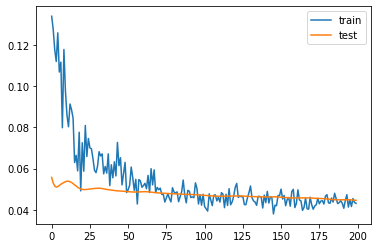

3.4975180625915527
Patrickvan Aanholt
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 81 samples, validate on 21 samples
Epoch 1/200
81/81 [==============================] - 1s 7ms/step - loss: 0.1704 - mse: 0.1704 - val_loss: 0.0511 - val_mse: 0.0511
Epoch 2/200
81/81 [==============================] - 0s 111us/step - loss: 0.1669 - mse: 0.1669 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 3/200
81/81 [==============================] - 0s 123us/step - loss: 0.1472 - mse: 0.1472 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 4/200
81/81 [==============================] - 0s 111us/step - loss: 0.1239 - mse: 0.1239 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 5/200
81/81 [==============================] - 0s 111us/step - loss: 0.0957 - mse: 0.0957 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 6/200
81/81 [==============================] - 0s 123us/step - loss: 0.1067 - mse: 0.1067 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 7/200
81/81 [==============================] - 0s 148us/step - loss: 0.0937 - mse: 0.0937 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 8/200
81/81 [========

Epoch 62/200
81/81 [==============================] - 0s 136us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 63/200
81/81 [==============================] - 0s 136us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 64/200
81/81 [==============================] - 0s 111us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 65/200
81/81 [==============================] - 0s 222us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 66/200
81/81 [==============================] - 0s 111us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 67/200
81/81 [==============================] - 0s 99us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 68/200
81/81 [==============================] - 0s 148us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 69/200
81/81 [==============================] - 0s 86us/s

81/81 [==============================] - 0s 111us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 124/200
81/81 [==============================] - 0s 123us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 125/200
81/81 [==============================] - 0s 111us/step - loss: 0.0302 - mse: 0.0302 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 126/200
81/81 [==============================] - 0s 136us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 127/200
81/81 [==============================] - 0s 111us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 128/200
81/81 [==============================] - 0s 111us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 129/200
81/81 [==============================] - 0s 99us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 130/200
81/81 [==============================] - 0s 111us/step -

Epoch 184/200
81/81 [==============================] - 0s 148us/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 185/200
81/81 [==============================] - 0s 111us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0353 - val_mse: 0.0353
Epoch 186/200
81/81 [==============================] - 0s 123us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 187/200
81/81 [==============================] - 0s 111us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 188/200
81/81 [==============================] - 0s 111us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 189/200
81/81 [==============================] - 0s 99us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 190/200
81/81 [==============================] - 0s 123us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 191/200
81/81 [==============================] - 0

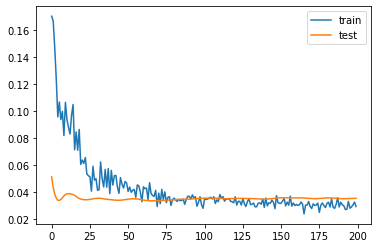

4.20606005191803
JordanAyew
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 92 samples, validate on 24 samples
Epoch 1/200
92/92 [==============================] - 1s 6ms/step - loss: 0.2222 - mse: 0.2222 - val_loss: 0.1568 - val_mse: 0.1568
Epoch 2/200
92/92 [==============================] - 0s 120us/step - loss: 0.1538 - mse: 0.1538 - val_loss: 0.1358 - val_mse: 0.1358
Epoch 3/200
92/92 [==============================] - 0s 109us/step - loss: 0.1331 - mse: 0.1331 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 4/200
92/92 [==============================] - 0s 130us/step - loss: 0.1463 - mse: 0.1463 - val_loss: 0.1001 - val_mse: 0.1001
Epoch 5/200
92/92 [==============================] - 0s 109us/step - loss: 0.1263 - mse: 0.1263 - val_loss: 0.0851 - val_mse: 0.0851
Epoch 6/200
92/92 [==============================] - 0s 119us/step - loss: 0.1063 - mse: 0.1063 - val_loss: 0.0721 - val_mse: 0.0721
Epoch 7/200
92/92 [==============================] - 0s 109us/step - loss: 0.1041 - mse: 0.1041 - val_loss: 0.0609 - val_mse: 0.0609
Epoch 8/200
92/92 [========

Epoch 62/200
92/92 [==============================] - 0s 109us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 63/200
92/92 [==============================] - 0s 98us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 64/200
92/92 [==============================] - 0s 119us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 65/200
92/92 [==============================] - 0s 98us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 66/200
92/92 [==============================] - 0s 87us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 67/200
92/92 [==============================] - 0s 109us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 68/200
92/92 [==============================] - 0s 141us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 69/200
92/92 [==============================] - 0s 119us/st

Epoch 124/200
92/92 [==============================] - 0s 109us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 125/200
92/92 [==============================] - 0s 109us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 126/200
92/92 [==============================] - 0s 109us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 127/200
92/92 [==============================] - 0s 87us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 128/200
92/92 [==============================] - 0s 98us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 129/200
92/92 [==============================] - 0s 109us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 130/200
92/92 [==============================] - 0s 130us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 131/200
92/92 [==============================] - 0s

Epoch 185/200
92/92 [==============================] - 0s 98us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 186/200
92/92 [==============================] - 0s 98us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 187/200
92/92 [==============================] - 0s 98us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 188/200
92/92 [==============================] - 0s 109us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 189/200
92/92 [==============================] - 0s 119us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 190/200
92/92 [==============================] - 0s 98us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 191/200
92/92 [==============================] - 0s 130us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 192/200
92/92 [==============================] - 0s 9

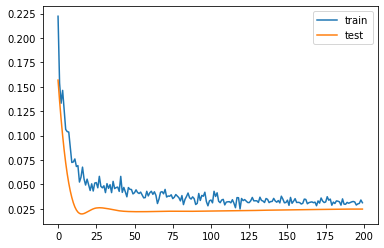

2.402758061885834
WilfriedZaha
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 5ms/step - loss: 0.1821 - mse: 0.1821 - val_loss: 0.1029 - val_mse: 0.1029
Epoch 2/200
111/111 [==============================] - 0s 90us/step - loss: 0.1325 - mse: 0.1325 - val_loss: 0.0913 - val_mse: 0.0913
Epoch 3/200
111/111 [==============================] - 0s 90us/step - loss: 0.1377 - mse: 0.1377 - val_loss: 0.0830 - val_mse: 0.0830
Epoch 4/200
111/111 [==============================] - 0s 108us/step - loss: 0.1375 - mse: 0.1375 - val_loss: 0.0777 - val_mse: 0.0777
Epoch 5/200
111/111 [==============================] - 0s 90us/step - loss: 0.1385 - mse: 0.1385 - val_loss: 0.0748 - val_mse: 0.0748
Epoch 6/200
111/111 [==============================] - 0s 81us/step - loss: 0.1499 - mse: 0.1499 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 7/200
111/111 [==============================] - 0s 90us/step - loss: 0.1115 - mse: 0.1115 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 8/200
111/1

Epoch 62/200
111/111 [==============================] - 0s 90us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 63/200
111/111 [==============================] - 0s 72us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0641 - val_mse: 0.0641
Epoch 64/200
111/111 [==============================] - 0s 99us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0641 - val_mse: 0.0641
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0641 - val_mse: 0.0641
Epoch 66/200
111/111 [==============================] - 0s 90us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0641 - val_mse: 0.0641
Epoch 67/200
111/111 [==============================] - 0s 90us/step - loss: 0.0448 - mse: 0.0448 - val_loss: 0.0641 - val_mse: 0.0641
Epoch 68/200
111/111 [==============================] - 0s 108us/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.0640 - val_mse: 0.0640
Epoch 69/200
111/111 [==============================] 

Epoch 123/200
111/111 [==============================] - 0s 90us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 124/200
111/111 [==============================] - 0s 99us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 125/200
111/111 [==============================] - 0s 135us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 126/200
111/111 [==============================] - 0s 90us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 127/200
111/111 [==============================] - 0s 90us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 128/200
111/111 [==============================] - 0s 126us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 129/200
111/111 [==============================] - 0s 108us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 130/200
111/111 [======================

Epoch 184/200
111/111 [==============================] - 0s 99us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 185/200
111/111 [==============================] - 0s 81us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0626 - val_mse: 0.0626
Epoch 186/200
111/111 [==============================] - 0s 90us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0625 - val_mse: 0.0625
Epoch 187/200
111/111 [==============================] - 0s 90us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0624 - val_mse: 0.0624
Epoch 188/200
111/111 [==============================] - 0s 99us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0623 - val_mse: 0.0623
Epoch 189/200
111/111 [==============================] - 0s 81us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 190/200
111/111 [==============================] - 0s 81us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0621 - val_mse: 0.0621
Epoch 191/200
111/111 [=========================

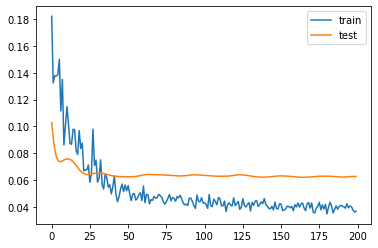

3.4773130416870117
JeffreySchlupp
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 1s 7ms/step - loss: 0.1343 - mse: 0.1343 - val_loss: 0.0300 - val_mse: 0.0300
Epoch 2/200
80/80 [==============================] - 0s 150us/step - loss: 0.0960 - mse: 0.0960 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.0920 - mse: 0.0920 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 4/200
80/80 [==============================] - 0s 112us/step - loss: 0.0831 - mse: 0.0831 - val_loss: 0.0164 - val_mse: 0.0164
Epoch 5/200
80/80 [==============================] - 0s 112us/step - loss: 0.0924 - mse: 0.0924 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 6/200
80/80 [==============================] - 0s 112us/step - loss: 0.0711 - mse: 0.0711 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 7/200
80/80 [==============================] - 0s 125us/step - loss: 0.0639 - mse: 0.0639 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 100us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 63/200
80/80 [==============================] - 0s 137us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 64/200
80/80 [==============================] - 0s 87us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 66/200
80/80 [==============================] - 0s 112us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 67/200
80/80 [==============================] - 0s 100us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 68/200
80/80 [==============================] - 0s 112us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 69/200
80/80 [==============================] - 0s 112us/

Epoch 123/200
80/80 [==============================] - 0s 150us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 124/200
80/80 [==============================] - 0s 125us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 126/200
80/80 [==============================] - 0s 112us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 128/200
80/80 [==============================] - 0s 137us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 129/200
80/80 [==============================] - 0s 100us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 112us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 185/200
80/80 [==============================] - 0s 387us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 187/200
80/80 [==============================] - 0s 375us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 188/200
80/80 [==============================] - 0s 125us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 189/200
80/80 [==============================] - 0s 100us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 191/200
80/80 [==============================] - 

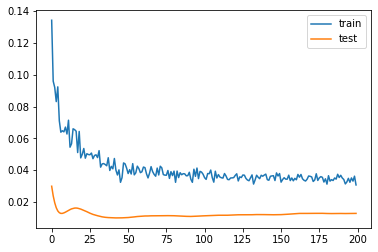

1.8158742189407349
MaxMeyer
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 12ms/step - loss: 0.1286 - mse: 0.1286 - val_loss: 0.0346 - val_mse: 0.0346
Epoch 2/200
51/51 [==============================] - 0s 157us/step - loss: 0.1307 - mse: 0.1307 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.1522 - mse: 0.1522 - val_loss: 0.0329 - val_mse: 0.0329
Epoch 4/200
51/51 [==============================] - 0s 216us/step - loss: 0.1430 - mse: 0.1430 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 5/200
51/51 [==============================] - 0s 196us/step - loss: 0.1208 - mse: 0.1208 - val_loss: 0.0321 - val_mse: 0.0321
Epoch 6/200
51/51 [==============================] - 0s 157us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 7/200
51/51 [==============================] - 0s 196us/step - loss: 0.1182 - mse: 0.1182 - val_loss: 0.0321 - val_mse: 0.0321
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0278 - val_mse: 0.0278
Epoch 63/200
51/51 [==============================] - 0s 157us/step - loss: 0.0728 - mse: 0.0728 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 65/200
51/51 [==============================] - 0s 176us/step - loss: 0.0565 - mse: 0.0565 - val_loss: 0.0280 - val_mse: 0.0280
Epoch 66/200
51/51 [==============================] - 0s 157us/step - loss: 0.0617 - mse: 0.0617 - val_loss: 0.0280 - val_mse: 0.0280
Epoch 67/200
51/51 [==============================] - 0s 176us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.0280 - val_mse: 0.0280
Epoch 68/200
51/51 [==============================] - 0s 157us/step - loss: 0.0656 - mse: 0.0656 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 69/200
51/51 [==============================] - 0s 157us

Epoch 123/200
51/51 [==============================] - 0s 196us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 124/200
51/51 [==============================] - 0s 137us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 127/200
51/51 [==============================] - 0s 176us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 128/200
51/51 [==============================] - 0s 157us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 129/200
51/51 [==============================] - 0s 196us/step - loss: 0.0570 - mse: 0.0570 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 187/200
51/51 [==============================] - 0s 216us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0297 - val_mse: 0.0297
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0298 - val_mse: 0.0298
Epoch 191/200
51/51 [==============================] - 

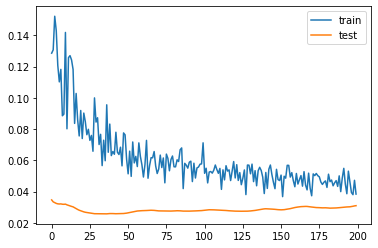

1.2386605739593506
JairoRiedewald
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 77 samples, validate on 20 samples
Epoch 1/200
77/77 [==============================] - 1s 8ms/step - loss: 0.0856 - mse: 0.0856 - val_loss: 0.0788 - val_mse: 0.0788
Epoch 2/200
77/77 [==============================] - 0s 130us/step - loss: 0.0848 - mse: 0.0848 - val_loss: 0.0798 - val_mse: 0.0798
Epoch 3/200
77/77 [==============================] - 0s 169us/step - loss: 0.0796 - mse: 0.0796 - val_loss: 0.0806 - val_mse: 0.0806
Epoch 4/200
77/77 [==============================] - 0s 169us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0814 - val_mse: 0.0814
Epoch 5/200
77/77 [==============================] - 0s 143us/step - loss: 0.0782 - mse: 0.0782 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 6/200
77/77 [==============================] - 0s 131us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 7/200
77/77 [==============================] - 0s 143us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0830 - val_mse: 0.0830
Epoch 8/200
77/77 [========

Epoch 62/200
77/77 [==============================] - 0s 104us/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0927 - val_mse: 0.0927
Epoch 63/200
77/77 [==============================] - 0s 104us/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 64/200
77/77 [==============================] - 0s 143us/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 65/200
77/77 [==============================] - 0s 106us/step - loss: 0.0117 - mse: 0.0117 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 66/200
77/77 [==============================] - 0s 117us/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0927 - val_mse: 0.0927
Epoch 67/200
77/77 [==============================] - 0s 143us/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 68/200
77/77 [==============================] - 0s 104us/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.0929 - val_mse: 0.0929
Epoch 69/200
77/77 [==============================] - 0s 104us

Epoch 123/200
77/77 [==============================] - 0s 117us/step - loss: 0.0109 - mse: 0.0109 - val_loss: 0.0945 - val_mse: 0.0945
Epoch 124/200
77/77 [==============================] - 0s 117us/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0947 - val_mse: 0.0947
Epoch 125/200
77/77 [==============================] - 0s 104us/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0948 - val_mse: 0.0948
Epoch 126/200
77/77 [==============================] - 0s 130us/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0948 - val_mse: 0.0948
Epoch 127/200
77/77 [==============================] - 0s 130us/step - loss: 0.0109 - mse: 0.0109 - val_loss: 0.0948 - val_mse: 0.0948
Epoch 128/200
77/77 [==============================] - 0s 117us/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0947 - val_mse: 0.0947
Epoch 129/200
77/77 [==============================] - 0s 117us/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0944 - val_mse: 0.0944
Epoch 130/200
77/77 [==============================] - 

Epoch 184/200
77/77 [==============================] - 0s 130us/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0955 - val_mse: 0.0955
Epoch 185/200
77/77 [==============================] - 0s 104us/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0958 - val_mse: 0.0958
Epoch 186/200
77/77 [==============================] - 0s 104us/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0960 - val_mse: 0.0960
Epoch 187/200
77/77 [==============================] - 0s 130us/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0963 - val_mse: 0.0963
Epoch 188/200
77/77 [==============================] - 0s 104us/step - loss: 0.0079 - mse: 0.0079 - val_loss: 0.0965 - val_mse: 0.0965
Epoch 189/200
77/77 [==============================] - 0s 104us/step - loss: 0.0076 - mse: 0.0076 - val_loss: 0.0965 - val_mse: 0.0965
Epoch 190/200
77/77 [==============================] - 0s 143us/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0966 - val_mse: 0.0966
Epoch 191/200
77/77 [==============================] - 

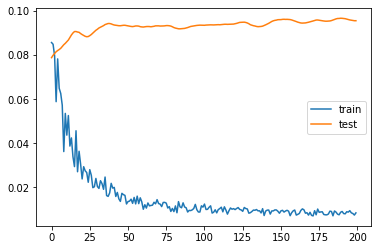

0.2740415632724762
ScottDann
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 1s 5ms/step - loss: 0.0786 - mse: 0.0786 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 2/200
108/108 [==============================] - 0s 93us/step - loss: 0.0747 - mse: 0.0747 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 3/200
108/108 [==============================] - 0s 102us/step - loss: 0.0936 - mse: 0.0936 - val_loss: 0.0479 - val_mse: 0.0479
Epoch 4/200
108/108 [==============================] - 0s 102us/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.0459 - val_mse: 0.0459
Epoch 5/200
108/108 [==============================] - 0s 194us/step - loss: 0.0861 - mse: 0.0861 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 6/200
108/108 [==============================] - 0s 194us/step - loss: 0.0944 - mse: 0.0944 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 7/200
108/108 [==============================] - 0s 120us/step - loss: 0.0903 - mse: 0.0903 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 8/200
1

Epoch 62/200
108/108 [==============================] - 0s 102us/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 63/200
108/108 [==============================] - 0s 93us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 64/200
108/108 [==============================] - 0s 93us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 66/200
108/108 [==============================] - 0s 83us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 67/200
108/108 [==============================] - 0s 102us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 68/200
108/108 [==============================] - 0s 74us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 69/200
108/108 [==============================]

Epoch 123/200
108/108 [==============================] - 0s 93us/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 124/200
108/108 [==============================] - 0s 93us/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 125/200
108/108 [==============================] - 0s 102us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 126/200
108/108 [==============================] - 0s 102us/step - loss: 0.0190 - mse: 0.0190 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 127/200
108/108 [==============================] - 0s 83us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 128/200
108/108 [==============================] - 0s 93us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 129/200
108/108 [==============================] - 0s 102us/step - loss: 0.0197 - mse: 0.0197 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 130/200
108/108 [======================

Epoch 184/200
108/108 [==============================] - 0s 93us/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 186/200
108/108 [==============================] - 0s 83us/step - loss: 0.0194 - mse: 0.0194 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 187/200
108/108 [==============================] - 0s 93us/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 188/200
108/108 [==============================] - 0s 102us/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 189/200
108/108 [==============================] - 0s 102us/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 190/200
108/108 [==============================] - 0s 93us/step - loss: 0.0169 - mse: 0.0169 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 191/200
108/108 [======================

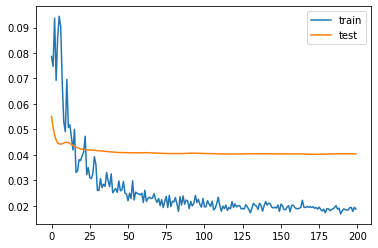

1.1228210851550102
TheoWalcott
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 9ms/step - loss: 0.1819 - mse: 0.1819 - val_loss: 0.0299 - val_mse: 0.0299
Epoch 2/200
52/52 [==============================] - 0s 173us/step - loss: 0.1889 - mse: 0.1889 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 3/200
52/52 [==============================] - 0s 192us/step - loss: 0.1609 - mse: 0.1609 - val_loss: 0.0170 - val_mse: 0.0170
Epoch 4/200
52/52 [==============================] - 0s 173us/step - loss: 0.1517 - mse: 0.1517 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 5/200
52/52 [==============================] - 0s 192us/step - loss: 0.1421 - mse: 0.1421 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 6/200
52/52 [==============================] - 0s 192us/step - loss: 0.1087 - mse: 0.1087 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 7/200
52/52 [==============================] - 0s 154us/step - loss: 0.1077 - mse: 0.1077 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 8/200
52/52 [========

Epoch 62/200
52/52 [==============================] - 0s 173us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 63/200
52/52 [==============================] - 0s 154us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 64/200
52/52 [==============================] - 0s 154us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 65/200
52/52 [==============================] - 0s 173us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 66/200
52/52 [==============================] - 0s 154us/step - loss: 0.0460 - mse: 0.0460 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 67/200
52/52 [==============================] - 0s 192us/step - loss: 0.0510 - mse: 0.0510 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 68/200
52/52 [==============================] - 0s 154us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 69/200
52/52 [==============================] - 0s 154us

Epoch 123/200
52/52 [==============================] - 0s 211us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 124/200
52/52 [==============================] - 0s 173us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 125/200
52/52 [==============================] - 0s 154us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 127/200
52/52 [==============================] - 0s 173us/step - loss: 0.0400 - mse: 0.0400 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 128/200
52/52 [==============================] - 0s 154us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 129/200
52/52 [==============================] - 0s 173us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 135us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 185/200
52/52 [==============================] - 0s 154us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 186/200
52/52 [==============================] - 0s 154us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 187/200
52/52 [==============================] - 0s 154us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 188/200
52/52 [==============================] - 0s 173us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 189/200
52/52 [==============================] - 0s 154us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 191/200
52/52 [==============================] - 

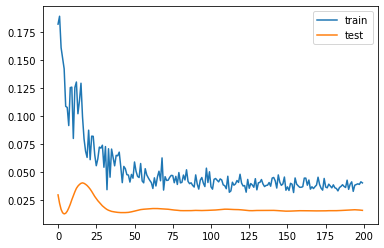

2.025763213634491
FabianDelph
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 94 samples, validate on 24 samples
Epoch 1/200
94/94 [==============================] - 1s 6ms/step - loss: 0.1058 - mse: 0.1058 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 2/200
94/94 [==============================] - 0s 106us/step - loss: 0.1340 - mse: 0.1340 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 3/200
94/94 [==============================] - 0s 96us/step - loss: 0.1164 - mse: 0.1164 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 4/200
94/94 [==============================] - 0s 117us/step - loss: 0.0863 - mse: 0.0863 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 5/200
94/94 [==============================] - 0s 106us/step - loss: 0.0929 - mse: 0.0929 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 6/200
94/94 [==============================] - 0s 96us/step - loss: 0.1034 - mse: 0.1034 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 7/200
94/94 [==============================] - 0s 96us/step - loss: 0.0985 - mse: 0.0985 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 8/200
94/94 [===========

Epoch 63/200
94/94 [==============================] - 0s 106us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 64/200
94/94 [==============================] - 0s 117us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 65/200
94/94 [==============================] - 0s 96us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 66/200
94/94 [==============================] - 0s 96us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 67/200
94/94 [==============================] - 0s 106us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 68/200
94/94 [==============================] - 0s 96us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 69/200
94/94 [==============================] - 0s 85us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 70/200
94/94 [==============================] - 0s 128us/ste

Epoch 125/200
94/94 [==============================] - 0s 96us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 126/200
94/94 [==============================] - 0s 96us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 127/200
94/94 [==============================] - 0s 117us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 128/200
94/94 [==============================] - 0s 106us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 129/200
94/94 [==============================] - 0s 96us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 130/200
94/94 [==============================] - 0s 96us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 131/200
94/94 [==============================] - 0s 106us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 132/200
94/94 [==============================] - 0s 1

Epoch 186/200
94/94 [==============================] - 0s 106us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 187/200
94/94 [==============================] - 0s 106us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 188/200
94/94 [==============================] - 0s 106us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 189/200
94/94 [==============================] - 0s 85us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 190/200
94/94 [==============================] - 0s 106us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 191/200
94/94 [==============================] - 0s 106us/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0216 - val_mse: 0.0216
Epoch 192/200
94/94 [==============================] - 0s 96us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 193/200
94/94 [==============================] - 0s

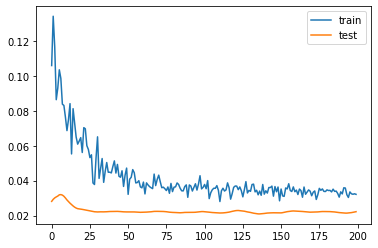

0.757793366909027
GylfiSigurdsson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 0s 5ms/step - loss: 0.0983 - mse: 0.0983 - val_loss: 0.1032 - val_mse: 0.1032
Epoch 2/200
109/109 [==============================] - 0s 110us/step - loss: 0.0950 - mse: 0.0950 - val_loss: 0.0959 - val_mse: 0.0959
Epoch 3/200
109/109 [==============================] - 0s 92us/step - loss: 0.0984 - mse: 0.0984 - val_loss: 0.0897 - val_mse: 0.0897
Epoch 4/200
109/109 [==============================] - 0s 92us/step - loss: 0.0850 - mse: 0.0850 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 5/200
109/109 [==============================] - 0s 110us/step - loss: 0.0854 - mse: 0.0854 - val_loss: 0.0801 - val_mse: 0.0801
Epoch 6/200
109/109 [==============================] - 0s 92us/step - loss: 0.0996 - mse: 0.0996 - val_loss: 0.0766 - val_mse: 0.0766
Epoch 7/200
109/109 [==============================] - 0s 83us/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 8/200
109/

Epoch 62/200
109/109 [==============================] - 0s 92us/step - loss: 0.0547 - mse: 0.0547 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 63/200
109/109 [==============================] - 0s 83us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0700 - val_mse: 0.0700
Epoch 64/200
109/109 [==============================] - 0s 73us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0702 - val_mse: 0.0702
Epoch 65/200
109/109 [==============================] - 0s 92us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0704 - val_mse: 0.0704
Epoch 66/200
109/109 [==============================] - 0s 83us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0707 - val_mse: 0.0707
Epoch 67/200
109/109 [==============================] - 0s 73us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0708 - val_mse: 0.0708
Epoch 68/200
109/109 [==============================] - 0s 101us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0711 - val_mse: 0.0711
Epoch 69/200
109/109 [==============================] 

Epoch 123/200
109/109 [==============================] - 0s 83us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 124/200
109/109 [==============================] - 0s 83us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0714 - val_mse: 0.0714
Epoch 125/200
109/109 [==============================] - 0s 92us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 126/200
109/109 [==============================] - 0s 92us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0716 - val_mse: 0.0716
Epoch 127/200
109/109 [==============================] - 0s 83us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 128/200
109/109 [==============================] - 0s 92us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 129/200
109/109 [==============================] - 0s 92us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0714 - val_mse: 0.0714
Epoch 130/200
109/109 [=========================

Epoch 184/200
109/109 [==============================] - 0s 119us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0716 - val_mse: 0.0716
Epoch 185/200
109/109 [==============================] - 0s 83us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0714 - val_mse: 0.0714
Epoch 186/200
109/109 [==============================] - 0s 92us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 187/200
109/109 [==============================] - 0s 73us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0711 - val_mse: 0.0711
Epoch 188/200
109/109 [==============================] - 0s 83us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 189/200
109/109 [==============================] - 0s 92us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0708 - val_mse: 0.0708
Epoch 190/200
109/109 [==============================] - 0s 92us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0707 - val_mse: 0.0707
Epoch 191/200
109/109 [========================

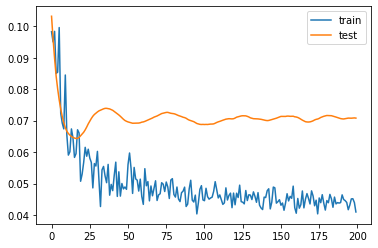

3.272641658782959
SeamusColeman
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 1s 5ms/step - loss: 0.1478 - mse: 0.1478 - val_loss: 0.2270 - val_mse: 0.2270
Epoch 2/200
109/109 [==============================] - 0s 92us/step - loss: 0.1244 - mse: 0.1244 - val_loss: 0.2135 - val_mse: 0.2135
Epoch 3/200
109/109 [==============================] - 0s 119us/step - loss: 0.1134 - mse: 0.1134 - val_loss: 0.1988 - val_mse: 0.1988
Epoch 4/200
109/109 [==============================] - 0s 83us/step - loss: 0.1078 - mse: 0.1078 - val_loss: 0.1860 - val_mse: 0.1860
Epoch 5/200
109/109 [==============================] - 0s 101us/step - loss: 0.1163 - mse: 0.1163 - val_loss: 0.1738 - val_mse: 0.1738
Epoch 6/200
109/109 [==============================] - 0s 110us/step - loss: 0.1022 - mse: 0.1022 - val_loss: 0.1621 - val_mse: 0.1621
Epoch 7/200
109/109 [==============================] - 0s 101us/step - loss: 0.0927 - mse: 0.0927 - val_loss: 0.1513 - val_mse: 0.1513
Epoch 8/200
10

Epoch 62/200
109/109 [==============================] - 0s 101us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 63/200
109/109 [==============================] - 0s 83us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 64/200
109/109 [==============================] - 0s 110us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 65/200
109/109 [==============================] - 0s 110us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0696 - val_mse: 0.0696
Epoch 66/200
109/109 [==============================] - 0s 101us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0696 - val_mse: 0.0696
Epoch 67/200
109/109 [==============================] - 0s 83us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0694 - val_mse: 0.0694
Epoch 68/200
109/109 [==============================] - 0s 92us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0693 - val_mse: 0.0693
Epoch 69/200
109/109 [=============================

Epoch 123/200
109/109 [==============================] - 0s 92us/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0685 - val_mse: 0.0685
Epoch 124/200
109/109 [==============================] - 0s 110us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0686 - val_mse: 0.0686
Epoch 125/200
109/109 [==============================] - 0s 83us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0687 - val_mse: 0.0687
Epoch 126/200
109/109 [==============================] - 0s 92us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0688 - val_mse: 0.0688
Epoch 127/200
109/109 [==============================] - 0s 92us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0688 - val_mse: 0.0688
Epoch 128/200
109/109 [==============================] - 0s 101us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0689 - val_mse: 0.0689
Epoch 129/200
109/109 [==============================] - 0s 119us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0689 - val_mse: 0.0689
Epoch 130/200
109/109 [======================

Epoch 184/200
109/109 [==============================] - 0s 92us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0662 - val_mse: 0.0662
Epoch 185/200
109/109 [==============================] - 0s 92us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0663 - val_mse: 0.0663
Epoch 186/200
109/109 [==============================] - 0s 92us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0664 - val_mse: 0.0664
Epoch 187/200
109/109 [==============================] - 0s 92us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0665 - val_mse: 0.0665
Epoch 188/200
109/109 [==============================] - 0s 101us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0666 - val_mse: 0.0666
Epoch 189/200
109/109 [==============================] - 0s 92us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0667 - val_mse: 0.0667
Epoch 190/200
109/109 [==============================] - 0s 92us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0668 - val_mse: 0.0668
Epoch 191/200
109/109 [========================

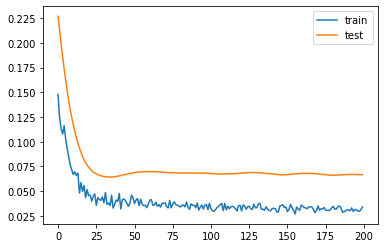

1.737283632159233
CenkTosun
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


BernardAnício Caldeira Duarte
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 9ms/step - loss: 0.1800 - mse: 0.1800 - val_loss: 0.1299 - val_mse: 0.1299
Epoch 2/200
52/52 [==============================] - 0s 173us/step - loss: 0.1244 - mse: 0.1244 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 3/200
52/52 [==============================] - 0s 192us/step - loss: 0.1466 - mse: 0.1466 - val_loss: 0.1019 - val_mse: 0.1019
Epoch 4/200
52/52 [==============================] - 0s 158us/step - loss: 0.1373 - mse: 0.1373 - val_loss: 0.0903 - val_mse: 0.0903
Epoch 5/200
52/52 [==============================] - 0s 173us/step - loss: 0.1202 - mse: 0.1202 - val_loss: 0.0805 - val_mse: 0.0805
Epoch 6/200
52/52 [==============================] - 0s 173us/step - loss: 0.1092 - mse: 0.1092 - val_loss: 0.0722 - val_mse: 0.0722
Epoch 7/200
52/52 [==============================] - 0s 154us/step - loss: 0.1047 - mse: 0.1047 - val_loss: 0.0654 - val_mse: 0.0654
Epoch 8/200
52/52 [========

Epoch 62/200
52/52 [==============================] - 0s 231us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 63/200
52/52 [==============================] - 0s 173us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 64/200
52/52 [==============================] - 0s 154us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 65/200
52/52 [==============================] - 0s 192us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 66/200
52/52 [==============================] - 0s 154us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 67/200
52/52 [==============================] - 0s 154us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 68/200
52/52 [==============================] - 0s 192us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 69/200
52/52 [==============================] - 0s 154us

Epoch 123/200
52/52 [==============================] - 0s 173us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 124/200
52/52 [==============================] - 0s 135us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0455 - val_mse: 0.0455
Epoch 125/200
52/52 [==============================] - 0s 154us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 126/200
52/52 [==============================] - 0s 154us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 127/200
52/52 [==============================] - 0s 135us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 128/200
52/52 [==============================] - 0s 173us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 129/200
52/52 [==============================] - 0s 154us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 135us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 185/200
52/52 [==============================] - 0s 211us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 186/200
52/52 [==============================] - 0s 192us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 187/200
52/52 [==============================] - 0s 154us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 188/200
52/52 [==============================] - 0s 154us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 189/200
52/52 [==============================] - 0s 154us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 190/200
52/52 [==============================] - 0s 154us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 191/200
52/52 [==============================] - 

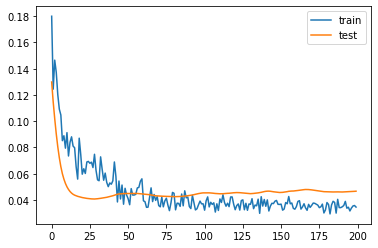

1.9619945883750916
LucasDigne
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 9ms/step - loss: 0.2618 - mse: 0.2618 - val_loss: 0.3359 - val_mse: 0.3359
Epoch 2/200
52/52 [==============================] - 0s 192us/step - loss: 0.2735 - mse: 0.2735 - val_loss: 0.2958 - val_mse: 0.2958
Epoch 3/200
52/52 [==============================] - 0s 173us/step - loss: 0.2281 - mse: 0.2281 - val_loss: 0.2590 - val_mse: 0.2590
Epoch 4/200
52/52 [==============================] - 0s 173us/step - loss: 0.2456 - mse: 0.2456 - val_loss: 0.2258 - val_mse: 0.2258
Epoch 5/200
52/52 [==============================] - 0s 211us/step - loss: 0.1603 - mse: 0.1603 - val_loss: 0.1972 - val_mse: 0.1972
Epoch 6/200
52/52 [==============================] - 0s 192us/step - loss: 0.1427 - mse: 0.1427 - val_loss: 0.1718 - val_mse: 0.1718
Epoch 7/200
52/52 [==============================] - 0s 154us/step - loss: 0.1681 - mse: 0.1681 - val_loss: 0.1501 - val_mse: 0.1501
Epoch 8/200
52/52 [========

Epoch 62/200
52/52 [==============================] - 0s 146us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 63/200
52/52 [==============================] - 0s 173us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 64/200
52/52 [==============================] - 0s 173us/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 65/200
52/52 [==============================] - 0s 135us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0623 - val_mse: 0.0623
Epoch 66/200
52/52 [==============================] - 0s 154us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0619 - val_mse: 0.0619
Epoch 67/200
52/52 [==============================] - 0s 154us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 68/200
52/52 [==============================] - 0s 154us/step - loss: 0.0680 - mse: 0.0680 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 69/200
52/52 [==============================] - 0s 154us

Epoch 123/200
52/52 [==============================] - 0s 211us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 124/200
52/52 [==============================] - 0s 154us/step - loss: 0.0560 - mse: 0.0560 - val_loss: 0.0618 - val_mse: 0.0618
Epoch 125/200
52/52 [==============================] - 0s 173us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0620 - val_mse: 0.0620
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0624 - val_mse: 0.0624
Epoch 127/200
52/52 [==============================] - 0s 135us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0628 - val_mse: 0.0628
Epoch 128/200
52/52 [==============================] - 0s 154us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 129/200
52/52 [==============================] - 0s 173us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 135us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0610 - val_mse: 0.0610
Epoch 185/200
52/52 [==============================] - 0s 154us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0610 - val_mse: 0.0610
Epoch 186/200
52/52 [==============================] - 0s 192us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0611 - val_mse: 0.0611
Epoch 187/200
52/52 [==============================] - 0s 135us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0612 - val_mse: 0.0612
Epoch 188/200
52/52 [==============================] - 0s 173us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 189/200
52/52 [==============================] - 0s 192us/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 190/200
52/52 [==============================] - 0s 154us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 191/200
52/52 [==============================] - 

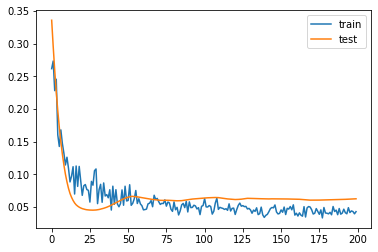

1.6475331634283068
MichaelKeane
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 29 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.1109 - mse: 0.1109 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 2/200
112/112 [==============================] - 0s 80us/step - loss: 0.1437 - mse: 0.1437 - val_loss: 0.0759 - val_mse: 0.0759
Epoch 3/200
112/112 [==============================] - 0s 89us/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.0690 - val_mse: 0.0690
Epoch 4/200
112/112 [==============================] - 0s 89us/step - loss: 0.1511 - mse: 0.1511 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 5/200
112/112 [==============================] - 0s 98us/step - loss: 0.1277 - mse: 0.1277 - val_loss: 0.0585 - val_mse: 0.0585
Epoch 6/200
112/112 [==============================] - 0s 89us/step - loss: 0.1131 - mse: 0.1131 - val_loss: 0.0547 - val_mse: 0.0547
Epoch 7/200
112/112 [==============================] - 0s 71us/step - loss: 0.1053 - mse: 0.1053 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 8/200
112/11

Epoch 62/200
112/112 [==============================] - 0s 80us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 63/200
112/112 [==============================] - 0s 80us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 64/200
112/112 [==============================] - 0s 71us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 65/200
112/112 [==============================] - 0s 71us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 66/200
112/112 [==============================] - 0s 89us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0416 - val_mse: 0.0416
Epoch 67/200
112/112 [==============================] - 0s 99us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0416 - val_mse: 0.0416
Epoch 68/200
112/112 [==============================] - 0s 80us/step - loss: 0.0466 - mse: 0.0466 - val_loss: 0.0415 - val_mse: 0.0415
Epoch 69/200
112/112 [==============================] -

Epoch 123/200
112/112 [==============================] - 0s 71us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 124/200
112/112 [==============================] - 0s 89us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 125/200
112/112 [==============================] - 0s 89us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 126/200
112/112 [==============================] - 0s 98us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 127/200
112/112 [==============================] - 0s 80us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 128/200
112/112 [==============================] - 0s 89us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 129/200
112/112 [==============================] - 0s 89us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 130/200
112/112 [=========================

Epoch 184/200
112/112 [==============================] - 0s 80us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 185/200
112/112 [==============================] - 0s 71us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 186/200
112/112 [==============================] - 0s 80us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 187/200
112/112 [==============================] - 0s 89us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 188/200
112/112 [==============================] - 0s 89us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 189/200
112/112 [==============================] - 0s 89us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 190/200
112/112 [==============================] - 0s 80us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 191/200
112/112 [=========================

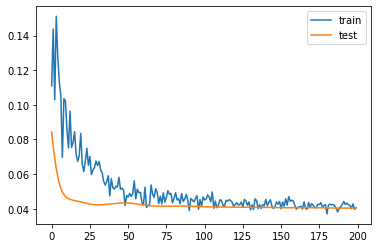

2.4510300159454346
JordanPickford
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 5ms/step - loss: 0.3313 - mse: 0.3313 - val_loss: 0.1756 - val_mse: 0.1756
Epoch 2/200
110/110 [==============================] - 0s 91us/step - loss: 0.2436 - mse: 0.2436 - val_loss: 0.1503 - val_mse: 0.1503
Epoch 3/200
110/110 [==============================] - 0s 91us/step - loss: 0.2567 - mse: 0.2567 - val_loss: 0.1232 - val_mse: 0.1232
Epoch 4/200
110/110 [==============================] - 0s 100us/step - loss: 0.2219 - mse: 0.2219 - val_loss: 0.1000 - val_mse: 0.1000
Epoch 5/200
110/110 [==============================] - 0s 91us/step - loss: 0.2171 - mse: 0.2171 - val_loss: 0.0816 - val_mse: 0.0816
Epoch 6/200
110/110 [==============================] - 0s 100us/step - loss: 0.2079 - mse: 0.2079 - val_loss: 0.0670 - val_mse: 0.0670
Epoch 7/200
110/110 [==============================] - 0s 91us/step - loss: 0.1996 - mse: 0.1996 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 8/200
110/

Epoch 62/200
110/110 [==============================] - 0s 73us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 63/200
110/110 [==============================] - 0s 82us/step - loss: 0.0462 - mse: 0.0462 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 64/200
110/110 [==============================] - 0s 100us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 65/200
110/110 [==============================] - 0s 82us/step - loss: 0.0515 - mse: 0.0515 - val_loss: 0.0342 - val_mse: 0.0342
Epoch 66/200
110/110 [==============================] - 0s 82us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 67/200
110/110 [==============================] - 0s 100us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 68/200
110/110 [==============================] - 0s 73us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 69/200
110/110 [==============================]

Epoch 123/200
110/110 [==============================] - 0s 82us/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 124/200
110/110 [==============================] - 0s 82us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 125/200
110/110 [==============================] - 0s 100us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 126/200
110/110 [==============================] - 0s 82us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 127/200
110/110 [==============================] - 0s 91us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0329 - val_mse: 0.0329
Epoch 128/200
110/110 [==============================] - 0s 91us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0329 - val_mse: 0.0329
Epoch 129/200
110/110 [==============================] - 0s 82us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 130/200
110/110 [========================

Epoch 184/200
110/110 [==============================] - 0s 73us/step - loss: 0.0357 - mse: 0.0357 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 185/200
110/110 [==============================] - 0s 82us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 186/200
110/110 [==============================] - 0s 82us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0348 - val_mse: 0.0348
Epoch 187/200
110/110 [==============================] - 0s 73us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 188/200
110/110 [==============================] - 0s 100us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 189/200
110/110 [==============================] - 0s 82us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0353 - val_mse: 0.0353
Epoch 190/200
110/110 [==============================] - 0s 82us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0355 - val_mse: 0.0355
Epoch 191/200
110/110 [========================

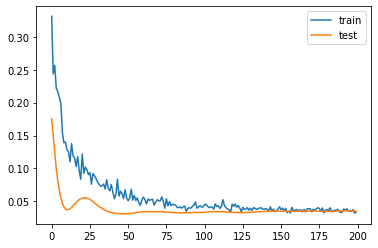

3.398921012878418
André FilipeTavares Gomes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 49 samples, validate on 13 samples
Epoch 1/200
49/49 [==============================] - 0s 10ms/step - loss: 0.0638 - mse: 0.0638 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 2/200
49/49 [==============================] - 0s 204us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.1121 - val_mse: 0.1121
Epoch 3/200
49/49 [==============================] - 0s 184us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.1064 - val_mse: 0.1064
Epoch 4/200
49/49 [==============================] - 0s 184us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.1015 - val_mse: 0.1015
Epoch 5/200
49/49 [==============================] - 0s 224us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 6/200
49/49 [==============================] - 0s 163us/step - loss: 0.0592 - mse: 0.0592 - val_loss: 0.0947 - val_mse: 0.0947
Epoch 7/200
49/49 [==============================] - 0s 163us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0916 - val_mse: 0.0916
Epoch 8/200
49/49 [=======

Epoch 62/200
49/49 [==============================] - 0s 163us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0845 - val_mse: 0.0845
Epoch 63/200
49/49 [==============================] - 0s 163us/step - loss: 0.0319 - mse: 0.0319 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 64/200
49/49 [==============================] - 0s 184us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 65/200
49/49 [==============================] - 0s 163us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 66/200
49/49 [==============================] - 0s 163us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 67/200
49/49 [==============================] - 0s 184us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 68/200
49/49 [==============================] - 0s 143us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 69/200
49/49 [==============================] - 0s 163us

Epoch 123/200
49/49 [==============================] - 0s 163us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.0840 - val_mse: 0.0840
Epoch 124/200
49/49 [==============================] - 0s 163us/step - loss: 0.0302 - mse: 0.0302 - val_loss: 0.0840 - val_mse: 0.0840
Epoch 125/200
49/49 [==============================] - 0s 163us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0841 - val_mse: 0.0841
Epoch 126/200
49/49 [==============================] - 0s 143us/step - loss: 0.0282 - mse: 0.0282 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 127/200
49/49 [==============================] - 0s 163us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 128/200
49/49 [==============================] - 0s 163us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0845 - val_mse: 0.0845
Epoch 129/200
49/49 [==============================] - 0s 184us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0847 - val_mse: 0.0847
Epoch 130/200
49/49 [==============================] - 

Epoch 184/200
49/49 [==============================] - 0s 204us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 185/200
49/49 [==============================] - 0s 184us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 186/200
49/49 [==============================] - 0s 245us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 187/200
49/49 [==============================] - 0s 245us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 188/200
49/49 [==============================] - 0s 551us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.0836 - val_mse: 0.0836
Epoch 189/200
49/49 [==============================] - 0s 224us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0838 - val_mse: 0.0838
Epoch 190/200
49/49 [==============================] - 0s 184us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0840 - val_mse: 0.0840
Epoch 191/200
49/49 [==============================] - 

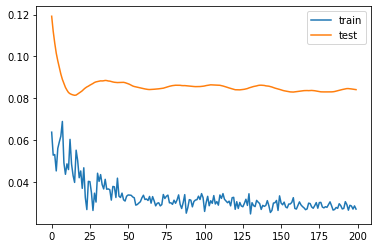

0.8459940031170845
AlexIwobi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 4ms/step - loss: 0.1944 - mse: 0.1944 - val_loss: 0.1601 - val_mse: 0.1601
Epoch 2/200
110/110 [==============================] - 0s 91us/step - loss: 0.1831 - mse: 0.1831 - val_loss: 0.1363 - val_mse: 0.1363
Epoch 3/200
110/110 [==============================] - 0s 82us/step - loss: 0.1633 - mse: 0.1633 - val_loss: 0.1181 - val_mse: 0.1181
Epoch 4/200
110/110 [==============================] - 0s 91us/step - loss: 0.1434 - mse: 0.1434 - val_loss: 0.1040 - val_mse: 0.1040
Epoch 5/200
110/110 [==============================] - 0s 82us/step - loss: 0.1481 - mse: 0.1481 - val_loss: 0.0937 - val_mse: 0.0937
Epoch 6/200
110/110 [==============================] - 0s 91us/step - loss: 0.1298 - mse: 0.1298 - val_loss: 0.0868 - val_mse: 0.0868
Epoch 7/200
110/110 [==============================] - 0s 91us/step - loss: 0.1107 - mse: 0.1107 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 8/200
110/11

Epoch 62/200
110/110 [==============================] - 0s 82us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0736 - val_mse: 0.0736
Epoch 63/200
110/110 [==============================] - 0s 82us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0736 - val_mse: 0.0736
Epoch 64/200
110/110 [==============================] - 0s 91us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0736 - val_mse: 0.0736
Epoch 65/200
110/110 [==============================] - 0s 82us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0736 - val_mse: 0.0736
Epoch 66/200
110/110 [==============================] - 0s 82us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0736 - val_mse: 0.0736
Epoch 67/200
110/110 [==============================] - 0s 91us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 68/200
110/110 [==============================] - 0s 82us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 69/200
110/110 [==============================] -

Epoch 123/200
110/110 [==============================] - 0s 82us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 124/200
110/110 [==============================] - 0s 91us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 125/200
110/110 [==============================] - 0s 91us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 126/200
110/110 [==============================] - 0s 82us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 127/200
110/110 [==============================] - 0s 91us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 128/200
110/110 [==============================] - 0s 91us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 129/200
110/110 [==============================] - 0s 82us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 130/200
110/110 [=========================

Epoch 184/200
110/110 [==============================] - 0s 82us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 185/200
110/110 [==============================] - 0s 82us/step - loss: 0.0460 - mse: 0.0460 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 186/200
110/110 [==============================] - 0s 91us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 187/200
110/110 [==============================] - 0s 82us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 188/200
110/110 [==============================] - 0s 82us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 189/200
110/110 [==============================] - 0s 82us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 190/200
110/110 [==============================] - 0s 82us/step - loss: 0.0452 - mse: 0.0452 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 191/200
110/110 [=========================

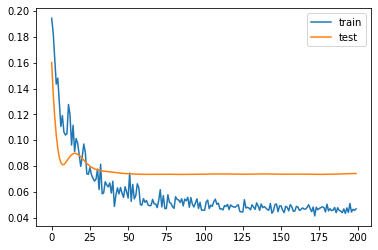

2.335766524076462
YerryMina
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 1s 10ms/step - loss: 0.1880 - mse: 0.1880 - val_loss: 0.0377 - val_mse: 0.0377
Epoch 2/200
52/52 [==============================] - 0s 173us/step - loss: 0.1330 - mse: 0.1330 - val_loss: 0.0382 - val_mse: 0.0382
Epoch 3/200
52/52 [==============================] - 0s 173us/step - loss: 0.1361 - mse: 0.1361 - val_loss: 0.0370 - val_mse: 0.0370
Epoch 4/200
52/52 [==============================] - 0s 173us/step - loss: 0.0857 - mse: 0.0857 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 5/200
52/52 [==============================] - 0s 173us/step - loss: 0.1579 - mse: 0.1579 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 6/200
52/52 [==============================] - 0s 154us/step - loss: 0.1612 - mse: 0.1612 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 7/200
52/52 [==============================] - 0s 154us/step - loss: 0.1295 - mse: 0.1295 - val_loss: 0.0318 - val_mse: 0.0318
Epoch 8/200
52/52 [=======

Epoch 62/200
52/52 [==============================] - 0s 154us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0188 - val_mse: 0.0188
Epoch 63/200
52/52 [==============================] - 0s 154us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 64/200
52/52 [==============================] - 0s 154us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 65/200
52/52 [==============================] - 0s 135us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 66/200
52/52 [==============================] - 0s 154us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 67/200
52/52 [==============================] - 0s 154us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 68/200
52/52 [==============================] - 0s 154us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 69/200
52/52 [==============================] - 0s 154us

Epoch 123/200
52/52 [==============================] - 0s 154us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 124/200
52/52 [==============================] - 0s 154us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 125/200
52/52 [==============================] - 0s 154us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 127/200
52/52 [==============================] - 0s 135us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 128/200
52/52 [==============================] - 0s 154us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 129/200
52/52 [==============================] - 0s 154us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 154us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 185/200
52/52 [==============================] - 0s 154us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 186/200
52/52 [==============================] - 0s 154us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 187/200
52/52 [==============================] - 0s 154us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 188/200
52/52 [==============================] - 0s 154us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 189/200
52/52 [==============================] - 0s 154us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 190/200
52/52 [==============================] - 0s 154us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 191/200
52/52 [==============================] - 

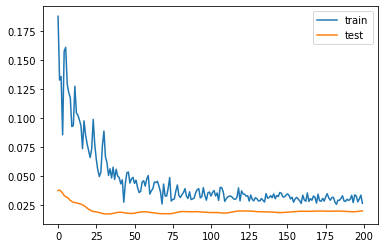

1.9767961502075195
TomDavies
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.0784 - mse: 0.0784 - val_loss: 0.0513 - val_mse: 0.0513
Epoch 2/200
108/108 [==============================] - 0s 93us/step - loss: 0.0680 - mse: 0.0680 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 3/200
108/108 [==============================] - 0s 93us/step - loss: 0.0836 - mse: 0.0836 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 4/200
108/108 [==============================] - 0s 102us/step - loss: 0.0570 - mse: 0.0570 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 5/200
108/108 [==============================] - 0s 111us/step - loss: 0.0567 - mse: 0.0567 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 6/200
108/108 [==============================] - 0s 92us/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 7/200
108/108 [==============================] - 0s 83us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 8/200
108/

Epoch 62/200
108/108 [==============================] - 0s 93us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 63/200
108/108 [==============================] - 0s 83us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 64/200
108/108 [==============================] - 0s 93us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 66/200
108/108 [==============================] - 0s 83us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 67/200
108/108 [==============================] - 0s 93us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 69/200
108/108 [==============================] -

Epoch 123/200
108/108 [==============================] - 0s 83us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0548 - val_mse: 0.0548
Epoch 124/200
108/108 [==============================] - 0s 93us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0546 - val_mse: 0.0546
Epoch 125/200
108/108 [==============================] - 0s 83us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0545 - val_mse: 0.0545
Epoch 126/200
108/108 [==============================] - 0s 74us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 127/200
108/108 [==============================] - 0s 93us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 128/200
108/108 [==============================] - 0s 83us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 129/200
108/108 [==============================] - 0s 83us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 130/200
108/108 [=========================

Epoch 184/200
108/108 [==============================] - 0s 83us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 185/200
108/108 [==============================] - 0s 83us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 186/200
108/108 [==============================] - 0s 83us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 187/200
108/108 [==============================] - 0s 74us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 188/200
108/108 [==============================] - 0s 111us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 189/200
108/108 [==============================] - 0s 102us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 190/200
108/108 [==============================] - 0s 120us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 191/200
108/108 [======================

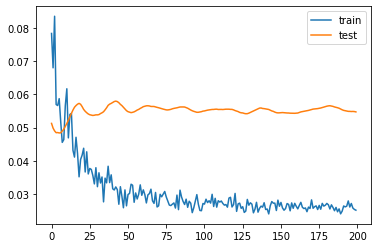

0.9745234251022339
DominicCalvert-Lewin
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 104 samples, validate on 26 samples
Epoch 1/200
104/104 [==============================] - 1s 5ms/step - loss: 0.5199 - mse: 0.5199 - val_loss: 0.1587 - val_mse: 0.1587
Epoch 2/200
104/104 [==============================] - 0s 87us/step - loss: 0.4767 - mse: 0.4767 - val_loss: 0.1230 - val_mse: 0.1230
Epoch 3/200
104/104 [==============================] - 0s 106us/step - loss: 0.3390 - mse: 0.3390 - val_loss: 0.0926 - val_mse: 0.0926
Epoch 4/200
104/104 [==============================] - 0s 96us/step - loss: 0.3359 - mse: 0.3359 - val_loss: 0.0673 - val_mse: 0.0673
Epoch 5/200
104/104 [==============================] - 0s 86us/step - loss: 0.3815 - mse: 0.3815 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 6/200
104/104 [==============================] - 0s 86us/step - loss: 0.2728 - mse: 0.2728 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 7/200
104/104 [==============================] - 0s 96us/step - loss: 0.3252 - mse: 0.3252 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 8/200
104/1

Epoch 62/200
104/104 [==============================] - 0s 86us/step - loss: 0.0698 - mse: 0.0698 - val_loss: 0.0411 - val_mse: 0.0411
Epoch 63/200
104/104 [==============================] - 0s 87us/step - loss: 0.0652 - mse: 0.0652 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 64/200
104/104 [==============================] - 0s 87us/step - loss: 0.0688 - mse: 0.0688 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 65/200
104/104 [==============================] - 0s 77us/step - loss: 0.0777 - mse: 0.0777 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 66/200
104/104 [==============================] - 0s 86us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 67/200
104/104 [==============================] - 0s 86us/step - loss: 0.0779 - mse: 0.0779 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 68/200
104/104 [==============================] - 0s 86us/step - loss: 0.0700 - mse: 0.0700 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 69/200
104/104 [==============================] -

Epoch 123/200
104/104 [==============================] - 0s 86us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0372 - val_mse: 0.0372
Epoch 124/200
104/104 [==============================] - 0s 86us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0376 - val_mse: 0.0376
Epoch 125/200
104/104 [==============================] - 0s 96us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0377 - val_mse: 0.0377
Epoch 126/200
104/104 [==============================] - 0s 86us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0379 - val_mse: 0.0379
Epoch 127/200
104/104 [==============================] - 0s 77us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0379 - val_mse: 0.0379
Epoch 128/200
104/104 [==============================] - 0s 86us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0377 - val_mse: 0.0377
Epoch 129/200
104/104 [==============================] - 0s 86us/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.0374 - val_mse: 0.0374
Epoch 130/200
104/104 [=========================

Epoch 184/200
104/104 [==============================] - 0s 86us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 185/200
104/104 [==============================] - 0s 96us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 186/200
104/104 [==============================] - 0s 96us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 187/200
104/104 [==============================] - 0s 86us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 188/200
104/104 [==============================] - 0s 86us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 189/200
104/104 [==============================] - 0s 86us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 190/200
104/104 [==============================] - 0s 96us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 191/200
104/104 [=========================

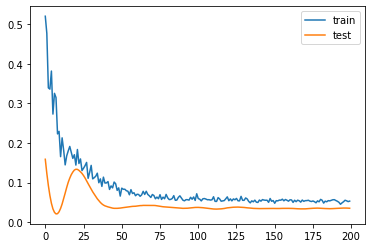

2.206375479698181
MasonHolgate
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 105 samples, validate on 27 samples
Epoch 1/200
105/105 [==============================] - 0s 4ms/step - loss: 0.2355 - mse: 0.2355 - val_loss: 0.1279 - val_mse: 0.1279
Epoch 2/200
105/105 [==============================] - 0s 95us/step - loss: 0.2490 - mse: 0.2490 - val_loss: 0.1083 - val_mse: 0.1083
Epoch 3/200
105/105 [==============================] - 0s 85us/step - loss: 0.1637 - mse: 0.1637 - val_loss: 0.0930 - val_mse: 0.0930
Epoch 4/200
105/105 [==============================] - 0s 86us/step - loss: 0.1525 - mse: 0.1525 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 5/200
105/105 [==============================] - 0s 95us/step - loss: 0.1620 - mse: 0.1620 - val_loss: 0.0748 - val_mse: 0.0748
Epoch 6/200
105/105 [==============================] - 0s 95us/step - loss: 0.1187 - mse: 0.1187 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 7/200
105/105 [==============================] - 0s 95us/step - loss: 0.1484 - mse: 0.1484 - val_loss: 0.0670 - val_mse: 0.0670
Epoch 8/200
105/10

Epoch 62/200
105/105 [==============================] - 0s 86us/step - loss: 0.0816 - mse: 0.0816 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 63/200
105/105 [==============================] - 0s 86us/step - loss: 0.0706 - mse: 0.0706 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 64/200
105/105 [==============================] - 0s 76us/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 65/200
105/105 [==============================] - 0s 95us/step - loss: 0.0756 - mse: 0.0756 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 66/200
105/105 [==============================] - 0s 95us/step - loss: 0.0698 - mse: 0.0698 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 67/200
105/105 [==============================] - 0s 86us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 68/200
105/105 [==============================] - 0s 86us/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 69/200
105/105 [==============================] -

Epoch 123/200
105/105 [==============================] - 0s 86us/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 124/200
105/105 [==============================] - 0s 105us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 125/200
105/105 [==============================] - 0s 86us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 126/200
105/105 [==============================] - 0s 86us/step - loss: 0.0573 - mse: 0.0573 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 127/200
105/105 [==============================] - 0s 95us/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 128/200
105/105 [==============================] - 0s 76us/step - loss: 0.0560 - mse: 0.0560 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 129/200
105/105 [==============================] - 0s 95us/step - loss: 0.0565 - mse: 0.0565 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 130/200
105/105 [========================

Epoch 184/200
105/105 [==============================] - 0s 76us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 185/200
105/105 [==============================] - 0s 76us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 186/200
105/105 [==============================] - 0s 95us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 187/200
105/105 [==============================] - 0s 86us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 188/200
105/105 [==============================] - 0s 76us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 189/200
105/105 [==============================] - 0s 95us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 190/200
105/105 [==============================] - 0s 95us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0565 - val_mse: 0.0565
Epoch 191/200
105/105 [=========================

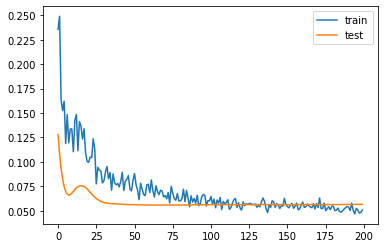

1.524487614631653
Richarlisonde Andrade
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.1674 - mse: 0.1674 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 2/200
80/80 [==============================] - 0s 112us/step - loss: 0.1754 - mse: 0.1754 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1372 - mse: 0.1372 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 4/200
80/80 [==============================] - 0s 125us/step - loss: 0.1692 - mse: 0.1692 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 5/200
80/80 [==============================] - 0s 138us/step - loss: 0.1484 - mse: 0.1484 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 6/200
80/80 [==============================] - 0s 125us/step - loss: 0.1400 - mse: 0.1400 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 7/200
80/80 [==============================] - 0s 125us/step - loss: 0.1014 - mse: 0.1014 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 112us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 63/200
80/80 [==============================] - 0s 125us/step - loss: 0.0543 - mse: 0.0543 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 64/200
80/80 [==============================] - 0s 125us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 66/200
80/80 [==============================] - 0s 112us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 67/200
80/80 [==============================] - 0s 125us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0250 - val_mse: 0.0250
Epoch 68/200
80/80 [==============================] - 0s 112us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 69/200
80/80 [==============================] - 0s 112us

Epoch 123/200
80/80 [==============================] - 0s 137us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 124/200
80/80 [==============================] - 0s 125us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 126/200
80/80 [==============================] - 0s 137us/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 128/200
80/80 [==============================] - 0s 102us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 129/200
80/80 [==============================] - 0s 100us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 100us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 185/200
80/80 [==============================] - 0s 112us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 186/200
80/80 [==============================] - 0s 100us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 187/200
80/80 [==============================] - 0s 100us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 188/200
80/80 [==============================] - 0s 125us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 190/200
80/80 [==============================] - 0s 100us/step - loss: 0.0472 - mse: 0.0472 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 191/200
80/80 [==============================] - 

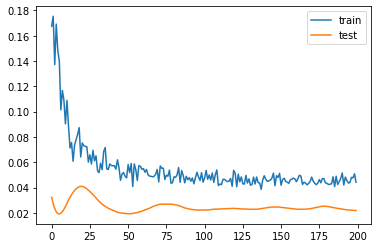

4.492456763982773
AnthonyGordon
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 12 samples, validate on 4 samples
Epoch 1/200
12/12 [==============================] - 0s 39ms/step - loss: 0.4116 - mse: 0.4116 - val_loss: 0.1657 - val_mse: 0.1657
Epoch 2/200
12/12 [==============================] - 0s 666us/step - loss: 0.4031 - mse: 0.4031 - val_loss: 0.1314 - val_mse: 0.1314
Epoch 3/200
12/12 [==============================] - 0s 666us/step - loss: 0.3542 - mse: 0.3542 - val_loss: 0.1005 - val_mse: 0.1005
Epoch 4/200
12/12 [==============================] - 0s 666us/step - loss: 0.2994 - mse: 0.2994 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 5/200
12/12 [==============================] - 0s 583us/step - loss: 0.2238 - mse: 0.2238 - val_loss: 0.0549 - val_mse: 0.0549
Epoch 6/200
12/12 [==============================] - 0s 666us/step - loss: 0.0952 - mse: 0.0952 - val_loss: 0.0371 - val_mse: 0.0371
Epoch 7/200
12/12 [==============================] - 0s 666us/step - loss: 0.1676 - mse: 0.1676 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 8/200
12/12 [========

Epoch 62/200
12/12 [==============================] - 0s 666us/step - loss: 0.1116 - mse: 0.1116 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 63/200
12/12 [==============================] - 0s 666us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 64/200
12/12 [==============================] - 0s 583us/step - loss: 0.1097 - mse: 0.1097 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 65/200
12/12 [==============================] - 0s 666us/step - loss: 0.1664 - mse: 0.1664 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 66/200
12/12 [==============================] - 0s 666us/step - loss: 0.1260 - mse: 0.1260 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 67/200
12/12 [==============================] - 0s 666us/step - loss: 0.0448 - mse: 0.0448 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 68/200
12/12 [==============================] - 0s 583us/step - loss: 0.0960 - mse: 0.0960 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 69/200
12/12 [==============================] - 0s 584us

Epoch 123/200
12/12 [==============================] - 0s 583us/step - loss: 0.0774 - mse: 0.0774 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 124/200
12/12 [==============================] - 0s 583us/step - loss: 0.0791 - mse: 0.0791 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0691 - mse: 0.0691 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 126/200
12/12 [==============================] - 0s 666us/step - loss: 0.0854 - mse: 0.0854 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 127/200
12/12 [==============================] - 0s 666us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 128/200
12/12 [==============================] - 0s 666us/step - loss: 0.1010 - mse: 0.1010 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 129/200
12/12 [==============================] - 0s 666us/step - loss: 0.0919 - mse: 0.0919 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 130/200
12/12 [==============================] - 

Epoch 184/200
12/12 [==============================] - 0s 666us/step - loss: 0.0878 - mse: 0.0878 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 185/200
12/12 [==============================] - 0s 583us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 186/200
12/12 [==============================] - 0s 583us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 187/200
12/12 [==============================] - 0s 582us/step - loss: 0.0848 - mse: 0.0848 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 188/200
12/12 [==============================] - 0s 583us/step - loss: 0.1091 - mse: 0.1091 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 189/200
12/12 [==============================] - 0s 583us/step - loss: 0.0630 - mse: 0.0630 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 190/200
12/12 [==============================] - 0s 583us/step - loss: 0.0792 - mse: 0.0792 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 191/200
12/12 [==============================] - 

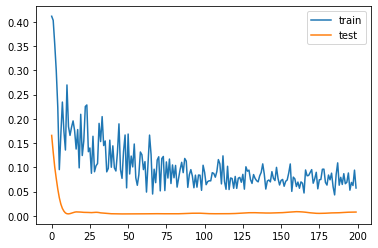

1.5821106433868408
MoiseKean
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 6 samples
Epoch 1/200
20/20 [==============================] - 0s 23ms/step - loss: 0.1781 - mse: 0.1781 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 2/200
20/20 [==============================] - 0s 400us/step - loss: 0.2502 - mse: 0.2502 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 3/200
20/20 [==============================] - 0s 399us/step - loss: 0.1560 - mse: 0.1560 - val_loss: 0.0389 - val_mse: 0.0389
Epoch 4/200
20/20 [==============================] - 0s 400us/step - loss: 0.1943 - mse: 0.1943 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 5/200
20/20 [==============================] - 0s 450us/step - loss: 0.2193 - mse: 0.2193 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 6/200
20/20 [==============================] - 0s 450us/step - loss: 0.1913 - mse: 0.1913 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 7/200
20/20 [==============================] - 0s 400us/step - loss: 0.1562 - mse: 0.1562 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 350us/step - loss: 0.0615 - mse: 0.0615 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 63/200
20/20 [==============================] - 0s 400us/step - loss: 0.0789 - mse: 0.0789 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 64/200
20/20 [==============================] - 0s 350us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 65/200
20/20 [==============================] - 0s 400us/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 66/200
20/20 [==============================] - 0s 350us/step - loss: 0.0721 - mse: 0.0721 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 67/200
20/20 [==============================] - 0s 400us/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 68/200
20/20 [==============================] - 0s 350us/step - loss: 0.0786 - mse: 0.0786 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 69/200
20/20 [==============================] - 0s 350us

Epoch 123/200
20/20 [==============================] - 0s 400us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 124/200
20/20 [==============================] - 0s 400us/step - loss: 0.0579 - mse: 0.0579 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 125/200
20/20 [==============================] - 0s 350us/step - loss: 0.0628 - mse: 0.0628 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 126/200
20/20 [==============================] - 0s 400us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 128/200
20/20 [==============================] - 0s 400us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 129/200
20/20 [==============================] - 0s 400us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 350us/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 185/200
20/20 [==============================] - 0s 350us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0501 - mse: 0.0501 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 187/200
20/20 [==============================] - 0s 400us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 188/200
20/20 [==============================] - 0s 350us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 189/200
20/20 [==============================] - 0s 400us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 190/200
20/20 [==============================] - 0s 350us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 191/200
20/20 [==============================] - 

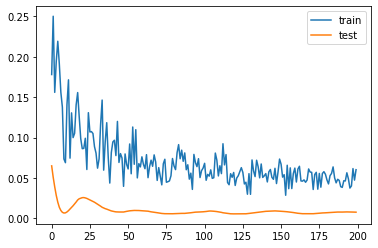

1.3554701507091522
JarradBranthwaite
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


AbdoulayeDoucouré
no_player_data_so_far_this_season
WesMorgan
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KasperSchmeichel
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ChristianFuchs
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JonnyEvans
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MarcAlbrighton
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JamieVardy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DennisPraet
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Ricardo DomingosBarbosa Pereira
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



YouriTielemans
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AyozePérez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DemaraiGray
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JamesMaddison
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KelechiIheanacho
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



HamzaChoudhury
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



HarveyBarnes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



WilfredNdidi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ÇaglarSöyüncü
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JamesJustin
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NampalysMendy
no_player_data_so_far_this_season
JamesMilner
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



GeorginioWijnaldum
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JordanHenderson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AdriánSan Miguel del Castillo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JoelMatip
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AlexOxlade-Chamberlain
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



RobertoFirmino
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Virgilvan Dijk
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SadioMané
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AlissonRamses Becker
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Fabio HenriqueTavares
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MohamedSalah
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AndrewRobertson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DivockOrigi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



HarryWilson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



TrentAlexander-Arnold
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JosephGomez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NabyKeita
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



FernandoLuiz Rosa
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ClaudioBravo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SergioAgüero
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NicolásOtamendi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KyleWalker
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



IlkayGündogan
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



KevinDe Bruyne
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JohnStones
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



BenjaminMendy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



RiyadMahrez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



RaheemSterling
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



João Pedro CavacoCancelo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



EdersonSantana de Moraes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NathanAké
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AymericLaporte
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Bernardo MotaVeiga de Carvalho e Silva
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Gabriel Fernandode Jesus
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



OleksandrZinchenko
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



PhilFoden
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



RodrigoHernandez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



EricGarcia
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JuanMata
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Davidde Gea
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



NemanjaMatic
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



PaulPogba
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



HarryMaguire
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



FredericoRodrigues de Paula Santos
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



LukeShaw
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JesseLingard
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Bruno MiguelBorges Fernandes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AnthonyMartial
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AndreasPereira
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DeanHenderson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MarcusRashford
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



VictorLindelöf
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



ScottMcTominay
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DanielJames
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AaronWan-Bissaka
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MasonGreenwood
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



BrandonWilliams
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



AndyCarroll
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.1958 - mse: 0.1958 - val_loss: 0.0731 - val_mse: 0.0731
Epoch 2/200
108/108 [==============================] - 0s 93us/step - loss: 0.1618 - mse: 0.1618 - val_loss: 0.0623 - val_mse: 0.0623
Epoch 3/200
108/108 [==============================] - 0s 120us/step - loss: 0.1536 - mse: 0.1536 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 4/200
108/108 [==============================] - 0s 93us/step - loss: 0.1562 - mse: 0.1562 - val_loss: 0.0502 - val_mse: 0.0502
Epoch 5/200
108/108 [==============================] - 0s 102us/step - loss: 0.1064 - mse: 0.1064 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 6/200
108/108 [==============================] - 0s 93us/step - loss: 0.1317 - mse: 0.1317 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 7/200
108/108 [==============================] - 0s 93us/step - loss: 0.1338 - mse: 0.1338 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 8/200
108/

Epoch 62/200
108/108 [==============================] - 0s 83us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 63/200
108/108 [==============================] - 0s 83us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 64/200
108/108 [==============================] - 0s 93us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 66/200
108/108 [==============================] - 0s 83us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 67/200
108/108 [==============================] - 0s 83us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 69/200
108/108 [==============================] -

Epoch 123/200
108/108 [==============================] - 0s 83us/step - loss: 0.0161 - mse: 0.0161 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 124/200
108/108 [==============================] - 0s 83us/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 125/200
108/108 [==============================] - 0s 93us/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 126/200
108/108 [==============================] - 0s 93us/step - loss: 0.0147 - mse: 0.0147 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 127/200
108/108 [==============================] - 0s 83us/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 128/200
108/108 [==============================] - 0s 93us/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 129/200
108/108 [==============================] - 0s 83us/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 130/200
108/108 [=========================

Epoch 184/200
108/108 [==============================] - 0s 83us/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 185/200
108/108 [==============================] - 0s 83us/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 186/200
108/108 [==============================] - 0s 83us/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0552 - val_mse: 0.0552
Epoch 187/200
108/108 [==============================] - 0s 83us/step - loss: 0.0126 - mse: 0.0126 - val_loss: 0.0553 - val_mse: 0.0553
Epoch 188/200
108/108 [==============================] - 0s 102us/step - loss: 0.0134 - mse: 0.0134 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 189/200
108/108 [==============================] - 0s 83us/step - loss: 0.0131 - mse: 0.0131 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 190/200
108/108 [==============================] - 0s 93us/step - loss: 0.0139 - mse: 0.0139 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 191/200
108/108 [========================

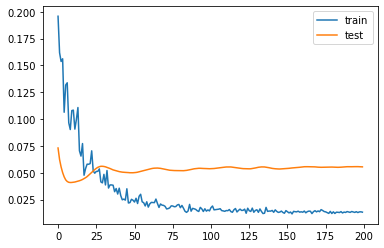

0.5220643728971481
JonjoShelvey
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.1423 - mse: 0.1423 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 2/200
80/80 [==============================] - 0s 112us/step - loss: 0.1200 - mse: 0.1200 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1429 - mse: 0.1429 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 4/200
80/80 [==============================] - 0s 112us/step - loss: 0.1265 - mse: 0.1265 - val_loss: 0.0482 - val_mse: 0.0482
Epoch 5/200
80/80 [==============================] - 0s 125us/step - loss: 0.1111 - mse: 0.1111 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 6/200
80/80 [==============================] - 0s 112us/step - loss: 0.1410 - mse: 0.1410 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 7/200
80/80 [==============================] - 0s 112us/step - loss: 0.1321 - mse: 0.1321 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 100us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0426 - val_mse: 0.0426
Epoch 63/200
80/80 [==============================] - 0s 112us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 64/200
80/80 [==============================] - 0s 100us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0425 - val_mse: 0.0425
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0510 - mse: 0.0510 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 66/200
80/80 [==============================] - 0s 112us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 67/200
80/80 [==============================] - 0s 100us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 68/200
80/80 [==============================] - 0s 112us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 69/200
80/80 [==============================] - 0s 108us

Epoch 123/200
80/80 [==============================] - 0s 125us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 124/200
80/80 [==============================] - 0s 112us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 126/200
80/80 [==============================] - 0s 112us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 128/200
80/80 [==============================] - 0s 112us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 129/200
80/80 [==============================] - 0s 112us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 112us/step - loss: 0.0357 - mse: 0.0357 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 185/200
80/80 [==============================] - 0s 112us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 188/200
80/80 [==============================] - 0s 125us/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 189/200
80/80 [==============================] - 0s 100us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0397 - val_mse: 0.0397
Epoch 191/200
80/80 [==============================] - 

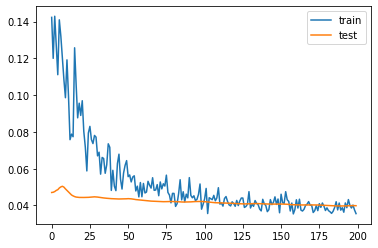

1.8708514571189878
MattRitchie
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.1836 - mse: 0.1836 - val_loss: 0.0803 - val_mse: 0.0803
Epoch 2/200
80/80 [==============================] - 0s 137us/step - loss: 0.1780 - mse: 0.1780 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 4/200
80/80 [==============================] - 0s 137us/step - loss: 0.1582 - mse: 0.1582 - val_loss: 0.0399 - val_mse: 0.0399
Epoch 5/200
80/80 [==============================] - 0s 125us/step - loss: 0.1431 - mse: 0.1431 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 6/200
80/80 [==============================] - 0s 125us/step - loss: 0.1357 - mse: 0.1357 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 7/200
80/80 [==============================] - 0s 112us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 137us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 63/200
80/80 [==============================] - 0s 112us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 64/200
80/80 [==============================] - 0s 125us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 65/200
80/80 [==============================] - 0s 125us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 66/200
80/80 [==============================] - 0s 137us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 67/200
80/80 [==============================] - 0s 112us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 68/200
80/80 [==============================] - 0s 150us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 69/200
80/80 [==============================] - 0s 125us

Epoch 123/200
80/80 [==============================] - 0s 112us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 124/200
80/80 [==============================] - 0s 112us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 125/200
80/80 [==============================] - 0s 100us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 126/200
80/80 [==============================] - 0s 125us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 127/200
80/80 [==============================] - 0s 112us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 128/200
80/80 [==============================] - 0s 125us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 129/200
80/80 [==============================] - 0s 137us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 112us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 185/200
80/80 [==============================] - 0s 125us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 187/200
80/80 [==============================] - 0s 125us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 188/200
80/80 [==============================] - 0s 125us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 190/200
80/80 [==============================] - 0s 100us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 191/200
80/80 [==============================] - 

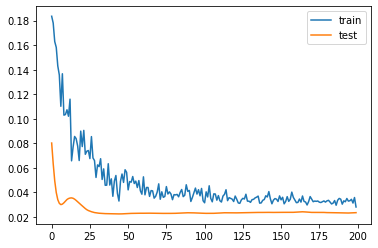

3.5282101929187775
FedericoFernández
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 0s 4ms/step - loss: 0.1442 - mse: 0.1442 - val_loss: 0.0864 - val_mse: 0.0864
Epoch 2/200
109/109 [==============================] - 0s 101us/step - loss: 0.1537 - mse: 0.1537 - val_loss: 0.0761 - val_mse: 0.0761
Epoch 3/200
109/109 [==============================] - 0s 101us/step - loss: 0.1533 - mse: 0.1533 - val_loss: 0.0672 - val_mse: 0.0672
Epoch 4/200
109/109 [==============================] - 0s 92us/step - loss: 0.1334 - mse: 0.1334 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 5/200
109/109 [==============================] - 0s 101us/step - loss: 0.1411 - mse: 0.1411 - val_loss: 0.0536 - val_mse: 0.0536
Epoch 6/200
109/109 [==============================] - 0s 83us/step - loss: 0.1206 - mse: 0.1206 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 7/200
109/109 [==============================] - 0s 101us/step - loss: 0.1158 - mse: 0.1158 - val_loss: 0.0460 - val_mse: 0.0460
Epoch 8/200
10

Epoch 62/200
109/109 [==============================] - 0s 73us/step - loss: 0.0556 - mse: 0.0556 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 63/200
109/109 [==============================] - 0s 73us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 64/200
109/109 [==============================] - 0s 83us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 65/200
109/109 [==============================] - 0s 83us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 66/200
109/109 [==============================] - 0s 92us/step - loss: 0.0628 - mse: 0.0628 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 67/200
109/109 [==============================] - 0s 92us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 68/200
109/109 [==============================] - 0s 83us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 69/200
109/109 [==============================] -

Epoch 123/200
109/109 [==============================] - 0s 83us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 124/200
109/109 [==============================] - 0s 92us/step - loss: 0.0539 - mse: 0.0539 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 125/200
109/109 [==============================] - 0s 83us/step - loss: 0.0501 - mse: 0.0501 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 126/200
109/109 [==============================] - 0s 92us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 127/200
109/109 [==============================] - 0s 92us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 128/200
109/109 [==============================] - 0s 92us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 129/200
109/109 [==============================] - 0s 83us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 130/200
109/109 [=========================

Epoch 184/200
109/109 [==============================] - 0s 83us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 185/200
109/109 [==============================] - 0s 83us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 186/200
109/109 [==============================] - 0s 83us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 187/200
109/109 [==============================] - 0s 83us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 188/200
109/109 [==============================] - 0s 83us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 189/200
109/109 [==============================] - 0s 83us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 190/200
109/109 [==============================] - 0s 82us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 191/200
109/109 [=========================

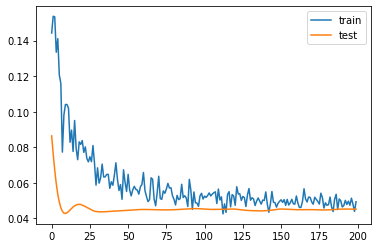

3.4936272203922267
CiaranClark
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 0s 5ms/step - loss: 0.1408 - mse: 0.1408 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 2/200
80/80 [==============================] - 0s 125us/step - loss: 0.1095 - mse: 0.1095 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1137 - mse: 0.1137 - val_loss: 0.0419 - val_mse: 0.0419
Epoch 4/200
80/80 [==============================] - 0s 112us/step - loss: 0.1241 - mse: 0.1241 - val_loss: 0.0390 - val_mse: 0.0390
Epoch 5/200
80/80 [==============================] - 0s 125us/step - loss: 0.1087 - mse: 0.1087 - val_loss: 0.0355 - val_mse: 0.0355
Epoch 6/200
80/80 [==============================] - 0s 112us/step - loss: 0.1197 - mse: 0.1197 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 7/200
80/80 [==============================] - 0s 100us/step - loss: 0.1192 - mse: 0.1192 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 112us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 63/200
80/80 [==============================] - 0s 125us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 64/200
80/80 [==============================] - 0s 125us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 65/200
80/80 [==============================] - 0s 125us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 66/200
80/80 [==============================] - 0s 125us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 67/200
80/80 [==============================] - 0s 125us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 68/200
80/80 [==============================] - 0s 137us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 69/200
80/80 [==============================] - 0s 137us

Epoch 123/200
80/80 [==============================] - 0s 100us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 124/200
80/80 [==============================] - 0s 112us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 125/200
80/80 [==============================] - 0s 100us/step - loss: 0.0418 - mse: 0.0418 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 126/200
80/80 [==============================] - 0s 112us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 127/200
80/80 [==============================] - 0s 112us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 128/200
80/80 [==============================] - 0s 125us/step - loss: 0.0427 - mse: 0.0427 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 129/200
80/80 [==============================] - 0s 100us/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 112us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 185/200
80/80 [==============================] - 0s 112us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 188/200
80/80 [==============================] - 0s 125us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 190/200
80/80 [==============================] - 0s 125us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 191/200
80/80 [==============================] - 

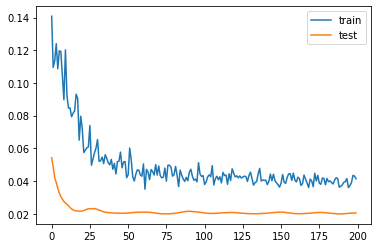

1.8810725212097168
MartinDubravka
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 61 samples, validate on 16 samples
Epoch 1/200
61/61 [==============================] - 0s 7ms/step - loss: 0.1243 - mse: 0.1243 - val_loss: 0.1691 - val_mse: 0.1691
Epoch 2/200
61/61 [==============================] - 0s 164us/step - loss: 0.1213 - mse: 0.1213 - val_loss: 0.1618 - val_mse: 0.1618
Epoch 3/200
61/61 [==============================] - 0s 147us/step - loss: 0.1313 - mse: 0.1313 - val_loss: 0.1548 - val_mse: 0.1548
Epoch 4/200
61/61 [==============================] - 0s 147us/step - loss: 0.1141 - mse: 0.1141 - val_loss: 0.1482 - val_mse: 0.1482
Epoch 5/200
61/61 [==============================] - 0s 164us/step - loss: 0.1062 - mse: 0.1062 - val_loss: 0.1420 - val_mse: 0.1420
Epoch 6/200
61/61 [==============================] - 0s 147us/step - loss: 0.1072 - mse: 0.1072 - val_loss: 0.1361 - val_mse: 0.1361
Epoch 7/200
61/61 [==============================] - 0s 131us/step - loss: 0.0793 - mse: 0.0793 - val_loss: 0.1307 - val_mse: 0.1307
Epoch 8/200
61/61 [========

Epoch 62/200
61/61 [==============================] - 0s 147us/step - loss: 0.0494 - mse: 0.0494 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 63/200
61/61 [==============================] - 0s 147us/step - loss: 0.0574 - mse: 0.0574 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 64/200
61/61 [==============================] - 0s 131us/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 65/200
61/61 [==============================] - 0s 164us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 66/200
61/61 [==============================] - 0s 164us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 67/200
61/61 [==============================] - 0s 131us/step - loss: 0.0629 - mse: 0.0629 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 68/200
61/61 [==============================] - 0s 131us/step - loss: 0.0638 - mse: 0.0638 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 69/200
61/61 [==============================] - 0s 147us

Epoch 123/200
61/61 [==============================] - 0s 147us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 124/200
61/61 [==============================] - 0s 131us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0809 - val_mse: 0.0809
Epoch 125/200
61/61 [==============================] - 0s 164us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0808 - val_mse: 0.0808
Epoch 126/200
61/61 [==============================] - 0s 131us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0807 - val_mse: 0.0807
Epoch 127/200
61/61 [==============================] - 0s 131us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0807 - val_mse: 0.0807
Epoch 128/200
61/61 [==============================] - 0s 147us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0806 - val_mse: 0.0806
Epoch 129/200
61/61 [==============================] - 0s 147us/step - loss: 0.0612 - mse: 0.0612 - val_loss: 0.0806 - val_mse: 0.0806
Epoch 130/200
61/61 [==============================] - 

Epoch 184/200
61/61 [==============================] - 0s 115us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0804 - val_mse: 0.0804
Epoch 185/200
61/61 [==============================] - 0s 147us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0804 - val_mse: 0.0804
Epoch 186/200
61/61 [==============================] - 0s 131us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0805 - val_mse: 0.0805
Epoch 187/200
61/61 [==============================] - 0s 131us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0806 - val_mse: 0.0806
Epoch 188/200
61/61 [==============================] - 0s 115us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0808 - val_mse: 0.0808
Epoch 189/200
61/61 [==============================] - 0s 131us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0809 - val_mse: 0.0809
Epoch 190/200
61/61 [==============================] - 0s 131us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.0810 - val_mse: 0.0810
Epoch 191/200
61/61 [==============================] - 

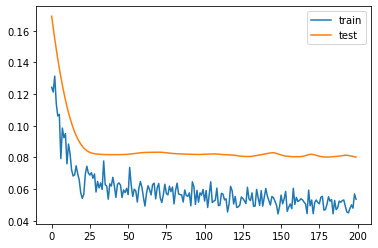

5.089539796113968
FlorianLejeune
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 79 samples, validate on 20 samples
Epoch 1/200
79/79 [==============================] - 0s 6ms/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 2/200
79/79 [==============================] - 0s 114us/step - loss: 0.0562 - mse: 0.0562 - val_loss: 0.0376 - val_mse: 0.0376
Epoch 3/200
79/79 [==============================] - 0s 126us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 4/200
79/79 [==============================] - 0s 114us/step - loss: 0.0560 - mse: 0.0560 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 5/200
79/79 [==============================] - 0s 114us/step - loss: 0.0679 - mse: 0.0679 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 6/200
79/79 [==============================] - 0s 126us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 7/200
79/79 [==============================] - 0s 139us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 8/200
79/79 [========

Epoch 62/200
79/79 [==============================] - 0s 114us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 63/200
79/79 [==============================] - 0s 114us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 64/200
79/79 [==============================] - 0s 101us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 65/200
79/79 [==============================] - 0s 114us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 66/200
79/79 [==============================] - 0s 114us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 67/200
79/79 [==============================] - 0s 127us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 68/200
79/79 [==============================] - 0s 114us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 69/200
79/79 [==============================] - 0s 114us

Epoch 123/200
79/79 [==============================] - 0s 114us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 124/200
79/79 [==============================] - 0s 114us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 125/200
79/79 [==============================] - 0s 114us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 126/200
79/79 [==============================] - 0s 114us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 127/200
79/79 [==============================] - 0s 127us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 128/200
79/79 [==============================] - 0s 114us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 129/200
79/79 [==============================] - 0s 114us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 130/200
79/79 [==============================] - 

Epoch 184/200
79/79 [==============================] - 0s 127us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 185/200
79/79 [==============================] - 0s 114us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 186/200
79/79 [==============================] - 0s 127us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 187/200
79/79 [==============================] - 0s 127us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 188/200
79/79 [==============================] - 0s 127us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 189/200
79/79 [==============================] - 0s 127us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 190/200
79/79 [==============================] - 0s 114us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 191/200
79/79 [==============================] - 

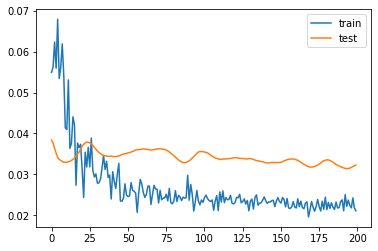

1.133861169219017
JamaalLascelles
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 79 samples, validate on 20 samples
Epoch 1/200
79/79 [==============================] - 0s 6ms/step - loss: 0.2580 - mse: 0.2580 - val_loss: 0.0973 - val_mse: 0.0973
Epoch 2/200
79/79 [==============================] - 0s 114us/step - loss: 0.2473 - mse: 0.2473 - val_loss: 0.0777 - val_mse: 0.0777
Epoch 3/200
79/79 [==============================] - 0s 127us/step - loss: 0.2236 - mse: 0.2236 - val_loss: 0.0611 - val_mse: 0.0611
Epoch 4/200
79/79 [==============================] - 0s 114us/step - loss: 0.1716 - mse: 0.1716 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 5/200
79/79 [==============================] - 0s 127us/step - loss: 0.1898 - mse: 0.1898 - val_loss: 0.0392 - val_mse: 0.0392
Epoch 6/200
79/79 [==============================] - 0s 126us/step - loss: 0.1974 - mse: 0.1974 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 7/200
79/79 [==============================] - 0s 139us/step - loss: 0.1225 - mse: 0.1225 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 8/200
79/79 [========

Epoch 62/200
79/79 [==============================] - 0s 101us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 63/200
79/79 [==============================] - 0s 114us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0353 - val_mse: 0.0353
Epoch 64/200
79/79 [==============================] - 0s 114us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0356 - val_mse: 0.0356
Epoch 65/200
79/79 [==============================] - 0s 114us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0359 - val_mse: 0.0359
Epoch 66/200
79/79 [==============================] - 0s 114us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 67/200
79/79 [==============================] - 0s 114us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 68/200
79/79 [==============================] - 0s 114us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 69/200
79/79 [==============================] - 0s 114us

Epoch 123/200
79/79 [==============================] - 0s 114us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 124/200
79/79 [==============================] - 0s 114us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 125/200
79/79 [==============================] - 0s 114us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 126/200
79/79 [==============================] - 0s 101us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 127/200
79/79 [==============================] - 0s 114us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 128/200
79/79 [==============================] - 0s 101us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 129/200
79/79 [==============================] - 0s 114us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 130/200
79/79 [==============================] - 

Epoch 184/200
79/79 [==============================] - 0s 101us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 185/200
79/79 [==============================] - 0s 114us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 186/200
79/79 [==============================] - 0s 114us/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 187/200
79/79 [==============================] - 0s 101us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 188/200
79/79 [==============================] - 0s 127us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 189/200
79/79 [==============================] - 0s 114us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 190/200
79/79 [==============================] - 0s 114us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0321 - val_mse: 0.0321
Epoch 191/200
79/79 [==============================] - 

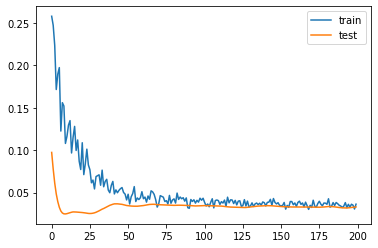

3.8606443405151367
DwightGayle
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 75 samples, validate on 19 samples
Epoch 1/200
75/75 [==============================] - 0s 6ms/step - loss: 0.1099 - mse: 0.1099 - val_loss: 0.1469 - val_mse: 0.1469
Epoch 2/200
75/75 [==============================] - 0s 120us/step - loss: 0.1132 - mse: 0.1132 - val_loss: 0.1332 - val_mse: 0.1332
Epoch 3/200
75/75 [==============================] - 0s 133us/step - loss: 0.0947 - mse: 0.0947 - val_loss: 0.1221 - val_mse: 0.1221
Epoch 4/200
75/75 [==============================] - 0s 133us/step - loss: 0.0984 - mse: 0.0984 - val_loss: 0.1119 - val_mse: 0.1119
Epoch 5/200
75/75 [==============================] - 0s 133us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.1028 - val_mse: 0.1028
Epoch 6/200
75/75 [==============================] - 0s 133us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0945 - val_mse: 0.0945
Epoch 7/200
75/75 [==============================] - 0s 120us/step - loss: 0.0739 - mse: 0.0739 - val_loss: 0.0873 - val_mse: 0.0873
Epoch 8/200
75/75 [========

Epoch 62/200
75/75 [==============================] - 0s 120us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 63/200
75/75 [==============================] - 0s 120us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 64/200
75/75 [==============================] - 0s 120us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0553 - val_mse: 0.0553
Epoch 65/200
75/75 [==============================] - 0s 107us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0551 - val_mse: 0.0551
Epoch 66/200
75/75 [==============================] - 0s 107us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0550 - val_mse: 0.0550
Epoch 67/200
75/75 [==============================] - 0s 120us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0549 - val_mse: 0.0549
Epoch 68/200
75/75 [==============================] - 0s 107us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0547 - val_mse: 0.0547
Epoch 69/200
75/75 [==============================] - 0s 107us

Epoch 123/200
75/75 [==============================] - 0s 120us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 124/200
75/75 [==============================] - 0s 120us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0523 - val_mse: 0.0523
Epoch 125/200
75/75 [==============================] - 0s 133us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0524 - val_mse: 0.0524
Epoch 126/200
75/75 [==============================] - 0s 127us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0525 - val_mse: 0.0525
Epoch 127/200
75/75 [==============================] - 0s 107us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0526 - val_mse: 0.0526
Epoch 128/200
75/75 [==============================] - 0s 120us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0528 - val_mse: 0.0528
Epoch 129/200
75/75 [==============================] - 0s 107us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 130/200
75/75 [==============================] - 

Epoch 184/200
75/75 [==============================] - 0s 120us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 185/200
75/75 [==============================] - 0s 120us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 186/200
75/75 [==============================] - 0s 107us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0515 - val_mse: 0.0515
Epoch 187/200
75/75 [==============================] - 0s 120us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0514 - val_mse: 0.0514
Epoch 188/200
75/75 [==============================] - 0s 116us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0513 - val_mse: 0.0513
Epoch 189/200
75/75 [==============================] - 0s 133us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0512 - val_mse: 0.0512
Epoch 190/200
75/75 [==============================] - 0s 120us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 191/200
75/75 [==============================] - 

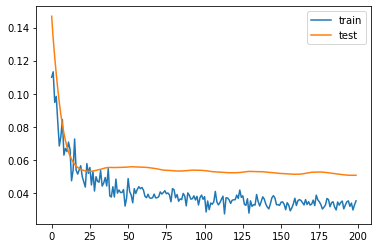

2.0562857389450073
ChristianAtsu
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 81 samples, validate on 21 samples
Epoch 1/200
81/81 [==============================] - 0s 5ms/step - loss: 0.1596 - mse: 0.1596 - val_loss: 0.1461 - val_mse: 0.1461
Epoch 2/200
81/81 [==============================] - 0s 173us/step - loss: 0.1738 - mse: 0.1738 - val_loss: 0.1208 - val_mse: 0.1208
Epoch 3/200
81/81 [==============================] - 0s 123us/step - loss: 0.1473 - mse: 0.1473 - val_loss: 0.0985 - val_mse: 0.0985
Epoch 4/200
81/81 [==============================] - 0s 136us/step - loss: 0.1507 - mse: 0.1507 - val_loss: 0.0813 - val_mse: 0.0813
Epoch 5/200
81/81 [==============================] - 0s 123us/step - loss: 0.1174 - mse: 0.1174 - val_loss: 0.0679 - val_mse: 0.0679
Epoch 6/200
81/81 [==============================] - 0s 111us/step - loss: 0.1230 - mse: 0.1230 - val_loss: 0.0592 - val_mse: 0.0592
Epoch 7/200
81/81 [==============================] - 0s 123us/step - loss: 0.0847 - mse: 0.0847 - val_loss: 0.0532 - val_mse: 0.0532
Epoch 8/200
81/81 [========

Epoch 62/200
81/81 [==============================] - 0s 111us/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 63/200
81/81 [==============================] - 0s 111us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 64/200
81/81 [==============================] - 0s 111us/step - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 65/200
81/81 [==============================] - 0s 99us/step - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 66/200
81/81 [==============================] - 0s 99us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 67/200
81/81 [==============================] - 0s 123us/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 68/200
81/81 [==============================] - 0s 111us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 69/200
81/81 [==============================] - 0s 111us/s

Epoch 124/200
81/81 [==============================] - 0s 111us/step - loss: 0.0139 - mse: 0.0139 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 125/200
81/81 [==============================] - 0s 111us/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 126/200
81/81 [==============================] - 0s 111us/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 127/200
81/81 [==============================] - 0s 99us/step - loss: 0.0166 - mse: 0.0166 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 128/200
81/81 [==============================] - 0s 111us/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 129/200
81/81 [==============================] - 0s 123us/step - loss: 0.0139 - mse: 0.0139 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 130/200
81/81 [==============================] - 0s 99us/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 131/200
81/81 [==============================] - 0s

Epoch 185/200
81/81 [==============================] - 0s 111us/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 186/200
81/81 [==============================] - 0s 111us/step - loss: 0.0147 - mse: 0.0147 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 187/200
81/81 [==============================] - 0s 111us/step - loss: 0.0118 - mse: 0.0118 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 188/200
81/81 [==============================] - 0s 123us/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 189/200
81/81 [==============================] - 0s 99us/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 190/200
81/81 [==============================] - 0s 111us/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 191/200
81/81 [==============================] - 0s 99us/step - loss: 0.0136 - mse: 0.0136 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 192/200
81/81 [==============================] - 0s

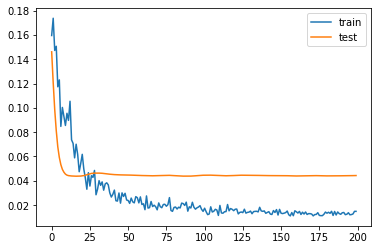

0.017620119033381343
PaulDummett
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.2037 - mse: 0.2037 - val_loss: 0.1917 - val_mse: 0.1917
Epoch 2/200
80/80 [==============================] - 0s 112us/step - loss: 0.1997 - mse: 0.1997 - val_loss: 0.1649 - val_mse: 0.1649
Epoch 3/200
80/80 [==============================] - 0s 125us/step - loss: 0.1690 - mse: 0.1690 - val_loss: 0.1417 - val_mse: 0.1417
Epoch 4/200
80/80 [==============================] - 0s 112us/step - loss: 0.1617 - mse: 0.1617 - val_loss: 0.1211 - val_mse: 0.1211
Epoch 5/200
80/80 [==============================] - 0s 113us/step - loss: 0.1228 - mse: 0.1228 - val_loss: 0.1031 - val_mse: 0.1031
Epoch 6/200
80/80 [==============================] - 0s 125us/step - loss: 0.1255 - mse: 0.1255 - val_loss: 0.0882 - val_mse: 0.0882
Epoch 7/200
80/80 [==============================] - 0s 125us/step - loss: 0.1247 - mse: 0.1247 - val_loss: 0.0754 - val_mse: 0.0754
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 125us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 63/200
80/80 [==============================] - 0s 112us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 64/200
80/80 [==============================] - 0s 112us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 65/200
80/80 [==============================] - 0s 112us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0377 - val_mse: 0.0377
Epoch 66/200
80/80 [==============================] - 0s 100us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0377 - val_mse: 0.0377
Epoch 67/200
80/80 [==============================] - 0s 112us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0376 - val_mse: 0.0376
Epoch 68/200
80/80 [==============================] - 0s 112us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0376 - val_mse: 0.0376
Epoch 69/200
80/80 [==============================] - 0s 112us

Epoch 123/200
80/80 [==============================] - 0s 100us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0386 - val_mse: 0.0386
Epoch 124/200
80/80 [==============================] - 0s 100us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0387 - val_mse: 0.0387
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0387 - val_mse: 0.0387
Epoch 126/200
80/80 [==============================] - 0s 125us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0386 - val_mse: 0.0386
Epoch 127/200
80/80 [==============================] - 0s 112us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0386 - val_mse: 0.0386
Epoch 128/200
80/80 [==============================] - 0s 100us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0387 - val_mse: 0.0387
Epoch 129/200
80/80 [==============================] - 0s 112us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0387 - val_mse: 0.0387
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 100us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0382 - val_mse: 0.0382
Epoch 185/200
80/80 [==============================] - 0s 112us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 186/200
80/80 [==============================] - 0s 125us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0382 - val_mse: 0.0382
Epoch 188/200
80/80 [==============================] - 0s 137us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0383 - val_mse: 0.0383
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 190/200
80/80 [==============================] - 0s 100us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 191/200
80/80 [==============================] - 

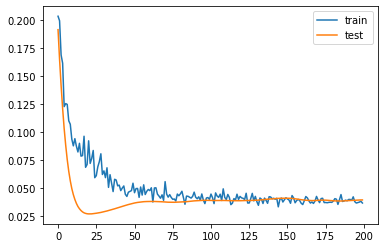

1.666984111070633
JavierManquillo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.1835 - mse: 0.1835 - val_loss: 0.0413 - val_mse: 0.0413
Epoch 2/200
108/108 [==============================] - 0s 92us/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.0372 - val_mse: 0.0372
Epoch 3/200
108/108 [==============================] - 0s 93us/step - loss: 0.1720 - mse: 0.1720 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 4/200
108/108 [==============================] - 0s 92us/step - loss: 0.1575 - mse: 0.1575 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 5/200
108/108 [==============================] - 0s 102us/step - loss: 0.1264 - mse: 0.1264 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 6/200
108/108 [==============================] - 0s 93us/step - loss: 0.1209 - mse: 0.1209 - val_loss: 0.0302 - val_mse: 0.0302
Epoch 7/200
108/108 [==============================] - 0s 83us/step - loss: 0.1550 - mse: 0.1550 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 8/200
108/1

Epoch 62/200
108/108 [==============================] - 0s 93us/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 63/200
108/108 [==============================] - 0s 93us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 64/200
108/108 [==============================] - 0s 93us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 66/200
108/108 [==============================] - 0s 93us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 67/200
108/108 [==============================] - 0s 83us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0219 - val_mse: 0.0219
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 69/200
108/108 [==============================] -

Epoch 123/200
108/108 [==============================] - 0s 83us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 124/200
108/108 [==============================] - 0s 93us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 125/200
108/108 [==============================] - 0s 93us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 126/200
108/108 [==============================] - 0s 102us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 127/200
108/108 [==============================] - 0s 74us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 128/200
108/108 [==============================] - 0s 93us/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 129/200
108/108 [==============================] - 0s 93us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 130/200
108/108 [========================

Epoch 184/200
108/108 [==============================] - 0s 83us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 185/200
108/108 [==============================] - 0s 83us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 186/200
108/108 [==============================] - 0s 83us/step - loss: 0.0422 - mse: 0.0422 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 187/200
108/108 [==============================] - 0s 83us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0219 - val_mse: 0.0219
Epoch 188/200
108/108 [==============================] - 0s 74us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 189/200
108/108 [==============================] - 0s 83us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 190/200
108/108 [==============================] - 0s 93us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 191/200
108/108 [=========================

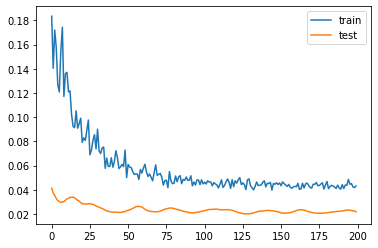

2.0150123834609985
EmilKrafth
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 6 samples
Epoch 1/200
20/20 [==============================] - 0s 24ms/step - loss: 0.3115 - mse: 0.3115 - val_loss: 0.7144 - val_mse: 0.7144
Epoch 2/200
20/20 [==============================] - 0s 400us/step - loss: 0.3196 - mse: 0.3196 - val_loss: 0.6426 - val_mse: 0.6426
Epoch 3/200
20/20 [==============================] - 0s 350us/step - loss: 0.2429 - mse: 0.2429 - val_loss: 0.5865 - val_mse: 0.5865
Epoch 4/200
20/20 [==============================] - 0s 400us/step - loss: 0.2753 - mse: 0.2753 - val_loss: 0.5346 - val_mse: 0.5346
Epoch 5/200
20/20 [==============================] - 0s 350us/step - loss: 0.1570 - mse: 0.1570 - val_loss: 0.4889 - val_mse: 0.4889
Epoch 6/200
20/20 [==============================] - 0s 350us/step - loss: 0.2824 - mse: 0.2824 - val_loss: 0.4503 - val_mse: 0.4503
Epoch 7/200
20/20 [==============================] - 0s 400us/step - loss: 0.1960 - mse: 0.1960 - val_loss: 0.4158 - val_mse: 0.4158
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 400us/step - loss: 0.0959 - mse: 0.0959 - val_loss: 0.3124 - val_mse: 0.3124
Epoch 63/200
20/20 [==============================] - 0s 500us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.3127 - val_mse: 0.3127
Epoch 64/200
20/20 [==============================] - 0s 350us/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.3133 - val_mse: 0.3133
Epoch 65/200
20/20 [==============================] - 0s 400us/step - loss: 0.0720 - mse: 0.0720 - val_loss: 0.3133 - val_mse: 0.3133
Epoch 66/200
20/20 [==============================] - 0s 400us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.3139 - val_mse: 0.3139
Epoch 67/200
20/20 [==============================] - 0s 350us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.3139 - val_mse: 0.3139
Epoch 68/200
20/20 [==============================] - 0s 400us/step - loss: 0.0790 - mse: 0.0790 - val_loss: 0.3145 - val_mse: 0.3145
Epoch 69/200
20/20 [==============================] - 0s 350us

Epoch 123/200
20/20 [==============================] - 0s 350us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.3210 - val_mse: 0.3210
Epoch 124/200
20/20 [==============================] - 0s 350us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.3217 - val_mse: 0.3217
Epoch 125/200
20/20 [==============================] - 0s 400us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.3227 - val_mse: 0.3227
Epoch 126/200
20/20 [==============================] - 0s 350us/step - loss: 0.0543 - mse: 0.0543 - val_loss: 0.3244 - val_mse: 0.3244
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.3261 - val_mse: 0.3261
Epoch 128/200
20/20 [==============================] - 0s 400us/step - loss: 0.0543 - mse: 0.0543 - val_loss: 0.3273 - val_mse: 0.3273
Epoch 129/200
20/20 [==============================] - 0s 400us/step - loss: 0.0596 - mse: 0.0596 - val_loss: 0.3289 - val_mse: 0.3289
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 350us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.3417 - val_mse: 0.3417
Epoch 185/200
20/20 [==============================] - 0s 350us/step - loss: 0.0581 - mse: 0.0581 - val_loss: 0.3434 - val_mse: 0.3434
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.3452 - val_mse: 0.3452
Epoch 187/200
20/20 [==============================] - 0s 350us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.3471 - val_mse: 0.3471
Epoch 188/200
20/20 [==============================] - 0s 400us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.3479 - val_mse: 0.3479
Epoch 189/200
20/20 [==============================] - 0s 350us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.3490 - val_mse: 0.3490
Epoch 190/200
20/20 [==============================] - 0s 350us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.3509 - val_mse: 0.3509
Epoch 191/200
20/20 [==============================] - 

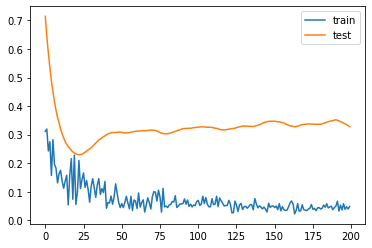

-0.29919087141752243
FabianSchär
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 0s 9ms/step - loss: 0.1638 - mse: 0.1638 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 2/200
51/51 [==============================] - 0s 196us/step - loss: 0.1440 - mse: 0.1440 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.1339 - mse: 0.1339 - val_loss: 0.0392 - val_mse: 0.0392
Epoch 4/200
51/51 [==============================] - 0s 157us/step - loss: 0.1257 - mse: 0.1257 - val_loss: 0.0376 - val_mse: 0.0376
Epoch 5/200
51/51 [==============================] - 0s 196us/step - loss: 0.1089 - mse: 0.1089 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 6/200
51/51 [==============================] - 0s 196us/step - loss: 0.1275 - mse: 0.1275 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.0941 - mse: 0.0941 - val_loss: 0.0355 - val_mse: 0.0355
Epoch 8/200
51/51 [========

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 63/200
51/51 [==============================] - 0s 157us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 64/200
51/51 [==============================] - 0s 157us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.0347 - val_mse: 0.0347
Epoch 65/200
51/51 [==============================] - 0s 196us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0345 - val_mse: 0.0345
Epoch 66/200
51/51 [==============================] - 0s 176us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 67/200
51/51 [==============================] - 0s 176us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0344 - val_mse: 0.0344
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0343 - val_mse: 0.0343
Epoch 69/200
51/51 [==============================] - 0s 157us

Epoch 123/200
51/51 [==============================] - 0s 196us/step - loss: 0.0235 - mse: 0.0235 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 124/200
51/51 [==============================] - 0s 176us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0185 - mse: 0.0185 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 126/200
51/51 [==============================] - 0s 157us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 127/200
51/51 [==============================] - 0s 176us/step - loss: 0.0194 - mse: 0.0194 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 128/200
51/51 [==============================] - 0s 176us/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 137us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 185/200
51/51 [==============================] - 0s 157us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 187/200
51/51 [==============================] - 0s 157us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0309 - val_mse: 0.0309
Epoch 188/200
51/51 [==============================] - 0s 176us/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 189/200
51/51 [==============================] - 0s 157us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 190/200
51/51 [==============================] - 0s 157us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 191/200
51/51 [==============================] - 

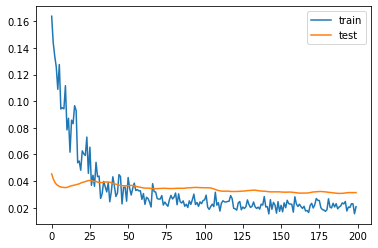

2.593907207250595
DeAndreYedlin
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.2853 - mse: 0.2853 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 2/200
108/108 [==============================] - 0s 102us/step - loss: 0.2911 - mse: 0.2911 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 3/200
108/108 [==============================] - 0s 93us/step - loss: 0.2680 - mse: 0.2680 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 4/200
108/108 [==============================] - 0s 102us/step - loss: 0.1874 - mse: 0.1874 - val_loss: 0.0122 - val_mse: 0.0122
Epoch 5/200
108/108 [==============================] - 0s 93us/step - loss: 0.2073 - mse: 0.2073 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 6/200
108/108 [==============================] - 0s 102us/step - loss: 0.2094 - mse: 0.2094 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 7/200
108/108 [==============================] - 0s 93us/step - loss: 0.1352 - mse: 0.1352 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 8/200
108

Epoch 62/200
108/108 [==============================] - 0s 93us/step - loss: 0.0563 - mse: 0.0563 - val_loss: 0.0153 - val_mse: 0.0153
Epoch 63/200
108/108 [==============================] - 0s 111us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 64/200
108/108 [==============================] - 0s 83us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 66/200
108/108 [==============================] - 0s 93us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0166 - val_mse: 0.0166
Epoch 67/200
108/108 [==============================] - 0s 83us/step - loss: 0.0609 - mse: 0.0609 - val_loss: 0.0169 - val_mse: 0.0169
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0171 - val_mse: 0.0171
Epoch 69/200
108/108 [==============================] 

108/108 [==============================] - 0s 120us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 183/200
108/108 [==============================] - 0s 102us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 184/200
108/108 [==============================] - 0s 111us/step - loss: 0.0322 - mse: 0.0322 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 186/200
108/108 [==============================] - 0s 102us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 187/200
108/108 [==============================] - 0s 93us/step - loss: 0.0400 - mse: 0.0400 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 188/200
108/108 [==============================] - 0s 93us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0142 - val_mse: 0.0142
Epoch 189/200
108/108 [==============================] - 

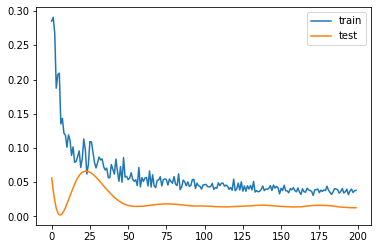

0.7867870330810547
IsaacHayden
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 21 samples
Epoch 1/200
80/80 [==============================] - 1s 7ms/step - loss: 0.2222 - mse: 0.2222 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 2/200
80/80 [==============================] - 0s 150us/step - loss: 0.1307 - mse: 0.1307 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 3/200
80/80 [==============================] - 0s 137us/step - loss: 0.1710 - mse: 0.1710 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 4/200
80/80 [==============================] - 0s 125us/step - loss: 0.1197 - mse: 0.1197 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 5/200
80/80 [==============================] - 0s 112us/step - loss: 0.1505 - mse: 0.1505 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 6/200
80/80 [==============================] - 0s 137us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.0277 - val_mse: 0.0277
Epoch 7/200
80/80 [==============================] - 0s 137us/step - loss: 0.1135 - mse: 0.1135 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 134us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 63/200
80/80 [==============================] - 0s 125us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 64/200
80/80 [==============================] - 0s 125us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 65/200
80/80 [==============================] - 0s 125us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 66/200
80/80 [==============================] - 0s 125us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 67/200
80/80 [==============================] - 0s 112us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 68/200
80/80 [==============================] - 0s 125us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 69/200
80/80 [==============================] - 0s 125us

Epoch 123/200
80/80 [==============================] - 0s 112us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 124/200
80/80 [==============================] - 0s 125us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 125/200
80/80 [==============================] - 0s 112us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 126/200
80/80 [==============================] - 0s 137us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 128/200
80/80 [==============================] - 0s 112us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0122 - val_mse: 0.0122
Epoch 129/200
80/80 [==============================] - 0s 112us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 100us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 185/200
80/80 [==============================] - 0s 100us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 186/200
80/80 [==============================] - 0s 112us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 187/200
80/80 [==============================] - 0s 112us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 188/200
80/80 [==============================] - 0s 100us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 189/200
80/80 [==============================] - 0s 112us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 190/200
80/80 [==============================] - 0s 112us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 191/200
80/80 [==============================] - 

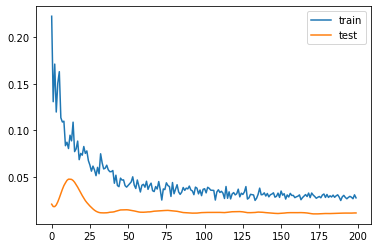

0.9899502992630006
AllanSaint-Maximin
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 22ms/step - loss: 0.1123 - mse: 0.1123 - val_loss: 0.1713 - val_mse: 0.1713
Epoch 2/200
21/21 [==============================] - 0s 333us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.1608 - val_mse: 0.1608
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.0932 - mse: 0.0932 - val_loss: 0.1521 - val_mse: 0.1521
Epoch 4/200
21/21 [==============================] - 0s 429us/step - loss: 0.0955 - mse: 0.0955 - val_loss: 0.1455 - val_mse: 0.1455
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1089 - mse: 0.1089 - val_loss: 0.1396 - val_mse: 0.1396
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.1344 - val_mse: 0.1344
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.0896 - mse: 0.0896 - val_loss: 0.1300 - val_mse: 0.1300
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.1171 - val_mse: 0.1171
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.1170 - val_mse: 0.1170
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0466 - mse: 0.0466 - val_loss: 0.1168 - val_mse: 0.1168
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0547 - mse: 0.0547 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0630 - mse: 0.0630 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.1189 - val_mse: 0.1189
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.1190 - val_mse: 0.1190
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0602 - mse: 0.0602 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.1193 - val_mse: 0.1193
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0580 - mse: 0.0580 - val_loss: 0.1194 - val_mse: 0.1194
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 384us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.1198 - val_mse: 0.1198
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.1197 - val_mse: 0.1197
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.1196 - val_mse: 0.1196
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.1195 - val_mse: 0.1195
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.1194 - val_mse: 0.1194
Epoch 191/200
21/21 [==============================] - 

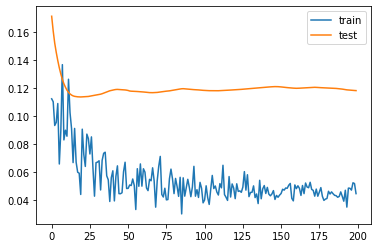

2.869049236178398
MiguelAlmirón
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 32 samples, validate on 9 samples
Epoch 1/200
32/32 [==============================] - 0s 14ms/step - loss: 0.2606 - mse: 0.2606 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 2/200
32/32 [==============================] - 0s 250us/step - loss: 0.1781 - mse: 0.1781 - val_loss: 0.0399 - val_mse: 0.0399
Epoch 3/200
32/32 [==============================] - 0s 250us/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 4/200
32/32 [==============================] - 0s 250us/step - loss: 0.2038 - mse: 0.2038 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 5/200
32/32 [==============================] - 0s 250us/step - loss: 0.2034 - mse: 0.2034 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 6/200
32/32 [==============================] - 0s 250us/step - loss: 0.1656 - mse: 0.1656 - val_loss: 0.0268 - val_mse: 0.0268
Epoch 7/200
32/32 [==============================] - 0s 250us/step - loss: 0.1355 - mse: 0.1355 - val_loss: 0.0286 - val_mse: 0.0286
Epoch 8/200
32/32 [========

Epoch 62/200
32/32 [==============================] - 0s 219us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 63/200
32/32 [==============================] - 0s 219us/step - loss: 0.0695 - mse: 0.0695 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 64/200
32/32 [==============================] - 0s 250us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 65/200
32/32 [==============================] - 0s 219us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 66/200
32/32 [==============================] - 0s 219us/step - loss: 0.0705 - mse: 0.0705 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 67/200
32/32 [==============================] - 0s 250us/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 68/200
32/32 [==============================] - 0s 219us/step - loss: 0.0713 - mse: 0.0713 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 69/200
32/32 [==============================] - 0s 250us

Epoch 123/200
32/32 [==============================] - 0s 281us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 124/200
32/32 [==============================] - 0s 250us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 125/200
32/32 [==============================] - 0s 281us/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 126/200
32/32 [==============================] - 0s 250us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 127/200
32/32 [==============================] - 0s 250us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 128/200
32/32 [==============================] - 0s 281us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0309 - val_mse: 0.0309
Epoch 129/200
32/32 [==============================] - 0s 312us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 130/200
32/32 [==============================] - 

Epoch 184/200
32/32 [==============================] - 0s 250us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 185/200
32/32 [==============================] - 0s 219us/step - loss: 0.0565 - mse: 0.0565 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 186/200
32/32 [==============================] - 0s 250us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 187/200
32/32 [==============================] - 0s 219us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 188/200
32/32 [==============================] - 0s 250us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 189/200
32/32 [==============================] - 0s 281us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 190/200
32/32 [==============================] - 0s 250us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0330 - val_mse: 0.0330
Epoch 191/200
32/32 [==============================] - 

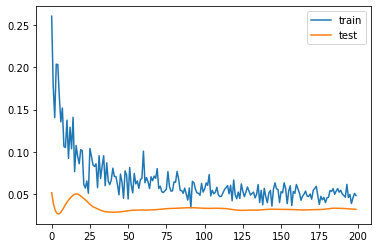

3.2115671038627625
Joelinton CássioApolinário de Lira
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 20 samples, validate on 5 samples
Epoch 1/200
20/20 [==============================] - 0s 25ms/step - loss: 0.2518 - mse: 0.2518 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 2/200
20/20 [==============================] - 0s 450us/step - loss: 0.2389 - mse: 0.2389 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 3/200
20/20 [==============================] - 0s 450us/step - loss: 0.2357 - mse: 0.2357 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 4/200
20/20 [==============================] - 0s 450us/step - loss: 0.2964 - mse: 0.2964 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 5/200
20/20 [==============================] - 0s 449us/step - loss: 0.2201 - mse: 0.2201 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 6/200
20/20 [==============================] - 0s 350us/step - loss: 0.1788 - mse: 0.1788 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 7/200
20/20 [==============================] - 0s 432us/step - loss: 0.1359 - mse: 0.1359 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 8/200
20/20 [========

Epoch 62/200
20/20 [==============================] - 0s 450us/step - loss: 0.0367 - mse: 0.0367 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 63/200
20/20 [==============================] - 0s 450us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 64/200
20/20 [==============================] - 0s 400us/step - loss: 0.0947 - mse: 0.0947 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 65/200
20/20 [==============================] - 0s 400us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 66/200
20/20 [==============================] - 0s 400us/step - loss: 0.0592 - mse: 0.0592 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 67/200
20/20 [==============================] - 0s 350us/step - loss: 0.0393 - mse: 0.0393 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 68/200
20/20 [==============================] - 0s 350us/step - loss: 0.0400 - mse: 0.0400 - val_loss: 0.0165 - val_mse: 0.0165
Epoch 69/200
20/20 [==============================] - 0s 400us

Epoch 123/200
20/20 [==============================] - 0s 400us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 124/200
20/20 [==============================] - 0s 400us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 125/200
20/20 [==============================] - 0s 400us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 126/200
20/20 [==============================] - 0s 400us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 127/200
20/20 [==============================] - 0s 350us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 128/200
20/20 [==============================] - 0s 400us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 129/200
20/20 [==============================] - 0s 400us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 130/200
20/20 [==============================] - 

Epoch 184/200
20/20 [==============================] - 0s 450us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 185/200
20/20 [==============================] - 0s 400us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 186/200
20/20 [==============================] - 0s 350us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 187/200
20/20 [==============================] - 0s 350us/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 188/200
20/20 [==============================] - 0s 400us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 189/200
20/20 [==============================] - 0s 400us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 190/200
20/20 [==============================] - 0s 350us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 191/200
20/20 [==============================] - 

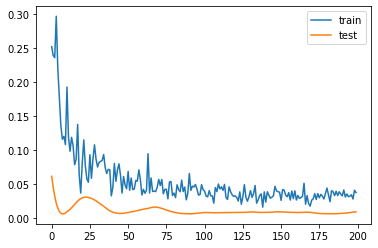

2.1027543544769287
SeanLongstaff
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 49 samples, validate on 13 samples
Epoch 1/200
49/49 [==============================] - 0s 10ms/step - loss: 0.5524 - mse: 0.5524 - val_loss: 0.4981 - val_mse: 0.4981
Epoch 2/200
49/49 [==============================] - 0s 204us/step - loss: 0.4708 - mse: 0.4708 - val_loss: 0.4382 - val_mse: 0.4382
Epoch 3/200
49/49 [==============================] - 0s 183us/step - loss: 0.4115 - mse: 0.4115 - val_loss: 0.3788 - val_mse: 0.3788
Epoch 4/200
49/49 [==============================] - 0s 184us/step - loss: 0.3856 - mse: 0.3856 - val_loss: 0.3196 - val_mse: 0.3196
Epoch 5/200
49/49 [==============================] - 0s 184us/step - loss: 0.3500 - mse: 0.3500 - val_loss: 0.2705 - val_mse: 0.2705
Epoch 6/200
49/49 [==============================] - 0s 204us/step - loss: 0.2753 - mse: 0.2753 - val_loss: 0.2262 - val_mse: 0.2262
Epoch 7/200
49/49 [==============================] - 0s 163us/step - loss: 0.2990 - mse: 0.2990 - val_loss: 0.1877 - val_mse: 0.1877
Epoch 8/200
49/49 [=======

Epoch 62/200
49/49 [==============================] - 0s 163us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 63/200
49/49 [==============================] - 0s 163us/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 64/200
49/49 [==============================] - 0s 184us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.0596 - val_mse: 0.0596
Epoch 65/200
49/49 [==============================] - 0s 163us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 66/200
49/49 [==============================] - 0s 143us/step - loss: 0.0505 - mse: 0.0505 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 67/200
49/49 [==============================] - 0s 163us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0598 - val_mse: 0.0598
Epoch 68/200
49/49 [==============================] - 0s 143us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 69/200
49/49 [==============================] - 0s 184us

Epoch 123/200
49/49 [==============================] - 0s 163us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 124/200
49/49 [==============================] - 0s 184us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 125/200
49/49 [==============================] - 0s 163us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 126/200
49/49 [==============================] - 0s 163us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 127/200
49/49 [==============================] - 0s 204us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 128/200
49/49 [==============================] - 0s 163us/step - loss: 0.0282 - mse: 0.0282 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 129/200
49/49 [==============================] - 0s 163us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 130/200
49/49 [==============================] - 

Epoch 184/200
49/49 [==============================] - 0s 184us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0650 - val_mse: 0.0650
Epoch 185/200
49/49 [==============================] - 0s 184us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0649 - val_mse: 0.0649
Epoch 186/200
49/49 [==============================] - 0s 204us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0649 - val_mse: 0.0649
Epoch 187/200
49/49 [==============================] - 0s 184us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 188/200
49/49 [==============================] - 0s 184us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 189/200
49/49 [==============================] - 0s 163us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 190/200
49/49 [==============================] - 0s 184us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 191/200
49/49 [==============================] - 

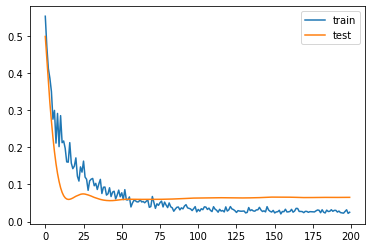

0.8906651288270951
JeffHendrick
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 105 samples, validate on 27 samples
Epoch 1/200
105/105 [==============================] - 1s 5ms/step - loss: 0.1129 - mse: 0.1129 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 2/200
105/105 [==============================] - 0s 105us/step - loss: 0.1218 - mse: 0.1218 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 3/200
105/105 [==============================] - 0s 105us/step - loss: 0.1273 - mse: 0.1273 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 4/200
105/105 [==============================] - 0s 105us/step - loss: 0.1576 - mse: 0.1576 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 5/200
105/105 [==============================] - 0s 105us/step - loss: 0.1120 - mse: 0.1120 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 6/200
105/105 [==============================] - 0s 95us/step - loss: 0.1346 - mse: 0.1346 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 7/200
105/105 [==============================] - 0s 105us/step - loss: 0.1109 - mse: 0.1109 - val_loss: 0.0262 - val_mse: 0.0262
Epoch 8/200
1

Epoch 62/200
105/105 [==============================] - 0s 86us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 63/200
105/105 [==============================] - 0s 95us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 64/200
105/105 [==============================] - 0s 95us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 65/200
105/105 [==============================] - 0s 86us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 66/200
105/105 [==============================] - 0s 95us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 67/200
105/105 [==============================] - 0s 86us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 68/200
105/105 [==============================] - 0s 86us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 69/200
105/105 [==============================] -

Epoch 123/200
105/105 [==============================] - 0s 95us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 124/200
105/105 [==============================] - 0s 86us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 125/200
105/105 [==============================] - 0s 95us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 126/200
105/105 [==============================] - 0s 95us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 127/200
105/105 [==============================] - 0s 95us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 128/200
105/105 [==============================] - 0s 86us/step - loss: 0.0260 - mse: 0.0260 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 129/200
105/105 [==============================] - 0s 105us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 130/200
105/105 [========================

Epoch 184/200
105/105 [==============================] - 0s 95us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 185/200
105/105 [==============================] - 0s 114us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 186/200
105/105 [==============================] - 0s 162us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 187/200
105/105 [==============================] - 0s 105us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 188/200
105/105 [==============================] - 0s 114us/step - loss: 0.0237 - mse: 0.0237 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 189/200
105/105 [==============================] - 0s 95us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 190/200
105/105 [==============================] - 0s 95us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 191/200
105/105 [=====================

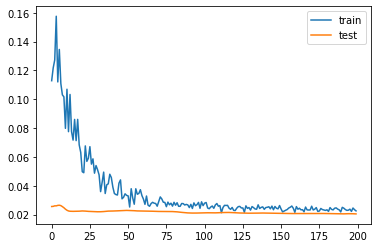

2.209876507520675
MatthewLongstaff
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 17 samples, validate on 5 samples
Epoch 1/200
17/17 [==============================] - 0s 26ms/step - loss: 0.0727 - mse: 0.0727 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 2/200
17/17 [==============================] - 0s 469us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 3/200
17/17 [==============================] - 0s 470us/step - loss: 0.0916 - mse: 0.0916 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 4/200
17/17 [==============================] - 0s 470us/step - loss: 0.0757 - mse: 0.0757 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 5/200
17/17 [==============================] - 0s 470us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 6/200
17/17 [==============================] - 0s 412us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 7/200
17/17 [==============================] - 0s 470us/step - loss: 0.0722 - mse: 0.0722 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 8/200
17/17 [========

Epoch 62/200
17/17 [==============================] - 0s 412us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 63/200
17/17 [==============================] - 0s 470us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 64/200
17/17 [==============================] - 0s 411us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 65/200
17/17 [==============================] - 0s 470us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 66/200
17/17 [==============================] - 0s 411us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 67/200
17/17 [==============================] - 0s 412us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 68/200
17/17 [==============================] - 0s 411us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 69/200
17/17 [==============================] - 0s 412us

Epoch 123/200
17/17 [==============================] - 0s 411us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 124/200
17/17 [==============================] - 0s 470us/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 125/200
17/17 [==============================] - 0s 470us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 126/200
17/17 [==============================] - 0s 470us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 127/200
17/17 [==============================] - 0s 470us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 128/200
17/17 [==============================] - 0s 470us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 129/200
17/17 [==============================] - 0s 412us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 130/200
17/17 [==============================] - 

Epoch 184/200
17/17 [==============================] - 0s 412us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 185/200
17/17 [==============================] - 0s 411us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 186/200
17/17 [==============================] - 0s 412us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 187/200
17/17 [==============================] - 0s 470us/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 188/200
17/17 [==============================] - 0s 412us/step - loss: 0.0235 - mse: 0.0235 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 189/200
17/17 [==============================] - 0s 411us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 190/200
17/17 [==============================] - 0s 470us/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 191/200
17/17 [==============================] - 

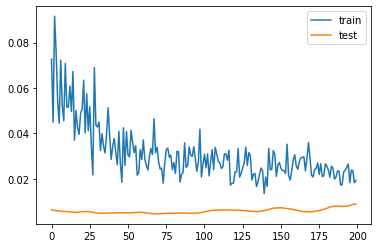

0.4584081098437309
CallumWilson
no_player_data_so_far_this_season
RyanFraser
no_player_data_so_far_this_season
JamalLewis
no_player_data_so_far_this_season
BillySharp
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 21ms/step - loss: 0.2411 - mse: 0.2411 - val_loss: 0.1233 - val_mse: 0.1233
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.3821 - mse: 0.3821 - val_loss: 0.0983 - val_mse: 0.0983
Epoch 3/200
21/21 [==============================] - 0s 381us/step - loss: 0.2443 - mse: 0.2443 - val_loss: 0.0778 - val_mse: 0.0778
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.2619 - mse: 0.2619 - val_loss: 0.0620 - val_mse: 0.0620
Epoch 5/200
21/21 [==============================] - 0s 477us/step - loss: 0.3719 - mse: 0.3719 - val_loss: 0.0494 - val_mse: 0.0494
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.1595 - mse: 0.1595 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 7/200
21/21 [==============================] - 0s 380us/step - loss: 0.2173 - mse: 0.2173 - val_loss: 0.0359 - val_mse: 0.0359
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0652 - mse: 0.0652 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 65/200
21/21 [==============================] - 0s 285us/step - loss: 0.0881 - mse: 0.0881 - val_loss: 0.0460 - val_mse: 0.0460
Epoch 66/200
21/21 [==============================] - 0s 376us/step - loss: 0.0629 - mse: 0.0629 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0702 - mse: 0.0702 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0348 - val_mse: 0.0348
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0633 - mse: 0.0633 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0505 - mse: 0.0505 - val_loss: 0.0257 - val_mse: 0.0257
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0586 - mse: 0.0586 - val_loss: 0.0268 - val_mse: 0.0268
Epoch 191/200
21/21 [==============================] - 

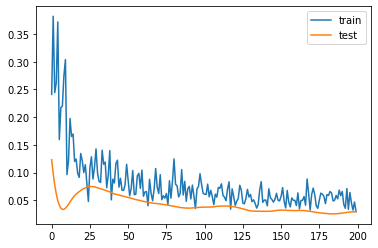

2.874275118112564
DavidMcGoldrick
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 21ms/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.1327 - val_mse: 0.1327
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.0817 - mse: 0.0817 - val_loss: 0.1310 - val_mse: 0.1310
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.1294 - val_mse: 0.1294
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.0609 - mse: 0.0609 - val_loss: 0.1286 - val_mse: 0.1286
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.1276 - val_mse: 0.1276
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.1268 - val_mse: 0.1268
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.1257 - val_mse: 0.1257
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.1328 - val_mse: 0.1328
Epoch 63/200
21/21 [==============================] - 0s 333us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.1334 - val_mse: 0.1334
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0235 - mse: 0.0235 - val_loss: 0.1341 - val_mse: 0.1341
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.1349 - val_mse: 0.1349
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0176 - mse: 0.0176 - val_loss: 0.1356 - val_mse: 0.1356
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.1362 - val_mse: 0.1362
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.1366 - val_mse: 0.1366
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0182 - mse: 0.0182 - val_loss: 0.1347 - val_mse: 0.1347
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.1344 - val_mse: 0.1344
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.1343 - val_mse: 0.1343
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.1340 - val_mse: 0.1340
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.1336 - val_mse: 0.1336
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.1333 - val_mse: 0.1333
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0151 - mse: 0.0151 - val_loss: 0.1329 - val_mse: 0.1329
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.1379 - val_mse: 0.1379
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.1380 - val_mse: 0.1380
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.1377 - val_mse: 0.1377
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.1376 - val_mse: 0.1376
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0156 - mse: 0.0156 - val_loss: 0.1372 - val_mse: 0.1372
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.1363 - val_mse: 0.1363
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0182 - mse: 0.0182 - val_loss: 0.1357 - val_mse: 0.1357
Epoch 191/200
21/21 [==============================] - 

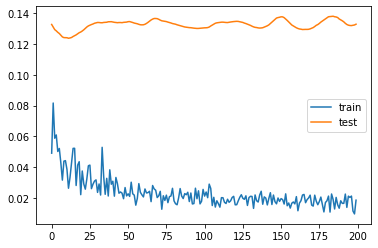

1.6747809052467346
ChrisBasham
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 22ms/step - loss: 0.2081 - mse: 0.2081 - val_loss: 0.0771 - val_mse: 0.0771
Epoch 2/200
21/21 [==============================] - 0s 380us/step - loss: 0.3323 - mse: 0.3323 - val_loss: 0.0792 - val_mse: 0.0792
Epoch 3/200
21/21 [==============================] - 0s 524us/step - loss: 0.1772 - mse: 0.1772 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2714 - mse: 0.2714 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.3690 - mse: 0.3690 - val_loss: 0.0861 - val_mse: 0.0861
Epoch 6/200
21/21 [==============================] - 0s 332us/step - loss: 0.1592 - mse: 0.1592 - val_loss: 0.0894 - val_mse: 0.0894
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.2932 - mse: 0.2932 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.1224 - mse: 0.1224 - val_loss: 0.1694 - val_mse: 0.1694
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0898 - mse: 0.0898 - val_loss: 0.1691 - val_mse: 0.1691
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.1176 - mse: 0.1176 - val_loss: 0.1692 - val_mse: 0.1692
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.1695 - val_mse: 0.1695
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.1765 - mse: 0.1765 - val_loss: 0.1699 - val_mse: 0.1699
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.1157 - mse: 0.1157 - val_loss: 0.1706 - val_mse: 0.1706
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.1716 - val_mse: 0.1716
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.1370 - mse: 0.1370 - val_loss: 0.2148 - val_mse: 0.2148
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.1048 - mse: 0.1048 - val_loss: 0.2155 - val_mse: 0.2155
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.1181 - mse: 0.1181 - val_loss: 0.2167 - val_mse: 0.2167
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0837 - mse: 0.0837 - val_loss: 0.2180 - val_mse: 0.2180
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0845 - mse: 0.0845 - val_loss: 0.2194 - val_mse: 0.2194
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.1239 - mse: 0.1239 - val_loss: 0.2203 - val_mse: 0.2203
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.1106 - mse: 0.1106 - val_loss: 0.2216 - val_mse: 0.2216
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0998 - mse: 0.0998 - val_loss: 0.2443 - val_mse: 0.2443
Epoch 185/200
21/21 [==============================] - 0s 428us/step - loss: 0.0795 - mse: 0.0795 - val_loss: 0.2445 - val_mse: 0.2445
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0905 - mse: 0.0905 - val_loss: 0.2444 - val_mse: 0.2444
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0999 - mse: 0.0999 - val_loss: 0.2441 - val_mse: 0.2441
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0694 - mse: 0.0694 - val_loss: 0.2447 - val_mse: 0.2447
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0867 - mse: 0.0867 - val_loss: 0.2467 - val_mse: 0.2467
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0664 - mse: 0.0664 - val_loss: 0.2485 - val_mse: 0.2485
Epoch 191/200
21/21 [==============================] - 

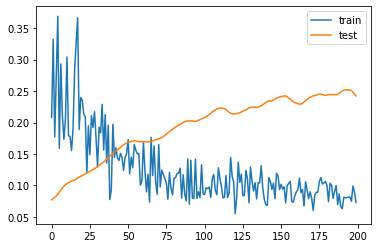

2.9684485495090485
JohnFleck
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 21ms/step - loss: 0.2082 - mse: 0.2082 - val_loss: 0.1451 - val_mse: 0.1451
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.1433 - mse: 0.1433 - val_loss: 0.1494 - val_mse: 0.1494
Epoch 3/200
21/21 [==============================] - 0s 381us/step - loss: 0.2539 - mse: 0.2539 - val_loss: 0.1525 - val_mse: 0.1525
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2255 - mse: 0.2255 - val_loss: 0.1574 - val_mse: 0.1574
Epoch 5/200
21/21 [==============================] - 0s 333us/step - loss: 0.2839 - mse: 0.2839 - val_loss: 0.1646 - val_mse: 0.1646
Epoch 6/200
21/21 [==============================] - 0s 333us/step - loss: 0.1815 - mse: 0.1815 - val_loss: 0.1690 - val_mse: 0.1690
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.1506 - mse: 0.1506 - val_loss: 0.1706 - val_mse: 0.1706
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0800 - mse: 0.0800 - val_loss: 0.1135 - val_mse: 0.1135
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.1181 - mse: 0.1181 - val_loss: 0.1119 - val_mse: 0.1119
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.0876 - mse: 0.0876 - val_loss: 0.1100 - val_mse: 0.1100
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.1175 - mse: 0.1175 - val_loss: 0.1087 - val_mse: 0.1087
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0819 - mse: 0.0819 - val_loss: 0.1079 - val_mse: 0.1079
Epoch 67/200
21/21 [==============================] - 0s 377us/step - loss: 0.0734 - mse: 0.0734 - val_loss: 0.1068 - val_mse: 0.1068
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.1586 - mse: 0.1586 - val_loss: 0.1067 - val_mse: 0.1067
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0663 - mse: 0.0663 - val_loss: 0.0997 - val_mse: 0.0997
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.1027 - mse: 0.1027 - val_loss: 0.0982 - val_mse: 0.0982
Epoch 125/200
21/21 [==============================] - 0s 428us/step - loss: 0.0851 - mse: 0.0851 - val_loss: 0.0971 - val_mse: 0.0971
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0682 - mse: 0.0682 - val_loss: 0.0961 - val_mse: 0.0961
Epoch 127/200
21/21 [==============================] - 0s 476us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.0949 - val_mse: 0.0949
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0882 - mse: 0.0882 - val_loss: 0.0939 - val_mse: 0.0939
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0623 - mse: 0.0623 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.1023 - val_mse: 0.1023
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.0718 - mse: 0.0718 - val_loss: 0.1012 - val_mse: 0.1012
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0790 - mse: 0.0790 - val_loss: 0.1000 - val_mse: 0.1000
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0991 - val_mse: 0.0991
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0669 - mse: 0.0669 - val_loss: 0.0988 - val_mse: 0.0988
Epoch 189/200
21/21 [==============================] - 0s 380us/step - loss: 0.0874 - mse: 0.0874 - val_loss: 0.0989 - val_mse: 0.0989
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0989 - val_mse: 0.0989
Epoch 191/200
21/21 [==============================] - 

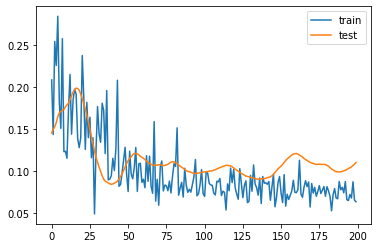

5.787323713302612
EndaStevens
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 24ms/step - loss: 0.3142 - mse: 0.3142 - val_loss: 0.3424 - val_mse: 0.3424
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.2459 - mse: 0.2459 - val_loss: 0.3031 - val_mse: 0.3031
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.3595 - mse: 0.3595 - val_loss: 0.2686 - val_mse: 0.2686
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2496 - mse: 0.2496 - val_loss: 0.2403 - val_mse: 0.2403
Epoch 5/200
21/21 [==============================] - 0s 380us/step - loss: 0.2123 - mse: 0.2123 - val_loss: 0.2137 - val_mse: 0.2137
Epoch 6/200
21/21 [==============================] - 0s 333us/step - loss: 0.2594 - mse: 0.2594 - val_loss: 0.1907 - val_mse: 0.1907
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.2724 - mse: 0.2724 - val_loss: 0.1703 - val_mse: 0.1703
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.1274 - val_mse: 0.1274
Epoch 63/200
21/21 [==============================] - 0s 333us/step - loss: 0.0918 - mse: 0.0918 - val_loss: 0.1285 - val_mse: 0.1285
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0754 - mse: 0.0754 - val_loss: 0.1296 - val_mse: 0.1296
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0955 - mse: 0.0955 - val_loss: 0.1306 - val_mse: 0.1306
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.1168 - mse: 0.1168 - val_loss: 0.1315 - val_mse: 0.1315
Epoch 67/200
21/21 [==============================] - 0s 428us/step - loss: 0.0897 - mse: 0.0897 - val_loss: 0.1321 - val_mse: 0.1321
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.1292 - mse: 0.1292 - val_loss: 0.1328 - val_mse: 0.1328
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 476us/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.1687 - val_mse: 0.1687
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.1085 - mse: 0.1085 - val_loss: 0.1680 - val_mse: 0.1680
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.1674 - val_mse: 0.1674
Epoch 126/200
21/21 [==============================] - 0s 428us/step - loss: 0.0813 - mse: 0.0813 - val_loss: 0.1670 - val_mse: 0.1670
Epoch 127/200
21/21 [==============================] - 0s 428us/step - loss: 0.1005 - mse: 0.1005 - val_loss: 0.1668 - val_mse: 0.1668
Epoch 128/200
21/21 [==============================] - 0s 428us/step - loss: 0.0695 - mse: 0.0695 - val_loss: 0.1671 - val_mse: 0.1671
Epoch 129/200
21/21 [==============================] - 0s 428us/step - loss: 0.0787 - mse: 0.0787 - val_loss: 0.1672 - val_mse: 0.1672
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.1649 - val_mse: 0.1649
Epoch 185/200
21/21 [==============================] - 0s 476us/step - loss: 0.0751 - mse: 0.0751 - val_loss: 0.1644 - val_mse: 0.1644
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0768 - mse: 0.0768 - val_loss: 0.1638 - val_mse: 0.1638
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0850 - mse: 0.0850 - val_loss: 0.1635 - val_mse: 0.1635
Epoch 188/200
21/21 [==============================] - 0s 428us/step - loss: 0.0789 - mse: 0.0789 - val_loss: 0.1633 - val_mse: 0.1633
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0696 - mse: 0.0696 - val_loss: 0.1634 - val_mse: 0.1634
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0760 - mse: 0.0760 - val_loss: 0.1635 - val_mse: 0.1635
Epoch 191/200
21/21 [==============================] - 

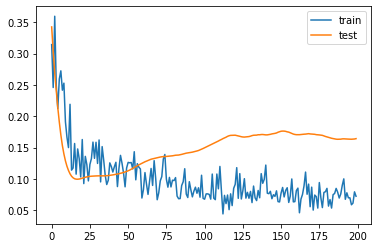

4.538845896720886
OliverNorwood
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 26ms/step - loss: 0.3157 - mse: 0.3157 - val_loss: 0.0821 - val_mse: 0.0821
Epoch 2/200
21/21 [==============================] - 0s 380us/step - loss: 0.2248 - mse: 0.2248 - val_loss: 0.0669 - val_mse: 0.0669
Epoch 3/200
21/21 [==============================] - 0s 429us/step - loss: 0.2663 - mse: 0.2663 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 4/200
21/21 [==============================] - 0s 476us/step - loss: 0.1342 - mse: 0.1342 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 5/200
21/21 [==============================] - 0s 476us/step - loss: 0.2558 - mse: 0.2558 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.1376 - mse: 0.1376 - val_loss: 0.0350 - val_mse: 0.0350
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.2236 - mse: 0.2236 - val_loss: 0.0342 - val_mse: 0.0342
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.1115 - mse: 0.1115 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 63/200
21/21 [==============================] - 0s 476us/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 64/200
21/21 [==============================] - 0s 428us/step - loss: 0.0942 - mse: 0.0942 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0933 - mse: 0.0933 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 67/200
21/21 [==============================] - 0s 428us/step - loss: 0.0896 - mse: 0.0896 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0611 - mse: 0.0611 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0511 - val_mse: 0.0511
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.0513 - val_mse: 0.0513
Epoch 125/200
21/21 [==============================] - 0s 428us/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 127/200
21/21 [==============================] - 0s 428us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0520 - val_mse: 0.0520
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0513 - mse: 0.0513 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0602 - mse: 0.0602 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 428us/step - loss: 0.0726 - mse: 0.0726 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0651 - mse: 0.0651 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 187/200
21/21 [==============================] - 0s 428us/step - loss: 0.0670 - mse: 0.0670 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 189/200
21/21 [==============================] - 0s 428us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0739 - mse: 0.0739 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 191/200
21/21 [==============================] - 

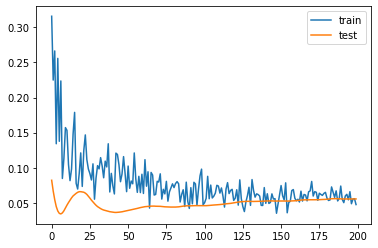

2.7470754832029343
GeorgeBaldock
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 27ms/step - loss: 0.3275 - mse: 0.3275 - val_loss: 0.1296 - val_mse: 0.1296
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.2892 - mse: 0.2892 - val_loss: 0.1078 - val_mse: 0.1078
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.2650 - mse: 0.2650 - val_loss: 0.0881 - val_mse: 0.0881
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2938 - mse: 0.2938 - val_loss: 0.0719 - val_mse: 0.0719
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.1624 - mse: 0.1624 - val_loss: 0.0595 - val_mse: 0.0595
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.2518 - mse: 0.2518 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.2371 - mse: 0.2371 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0794 - mse: 0.0794 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0875 - mse: 0.0875 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0712 - mse: 0.0712 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 66/200
21/21 [==============================] - 0s 476us/step - loss: 0.0735 - mse: 0.0735 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0674 - mse: 0.0674 - val_loss: 0.0480 - val_mse: 0.0480
Epoch 68/200
21/21 [==============================] - 0s 375us/step - loss: 0.0800 - mse: 0.0800 - val_loss: 0.0482 - val_mse: 0.0482
Epoch 69/200
21/21 [==============================] - 0s 428us

Epoch 123/200
21/21 [==============================] - 0s 428us/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.0514 - mse: 0.0514 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 125/200
21/21 [==============================] - 0s 428us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 126/200
21/21 [==============================] - 0s 476us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0481 - val_mse: 0.0481
Epoch 127/200
21/21 [==============================] - 0s 428us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 128/200
21/21 [==============================] - 0s 523us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 129/200
21/21 [==============================] - 0s 428us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 188/200
21/21 [==============================] - 0s 428us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 189/200
21/21 [==============================] - 0s 428us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 191/200
21/21 [==============================] - 

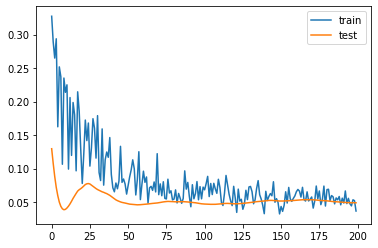

4.28561994433403
JackRobinson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JohnEgan
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 24ms/step - loss: 0.2053 - mse: 0.2053 - val_loss: 0.2034 - val_mse: 0.2034
Epoch 2/200
21/21 [==============================] - 0s 333us/step - loss: 0.1706 - mse: 0.1706 - val_loss: 0.1912 - val_mse: 0.1912
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1719 - mse: 0.1719 - val_loss: 0.1790 - val_mse: 0.1790
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.1971 - mse: 0.1971 - val_loss: 0.1681 - val_mse: 0.1681
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1075 - mse: 0.1075 - val_loss: 0.1588 - val_mse: 0.1588
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.1340 - mse: 0.1340 - val_loss: 0.1499 - val_mse: 0.1499
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.1230 - mse: 0.1230 - val_loss: 0.1415 - val_mse: 0.1415
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 428us/step - loss: 0.0238 - mse: 0.0238 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.1142 - val_mse: 0.1142
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.1141 - val_mse: 0.1141
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.1140 - val_mse: 0.1140
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.1139 - val_mse: 0.1139
Epoch 67/200
21/21 [==============================] - 0s 428us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.1139 - val_mse: 0.1139
Epoch 68/200
21/21 [==============================] - 0s 380us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.1165 - val_mse: 0.1165
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.1166 - val_mse: 0.1166
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.1168 - val_mse: 0.1168
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.1170 - val_mse: 0.1170
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.1171 - val_mse: 0.1171
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.1171 - val_mse: 0.1171
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.1170 - val_mse: 0.1170
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.1155 - val_mse: 0.1155
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.1156 - val_mse: 0.1156
Epoch 186/200
21/21 [==============================] - 0s 428us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.1159 - val_mse: 0.1159
Epoch 187/200
21/21 [==============================] - 0s 428us/step - loss: 0.0144 - mse: 0.0144 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.1161 - val_mse: 0.1161
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 190/200
21/21 [==============================] - 0s 285us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.1161 - val_mse: 0.1161
Epoch 191/200
21/21 [==============================] - 

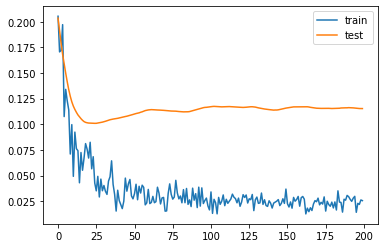

3.617028415203095
JackO'Connell
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 24ms/step - loss: 0.2421 - mse: 0.2421 - val_loss: 0.1386 - val_mse: 0.1386
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.2547 - mse: 0.2547 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1513 - mse: 0.1513 - val_loss: 0.1086 - val_mse: 0.1086
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2613 - mse: 0.2613 - val_loss: 0.0980 - val_mse: 0.0980
Epoch 5/200
21/21 [==============================] - 0s 476us/step - loss: 0.2345 - mse: 0.2345 - val_loss: 0.0895 - val_mse: 0.0895
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.1319 - mse: 0.1319 - val_loss: 0.0821 - val_mse: 0.0821
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.1319 - mse: 0.1319 - val_loss: 0.0773 - val_mse: 0.0773
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0592 - mse: 0.0592 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 63/200
21/21 [==============================] - 0s 410us/step - loss: 0.0577 - mse: 0.0577 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.0911 - mse: 0.0911 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0738 - mse: 0.0738 - val_loss: 0.0492 - val_mse: 0.0492
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0519 - mse: 0.0519 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0514 - mse: 0.0514 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 127/200
21/21 [==============================] - 0s 428us/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0687 - mse: 0.0687 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0400 - mse: 0.0400 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0418 - mse: 0.0418 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 191/200
21/21 [==============================] - 

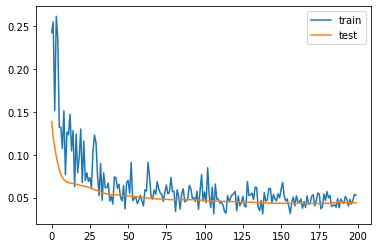

3.299492985010147
JohnLundstram
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 21ms/step - loss: 0.2172 - mse: 0.2172 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.2434 - mse: 0.2434 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 3/200
21/21 [==============================] - 0s 476us/step - loss: 0.2401 - mse: 0.2401 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.2460 - mse: 0.2460 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1824 - mse: 0.1824 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 6/200
21/21 [==============================] - 0s 476us/step - loss: 0.3104 - mse: 0.3104 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 7/200
21/21 [==============================] - 0s 476us/step - loss: 0.1500 - mse: 0.1500 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0885 - mse: 0.0885 - val_loss: 0.0643 - val_mse: 0.0643
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0634 - val_mse: 0.0634
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0815 - mse: 0.0815 - val_loss: 0.0621 - val_mse: 0.0621
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0615 - val_mse: 0.0615
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0610 - val_mse: 0.0610
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0525 - val_mse: 0.0525
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0553 - mse: 0.0553 - val_loss: 0.0531 - val_mse: 0.0531
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0532 - val_mse: 0.0532
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0533 - val_mse: 0.0533
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0511 - val_mse: 0.0511
Epoch 185/200
21/21 [==============================] - 0s 476us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0512 - val_mse: 0.0512
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 187/200
21/21 [==============================] - 0s 476us/step - loss: 0.0662 - mse: 0.0662 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0661 - mse: 0.0661 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 191/200
21/21 [==============================] - 

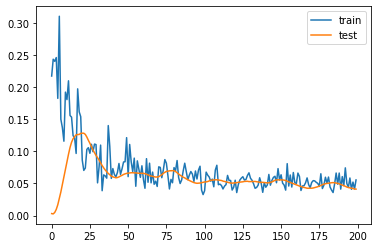

6.779154449701309
BenOsborn
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 24ms/step - loss: 0.0741 - mse: 0.0741 - val_loss: 0.7328 - val_mse: 0.7328
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.1099 - mse: 0.1099 - val_loss: 0.7190 - val_mse: 0.7190
Epoch 3/200
21/21 [==============================] - 0s 476us/step - loss: 0.0996 - mse: 0.0996 - val_loss: 0.6883 - val_mse: 0.6883
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.1084 - mse: 0.1084 - val_loss: 0.6561 - val_mse: 0.6561
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.6213 - val_mse: 0.6213
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.1306 - mse: 0.1306 - val_loss: 0.5892 - val_mse: 0.5892
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.0770 - mse: 0.0770 - val_loss: 0.5596 - val_mse: 0.5596
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.4550 - val_mse: 0.4550
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.4560 - val_mse: 0.4560
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.4580 - val_mse: 0.4580
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.4611 - val_mse: 0.4611
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.4628 - val_mse: 0.4628
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.4645 - val_mse: 0.4645
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.4660 - val_mse: 0.4660
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 428us/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.4645 - val_mse: 0.4645
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.4619 - val_mse: 0.4619
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.4590 - val_mse: 0.4590
Epoch 126/200
21/21 [==============================] - 0s 428us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.4562 - val_mse: 0.4562
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0223 - mse: 0.0223 - val_loss: 0.4538 - val_mse: 0.4538
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.4521 - val_mse: 0.4521
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.4521 - val_mse: 0.4521
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0161 - mse: 0.0161 - val_loss: 0.4695 - val_mse: 0.4695
Epoch 185/200
21/21 [==============================] - 0s 428us/step - loss: 0.0165 - mse: 0.0165 - val_loss: 0.4678 - val_mse: 0.4678
Epoch 186/200
21/21 [==============================] - 0s 476us/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.4665 - val_mse: 0.4665
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.4648 - val_mse: 0.4648
Epoch 188/200
21/21 [==============================] - 0s 428us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.4648 - val_mse: 0.4648
Epoch 189/200
21/21 [==============================] - 0s 333us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.4655 - val_mse: 0.4655
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.4657 - val_mse: 0.4657
Epoch 191/200
21/21 [==============================] - 

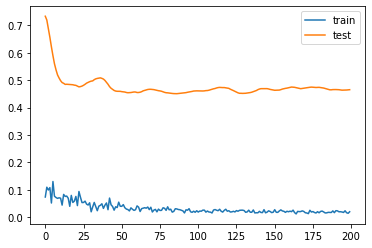

0.22886692732572556
OliverMcBurnie
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 25ms/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.1779 - val_mse: 0.1779
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1304 - mse: 0.1304 - val_loss: 0.1693 - val_mse: 0.1693
Epoch 3/200
21/21 [==============================] - 0s 476us/step - loss: 0.0860 - mse: 0.0860 - val_loss: 0.1609 - val_mse: 0.1609
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.0945 - mse: 0.0945 - val_loss: 0.1543 - val_mse: 0.1543
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.1483 - val_mse: 0.1483
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.1434 - val_mse: 0.1434
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.0560 - mse: 0.0560 - val_loss: 0.1394 - val_mse: 0.1394
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 64/200
21/21 [==============================] - 0s 428us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 67/200
21/21 [==============================] - 0s 428us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 69/200
21/21 [==============================] - 0s 428us

Epoch 123/200
21/21 [==============================] - 0s 428us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.1140 - val_mse: 0.1140
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.1139 - val_mse: 0.1139
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.1137 - val_mse: 0.1137
Epoch 127/200
21/21 [==============================] - 0s 428us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.1136 - val_mse: 0.1136
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.1134 - val_mse: 0.1134
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.1134 - val_mse: 0.1134
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 428us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.1152 - val_mse: 0.1152
Epoch 185/200
21/21 [==============================] - 0s 571us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.1152 - val_mse: 0.1152
Epoch 186/200
21/21 [==============================] - 0s 476us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.1152 - val_mse: 0.1152
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.1150 - val_mse: 0.1150
Epoch 188/200
21/21 [==============================] - 0s 360us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 189/200
21/21 [==============================] - 0s 476us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 191/200
21/21 [==============================] - 

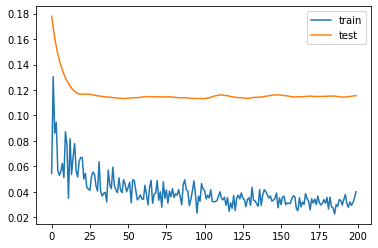

2.5012544989585876
LysMousset
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 28 samples
Epoch 1/200
108/108 [==============================] - 1s 5ms/step - loss: 0.2327 - mse: 0.2327 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 2/200
108/108 [==============================] - 0s 102us/step - loss: 0.2167 - mse: 0.2167 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 3/200
108/108 [==============================] - 0s 111us/step - loss: 0.1785 - mse: 0.1785 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 4/200
108/108 [==============================] - 0s 111us/step - loss: 0.1710 - mse: 0.1710 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 5/200
108/108 [==============================] - 0s 93us/step - loss: 0.1417 - mse: 0.1417 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 6/200
108/108 [==============================] - 0s 93us/step - loss: 0.1680 - mse: 0.1680 - val_loss: 0.0224 - val_mse: 0.0224
Epoch 7/200
108/108 [==============================] - 0s 93us/step - loss: 0.1592 - mse: 0.1592 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 8/200
108

Epoch 62/200
108/108 [==============================] - 0s 93us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 63/200
108/108 [==============================] - 0s 93us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 64/200
108/108 [==============================] - 0s 93us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 65/200
108/108 [==============================] - 0s 83us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 66/200
108/108 [==============================] - 0s 102us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 67/200
108/108 [==============================] - 0s 102us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 68/200
108/108 [==============================] - 0s 83us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 69/200
108/108 [==============================]

Epoch 123/200
108/108 [==============================] - 0s 102us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 124/200
108/108 [==============================] - 0s 93us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 125/200
108/108 [==============================] - 0s 83us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 126/200
108/108 [==============================] - 0s 93us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 127/200
108/108 [==============================] - 0s 93us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 128/200
108/108 [==============================] - 0s 97us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 129/200
108/108 [==============================] - 0s 102us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 130/200
108/108 [=======================

Epoch 184/200
108/108 [==============================] - 0s 83us/step - loss: 0.0167 - mse: 0.0167 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 186/200
108/108 [==============================] - 0s 93us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 187/200
108/108 [==============================] - 0s 102us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 188/200
108/108 [==============================] - 0s 111us/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 189/200
108/108 [==============================] - 0s 111us/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 190/200
108/108 [==============================] - 0s 83us/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 191/200
108/108 [=====================

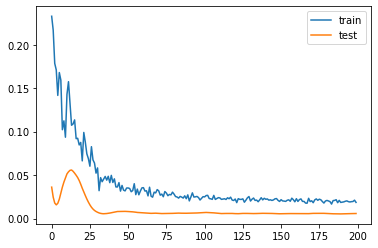

0.8872123360633851
SanderBerge
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



LukeFreeman
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 23ms/step - loss: 0.1907 - mse: 0.1907 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1603 - mse: 0.1603 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1392 - mse: 0.1392 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.1236 - mse: 0.1236 - val_loss: 0.0208 - val_mse: 0.0208
Epoch 5/200
21/21 [==============================] - 0s 476us/step - loss: 0.0820 - mse: 0.0820 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.1058 - mse: 0.1058 - val_loss: 0.0214 - val_mse: 0.0214
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.1225 - mse: 0.1225 - val_loss: 0.0231 - val_mse: 0.0231
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0142 - val_mse: 0.0142
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0139 - val_mse: 0.0139
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 124/200
21/21 [==============================] - 0s 333us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 126/200
21/21 [==============================] - 0s 428us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 129/200
21/21 [==============================] - 0s 428us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0319 - mse: 0.0319 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 185/200
21/21 [==============================] - 0s 428us/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 187/200
21/21 [==============================] - 0s 428us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 191/200
21/21 [==============================] - 

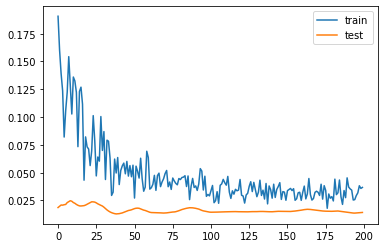

0.04424057900905609
AaronRamsdale
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 28ms/step - loss: 0.1174 - mse: 0.1174 - val_loss: 0.2294 - val_mse: 0.2294
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.1072 - mse: 0.1072 - val_loss: 0.2193 - val_mse: 0.2193
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1156 - mse: 0.1156 - val_loss: 0.2101 - val_mse: 0.2101
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1110 - mse: 0.1110 - val_loss: 0.2015 - val_mse: 0.2015
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.1038 - mse: 0.1038 - val_loss: 0.1932 - val_mse: 0.1932
Epoch 6/200
21/21 [==============================] - 0s 524us/step - loss: 0.0812 - mse: 0.0812 - val_loss: 0.1855 - val_mse: 0.1855
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.0758 - mse: 0.0758 - val_loss: 0.1782 - val_mse: 0.1782
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 333us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.1045 - val_mse: 0.1045
Epoch 63/200
21/21 [==============================] - 0s 324us/step - loss: 0.0505 - mse: 0.0505 - val_loss: 0.1049 - val_mse: 0.1049
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.1052 - val_mse: 0.1052
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.1055 - val_mse: 0.1055
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.1057 - val_mse: 0.1057
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.1058 - val_mse: 0.1058
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.1060 - val_mse: 0.1060
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.1142 - val_mse: 0.1142
Epoch 124/200
21/21 [==============================] - 0s 523us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 125/200
21/21 [==============================] - 0s 476us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.1154 - val_mse: 0.1154
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.1166 - val_mse: 0.1166
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.1172 - val_mse: 0.1172
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0517 - mse: 0.0517 - val_loss: 0.1177 - val_mse: 0.1177
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 476us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.1261 - val_mse: 0.1261
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.1265 - val_mse: 0.1265
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.1267 - val_mse: 0.1267
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.1268 - val_mse: 0.1268
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.1267 - val_mse: 0.1267
Epoch 189/200
21/21 [==============================] - 0s 428us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.1265 - val_mse: 0.1265
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.1259 - val_mse: 0.1259
Epoch 191/200
21/21 [==============================] - 

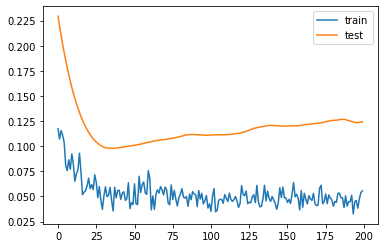

2.867232710123062
ShaneLong
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 0s 4ms/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 2/200
111/111 [==============================] - 0s 99us/step - loss: 0.0553 - mse: 0.0553 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 3/200
111/111 [==============================] - 0s 99us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0253 - val_mse: 0.0253
Epoch 4/200
111/111 [==============================] - 0s 99us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 5/200
111/111 [==============================] - 0s 90us/step - loss: 0.0562 - mse: 0.0562 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 6/200
111/111 [==============================] - 0s 99us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 7/200
111/111 [==============================] - 0s 243us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 8/200
111/1

Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 63/200
111/111 [==============================] - 0s 90us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 64/200
111/111 [==============================] - 0s 108us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 65/200
111/111 [==============================] - 0s 135us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 66/200
111/111 [==============================] - 0s 99us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 67/200
111/111 [==============================] - 0s 90us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 68/200
111/111 [==============================] - 0s 90us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 69/200
111/111 [==============================]

Epoch 123/200
111/111 [==============================] - 0s 81us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 124/200
111/111 [==============================] - 0s 81us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 125/200
111/111 [==============================] - 0s 90us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 126/200
111/111 [==============================] - 0s 90us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 127/200
111/111 [==============================] - 0s 90us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 128/200
111/111 [==============================] - 0s 99us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 129/200
111/111 [==============================] - 0s 90us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 130/200
111/111 [=========================

Epoch 184/200
111/111 [==============================] - 0s 90us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 185/200
111/111 [==============================] - 0s 90us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 186/200
111/111 [==============================] - 0s 90us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 187/200
111/111 [==============================] - 0s 90us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 188/200
111/111 [==============================] - 0s 81us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 189/200
111/111 [==============================] - 0s 90us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 190/200
111/111 [==============================] - 0s 81us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 191/200
111/111 [=========================

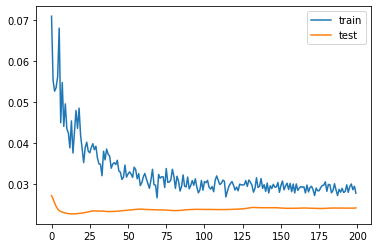

1.2950651049613953
RyanBertrand
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.3967 - mse: 0.3967 - val_loss: 0.4327 - val_mse: 0.4327
Epoch 2/200
112/112 [==============================] - 0s 98us/step - loss: 0.4288 - mse: 0.4288 - val_loss: 0.3677 - val_mse: 0.3677
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.3314 - mse: 0.3314 - val_loss: 0.2995 - val_mse: 0.2995
Epoch 4/200
112/112 [==============================] - 0s 116us/step - loss: 0.3016 - mse: 0.3016 - val_loss: 0.2427 - val_mse: 0.2427
Epoch 5/200
112/112 [==============================] - 0s 98us/step - loss: 0.2662 - mse: 0.2662 - val_loss: 0.1926 - val_mse: 0.1926
Epoch 6/200
112/112 [==============================] - 0s 89us/step - loss: 0.2601 - mse: 0.2601 - val_loss: 0.1501 - val_mse: 0.1501
Epoch 7/200
112/112 [==============================] - 0s 89us/step - loss: 0.2086 - mse: 0.2086 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 8/200
112/

Epoch 62/200
112/112 [==============================] - 0s 98us/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0374 - val_mse: 0.0374
Epoch 63/200
112/112 [==============================] - 0s 89us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0372 - val_mse: 0.0372
Epoch 64/200
112/112 [==============================] - 0s 80us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0370 - val_mse: 0.0370
Epoch 65/200
112/112 [==============================] - 0s 98us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0368 - val_mse: 0.0368
Epoch 66/200
112/112 [==============================] - 0s 98us/step - loss: 0.0419 - mse: 0.0419 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 67/200
112/112 [==============================] - 0s 89us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 68/200
112/112 [==============================] - 0s 89us/step - loss: 0.0427 - mse: 0.0427 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 69/200
112/112 [==============================] -

Epoch 123/200
112/112 [==============================] - 0s 80us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0342 - val_mse: 0.0342
Epoch 124/200
112/112 [==============================] - 0s 98us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 125/200
112/112 [==============================] - 0s 89us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 126/200
112/112 [==============================] - 0s 89us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 127/200
112/112 [==============================] - 0s 80us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 128/200
112/112 [==============================] - 0s 98us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 129/200
112/112 [==============================] - 0s 89us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 130/200
112/112 [=========================

Epoch 184/200
112/112 [==============================] - 0s 98us/step - loss: 0.0189 - mse: 0.0189 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 185/200
112/112 [==============================] - 0s 89us/step - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 186/200
112/112 [==============================] - 0s 89us/step - loss: 0.0203 - mse: 0.0203 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 187/200
112/112 [==============================] - 0s 80us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 188/200
112/112 [==============================] - 0s 89us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 189/200
112/112 [==============================] - 0s 89us/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 190/200
112/112 [==============================] - 0s 98us/step - loss: 0.0215 - mse: 0.0215 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 191/200
112/112 [=========================

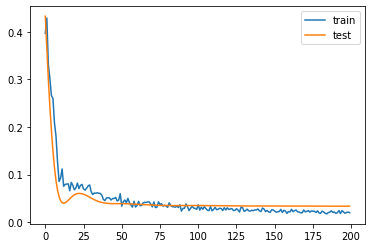

3.9238872528076163
AlexMcCarthy
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.1553 - mse: 0.1553 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 2/200
108/108 [==============================] - 0s 102us/step - loss: 0.1871 - mse: 0.1871 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 3/200
108/108 [==============================] - 0s 102us/step - loss: 0.1846 - mse: 0.1846 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 4/200
108/108 [==============================] - 0s 111us/step - loss: 0.1449 - mse: 0.1449 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 5/200
108/108 [==============================] - 0s 102us/step - loss: 0.1549 - mse: 0.1549 - val_loss: 0.0416 - val_mse: 0.0416
Epoch 6/200
108/108 [==============================] - 0s 93us/step - loss: 0.1688 - mse: 0.1688 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 7/200
108/108 [==============================] - 0s 102us/step - loss: 0.1339 - mse: 0.1339 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 8/200
1

Epoch 62/200
108/108 [==============================] - 0s 93us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 63/200
108/108 [==============================] - 0s 93us/step - loss: 0.0519 - mse: 0.0519 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 64/200
108/108 [==============================] - 0s 102us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 65/200
108/108 [==============================] - 0s 93us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 66/200
108/108 [==============================] - 0s 93us/step - loss: 0.0514 - mse: 0.0514 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 67/200
108/108 [==============================] - 0s 83us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 68/200
108/108 [==============================] - 0s 102us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0143 - val_mse: 0.0143
Epoch 69/200
108/108 [==============================]

Epoch 123/200
108/108 [==============================] - 0s 102us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 124/200
108/108 [==============================] - 0s 95us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 125/200
108/108 [==============================] - 0s 111us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 126/200
108/108 [==============================] - 0s 120us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 127/200
108/108 [==============================] - 0s 111us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 128/200
108/108 [==============================] - 0s 111us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 129/200
108/108 [==============================] - 0s 102us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 130/200
108/108 [===================

Epoch 183/200
108/108 [==============================] - 0s 102us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 184/200
108/108 [==============================] - 0s 102us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 186/200
108/108 [==============================] - 0s 111us/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 187/200
108/108 [==============================] - 0s 102us/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 188/200
108/108 [==============================] - 0s 96us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 189/200
108/108 [==============================] - 0s 102us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 190/200
108/108 [===================

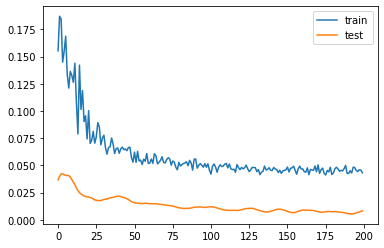

1.3779269456863403
OriolRomeu Vidal
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 4ms/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 2/200
110/110 [==============================] - 0s 109us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 3/200
110/110 [==============================] - 0s 100us/step - loss: 0.0554 - mse: 0.0554 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 4/200
110/110 [==============================] - 0s 100us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 5/200
110/110 [==============================] - 0s 100us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 6/200
110/110 [==============================] - 0s 91us/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 7/200
110/110 [==============================] - 0s 91us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 8/200
11

Epoch 62/200
110/110 [==============================] - 0s 100us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0164 - val_mse: 0.0164
Epoch 63/200
110/110 [==============================] - 0s 100us/step - loss: 0.0197 - mse: 0.0197 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 64/200
110/110 [==============================] - 0s 100us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 65/200
110/110 [==============================] - 0s 100us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 66/200
110/110 [==============================] - 0s 100us/step - loss: 0.0195 - mse: 0.0195 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 67/200
110/110 [==============================] - 0s 100us/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 68/200
110/110 [==============================] - 0s 100us/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 69/200
110/110 [==========================

Epoch 123/200
110/110 [==============================] - 0s 100us/step - loss: 0.0172 - mse: 0.0172 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 124/200
110/110 [==============================] - 0s 100us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 125/200
110/110 [==============================] - 0s 91us/step - loss: 0.0163 - mse: 0.0163 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 126/200
110/110 [==============================] - 0s 100us/step - loss: 0.0178 - mse: 0.0178 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 127/200
110/110 [==============================] - 0s 100us/step - loss: 0.0174 - mse: 0.0174 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 128/200
110/110 [==============================] - 0s 100us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 129/200
110/110 [==============================] - 0s 100us/step - loss: 0.0177 - mse: 0.0177 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 130/200
110/110 [===================

Epoch 183/200
110/110 [==============================] - 0s 154us/step - loss: 0.0174 - mse: 0.0174 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 184/200
110/110 [==============================] - 0s 118us/step - loss: 0.0166 - mse: 0.0166 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 185/200
110/110 [==============================] - 0s 100us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 186/200
110/110 [==============================] - 0s 100us/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 187/200
110/110 [==============================] - 0s 91us/step - loss: 0.0176 - mse: 0.0176 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 188/200
110/110 [==============================] - 0s 109us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 189/200
110/110 [==============================] - 0s 118us/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 190/200
110/110 [===================

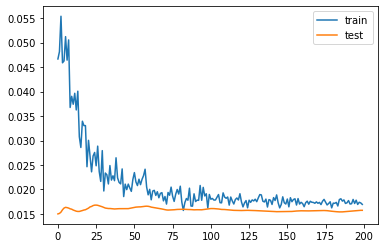

1.5857703536748886
NathanRedmond
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 6ms/step - loss: 0.1051 - mse: 0.1051 - val_loss: 0.0804 - val_mse: 0.0804
Epoch 2/200
111/111 [==============================] - 0s 117us/step - loss: 0.1041 - mse: 0.1041 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 3/200
111/111 [==============================] - 0s 108us/step - loss: 0.0862 - mse: 0.0862 - val_loss: 0.0640 - val_mse: 0.0640
Epoch 4/200
111/111 [==============================] - 0s 117us/step - loss: 0.0739 - mse: 0.0739 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 5/200
111/111 [==============================] - 0s 135us/step - loss: 0.0918 - mse: 0.0918 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 6/200
111/111 [==============================] - 0s 108us/step - loss: 0.0611 - mse: 0.0611 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 7/200
111/111 [==============================] - 0s 99us/step - loss: 0.0570 - mse: 0.0570 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 8/200
1

Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 63/200
111/111 [==============================] - 0s 108us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 64/200
111/111 [==============================] - 0s 99us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 66/200
111/111 [==============================] - 0s 117us/step - loss: 0.0323 - mse: 0.0323 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 68/200
111/111 [==============================] - 0s 99us/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 69/200
111/111 [==============================]

Epoch 123/200
111/111 [==============================] - 0s 108us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 124/200
111/111 [==============================] - 0s 90us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 125/200
111/111 [==============================] - 0s 99us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 126/200
111/111 [==============================] - 0s 99us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 127/200
111/111 [==============================] - 0s 90us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 128/200
111/111 [==============================] - 0s 90us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 129/200
111/111 [==============================] - 0s 99us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 130/200
111/111 [========================

Epoch 184/200
111/111 [==============================] - 0s 81us/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 185/200
111/111 [==============================] - 0s 99us/step - loss: 0.0318 - mse: 0.0318 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 186/200
111/111 [==============================] - 0s 90us/step - loss: 0.0281 - mse: 0.0281 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 187/200
111/111 [==============================] - 0s 99us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 188/200
111/111 [==============================] - 0s 81us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 189/200
111/111 [==============================] - 0s 99us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 190/200
111/111 [==============================] - 0s 90us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 191/200
111/111 [=========================

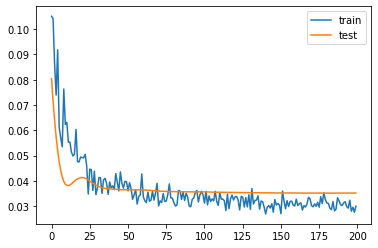

3.851883590221405
DannyIngs
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 101 samples, validate on 26 samples
Epoch 1/200
101/101 [==============================] - 0s 5ms/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.0464 - val_mse: 0.0464
Epoch 2/200
101/101 [==============================] - 0s 109us/step - loss: 0.1422 - mse: 0.1422 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 3/200
101/101 [==============================] - 0s 109us/step - loss: 0.1347 - mse: 0.1347 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 4/200
101/101 [==============================] - 0s 119us/step - loss: 0.1504 - mse: 0.1504 - val_loss: 0.0609 - val_mse: 0.0609
Epoch 5/200
101/101 [==============================] - 0s 109us/step - loss: 0.1240 - mse: 0.1240 - val_loss: 0.0653 - val_mse: 0.0653
Epoch 6/200
101/101 [==============================] - 0s 109us/step - loss: 0.1570 - mse: 0.1570 - val_loss: 0.0688 - val_mse: 0.0688
Epoch 7/200
101/101 [==============================] - 0s 119us/step - loss: 0.1150 - mse: 0.1150 - val_loss: 0.0717 - val_mse: 0.0717
Epoch 8/200


Epoch 62/200
101/101 [==============================] - 0s 109us/step - loss: 0.0663 - mse: 0.0663 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 63/200
101/101 [==============================] - 0s 109us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 64/200
101/101 [==============================] - 0s 119us/step - loss: 0.0651 - mse: 0.0651 - val_loss: 0.0290 - val_mse: 0.0290
Epoch 65/200
101/101 [==============================] - 0s 109us/step - loss: 0.0672 - mse: 0.0672 - val_loss: 0.0291 - val_mse: 0.0291
Epoch 66/200
101/101 [==============================] - 0s 109us/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 67/200
101/101 [==============================] - 0s 99us/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.0291 - val_mse: 0.0291
Epoch 68/200
101/101 [==============================] - 0s 109us/step - loss: 0.0728 - mse: 0.0728 - val_loss: 0.0289 - val_mse: 0.0289
Epoch 69/200
101/101 [===========================

Epoch 123/200
101/101 [==============================] - 0s 89us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 124/200
101/101 [==============================] - 0s 99us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 125/200
101/101 [==============================] - 0s 99us/step - loss: 0.0714 - mse: 0.0714 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 126/200
101/101 [==============================] - 0s 109us/step - loss: 0.0635 - mse: 0.0635 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 127/200
101/101 [==============================] - 0s 99us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0169 - val_mse: 0.0169
Epoch 128/200
101/101 [==============================] - 0s 99us/step - loss: 0.0667 - mse: 0.0667 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 129/200
101/101 [==============================] - 0s 119us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 130/200
101/101 [=======================

Epoch 183/200
101/101 [==============================] - 0s 119us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 184/200
101/101 [==============================] - 0s 109us/step - loss: 0.0629 - mse: 0.0629 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 185/200
101/101 [==============================] - 0s 109us/step - loss: 0.0586 - mse: 0.0586 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 186/200
101/101 [==============================] - 0s 119us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 187/200
101/101 [==============================] - 0s 109us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 188/200
101/101 [==============================] - 0s 109us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 189/200
101/101 [==============================] - 0s 109us/step - loss: 0.0582 - mse: 0.0582 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 190/200
101/101 [==================

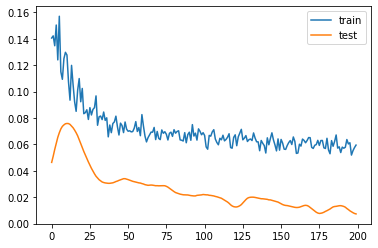

1.0743925422430038
JackStephens
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 0s 4ms/step - loss: 0.4893 - mse: 0.4893 - val_loss: 0.4776 - val_mse: 0.4776
Epoch 2/200
109/109 [==============================] - 0s 110us/step - loss: 0.4772 - mse: 0.4772 - val_loss: 0.4176 - val_mse: 0.4176
Epoch 3/200
109/109 [==============================] - 0s 101us/step - loss: 0.3781 - mse: 0.3781 - val_loss: 0.3613 - val_mse: 0.3613
Epoch 4/200
109/109 [==============================] - 0s 101us/step - loss: 0.3617 - mse: 0.3617 - val_loss: 0.3096 - val_mse: 0.3096
Epoch 5/200
109/109 [==============================] - 0s 110us/step - loss: 0.3684 - mse: 0.3684 - val_loss: 0.2628 - val_mse: 0.2628
Epoch 6/200
109/109 [==============================] - 0s 101us/step - loss: 0.3619 - mse: 0.3619 - val_loss: 0.2211 - val_mse: 0.2211
Epoch 7/200
109/109 [==============================] - 0s 101us/step - loss: 0.2804 - mse: 0.2804 - val_loss: 0.1853 - val_mse: 0.1853
Epoch 8/200


Epoch 62/200
109/109 [==============================] - 0s 101us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0534 - val_mse: 0.0534
Epoch 63/200
109/109 [==============================] - 0s 101us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0534 - val_mse: 0.0534
Epoch 64/200
109/109 [==============================] - 0s 101us/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0534 - val_mse: 0.0534
Epoch 65/200
109/109 [==============================] - 0s 101us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0534 - val_mse: 0.0534
Epoch 66/200
109/109 [==============================] - 0s 92us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0535 - val_mse: 0.0535
Epoch 67/200
109/109 [==============================] - 0s 110us/step - loss: 0.0666 - mse: 0.0666 - val_loss: 0.0535 - val_mse: 0.0535
Epoch 68/200
109/109 [==============================] - 0s 92us/step - loss: 0.0674 - mse: 0.0674 - val_loss: 0.0535 - val_mse: 0.0535
Epoch 69/200
109/109 [============================

Epoch 123/200
109/109 [==============================] - 0s 101us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 124/200
109/109 [==============================] - 0s 101us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 125/200
109/109 [==============================] - 0s 92us/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 126/200
109/109 [==============================] - 0s 119us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 127/200
109/109 [==============================] - 0s 101us/step - loss: 0.0539 - mse: 0.0539 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 128/200
109/109 [==============================] - 0s 101us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 129/200
109/109 [==============================] - 0s 92us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 130/200
109/109 [====================

Epoch 183/200
109/109 [==============================] - 0s 101us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 184/200
109/109 [==============================] - 0s 92us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 185/200
109/109 [==============================] - 0s 92us/step - loss: 0.0509 - mse: 0.0509 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 186/200
109/109 [==============================] - 0s 101us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 187/200
109/109 [==============================] - 0s 83us/step - loss: 0.0503 - mse: 0.0503 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 188/200
109/109 [==============================] - 0s 92us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 189/200
109/109 [==============================] - 0s 101us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 190/200
109/109 [======================

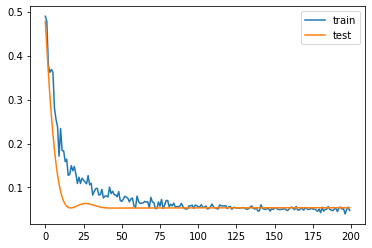

3.1656268835067745
StuartArmstrong
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 10ms/step - loss: 0.2853 - mse: 0.2853 - val_loss: 0.1278 - val_mse: 0.1278
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.2568 - mse: 0.2568 - val_loss: 0.1054 - val_mse: 0.1054
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.2158 - mse: 0.2158 - val_loss: 0.0870 - val_mse: 0.0870
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.2074 - mse: 0.2074 - val_loss: 0.0726 - val_mse: 0.0726
Epoch 5/200
50/50 [==============================] - 0s 220us/step - loss: 0.1842 - mse: 0.1842 - val_loss: 0.0615 - val_mse: 0.0615
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.2085 - mse: 0.2085 - val_loss: 0.0530 - val_mse: 0.0530
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1016 - mse: 0.1016 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 180us/step - loss: 0.0669 - mse: 0.0669 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 63/200
50/50 [==============================] - 0s 200us/step - loss: 0.0868 - mse: 0.0868 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 64/200
50/50 [==============================] - 0s 180us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 65/200
50/50 [==============================] - 0s 200us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 66/200
50/50 [==============================] - 0s 180us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 67/200
50/50 [==============================] - 0s 172us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 68/200
50/50 [==============================] - 0s 180us/step - loss: 0.0630 - mse: 0.0630 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 69/200
50/50 [==============================] - 0s 200us

Epoch 123/200
50/50 [==============================] - 0s 160us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 125/200
50/50 [==============================] - 0s 200us/step - loss: 0.0515 - mse: 0.0515 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 126/200
50/50 [==============================] - 0s 180us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 160us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 185/200
50/50 [==============================] - 0s 180us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 186/200
50/50 [==============================] - 0s 220us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 188/200
50/50 [==============================] - 0s 200us/step - loss: 0.0617 - mse: 0.0617 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0472 - mse: 0.0472 - val_loss: 0.0239 - val_mse: 0.0239
Epoch 191/200
50/50 [==============================] - 

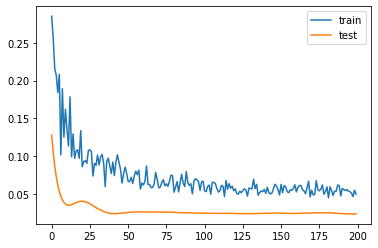

3.294523000717163
JannikVestergaard
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 0s 9ms/step - loss: 0.1583 - mse: 0.1583 - val_loss: 0.0318 - val_mse: 0.0318
Epoch 2/200
51/51 [==============================] - 0s 196us/step - loss: 0.1386 - mse: 0.1386 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.1215 - mse: 0.1215 - val_loss: 0.0156 - val_mse: 0.0156
Epoch 4/200
51/51 [==============================] - 0s 196us/step - loss: 0.1238 - mse: 0.1238 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 5/200
51/51 [==============================] - 0s 196us/step - loss: 0.1086 - mse: 0.1086 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 6/200
51/51 [==============================] - 0s 196us/step - loss: 0.0953 - mse: 0.0953 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.0860 - mse: 0.0860 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 8/200
51/51 [========

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 63/200
51/51 [==============================] - 0s 176us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 65/200
51/51 [==============================] - 0s 196us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 66/200
51/51 [==============================] - 0s 157us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 67/200
51/51 [==============================] - 0s 157us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 68/200
51/51 [==============================] - 0s 157us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 69/200
51/51 [==============================] - 0s 176us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 124/200
51/51 [==============================] - 0s 196us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 125/200
51/51 [==============================] - 0s 196us/step - loss: 0.0238 - mse: 0.0238 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 127/200
51/51 [==============================] - 0s 157us/step - loss: 0.0211 - mse: 0.0211 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0219 - mse: 0.0219 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 157us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 186/200
51/51 [==============================] - 0s 196us/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0196 - mse: 0.0196 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0214 - val_mse: 0.0214
Epoch 191/200
51/51 [==============================] - 

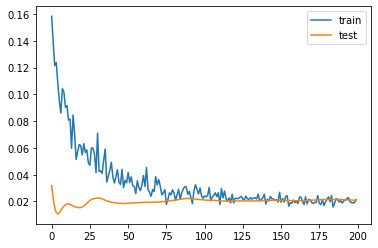

1.6153719425201418
JamesWard-Prowse
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 5ms/step - loss: 0.3573 - mse: 0.3573 - val_loss: 0.2660 - val_mse: 0.2660
Epoch 2/200
111/111 [==============================] - 0s 99us/step - loss: 0.2927 - mse: 0.2927 - val_loss: 0.2288 - val_mse: 0.2288
Epoch 3/200
111/111 [==============================] - 0s 99us/step - loss: 0.2736 - mse: 0.2736 - val_loss: 0.1888 - val_mse: 0.1888
Epoch 4/200
111/111 [==============================] - 0s 90us/step - loss: 0.2728 - mse: 0.2728 - val_loss: 0.1526 - val_mse: 0.1526
Epoch 5/200
111/111 [==============================] - 0s 90us/step - loss: 0.2256 - mse: 0.2256 - val_loss: 0.1225 - val_mse: 0.1225
Epoch 6/200
111/111 [==============================] - 0s 90us/step - loss: 0.1997 - mse: 0.1997 - val_loss: 0.0962 - val_mse: 0.0962
Epoch 7/200
111/111 [==============================] - 0s 99us/step - loss: 0.1864 - mse: 0.1864 - val_loss: 0.0744 - val_mse: 0.0744
Epoch 8/200
111/11

Epoch 62/200
111/111 [==============================] - 0s 90us/step - loss: 0.0553 - mse: 0.0553 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 63/200
111/111 [==============================] - 0s 90us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 64/200
111/111 [==============================] - 0s 93us/step - loss: 0.0563 - mse: 0.0563 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 66/200
111/111 [==============================] - 0s 72us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 68/200
111/111 [==============================] - 0s 108us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 69/200
111/111 [==============================] 

Epoch 123/200
111/111 [==============================] - 0s 99us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 124/200
111/111 [==============================] - 0s 117us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 125/200
111/111 [==============================] - 0s 144us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 126/200
111/111 [==============================] - 0s 117us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 127/200
111/111 [==============================] - 0s 119us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 128/200
111/111 [==============================] - 0s 117us/step - loss: 0.0448 - mse: 0.0448 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 129/200
111/111 [==============================] - 0s 99us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 130/200
111/111 [====================

Epoch 184/200
111/111 [==============================] - 0s 90us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 185/200
111/111 [==============================] - 0s 99us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 186/200
111/111 [==============================] - 0s 90us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 187/200
111/111 [==============================] - 0s 90us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 188/200
111/111 [==============================] - 0s 90us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 189/200
111/111 [==============================] - 0s 99us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 190/200
111/111 [==============================] - 0s 99us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 191/200
111/111 [=========================

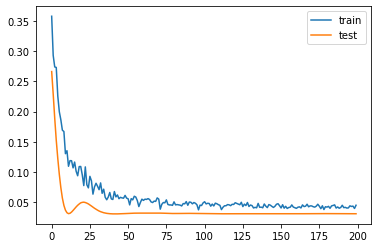

2.8558140993118286
AngusGunn
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 1s 11ms/step - loss: 0.0884 - mse: 0.0884 - val_loss: 0.2011 - val_mse: 0.2011
Epoch 2/200
50/50 [==============================] - 0s 178us/step - loss: 0.0654 - mse: 0.0654 - val_loss: 0.1851 - val_mse: 0.1851
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.0758 - mse: 0.0758 - val_loss: 0.1700 - val_mse: 0.1700
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.1569 - val_mse: 0.1569
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.0580 - mse: 0.0580 - val_loss: 0.1450 - val_mse: 0.1450
Epoch 6/200
50/50 [==============================] - 0s 180us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.1344 - val_mse: 0.1344
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.1258 - val_mse: 0.1258
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 160us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.1054 - val_mse: 0.1054
Epoch 63/200
50/50 [==============================] - 0s 200us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.1053 - val_mse: 0.1053
Epoch 64/200
50/50 [==============================] - 0s 160us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.1051 - val_mse: 0.1051
Epoch 65/200
50/50 [==============================] - 0s 160us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.1051 - val_mse: 0.1051
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.1052 - val_mse: 0.1052
Epoch 67/200
50/50 [==============================] - 0s 180us/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.1052 - val_mse: 0.1052
Epoch 68/200
50/50 [==============================] - 0s 180us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.1053 - val_mse: 0.1053
Epoch 69/200
50/50 [==============================] - 0s 180us

Epoch 123/200
50/50 [==============================] - 0s 160us/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.1038 - val_mse: 0.1038
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.1036 - val_mse: 0.1036
Epoch 125/200
50/50 [==============================] - 0s 180us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.1038 - val_mse: 0.1038
Epoch 126/200
50/50 [==============================] - 0s 160us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.1039 - val_mse: 0.1039
Epoch 127/200
50/50 [==============================] - 0s 180us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.1039 - val_mse: 0.1039
Epoch 128/200
50/50 [==============================] - 0s 160us/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.1038 - val_mse: 0.1038
Epoch 129/200
50/50 [==============================] - 0s 160us/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.1036 - val_mse: 0.1036
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 180us/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.1041 - val_mse: 0.1041
Epoch 185/200
50/50 [==============================] - 0s 160us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.1041 - val_mse: 0.1041
Epoch 186/200
50/50 [==============================] - 0s 160us/step - loss: 0.0196 - mse: 0.0196 - val_loss: 0.1041 - val_mse: 0.1041
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.1042 - val_mse: 0.1042
Epoch 188/200
50/50 [==============================] - 0s 180us/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.1044 - val_mse: 0.1044
Epoch 189/200
50/50 [==============================] - 0s 160us/step - loss: 0.0191 - mse: 0.0191 - val_loss: 0.1046 - val_mse: 0.1046
Epoch 190/200
50/50 [==============================] - 0s 180us/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.1047 - val_mse: 0.1047
Epoch 191/200
50/50 [==============================] - 

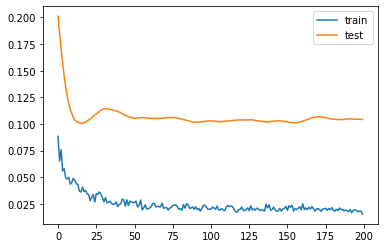

-0.19764237478375435
SofianeBoufal
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 105 samples, validate on 27 samples
Epoch 1/200
105/105 [==============================] - 1s 5ms/step - loss: 0.1594 - mse: 0.1594 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 2/200
105/105 [==============================] - 0s 114us/step - loss: 0.1452 - mse: 0.1452 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 3/200
105/105 [==============================] - 0s 105us/step - loss: 0.1258 - mse: 0.1258 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 4/200
105/105 [==============================] - 0s 105us/step - loss: 0.1377 - mse: 0.1377 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 5/200
105/105 [==============================] - 0s 95us/step - loss: 0.1363 - mse: 0.1363 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 6/200
105/105 [==============================] - 0s 95us/step - loss: 0.1123 - mse: 0.1123 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 7/200
105/105 [==============================] - 0s 105us/step - loss: 0.1448 - mse: 0.1448 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 8/200
10

Epoch 62/200
105/105 [==============================] - 0s 95us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 63/200
105/105 [==============================] - 0s 105us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 64/200
105/105 [==============================] - 0s 95us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 65/200
105/105 [==============================] - 0s 95us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 66/200
105/105 [==============================] - 0s 105us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 67/200
105/105 [==============================] - 0s 95us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 68/200
105/105 [==============================] - 0s 86us/step - loss: 0.0296 - mse: 0.0296 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 69/200
105/105 [==============================]

Epoch 123/200
105/105 [==============================] - 0s 95us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 124/200
105/105 [==============================] - 0s 95us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 125/200
105/105 [==============================] - 0s 95us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 126/200
105/105 [==============================] - 0s 95us/step - loss: 0.0252 - mse: 0.0252 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 127/200
105/105 [==============================] - 0s 86us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 128/200
105/105 [==============================] - 0s 105us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 129/200
105/105 [==============================] - 0s 95us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 130/200
105/105 [========================

Epoch 184/200
105/105 [==============================] - 0s 86us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 185/200
105/105 [==============================] - 0s 86us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 186/200
105/105 [==============================] - 0s 86us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 187/200
105/105 [==============================] - 0s 95us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0473 - val_mse: 0.0473
Epoch 188/200
105/105 [==============================] - 0s 105us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0474 - val_mse: 0.0474
Epoch 189/200
105/105 [==============================] - 0s 105us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0474 - val_mse: 0.0474
Epoch 190/200
105/105 [==============================] - 0s 95us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 191/200
105/105 [=======================

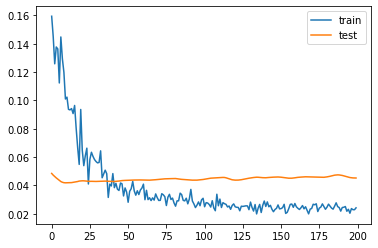

1.2338781356811523
KyleWalker-Peters
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 105 samples, validate on 27 samples
Epoch 1/200
105/105 [==============================] - 1s 5ms/step - loss: 0.0617 - mse: 0.0617 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 2/200
105/105 [==============================] - 0s 114us/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.0744 - val_mse: 0.0744
Epoch 3/200
105/105 [==============================] - 0s 95us/step - loss: 0.0616 - mse: 0.0616 - val_loss: 0.0718 - val_mse: 0.0718
Epoch 4/200
105/105 [==============================] - 0s 105us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0691 - val_mse: 0.0691
Epoch 5/200
105/105 [==============================] - 0s 124us/step - loss: 0.0553 - mse: 0.0553 - val_loss: 0.0661 - val_mse: 0.0661
Epoch 6/200
105/105 [==============================] - 0s 114us/step - loss: 0.0618 - mse: 0.0618 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 7/200
105/105 [==============================] - 0s 105us/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0612 - val_mse: 0.0612
Epoch 8/200
1

Epoch 62/200
105/105 [==============================] - 0s 95us/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 63/200
105/105 [==============================] - 0s 95us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 64/200
105/105 [==============================] - 0s 105us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 65/200
105/105 [==============================] - 0s 95us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 66/200
105/105 [==============================] - 0s 105us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 67/200
105/105 [==============================] - 0s 105us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 68/200
105/105 [==============================] - 0s 105us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 69/200
105/105 [=============================

Epoch 123/200
105/105 [==============================] - 0s 95us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 124/200
105/105 [==============================] - 0s 105us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 125/200
105/105 [==============================] - 0s 95us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0403 - val_mse: 0.0403
Epoch 126/200
105/105 [==============================] - 0s 105us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 127/200
105/105 [==============================] - 0s 105us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0401 - val_mse: 0.0401
Epoch 128/200
105/105 [==============================] - 0s 114us/step - loss: 0.0237 - mse: 0.0237 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 129/200
105/105 [==============================] - 0s 124us/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 130/200
105/105 [====================

Epoch 183/200
105/105 [==============================] - 0s 105us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0385 - val_mse: 0.0385
Epoch 184/200
105/105 [==============================] - 0s 95us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 185/200
105/105 [==============================] - 0s 95us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 186/200
105/105 [==============================] - 0s 114us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0382 - val_mse: 0.0382
Epoch 187/200
105/105 [==============================] - 0s 114us/step - loss: 0.0221 - mse: 0.0221 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 188/200
105/105 [==============================] - 0s 133us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 189/200
105/105 [==============================] - 0s 105us/step - loss: 0.0216 - mse: 0.0216 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 190/200
105/105 [====================

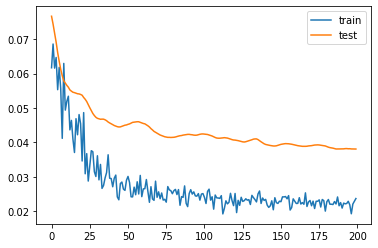

1.1524867415428162
JanBednarek
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 1s 9ms/step - loss: 0.2468 - mse: 0.2468 - val_loss: 0.1283 - val_mse: 0.1283
Epoch 2/200
80/80 [==============================] - 0s 137us/step - loss: 0.2180 - mse: 0.2180 - val_loss: 0.1051 - val_mse: 0.1051
Epoch 3/200
80/80 [==============================] - 0s 137us/step - loss: 0.1996 - mse: 0.1996 - val_loss: 0.0867 - val_mse: 0.0867
Epoch 4/200
80/80 [==============================] - 0s 162us/step - loss: 0.1991 - mse: 0.1991 - val_loss: 0.0728 - val_mse: 0.0728
Epoch 5/200
80/80 [==============================] - 0s 137us/step - loss: 0.1636 - mse: 0.1636 - val_loss: 0.0630 - val_mse: 0.0630
Epoch 6/200
80/80 [==============================] - 0s 150us/step - loss: 0.1499 - mse: 0.1499 - val_loss: 0.0568 - val_mse: 0.0568
Epoch 7/200
80/80 [==============================] - 0s 125us/step - loss: 0.1757 - mse: 0.1757 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 112us/step - loss: 0.0585 - mse: 0.0585 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 63/200
80/80 [==============================] - 0s 150us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 64/200
80/80 [==============================] - 0s 150us/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 65/200
80/80 [==============================] - 0s 150us/step - loss: 0.0707 - mse: 0.0707 - val_loss: 0.0504 - val_mse: 0.0504
Epoch 66/200
80/80 [==============================] - 0s 137us/step - loss: 0.0579 - mse: 0.0579 - val_loss: 0.0502 - val_mse: 0.0502
Epoch 67/200
80/80 [==============================] - 0s 137us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 68/200
80/80 [==============================] - 0s 125us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 69/200
80/80 [==============================] - 0s 137us

Epoch 123/200
80/80 [==============================] - 0s 125us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 124/200
80/80 [==============================] - 0s 137us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 125/200
80/80 [==============================] - 0s 125us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 126/200
80/80 [==============================] - 0s 137us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 127/200
80/80 [==============================] - 0s 150us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 128/200
80/80 [==============================] - 0s 200us/step - loss: 0.0504 - mse: 0.0504 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 129/200
80/80 [==============================] - 0s 150us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 137us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 185/200
80/80 [==============================] - 0s 137us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 186/200
80/80 [==============================] - 0s 122us/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 187/200
80/80 [==============================] - 0s 125us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 188/200
80/80 [==============================] - 0s 137us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 189/200
80/80 [==============================] - 0s 137us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 190/200
80/80 [==============================] - 0s 125us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 191/200
80/80 [==============================] - 

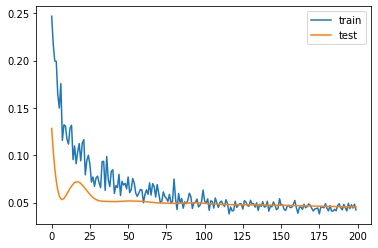

1.7685275077819822
CheAdams
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 33ms/step - loss: 0.1856 - mse: 0.1856 - val_loss: 0.3073 - val_mse: 0.3073
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.1470 - mse: 0.1470 - val_loss: 0.2776 - val_mse: 0.2776
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.0922 - mse: 0.0922 - val_loss: 0.2493 - val_mse: 0.2493
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1796 - mse: 0.1796 - val_loss: 0.2237 - val_mse: 0.2237
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.1259 - mse: 0.1259 - val_loss: 0.2026 - val_mse: 0.2026
Epoch 6/200
21/21 [==============================] - 0s 381us/step - loss: 0.1203 - mse: 0.1203 - val_loss: 0.1864 - val_mse: 0.1864
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.0792 - mse: 0.0792 - val_loss: 0.1700 - val_mse: 0.1700
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.1146 - val_mse: 0.1146
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.1148 - val_mse: 0.1148
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0184 - mse: 0.0184 - val_loss: 0.1147 - val_mse: 0.1147
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0172 - mse: 0.0172 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 66/200
21/21 [==============================] - 0s 428us/step - loss: 0.0168 - mse: 0.0168 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 67/200
21/21 [==============================] - 0s 476us/step - loss: 0.0202 - mse: 0.0202 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 68/200
21/21 [==============================] - 0s 333us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.1140 - val_mse: 0.1140
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 381us/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.1028 - val_mse: 0.1028
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.1028 - val_mse: 0.1028
Epoch 125/200
21/21 [==============================] - 0s 428us/step - loss: 0.0086 - mse: 0.0086 - val_loss: 0.1029 - val_mse: 0.1029
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.1032 - val_mse: 0.1032
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.1036 - val_mse: 0.1036
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.1039 - val_mse: 0.1039
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.1043 - val_mse: 0.1043
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 411us/step - loss: 0.0084 - mse: 0.0084 - val_loss: 0.1084 - val_mse: 0.1084
Epoch 185/200
21/21 [==============================] - 0s 428us/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.1082 - val_mse: 0.1082
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0083 - mse: 0.0083 - val_loss: 0.1078 - val_mse: 0.1078
Epoch 187/200
21/21 [==============================] - 0s 428us/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.1076 - val_mse: 0.1076
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.1073 - val_mse: 0.1073
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0112 - mse: 0.0112 - val_loss: 0.1069 - val_mse: 0.1069
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.1069 - val_mse: 0.1069
Epoch 191/200
21/21 [==============================] - 

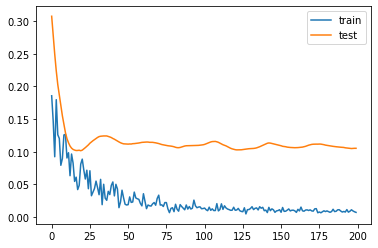

1.8524767309427261
YanValery
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 39 samples, validate on 10 samples
Epoch 1/200
39/39 [==============================] - 1s 15ms/step - loss: 0.1573 - mse: 0.1573 - val_loss: 0.4635 - val_mse: 0.4635
Epoch 2/200
39/39 [==============================] - 0s 256us/step - loss: 0.1401 - mse: 0.1401 - val_loss: 0.4264 - val_mse: 0.4264
Epoch 3/200
39/39 [==============================] - 0s 230us/step - loss: 0.1781 - mse: 0.1781 - val_loss: 0.3958 - val_mse: 0.3958
Epoch 4/200
39/39 [==============================] - 0s 256us/step - loss: 0.1297 - mse: 0.1297 - val_loss: 0.3684 - val_mse: 0.3684
Epoch 5/200
39/39 [==============================] - 0s 231us/step - loss: 0.1523 - mse: 0.1523 - val_loss: 0.3426 - val_mse: 0.3426
Epoch 6/200
39/39 [==============================] - 0s 231us/step - loss: 0.1501 - mse: 0.1501 - val_loss: 0.3181 - val_mse: 0.3181
Epoch 7/200
39/39 [==============================] - 0s 256us/step - loss: 0.0930 - mse: 0.0930 - val_loss: 0.2968 - val_mse: 0.2968
Epoch 8/200
39/39 [=======

Epoch 62/200
39/39 [==============================] - 0s 231us/step - loss: 0.0297 - mse: 0.0297 - val_loss: 0.1750 - val_mse: 0.1750
Epoch 63/200
39/39 [==============================] - 0s 205us/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.1745 - val_mse: 0.1745
Epoch 64/200
39/39 [==============================] - 0s 282us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.1741 - val_mse: 0.1741
Epoch 65/200
39/39 [==============================] - 0s 231us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.1736 - val_mse: 0.1736
Epoch 66/200
39/39 [==============================] - 0s 231us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.1732 - val_mse: 0.1732
Epoch 67/200
39/39 [==============================] - 0s 205us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.1728 - val_mse: 0.1728
Epoch 68/200
39/39 [==============================] - 0s 256us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.1724 - val_mse: 0.1724
Epoch 69/200
39/39 [==============================] - 0s 205us

Epoch 123/200
39/39 [==============================] - 0s 231us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.1726 - val_mse: 0.1726
Epoch 124/200
39/39 [==============================] - 0s 231us/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.1731 - val_mse: 0.1731
Epoch 125/200
39/39 [==============================] - 0s 205us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.1735 - val_mse: 0.1735
Epoch 126/200
39/39 [==============================] - 0s 231us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.1740 - val_mse: 0.1740
Epoch 127/200
39/39 [==============================] - 0s 231us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.1743 - val_mse: 0.1743
Epoch 128/200
39/39 [==============================] - 0s 231us/step - loss: 0.0295 - mse: 0.0295 - val_loss: 0.1746 - val_mse: 0.1746
Epoch 129/200
39/39 [==============================] - 0s 231us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.1750 - val_mse: 0.1750
Epoch 130/200
39/39 [==============================] - 

Epoch 184/200
39/39 [==============================] - 0s 231us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.1774 - val_mse: 0.1774
Epoch 185/200
39/39 [==============================] - 0s 231us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.1775 - val_mse: 0.1775
Epoch 186/200
39/39 [==============================] - 0s 205us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.1775 - val_mse: 0.1775
Epoch 187/200
39/39 [==============================] - 0s 205us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.1775 - val_mse: 0.1775
Epoch 188/200
39/39 [==============================] - 0s 256us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.1774 - val_mse: 0.1774
Epoch 189/200
39/39 [==============================] - 0s 231us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.1773 - val_mse: 0.1773
Epoch 190/200
39/39 [==============================] - 0s 231us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.1772 - val_mse: 0.1772
Epoch 191/200
39/39 [==============================] - 

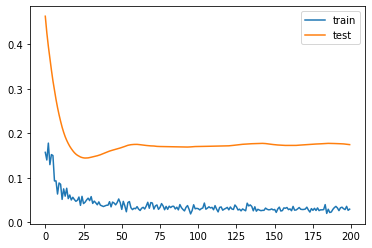

0.7507952451705934
WilliamSmallbone
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 6 samples, validate on 2 samples
Epoch 1/200
6/6 [==============================] - 1s 112ms/step - loss: 0.1013 - mse: 0.1013 - val_loss: 0.1493 - val_mse: 0.1493
Epoch 2/200
6/6 [==============================] - 0s 1ms/step - loss: 0.2868 - mse: 0.2868 - val_loss: 0.1319 - val_mse: 0.1319
Epoch 3/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.1174 - val_mse: 0.1174
Epoch 4/200
6/6 [==============================] - 0s 1ms/step - loss: 0.4174 - mse: 0.4174 - val_loss: 0.1086 - val_mse: 0.1086
Epoch 5/200
6/6 [==============================] - 0s 1ms/step - loss: 0.2166 - mse: 0.2166 - val_loss: 0.0991 - val_mse: 0.0991
Epoch 6/200
6/6 [==============================] - 0s 1ms/step - loss: 0.4378 - mse: 0.4378 - val_loss: 0.0902 - val_mse: 0.0902
Epoch 7/200
6/6 [==============================] - 0s 1ms/step - loss: 0.3378 - mse: 0.3378 - val_loss: 0.0814 - val_mse: 0.0814
Epoch 8/200
6/6 [==============================] - 0s

Epoch 64/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1319 - mse: 0.1319 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 65/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1147 - mse: 0.1147 - val_loss: 0.0888 - val_mse: 0.0888
Epoch 66/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0854 - mse: 0.0854 - val_loss: 0.0880 - val_mse: 0.0880
Epoch 67/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1667 - mse: 0.1667 - val_loss: 0.0876 - val_mse: 0.0876
Epoch 68/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1033 - mse: 0.1033 - val_loss: 0.0873 - val_mse: 0.0873
Epoch 69/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0871 - val_mse: 0.0871
Epoch 70/200
6/6 [==============================] - 0s 999us/step - loss: 0.0830 - mse: 0.0830 - val_loss: 0.0869 - val_mse: 0.0869
Epoch 71/200
6/6 [==============================] - 0s 1ms/step - loss: 0.1248 - mse: 0.

Epoch 127/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0709 - mse: 0.0709 - val_loss: 0.0866 - val_mse: 0.0866
Epoch 128/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0871 - val_mse: 0.0871
Epoch 129/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0874 - val_mse: 0.0874
Epoch 130/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0876 - val_mse: 0.0876
Epoch 131/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0878 - val_mse: 0.0878
Epoch 132/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0673 - mse: 0.0673 - val_loss: 0.0885 - val_mse: 0.0885
Epoch 133/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0891 - val_mse: 0.0891
Epoch 134/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0536 - m

Epoch 190/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0838 - mse: 0.0838 - val_loss: 0.0795 - val_mse: 0.0795
Epoch 191/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0794 - val_mse: 0.0794
Epoch 192/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0744 - mse: 0.0744 - val_loss: 0.0790 - val_mse: 0.0790
Epoch 193/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0977 - mse: 0.0977 - val_loss: 0.0786 - val_mse: 0.0786
Epoch 194/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0887 - mse: 0.0887 - val_loss: 0.0781 - val_mse: 0.0781
Epoch 195/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0971 - mse: 0.0971 - val_loss: 0.0774 - val_mse: 0.0774
Epoch 196/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0828 - mse: 0.0828 - val_loss: 0.0767 - val_mse: 0.0767
Epoch 197/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0240 - m

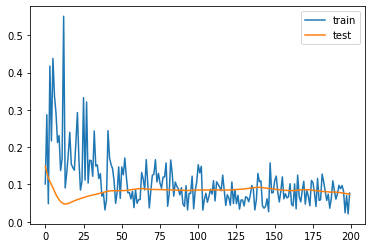

3.444847494363785
MichaelObafemi
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 54 samples, validate on 14 samples
Epoch 1/200
54/54 [==============================] - 1s 13ms/step - loss: 0.1801 - mse: 0.1801 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 2/200
54/54 [==============================] - 0s 185us/step - loss: 0.1157 - mse: 0.1157 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 3/200
54/54 [==============================] - 0s 204us/step - loss: 0.1348 - mse: 0.1348 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 4/200
54/54 [==============================] - 0s 204us/step - loss: 0.1630 - mse: 0.1630 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 5/200
54/54 [==============================] - 0s 222us/step - loss: 0.1547 - mse: 0.1547 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 6/200
54/54 [==============================] - 0s 204us/step - loss: 0.1528 - mse: 0.1528 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 7/200
54/54 [==============================] - 0s 222us/step - loss: 0.0815 - mse: 0.0815 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 8/200
54/54 [=======

Epoch 62/200
54/54 [==============================] - 0s 278us/step - loss: 0.0554 - mse: 0.0554 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 63/200
54/54 [==============================] - 0s 241us/step - loss: 0.0556 - mse: 0.0556 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 64/200
54/54 [==============================] - 0s 204us/step - loss: 0.0642 - mse: 0.0642 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 65/200
54/54 [==============================] - 0s 278us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 66/200
54/54 [==============================] - 0s 278us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 67/200
54/54 [==============================] - 0s 204us/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 68/200
54/54 [==============================] - 0s 204us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 69/200
54/54 [==============================] - 0s 222us

Epoch 123/200
54/54 [==============================] - 0s 167us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0153 - val_mse: 0.0153
Epoch 124/200
54/54 [==============================] - 0s 167us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 125/200
54/54 [==============================] - 0s 185us/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 126/200
54/54 [==============================] - 0s 167us/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0144 - val_mse: 0.0144
Epoch 127/200
54/54 [==============================] - 0s 167us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0142 - val_mse: 0.0142
Epoch 128/200
54/54 [==============================] - 0s 167us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 129/200
54/54 [==============================] - 0s 167us/step - loss: 0.0448 - mse: 0.0448 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 130/200
54/54 [==============================] - 

Epoch 184/200
54/54 [==============================] - 0s 148us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 185/200
54/54 [==============================] - 0s 167us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 186/200
54/54 [==============================] - 0s 185us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 187/200
54/54 [==============================] - 0s 185us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 188/200
54/54 [==============================] - 0s 148us/step - loss: 0.0577 - mse: 0.0577 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 189/200
54/54 [==============================] - 0s 167us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 190/200
54/54 [==============================] - 0s 167us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 191/200
54/54 [==============================] - 

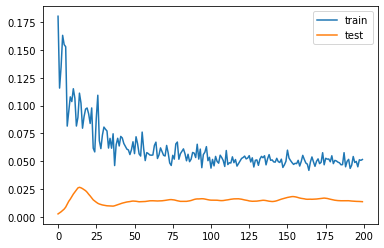

1.242476224899292
MoussaDjenepo
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 19 samples, validate on 5 samples
Epoch 1/200
19/19 [==============================] - 1s 42ms/step - loss: 0.3291 - mse: 0.3291 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 2/200
19/19 [==============================] - 0s 421us/step - loss: 0.3171 - mse: 0.3171 - val_loss: 0.0253 - val_mse: 0.0253
Epoch 3/200
19/19 [==============================] - 0s 421us/step - loss: 0.2679 - mse: 0.2679 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 4/200
19/19 [==============================] - 0s 368us/step - loss: 0.2598 - mse: 0.2598 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 5/200
19/19 [==============================] - 0s 579us/step - loss: 0.2726 - mse: 0.2726 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 6/200
19/19 [==============================] - 0s 526us/step - loss: 0.1557 - mse: 0.1557 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 7/200
19/19 [==============================] - 0s 526us/step - loss: 0.1134 - mse: 0.1134 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 8/200
19/19 [========

Epoch 62/200
19/19 [==============================] - 0s 368us/step - loss: 0.0679 - mse: 0.0679 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 63/200
19/19 [==============================] - 0s 421us/step - loss: 0.0699 - mse: 0.0699 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 64/200
19/19 [==============================] - 0s 421us/step - loss: 0.0827 - mse: 0.0827 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 65/200
19/19 [==============================] - 0s 368us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 66/200
19/19 [==============================] - 0s 473us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 67/200
19/19 [==============================] - 0s 368us/step - loss: 0.0604 - mse: 0.0604 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 68/200
19/19 [==============================] - 0s 421us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 69/200
19/19 [==============================] - 0s 421us

Epoch 123/200
19/19 [==============================] - 0s 421us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 124/200
19/19 [==============================] - 0s 421us/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 125/200
19/19 [==============================] - 0s 421us/step - loss: 0.0237 - mse: 0.0237 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 126/200
19/19 [==============================] - 0s 421us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 127/200
19/19 [==============================] - 0s 421us/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 128/200
19/19 [==============================] - 0s 421us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 129/200
19/19 [==============================] - 0s 421us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 130/200
19/19 [==============================] - 

Epoch 184/200
19/19 [==============================] - 0s 421us/step - loss: 0.0196 - mse: 0.0196 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 185/200
19/19 [==============================] - 0s 368us/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 186/200
19/19 [==============================] - 0s 421us/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 187/200
19/19 [==============================] - 0s 421us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 188/200
19/19 [==============================] - 0s 396us/step - loss: 0.0152 - mse: 0.0152 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 189/200
19/19 [==============================] - 0s 421us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 190/200
19/19 [==============================] - 0s 421us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 191/200
19/19 [==============================] - 

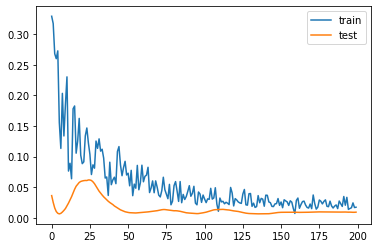

1.3230898678302763
HugoLloris
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 6ms/step - loss: 0.1362 - mse: 0.1362 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 2/200
111/111 [==============================] - 0s 99us/step - loss: 0.0871 - mse: 0.0871 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 3/200
111/111 [==============================] - 0s 108us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 4/200
111/111 [==============================] - 0s 108us/step - loss: 0.1036 - mse: 0.1036 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 5/200
111/111 [==============================] - 0s 99us/step - loss: 0.0992 - mse: 0.0992 - val_loss: 0.0289 - val_mse: 0.0289
Epoch 6/200
111/111 [==============================] - 0s 108us/step - loss: 0.0944 - mse: 0.0944 - val_loss: 0.0287 - val_mse: 0.0287
Epoch 7/200
111/111 [==============================] - 0s 108us/step - loss: 0.0825 - mse: 0.0825 - val_loss: 0.0285 - val_mse: 0.0285
Epoch 8/200
11

Epoch 62/200
111/111 [==============================] - 0s 108us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0254 - val_mse: 0.0254
Epoch 63/200
111/111 [==============================] - 0s 99us/step - loss: 0.0452 - mse: 0.0452 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 64/200
111/111 [==============================] - 0s 99us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 65/200
111/111 [==============================] - 0s 90us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 66/200
111/111 [==============================] - 0s 99us/step - loss: 0.0507 - mse: 0.0507 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0257 - val_mse: 0.0257
Epoch 68/200
111/111 [==============================] - 0s 99us/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 69/200
111/111 [==============================] 

Epoch 123/200
111/111 [==============================] - 0s 90us/step - loss: 0.0440 - mse: 0.0440 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 124/200
111/111 [==============================] - 0s 90us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 125/200
111/111 [==============================] - 0s 99us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 126/200
111/111 [==============================] - 0s 108us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 127/200
111/111 [==============================] - 0s 99us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0255 - val_mse: 0.0255
Epoch 128/200
111/111 [==============================] - 0s 99us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 129/200
111/111 [==============================] - 0s 99us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 130/200
111/111 [========================

Epoch 184/200
111/111 [==============================] - 0s 108us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 185/200
111/111 [==============================] - 0s 99us/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 186/200
111/111 [==============================] - 0s 99us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 187/200
111/111 [==============================] - 0s 90us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 188/200
111/111 [==============================] - 0s 99us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 189/200
111/111 [==============================] - 0s 108us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 190/200
111/111 [==============================] - 0s 108us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 191/200
111/111 [======================

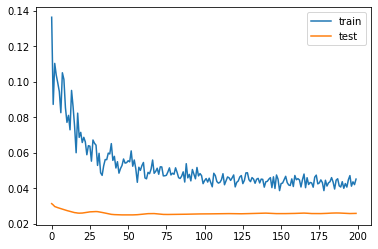

5.408522933721542
DannyRose
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


MoussaSissoko
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 109 samples, validate on 28 samples
Epoch 1/200
109/109 [==============================] - 0s 4ms/step - loss: 0.2005 - mse: 0.2005 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 2/200
109/109 [==============================] - 0s 110us/step - loss: 0.1789 - mse: 0.1789 - val_loss: 0.0481 - val_mse: 0.0481
Epoch 3/200
109/109 [==============================] - 0s 101us/step - loss: 0.1555 - mse: 0.1555 - val_loss: 0.0479 - val_mse: 0.0479
Epoch 4/200
109/109 [==============================] - 0s 110us/step - loss: 0.1524 - mse: 0.1524 - val_loss: 0.0489 - val_mse: 0.0489
Epoch 5/200
109/109 [==============================] - 0s 110us/step - loss: 0.1264 - mse: 0.1264 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 6/200
109/109 [==============================] - 0s 101us/step - loss: 0.1144 - mse: 0.1144 - val_loss: 0.0533 - val_mse: 0.0533
Epoch 7/200
109/109 [==============================] - 0s 101us/step - loss: 0.1224 - mse: 0.1224 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 8/200


109/109 [==============================] - 0s 110us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 62/200
109/109 [==============================] - 0s 119us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0338 - val_mse: 0.0338
Epoch 63/200
109/109 [==============================] - 0s 110us/step - loss: 0.0528 - mse: 0.0528 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 64/200
109/109 [==============================] - 0s 101us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0334 - val_mse: 0.0334
Epoch 65/200
109/109 [==============================] - 0s 92us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 66/200
109/109 [==============================] - 0s 92us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 67/200
109/109 [==============================] - 0s 92us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0331 - val_mse: 0.0331
Epoch 68/200
109/109 [==============================] - 0s 101us

Epoch 122/200
109/109 [==============================] - 0s 101us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 123/200
109/109 [==============================] - 0s 101us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 124/200
109/109 [==============================] - 0s 92us/step - loss: 0.0423 - mse: 0.0423 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 125/200
109/109 [==============================] - 0s 119us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 126/200
109/109 [==============================] - 0s 101us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0316 - val_mse: 0.0316
Epoch 127/200
109/109 [==============================] - 0s 101us/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 128/200
109/109 [==============================] - 0s 101us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 129/200
109/109 [===================

Epoch 182/200
109/109 [==============================] - 0s 101us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 183/200
109/109 [==============================] - 0s 110us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 184/200
109/109 [==============================] - 0s 110us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 185/200
109/109 [==============================] - 0s 101us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 186/200
109/109 [==============================] - 0s 101us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 187/200
109/109 [==============================] - 0s 92us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 188/200
109/109 [==============================] - 0s 101us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 189/200
109/109 [===================

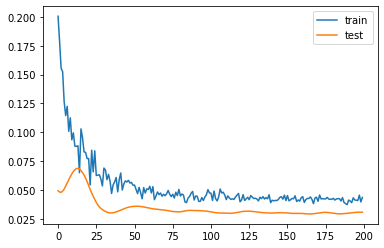

3.250736951828003
TobyAlderweireld
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 0s 4ms/step - loss: 0.3412 - mse: 0.3412 - val_loss: 0.2358 - val_mse: 0.2358
Epoch 2/200
111/111 [==============================] - 0s 108us/step - loss: 0.2618 - mse: 0.2618 - val_loss: 0.2054 - val_mse: 0.2054
Epoch 3/200
111/111 [==============================] - 0s 117us/step - loss: 0.2333 - mse: 0.2333 - val_loss: 0.1815 - val_mse: 0.1815
Epoch 4/200
111/111 [==============================] - 0s 117us/step - loss: 0.2441 - mse: 0.2441 - val_loss: 0.1597 - val_mse: 0.1597
Epoch 5/200
111/111 [==============================] - 0s 108us/step - loss: 0.1879 - mse: 0.1879 - val_loss: 0.1399 - val_mse: 0.1399
Epoch 6/200
111/111 [==============================] - 0s 99us/step - loss: 0.1886 - mse: 0.1886 - val_loss: 0.1232 - val_mse: 0.1232
Epoch 7/200
111/111 [==============================] - 0s 108us/step - loss: 0.2196 - mse: 0.2196 - val_loss: 0.1089 - val_mse: 0.1089
Epoch 8/200
1

Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0789 - mse: 0.0789 - val_loss: 0.0619 - val_mse: 0.0619
Epoch 63/200
111/111 [==============================] - 0s 99us/step - loss: 0.0747 - mse: 0.0747 - val_loss: 0.0617 - val_mse: 0.0617
Epoch 64/200
111/111 [==============================] - 0s 90us/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0756 - mse: 0.0756 - val_loss: 0.0612 - val_mse: 0.0612
Epoch 66/200
111/111 [==============================] - 0s 99us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0610 - val_mse: 0.0610
Epoch 67/200
111/111 [==============================] - 0s 90us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0611 - val_mse: 0.0611
Epoch 68/200
111/111 [==============================] - 0s 99us/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.0611 - val_mse: 0.0611
Epoch 69/200
111/111 [==============================] -

Epoch 123/200
111/111 [==============================] - 0s 90us/step - loss: 0.0568 - mse: 0.0568 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 124/200
111/111 [==============================] - 0s 108us/step - loss: 0.0646 - mse: 0.0646 - val_loss: 0.0628 - val_mse: 0.0628
Epoch 125/200
111/111 [==============================] - 0s 108us/step - loss: 0.0574 - mse: 0.0574 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 126/200
111/111 [==============================] - 0s 99us/step - loss: 0.0596 - mse: 0.0596 - val_loss: 0.0630 - val_mse: 0.0630
Epoch 127/200
111/111 [==============================] - 0s 90us/step - loss: 0.0593 - mse: 0.0593 - val_loss: 0.0630 - val_mse: 0.0630
Epoch 128/200
111/111 [==============================] - 0s 99us/step - loss: 0.0594 - mse: 0.0594 - val_loss: 0.0632 - val_mse: 0.0632
Epoch 129/200
111/111 [==============================] - 0s 99us/step - loss: 0.0571 - mse: 0.0571 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 130/200
111/111 [=======================

Epoch 184/200
111/111 [==============================] - 0s 90us/step - loss: 0.0580 - mse: 0.0580 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 185/200
111/111 [==============================] - 0s 90us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0634 - val_mse: 0.0634
Epoch 186/200
111/111 [==============================] - 0s 108us/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 187/200
111/111 [==============================] - 0s 99us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0632 - val_mse: 0.0632
Epoch 188/200
111/111 [==============================] - 0s 117us/step - loss: 0.0541 - mse: 0.0541 - val_loss: 0.0631 - val_mse: 0.0631
Epoch 189/200
111/111 [==============================] - 0s 108us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0630 - val_mse: 0.0630
Epoch 190/200
111/111 [==============================] - 0s 108us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 191/200
111/111 [=====================

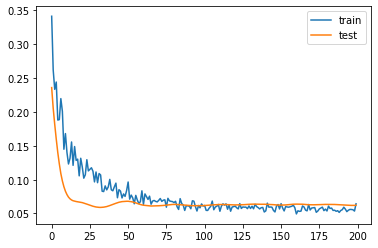

3.694521158933639
ErikLamela
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 4ms/step - loss: 0.1134 - mse: 0.1134 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 2/200
110/110 [==============================] - 0s 100us/step - loss: 0.1015 - mse: 0.1015 - val_loss: 0.0171 - val_mse: 0.0171
Epoch 3/200
110/110 [==============================] - 0s 109us/step - loss: 0.1105 - mse: 0.1105 - val_loss: 0.0165 - val_mse: 0.0165
Epoch 4/200
110/110 [==============================] - 0s 100us/step - loss: 0.0893 - mse: 0.0893 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 5/200
110/110 [==============================] - 0s 109us/step - loss: 0.0863 - mse: 0.0863 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 6/200
110/110 [==============================] - 0s 109us/step - loss: 0.1162 - mse: 0.1162 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 7/200
110/110 [==============================] - 0s 109us/step - loss: 0.0938 - mse: 0.0938 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 8/200


110/110 [==============================] - 0s 109us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 62/200
110/110 [==============================] - 0s 109us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 63/200
110/110 [==============================] - 0s 109us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 64/200
110/110 [==============================] - 0s 100us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 65/200
110/110 [==============================] - 0s 100us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 66/200
110/110 [==============================] - 0s 100us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 67/200
110/110 [==============================] - 0s 100us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 68/200
110/110 [==============================] - 0s 10

Epoch 122/200
110/110 [==============================] - 0s 100us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 123/200
110/110 [==============================] - 0s 100us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 124/200
110/110 [==============================] - 0s 91us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 125/200
110/110 [==============================] - 0s 100us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 126/200
110/110 [==============================] - 0s 100us/step - loss: 0.0218 - mse: 0.0218 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 127/200
110/110 [==============================] - 0s 109us/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 128/200
110/110 [==============================] - 0s 100us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 129/200
110/110 [===================

Epoch 182/200
110/110 [==============================] - 0s 109us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 183/200
110/110 [==============================] - 0s 109us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 184/200
110/110 [==============================] - 0s 100us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 185/200
110/110 [==============================] - 0s 100us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 186/200
110/110 [==============================] - 0s 100us/step - loss: 0.0252 - mse: 0.0252 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 187/200
110/110 [==============================] - 0s 100us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 188/200
110/110 [==============================] - 0s 107us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 189/200
110/110 [==================

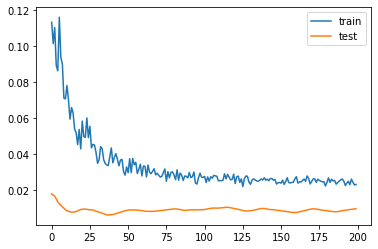

1.4208916425704956
HarryKane
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 29 samples
Epoch 1/200
112/112 [==============================] - 1s 5ms/step - loss: 0.1788 - mse: 0.1788 - val_loss: 0.1494 - val_mse: 0.1494
Epoch 2/200
112/112 [==============================] - 0s 107us/step - loss: 0.1468 - mse: 0.1468 - val_loss: 0.1317 - val_mse: 0.1317
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.1493 - mse: 0.1493 - val_loss: 0.1176 - val_mse: 0.1176
Epoch 4/200
112/112 [==============================] - 0s 107us/step - loss: 0.0836 - mse: 0.0836 - val_loss: 0.1065 - val_mse: 0.1065
Epoch 5/200
112/112 [==============================] - 0s 116us/step - loss: 0.1039 - mse: 0.1039 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 6/200
112/112 [==============================] - 0s 116us/step - loss: 0.1047 - mse: 0.1047 - val_loss: 0.0912 - val_mse: 0.0912
Epoch 7/200
112/112 [==============================] - 0s 107us/step - loss: 0.1061 - mse: 0.1061 - val_loss: 0.0868 - val_mse: 0.0868
Epoch 8/200


112/112 [==============================] - 0s 115us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0810 - val_mse: 0.0810
Epoch 62/200
112/112 [==============================] - 0s 116us/step - loss: 0.0500 - mse: 0.0500 - val_loss: 0.0810 - val_mse: 0.0810
Epoch 63/200
112/112 [==============================] - 0s 125us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 64/200
112/112 [==============================] - 0s 125us/step - loss: 0.0462 - mse: 0.0462 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 65/200
112/112 [==============================] - 0s 124us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 66/200
112/112 [==============================] - 0s 116us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 67/200
112/112 [==============================] - 0s 116us/step - loss: 0.0460 - mse: 0.0460 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 68/200
112/112 [==============================] - 0s 12

Epoch 122/200
112/112 [==============================] - 0s 98us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0828 - val_mse: 0.0828
Epoch 123/200
112/112 [==============================] - 0s 107us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 124/200
112/112 [==============================] - 0s 98us/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 125/200
112/112 [==============================] - 0s 89us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 126/200
112/112 [==============================] - 0s 89us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 127/200
112/112 [==============================] - 0s 107us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 128/200
112/112 [==============================] - 0s 98us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0822 - val_mse: 0.0822
Epoch 129/200
112/112 [=======================

Epoch 183/200
112/112 [==============================] - 0s 98us/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0814 - val_mse: 0.0814
Epoch 184/200
112/112 [==============================] - 0s 98us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0814 - val_mse: 0.0814
Epoch 185/200
112/112 [==============================] - 0s 116us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 186/200
112/112 [==============================] - 0s 98us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0816 - val_mse: 0.0816
Epoch 187/200
112/112 [==============================] - 0s 98us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0818 - val_mse: 0.0818
Epoch 188/200
112/112 [==============================] - 0s 107us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0819 - val_mse: 0.0819
Epoch 189/200
112/112 [==============================] - 0s 98us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 190/200
112/112 [=======================

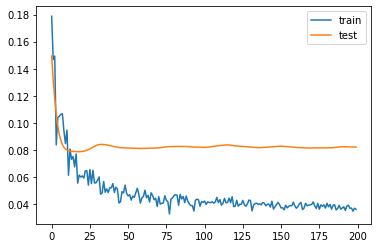

7.287337303161621
SergeAurier
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 76 samples, validate on 19 samples
Epoch 1/200
76/76 [==============================] - 0s 6ms/step - loss: 0.1258 - mse: 0.1258 - val_loss: 0.1226 - val_mse: 0.1226
Epoch 2/200
76/76 [==============================] - 0s 131us/step - loss: 0.1307 - mse: 0.1307 - val_loss: 0.1126 - val_mse: 0.1126
Epoch 3/200
76/76 [==============================] - 0s 158us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.1031 - val_mse: 0.1031
Epoch 4/200
76/76 [==============================] - 0s 158us/step - loss: 0.0844 - mse: 0.0844 - val_loss: 0.0944 - val_mse: 0.0944
Epoch 5/200
76/76 [==============================] - 0s 145us/step - loss: 0.0707 - mse: 0.0707 - val_loss: 0.0866 - val_mse: 0.0866
Epoch 6/200
76/76 [==============================] - 0s 132us/step - loss: 0.0848 - mse: 0.0848 - val_loss: 0.0797 - val_mse: 0.0797
Epoch 7/200
76/76 [==============================] - 0s 132us/step - loss: 0.0948 - mse: 0.0948 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 8/200
76/76 [========

Epoch 62/200
76/76 [==============================] - 0s 132us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 63/200
76/76 [==============================] - 0s 132us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 64/200
76/76 [==============================] - 0s 145us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 65/200
76/76 [==============================] - 0s 145us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 66/200
76/76 [==============================] - 0s 145us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 67/200
76/76 [==============================] - 0s 145us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 68/200
76/76 [==============================] - 0s 132us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 69/200
76/76 [==============================] - 0s 145us

Epoch 123/200
76/76 [==============================] - 0s 118us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 124/200
76/76 [==============================] - 0s 131us/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.0542 - val_mse: 0.0542
Epoch 125/200
76/76 [==============================] - 0s 145us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0541 - val_mse: 0.0541
Epoch 126/200
76/76 [==============================] - 0s 145us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 127/200
76/76 [==============================] - 0s 145us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 128/200
76/76 [==============================] - 0s 145us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 129/200
76/76 [==============================] - 0s 145us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 130/200
76/76 [==============================] - 

Epoch 184/200
76/76 [==============================] - 0s 118us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0531 - val_mse: 0.0531
Epoch 185/200
76/76 [==============================] - 0s 145us/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0531 - val_mse: 0.0531
Epoch 186/200
76/76 [==============================] - 0s 131us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0531 - val_mse: 0.0531
Epoch 187/200
76/76 [==============================] - 0s 131us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0530 - val_mse: 0.0530
Epoch 188/200
76/76 [==============================] - 0s 132us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0530 - val_mse: 0.0530
Epoch 189/200
76/76 [==============================] - 0s 131us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 190/200
76/76 [==============================] - 0s 132us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 191/200
76/76 [==============================] - 

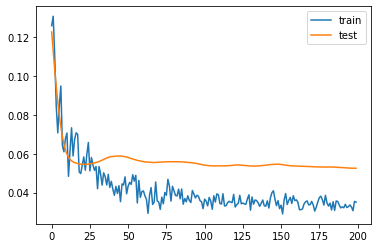

2.5755016803741455
Heung-MinSon
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.2745 - mse: 0.2745 - val_loss: 0.1986 - val_mse: 0.1986
Epoch 2/200
112/112 [==============================] - 0s 98us/step - loss: 0.2360 - mse: 0.2360 - val_loss: 0.1685 - val_mse: 0.1685
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.1834 - mse: 0.1834 - val_loss: 0.1423 - val_mse: 0.1423
Epoch 4/200
112/112 [==============================] - 0s 98us/step - loss: 0.1892 - mse: 0.1892 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 5/200
112/112 [==============================] - 0s 107us/step - loss: 0.1687 - mse: 0.1687 - val_loss: 0.0992 - val_mse: 0.0992
Epoch 6/200
112/112 [==============================] - 0s 98us/step - loss: 0.1747 - mse: 0.1747 - val_loss: 0.0829 - val_mse: 0.0829
Epoch 7/200
112/112 [==============================] - 0s 107us/step - loss: 0.1258 - mse: 0.1258 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 8/200
112

Epoch 62/200
112/112 [==============================] - 0s 98us/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 63/200
112/112 [==============================] - 0s 98us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 64/200
112/112 [==============================] - 0s 98us/step - loss: 0.0653 - mse: 0.0653 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 65/200
112/112 [==============================] - 0s 98us/step - loss: 0.0667 - mse: 0.0667 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 66/200
112/112 [==============================] - 0s 89us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 67/200
112/112 [==============================] - 0s 107us/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 68/200
112/112 [==============================] - 0s 98us/step - loss: 0.0544 - mse: 0.0544 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 69/200
112/112 [==============================] 

Epoch 123/200
112/112 [==============================] - 0s 98us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0428 - val_mse: 0.0428
Epoch 124/200
112/112 [==============================] - 0s 89us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 125/200
112/112 [==============================] - 0s 98us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 126/200
112/112 [==============================] - 0s 98us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 127/200
112/112 [==============================] - 0s 107us/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 128/200
112/112 [==============================] - 0s 98us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 129/200
112/112 [==============================] - 0s 98us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 130/200
112/112 [========================

Epoch 184/200
112/112 [==============================] - 0s 89us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 185/200
112/112 [==============================] - 0s 89us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 186/200
112/112 [==============================] - 0s 98us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 187/200
112/112 [==============================] - 0s 98us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 188/200
112/112 [==============================] - 0s 98us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 189/200
112/112 [==============================] - 0s 98us/step - loss: 0.0490 - mse: 0.0490 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 190/200
112/112 [==============================] - 0s 98us/step - loss: 0.0497 - mse: 0.0497 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 191/200
112/112 [=========================

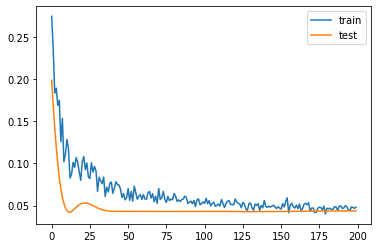

7.293974429368973
EricDier
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 27 samples
Epoch 1/200
108/108 [==============================] - 0s 4ms/step - loss: 0.1750 - mse: 0.1750 - val_loss: 0.0693 - val_mse: 0.0693
Epoch 2/200
108/108 [==============================] - 0s 111us/step - loss: 0.1434 - mse: 0.1434 - val_loss: 0.0613 - val_mse: 0.0613
Epoch 3/200
108/108 [==============================] - 0s 102us/step - loss: 0.1793 - mse: 0.1793 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 4/200
108/108 [==============================] - 0s 120us/step - loss: 0.1169 - mse: 0.1169 - val_loss: 0.0523 - val_mse: 0.0523
Epoch 5/200
108/108 [==============================] - 0s 102us/step - loss: 0.1474 - mse: 0.1474 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 6/200
108/108 [==============================] - 0s 111us/step - loss: 0.1242 - mse: 0.1242 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 7/200
108/108 [==============================] - 0s 102us/step - loss: 0.1186 - mse: 0.1186 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 8/200


Epoch 62/200
108/108 [==============================] - 0s 102us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 63/200
108/108 [==============================] - 0s 102us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 64/200
108/108 [==============================] - 0s 120us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 65/200
108/108 [==============================] - 0s 120us/step - loss: 0.0269 - mse: 0.0269 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 66/200
108/108 [==============================] - 0s 102us/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 67/200
108/108 [==============================] - 0s 157us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 68/200
108/108 [==============================] - 0s 120us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 69/200
108/108 [==========================

Epoch 123/200
108/108 [==============================] - 0s 102us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 124/200
108/108 [==============================] - 0s 102us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 125/200
108/108 [==============================] - 0s 102us/step - loss: 0.0222 - mse: 0.0222 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 126/200
108/108 [==============================] - 0s 102us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 127/200
108/108 [==============================] - 0s 98us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 128/200
108/108 [==============================] - 0s 102us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 129/200
108/108 [==============================] - 0s 102us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 130/200
108/108 [===================

Epoch 183/200
108/108 [==============================] - 0s 102us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 184/200
108/108 [==============================] - 0s 111us/step - loss: 0.0238 - mse: 0.0238 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 186/200
108/108 [==============================] - 0s 102us/step - loss: 0.0260 - mse: 0.0260 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 187/200
108/108 [==============================] - 0s 111us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 188/200
108/108 [==============================] - 0s 102us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 189/200
108/108 [==============================] - 0s 102us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 190/200
108/108 [==================

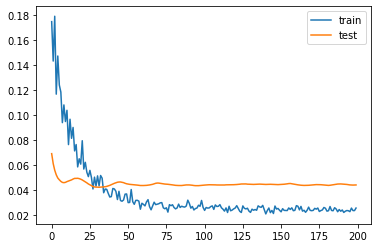

2.2157492637634277
LucasRodrigues Moura da Silva
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 61 samples, validate on 16 samples
Epoch 1/200
61/61 [==============================] - 0s 8ms/step - loss: 0.3151 - mse: 0.3151 - val_loss: 0.0802 - val_mse: 0.0802
Epoch 2/200
61/61 [==============================] - 0s 164us/step - loss: 0.3188 - mse: 0.3188 - val_loss: 0.0643 - val_mse: 0.0643
Epoch 3/200
61/61 [==============================] - 0s 180us/step - loss: 0.3822 - mse: 0.3822 - val_loss: 0.0515 - val_mse: 0.0515
Epoch 4/200
61/61 [==============================] - 0s 164us/step - loss: 0.2394 - mse: 0.2394 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 5/200
61/61 [==============================] - 0s 180us/step - loss: 0.2064 - mse: 0.2064 - val_loss: 0.0375 - val_mse: 0.0375
Epoch 6/200
61/61 [==============================] - 0s 164us/step - loss: 0.2135 - mse: 0.2135 - val_loss: 0.0348 - val_mse: 0.0348
Epoch 7/200
61/61 [==============================] - 0s 180us/step - loss: 0.2600 - mse: 0.2600 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 8/200
61/61 [========

Epoch 62/200
61/61 [==============================] - 0s 147us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 63/200
61/61 [==============================] - 0s 147us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 64/200
61/61 [==============================] - 0s 147us/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 65/200
61/61 [==============================] - 0s 164us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 66/200
61/61 [==============================] - 0s 164us/step - loss: 0.0568 - mse: 0.0568 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 67/200
61/61 [==============================] - 0s 147us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 68/200
61/61 [==============================] - 0s 147us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 69/200
61/61 [==============================] - 0s 164us

Epoch 123/200
61/61 [==============================] - 0s 164us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 124/200
61/61 [==============================] - 0s 164us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 125/200
61/61 [==============================] - 0s 164us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 126/200
61/61 [==============================] - 0s 147us/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 127/200
61/61 [==============================] - 0s 147us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 128/200
61/61 [==============================] - 0s 164us/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 129/200
61/61 [==============================] - 0s 164us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 130/200
61/61 [==============================] - 

Epoch 184/200
61/61 [==============================] - 0s 147us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 185/200
61/61 [==============================] - 0s 147us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 186/200
61/61 [==============================] - 0s 164us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 187/200
61/61 [==============================] - 0s 164us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 188/200
61/61 [==============================] - 0s 164us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 189/200
61/61 [==============================] - 0s 147us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 190/200
61/61 [==============================] - 0s 164us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 191/200
61/61 [==============================] - 

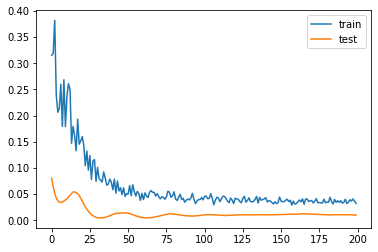

5.085657432675362
PauloGazzaniga
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 95 samples, validate on 24 samples
Epoch 1/200
95/95 [==============================] - 1s 5ms/step - loss: 0.1626 - mse: 0.1626 - val_loss: 0.0765 - val_mse: 0.0765
Epoch 2/200
95/95 [==============================] - 0s 116us/step - loss: 0.1752 - mse: 0.1752 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 3/200
95/95 [==============================] - 0s 126us/step - loss: 0.1720 - mse: 0.1720 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 4/200
95/95 [==============================] - 0s 126us/step - loss: 0.1279 - mse: 0.1279 - val_loss: 0.0301 - val_mse: 0.0301
Epoch 5/200
95/95 [==============================] - 0s 126us/step - loss: 0.1256 - mse: 0.1256 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 6/200
95/95 [==============================] - 0s 116us/step - loss: 0.1101 - mse: 0.1101 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 7/200
95/95 [==============================] - 0s 105us/step - loss: 0.0974 - mse: 0.0974 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 8/200
95/95 [========

Epoch 62/200
95/95 [==============================] - 0s 126us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 63/200
95/95 [==============================] - 0s 105us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 64/200
95/95 [==============================] - 0s 105us/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 65/200
95/95 [==============================] - 0s 116us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 66/200
95/95 [==============================] - 0s 116us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 67/200
95/95 [==============================] - 0s 116us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 68/200
95/95 [==============================] - 0s 105us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 69/200
95/95 [==============================] - 0s 116us

Epoch 123/200
95/95 [==============================] - 0s 116us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 124/200
95/95 [==============================] - 0s 116us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 125/200
95/95 [==============================] - 0s 105us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 126/200
95/95 [==============================] - 0s 116us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 127/200
95/95 [==============================] - 0s 126us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 128/200
95/95 [==============================] - 0s 116us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 129/200
95/95 [==============================] - 0s 105us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 130/200
95/95 [==============================] - 

Epoch 184/200
95/95 [==============================] - 0s 105us/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 185/200
95/95 [==============================] - 0s 105us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 186/200
95/95 [==============================] - 0s 105us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 187/200
95/95 [==============================] - 0s 116us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 188/200
95/95 [==============================] - 0s 105us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 189/200
95/95 [==============================] - 0s 105us/step - loss: 0.0194 - mse: 0.0194 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 190/200
95/95 [==============================] - 0s 116us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 191/200
95/95 [==============================] - 

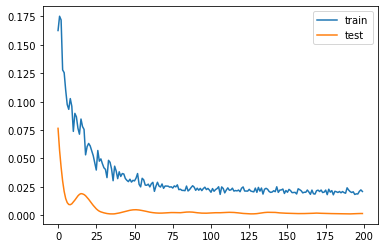

0.18600946478545666
BamideleAlli
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 1s 4ms/step - loss: 0.1564 - mse: 0.1564 - val_loss: 0.1566 - val_mse: 0.1566
Epoch 2/200
112/112 [==============================] - 0s 107us/step - loss: 0.1371 - mse: 0.1371 - val_loss: 0.1397 - val_mse: 0.1397
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.1726 - mse: 0.1726 - val_loss: 0.1241 - val_mse: 0.1241
Epoch 4/200
112/112 [==============================] - 0s 116us/step - loss: 0.1372 - mse: 0.1372 - val_loss: 0.1120 - val_mse: 0.1120
Epoch 5/200
112/112 [==============================] - 0s 98us/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.1022 - val_mse: 0.1022
Epoch 6/200
112/112 [==============================] - 0s 107us/step - loss: 0.1449 - mse: 0.1449 - val_loss: 0.0952 - val_mse: 0.0952
Epoch 7/200
112/112 [==============================] - 0s 89us/step - loss: 0.1210 - mse: 0.1210 - val_loss: 0.0901 - val_mse: 0.0901
Epoch 8/200
11

Epoch 62/200
112/112 [==============================] - 0s 107us/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.0902 - val_mse: 0.0902
Epoch 63/200
112/112 [==============================] - 0s 107us/step - loss: 0.0781 - mse: 0.0781 - val_loss: 0.0901 - val_mse: 0.0901
Epoch 64/200
112/112 [==============================] - 0s 107us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0902 - val_mse: 0.0902
Epoch 65/200
112/112 [==============================] - 0s 107us/step - loss: 0.0726 - mse: 0.0726 - val_loss: 0.0901 - val_mse: 0.0901
Epoch 66/200
112/112 [==============================] - 0s 107us/step - loss: 0.0638 - mse: 0.0638 - val_loss: 0.0900 - val_mse: 0.0900
Epoch 67/200
112/112 [==============================] - 0s 107us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0899 - val_mse: 0.0899
Epoch 68/200
112/112 [==============================] - 0s 107us/step - loss: 0.0700 - mse: 0.0700 - val_loss: 0.0900 - val_mse: 0.0900
Epoch 69/200
112/112 [==========================

Epoch 123/200
112/112 [==============================] - 0s 116us/step - loss: 0.0668 - mse: 0.0668 - val_loss: 0.0912 - val_mse: 0.0912
Epoch 124/200
112/112 [==============================] - 0s 107us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0917 - val_mse: 0.0917
Epoch 125/200
112/112 [==============================] - 0s 107us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0922 - val_mse: 0.0922
Epoch 126/200
112/112 [==============================] - 0s 116us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0926 - val_mse: 0.0926
Epoch 127/200
112/112 [==============================] - 0s 98us/step - loss: 0.0641 - mse: 0.0641 - val_loss: 0.0931 - val_mse: 0.0931
Epoch 128/200
112/112 [==============================] - 0s 98us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0935 - val_mse: 0.0935
Epoch 129/200
112/112 [==============================] - 0s 98us/step - loss: 0.0592 - mse: 0.0592 - val_loss: 0.0938 - val_mse: 0.0938
Epoch 130/200
112/112 [=====================

Epoch 183/200
112/112 [==============================] - 0s 116us/step - loss: 0.0666 - mse: 0.0666 - val_loss: 0.0929 - val_mse: 0.0929
Epoch 184/200
112/112 [==============================] - 0s 107us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0931 - val_mse: 0.0931
Epoch 185/200
112/112 [==============================] - 0s 116us/step - loss: 0.0638 - mse: 0.0638 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 186/200
112/112 [==============================] - 0s 107us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 187/200
112/112 [==============================] - 0s 89us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 188/200
112/112 [==============================] - 0s 98us/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 189/200
112/112 [==============================] - 0s 107us/step - loss: 0.0629 - mse: 0.0629 - val_loss: 0.0932 - val_mse: 0.0932
Epoch 190/200
112/112 [====================

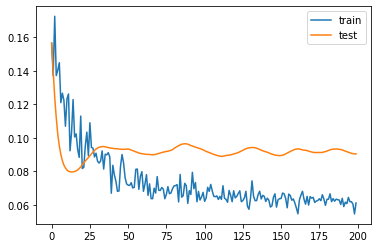

4.204577207565308
BenDavies
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 4ms/step - loss: 0.2927 - mse: 0.2927 - val_loss: 0.2560 - val_mse: 0.2560
Epoch 2/200
110/110 [==============================] - 0s 109us/step - loss: 0.2630 - mse: 0.2630 - val_loss: 0.2211 - val_mse: 0.2211
Epoch 3/200
110/110 [==============================] - 0s 118us/step - loss: 0.2545 - mse: 0.2545 - val_loss: 0.1888 - val_mse: 0.1888
Epoch 4/200
110/110 [==============================] - 0s 109us/step - loss: 0.2269 - mse: 0.2269 - val_loss: 0.1590 - val_mse: 0.1590
Epoch 5/200
110/110 [==============================] - 0s 109us/step - loss: 0.1812 - mse: 0.1812 - val_loss: 0.1322 - val_mse: 0.1322
Epoch 6/200
110/110 [==============================] - 0s 109us/step - loss: 0.2012 - mse: 0.2012 - val_loss: 0.1083 - val_mse: 0.1083
Epoch 7/200
110/110 [==============================] - 0s 109us/step - loss: 0.1638 - mse: 0.1638 - val_loss: 0.0879 - val_mse: 0.0879
Epoch 8/200


Epoch 62/200
110/110 [==============================] - 0s 109us/step - loss: 0.0556 - mse: 0.0556 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 63/200
110/110 [==============================] - 0s 91us/step - loss: 0.0539 - mse: 0.0539 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 64/200
110/110 [==============================] - 0s 100us/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 65/200
110/110 [==============================] - 0s 91us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 66/200
110/110 [==============================] - 0s 100us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 67/200
110/110 [==============================] - 0s 100us/step - loss: 0.0510 - mse: 0.0510 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 68/200
110/110 [==============================] - 0s 105us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 69/200
110/110 [============================

Epoch 123/200
110/110 [==============================] - 0s 109us/step - loss: 0.0393 - mse: 0.0393 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 124/200
110/110 [==============================] - 0s 118us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 125/200
110/110 [==============================] - 0s 118us/step - loss: 0.0403 - mse: 0.0403 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 126/200
110/110 [==============================] - 0s 109us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 127/200
110/110 [==============================] - 0s 100us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 128/200
110/110 [==============================] - 0s 109us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 129/200
110/110 [==============================] - 0s 109us/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0269 - val_mse: 0.0269
Epoch 130/200
110/110 [==================

Epoch 183/200
110/110 [==============================] - 0s 100us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 184/200
110/110 [==============================] - 0s 109us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 185/200
110/110 [==============================] - 0s 109us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 186/200
110/110 [==============================] - 0s 100us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 187/200
110/110 [==============================] - 0s 127us/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 188/200
110/110 [==============================] - 0s 109us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 189/200
110/110 [==============================] - 0s 109us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 190/200
110/110 [==================

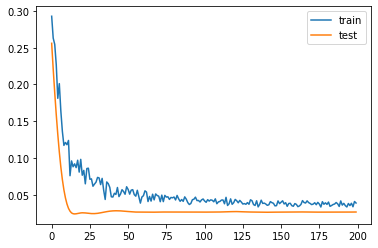

3.1780033111572266
Pierre-EmileHøjbjerg
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 0s 4ms/step - loss: 0.3413 - mse: 0.3413 - val_loss: 0.1985 - val_mse: 0.1985
Epoch 2/200
111/111 [==============================] - 0s 99us/step - loss: 0.2511 - mse: 0.2511 - val_loss: 0.1555 - val_mse: 0.1555
Epoch 3/200
111/111 [==============================] - 0s 108us/step - loss: 0.2414 - mse: 0.2414 - val_loss: 0.1176 - val_mse: 0.1176
Epoch 4/200
111/111 [==============================] - 0s 99us/step - loss: 0.1968 - mse: 0.1968 - val_loss: 0.0854 - val_mse: 0.0854
Epoch 5/200
111/111 [==============================] - 0s 108us/step - loss: 0.1736 - mse: 0.1736 - val_loss: 0.0591 - val_mse: 0.0591
Epoch 6/200
111/111 [==============================] - 0s 99us/step - loss: 0.1372 - mse: 0.1372 - val_loss: 0.0389 - val_mse: 0.0389
Epoch 7/200
111/111 [==============================] - 0s 108us/step - loss: 0.1577 - mse: 0.1577 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 8/200
111

Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 63/200
111/111 [==============================] - 0s 108us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 64/200
111/111 [==============================] - 0s 108us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 66/200
111/111 [==============================] - 0s 99us/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 68/200
111/111 [==============================] - 0s 108us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 69/200
111/111 [==============================

Epoch 123/200
111/111 [==============================] - 0s 90us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 124/200
111/111 [==============================] - 0s 99us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 125/200
111/111 [==============================] - 0s 108us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 126/200
111/111 [==============================] - 0s 99us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 127/200
111/111 [==============================] - 0s 99us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 128/200
111/111 [==============================] - 0s 99us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 129/200
111/111 [==============================] - 0s 90us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 130/200
111/111 [========================

Epoch 184/200
111/111 [==============================] - 0s 99us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 185/200
111/111 [==============================] - 0s 99us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 186/200
111/111 [==============================] - 0s 99us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0101 - val_mse: 0.0101
Epoch 187/200
111/111 [==============================] - 0s 117us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 188/200
111/111 [==============================] - 0s 99us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 189/200
111/111 [==============================] - 0s 99us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 190/200
111/111 [==============================] - 0s 99us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 191/200
111/111 [========================

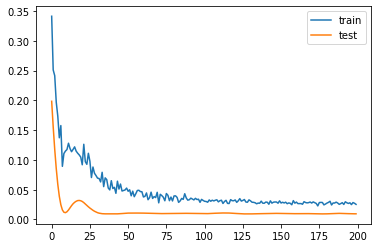

1.6740618944168093
HarryWinks
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 108 samples, validate on 28 samples
Epoch 1/200
108/108 [==============================] - 1s 5ms/step - loss: 0.1756 - mse: 0.1756 - val_loss: 0.0705 - val_mse: 0.0705
Epoch 2/200
108/108 [==============================] - 0s 111us/step - loss: 0.1633 - mse: 0.1633 - val_loss: 0.0548 - val_mse: 0.0548
Epoch 3/200
108/108 [==============================] - 0s 111us/step - loss: 0.1570 - mse: 0.1570 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 4/200
108/108 [==============================] - 0s 111us/step - loss: 0.1273 - mse: 0.1273 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 5/200
108/108 [==============================] - 0s 120us/step - loss: 0.1405 - mse: 0.1405 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 6/200
108/108 [==============================] - 0s 102us/step - loss: 0.1065 - mse: 0.1065 - val_loss: 0.0216 - val_mse: 0.0216
Epoch 7/200
108/108 [==============================] - 0s 111us/step - loss: 0.1009 - mse: 0.1009 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 8/200


108/108 [==============================] - 0s 93us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 62/200
108/108 [==============================] - 0s 102us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 63/200
108/108 [==============================] - 0s 111us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 64/200
108/108 [==============================] - 0s 102us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 65/200
108/108 [==============================] - 0s 102us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 66/200
108/108 [==============================] - 0s 102us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 67/200
108/108 [==============================] - 0s 102us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 68/200
108/108 [==============================] - 0s 93u

Epoch 122/200
108/108 [==============================] - 0s 102us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 123/200
108/108 [==============================] - 0s 102us/step - loss: 0.0247 - mse: 0.0247 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 124/200
108/108 [==============================] - 0s 102us/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 125/200
108/108 [==============================] - 0s 102us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 126/200
108/108 [==============================] - 0s 111us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 127/200
108/108 [==============================] - 0s 111us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 128/200
108/108 [==============================] - 0s 93us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 129/200
108/108 [===================

Epoch 182/200
108/108 [==============================] - 0s 102us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 183/200
108/108 [==============================] - 0s 93us/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 184/200
108/108 [==============================] - 0s 102us/step - loss: 0.0216 - mse: 0.0216 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 185/200
108/108 [==============================] - 0s 102us/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 186/200
108/108 [==============================] - 0s 102us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 187/200
108/108 [==============================] - 0s 111us/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 188/200
108/108 [==============================] - 0s 102us/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 189/200
108/108 [===================

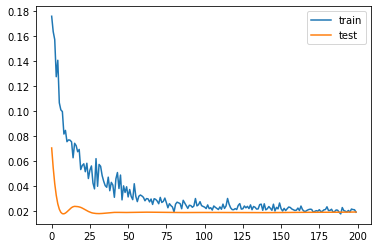

1.114036962389946
DavinsonSánchez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 78 samples, validate on 20 samples
Epoch 1/200
78/78 [==============================] - 0s 6ms/step - loss: 0.1458 - mse: 0.1458 - val_loss: 0.0781 - val_mse: 0.0781
Epoch 2/200
78/78 [==============================] - 0s 154us/step - loss: 0.1271 - mse: 0.1271 - val_loss: 0.0675 - val_mse: 0.0675
Epoch 3/200
78/78 [==============================] - 0s 141us/step - loss: 0.1257 - mse: 0.1257 - val_loss: 0.0593 - val_mse: 0.0593
Epoch 4/200
78/78 [==============================] - 0s 141us/step - loss: 0.1305 - mse: 0.1305 - val_loss: 0.0528 - val_mse: 0.0528
Epoch 5/200
78/78 [==============================] - 0s 141us/step - loss: 0.1302 - mse: 0.1302 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 6/200
78/78 [==============================] - 0s 141us/step - loss: 0.1001 - mse: 0.1001 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 7/200
78/78 [==============================] - 0s 154us/step - loss: 0.0969 - mse: 0.0969 - val_loss: 0.0407 - val_mse: 0.0407
Epoch 8/200
78/78 [========

Epoch 62/200
78/78 [==============================] - 0s 141us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 63/200
78/78 [==============================] - 0s 141us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 64/200
78/78 [==============================] - 0s 128us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0490 - val_mse: 0.0490
Epoch 65/200
78/78 [==============================] - 0s 128us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 66/200
78/78 [==============================] - 0s 128us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 67/200
78/78 [==============================] - 0s 128us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 68/200
78/78 [==============================] - 0s 141us/step - loss: 0.0425 - mse: 0.0425 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 69/200
78/78 [==============================] - 0s 115us

Epoch 123/200
78/78 [==============================] - 0s 128us/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 124/200
78/78 [==============================] - 0s 128us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0508 - val_mse: 0.0508
Epoch 125/200
78/78 [==============================] - 0s 141us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0507 - val_mse: 0.0507
Epoch 126/200
78/78 [==============================] - 0s 141us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 127/200
78/78 [==============================] - 0s 115us/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 128/200
78/78 [==============================] - 0s 141us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 129/200
78/78 [==============================] - 0s 115us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 130/200
78/78 [==============================] - 

Epoch 184/200
78/78 [==============================] - 0s 128us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 185/200
78/78 [==============================] - 0s 128us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 186/200
78/78 [==============================] - 0s 141us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 187/200
78/78 [==============================] - 0s 141us/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0517 - val_mse: 0.0517
Epoch 188/200
78/78 [==============================] - 0s 141us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0516 - val_mse: 0.0516
Epoch 189/200
78/78 [==============================] - 0s 128us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0515 - val_mse: 0.0515
Epoch 190/200
78/78 [==============================] - 0s 128us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0514 - val_mse: 0.0514
Epoch 191/200
78/78 [==============================] - 

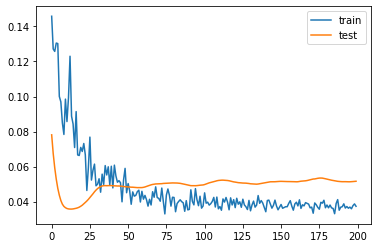

2.970057010650635
RyanSessegnon
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 9ms/step - loss: 0.1135 - mse: 0.1135 - val_loss: 0.1058 - val_mse: 0.1058
Epoch 2/200
52/52 [==============================] - 0s 192us/step - loss: 0.1451 - mse: 0.1451 - val_loss: 0.0984 - val_mse: 0.0984
Epoch 3/200
52/52 [==============================] - 0s 192us/step - loss: 0.1220 - mse: 0.1220 - val_loss: 0.0899 - val_mse: 0.0899
Epoch 4/200
52/52 [==============================] - 0s 192us/step - loss: 0.1143 - mse: 0.1143 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 5/200
52/52 [==============================] - 0s 184us/step - loss: 0.1104 - mse: 0.1104 - val_loss: 0.0748 - val_mse: 0.0748
Epoch 6/200
52/52 [==============================] - 0s 192us/step - loss: 0.1064 - mse: 0.1064 - val_loss: 0.0674 - val_mse: 0.0674
Epoch 7/200
52/52 [==============================] - 0s 173us/step - loss: 0.1079 - mse: 0.1079 - val_loss: 0.0613 - val_mse: 0.0613
Epoch 8/200
52/52 [========

Epoch 62/200
52/52 [==============================] - 0s 192us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 63/200
52/52 [==============================] - 0s 231us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 64/200
52/52 [==============================] - 0s 192us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 65/200
52/52 [==============================] - 0s 192us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 66/200
52/52 [==============================] - 0s 192us/step - loss: 0.0597 - mse: 0.0597 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 67/200
52/52 [==============================] - 0s 173us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 68/200
52/52 [==============================] - 0s 192us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 69/200
52/52 [==============================] - 0s 192us

Epoch 123/200
52/52 [==============================] - 0s 211us/step - loss: 0.0508 - mse: 0.0508 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 124/200
52/52 [==============================] - 0s 211us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 125/200
52/52 [==============================] - 0s 192us/step - loss: 0.0471 - mse: 0.0471 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 127/200
52/52 [==============================] - 0s 192us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 128/200
52/52 [==============================] - 0s 192us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 129/200
52/52 [==============================] - 0s 192us/step - loss: 0.0561 - mse: 0.0561 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 192us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 185/200
52/52 [==============================] - 0s 173us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 186/200
52/52 [==============================] - 0s 173us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 187/200
52/52 [==============================] - 0s 173us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0250 - val_mse: 0.0250
Epoch 188/200
52/52 [==============================] - 0s 173us/step - loss: 0.0486 - mse: 0.0486 - val_loss: 0.0250 - val_mse: 0.0250
Epoch 189/200
52/52 [==============================] - 0s 192us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0251 - val_mse: 0.0251
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0433 - mse: 0.0433 - val_loss: 0.0251 - val_mse: 0.0251
Epoch 191/200
52/52 [==============================] - 

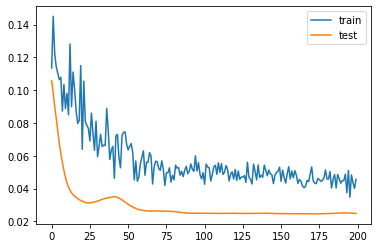

2.459580570459366
StevenBergwijn
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



JaphetTanganga
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 7 samples, validate on 2 samples
Epoch 1/200
7/7 [==============================] - 1s 73ms/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 2/200
7/7 [==============================] - 0s 1000us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 3/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0997 - mse: 0.0997 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 4/200
7/7 [==============================] - 0s 1ms/step - loss: 0.1039 - mse: 0.1039 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 5/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0713 - mse: 0.0713 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 6/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0976 - mse: 0.0976 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 7/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 8/200
7/7 [==============================] - 

Epoch 64/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 65/200
7/7 [==============================] - 0s 999us/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 66/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 67/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0188 - mse: 0.0188 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 68/200
7/7 [==============================] - 0s 999us/step - loss: 0.0223 - mse: 0.0223 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 69/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 70/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 71/200
7/7 [==============================] - 0s 1000us/step - loss: 0.0312 - ms

Epoch 127/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 128/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 129/200
7/7 [==============================] - 0s 999us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 130/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 131/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 132/200
7/7 [==============================] - 0s 999us/step - loss: 0.0147 - mse: 0.0147 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 133/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 134/200
7/7 [==============================] - 0s 999us/step - loss: 0.01

Epoch 188/200
7/7 [==============================] - 0s 999us/step - loss: 0.0073 - mse: 0.0073 - val_loss: 5.4505e-04 - val_mse: 5.4505e-04
Epoch 189/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 5.3067e-04 - val_mse: 5.3067e-04
Epoch 190/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 5.3832e-04 - val_mse: 5.3832e-04
Epoch 191/200
7/7 [==============================] - 0s 999us/step - loss: 0.0166 - mse: 0.0166 - val_loss: 5.6465e-04 - val_mse: 5.6465e-04
Epoch 192/200
7/7 [==============================] - 0s 999us/step - loss: 0.0154 - mse: 0.0154 - val_loss: 5.9788e-04 - val_mse: 5.9788e-04
Epoch 193/200
7/7 [==============================] - 0s 1ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 6.3215e-04 - val_mse: 6.3215e-04
Epoch 194/200
7/7 [==============================] - 0s 999us/step - loss: 0.0012 - mse: 0.0012 - val_loss: 6.5402e-04 - val_mse: 6.5402e-04
Epoch 195/200
7/7 [

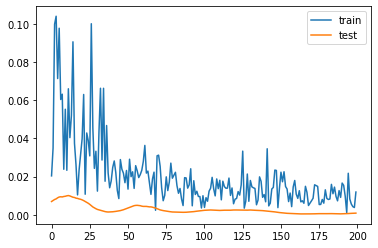

-0.4897685945034027
GiovaniLo Celso
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 24ms/step - loss: 0.0962 - mse: 0.0962 - val_loss: 0.4208 - val_mse: 0.4208
Epoch 2/200
21/21 [==============================] - 0s 429us/step - loss: 0.0732 - mse: 0.0732 - val_loss: 0.3948 - val_mse: 0.3948
Epoch 3/200
21/21 [==============================] - 0s 427us/step - loss: 0.1048 - mse: 0.1048 - val_loss: 0.3669 - val_mse: 0.3669
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.0689 - mse: 0.0689 - val_loss: 0.3418 - val_mse: 0.3418
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.0581 - mse: 0.0581 - val_loss: 0.3210 - val_mse: 0.3210
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.0413 - mse: 0.0413 - val_loss: 0.3010 - val_mse: 0.3010
Epoch 7/200
21/21 [==============================] - 0s 380us/step - loss: 0.0497 - mse: 0.0497 - val_loss: 0.2825 - val_mse: 0.2825
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 423us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.2403 - val_mse: 0.2403
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0309 - mse: 0.0309 - val_loss: 0.2404 - val_mse: 0.2404
Epoch 64/200
21/21 [==============================] - 0s 333us/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.2407 - val_mse: 0.2407
Epoch 65/200
21/21 [==============================] - 0s 333us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.2406 - val_mse: 0.2406
Epoch 66/200
21/21 [==============================] - 0s 383us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.2408 - val_mse: 0.2408
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0331 - mse: 0.0331 - val_loss: 0.2411 - val_mse: 0.2411
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.2413 - val_mse: 0.2413
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.2335 - val_mse: 0.2335
Epoch 124/200
21/21 [==============================] - 0s 428us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.2333 - val_mse: 0.2333
Epoch 125/200
21/21 [==============================] - 0s 428us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.2333 - val_mse: 0.2333
Epoch 126/200
21/21 [==============================] - 0s 428us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.2332 - val_mse: 0.2332
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0254 - mse: 0.0254 - val_loss: 0.2331 - val_mse: 0.2331
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.2331 - val_mse: 0.2331
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.2330 - val_mse: 0.2330
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 476us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.2316 - val_mse: 0.2316
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.2312 - val_mse: 0.2312
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.2312 - val_mse: 0.2312
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0203 - mse: 0.0203 - val_loss: 0.2309 - val_mse: 0.2309
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.2306 - val_mse: 0.2306
Epoch 189/200
21/21 [==============================] - 0s 428us/step - loss: 0.0197 - mse: 0.0197 - val_loss: 0.2301 - val_mse: 0.2301
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.2297 - val_mse: 0.2297
Epoch 191/200
21/21 [==============================] - 

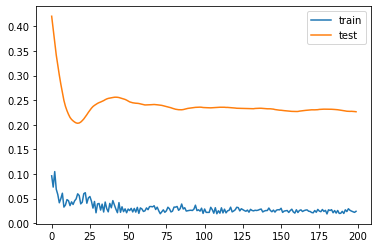

1.453976422548294
TanguyNdombele
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 29ms/step - loss: 0.1537 - mse: 0.1537 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1195 - mse: 0.1195 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 3/200
21/21 [==============================] - 0s 475us/step - loss: 0.1108 - mse: 0.1108 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.1478 - mse: 0.1478 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 5/200
21/21 [==============================] - 0s 381us/step - loss: 0.0936 - mse: 0.0936 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 6/200
21/21 [==============================] - 0s 476us/step - loss: 0.1472 - mse: 0.1472 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 7/200
21/21 [==============================] - 0s 428us/step - loss: 0.1080 - mse: 0.1080 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0232 - mse: 0.0232 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 63/200
21/21 [==============================] - 0s 333us/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0235 - mse: 0.0235 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 126/200
21/21 [==============================] - 0s 333us/step - loss: 0.0158 - mse: 0.0158 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0199 - mse: 0.0199 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 186/200
21/21 [==============================] - 0s 381us/step - loss: 0.0118 - mse: 0.0118 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0148 - mse: 0.0148 - val_loss: 0.0092 - val_mse: 0.0092
Epoch 189/200
21/21 [==============================] - 0s 476us/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 190/200
21/21 [==============================] - 0s 476us/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 191/200
21/21 [==============================] - 

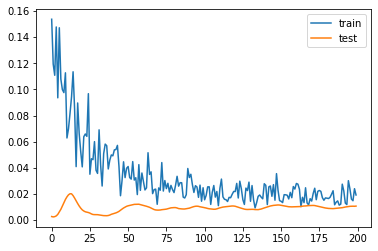

0.2312261015176773
MattDoherty
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 10ms/step - loss: 0.3030 - mse: 0.3030 - val_loss: 0.1523 - val_mse: 0.1523
Epoch 2/200
51/51 [==============================] - 0s 215us/step - loss: 0.3571 - mse: 0.3571 - val_loss: 0.1318 - val_mse: 0.1318
Epoch 3/200
51/51 [==============================] - 0s 216us/step - loss: 0.2321 - mse: 0.2321 - val_loss: 0.1128 - val_mse: 0.1128
Epoch 4/200
51/51 [==============================] - 0s 216us/step - loss: 0.1955 - mse: 0.1955 - val_loss: 0.0951 - val_mse: 0.0951
Epoch 5/200
51/51 [==============================] - 0s 196us/step - loss: 0.1901 - mse: 0.1901 - val_loss: 0.0803 - val_mse: 0.0803
Epoch 6/200
51/51 [==============================] - 0s 176us/step - loss: 0.1571 - mse: 0.1571 - val_loss: 0.0678 - val_mse: 0.0678
Epoch 7/200
51/51 [==============================] - 0s 196us/step - loss: 0.2147 - mse: 0.2147 - val_loss: 0.0577 - val_mse: 0.0577
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 157us/step - loss: 0.0678 - mse: 0.0678 - val_loss: 0.0399 - val_mse: 0.0399
Epoch 63/200
51/51 [==============================] - 0s 196us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 64/200
51/51 [==============================] - 0s 196us/step - loss: 0.0760 - mse: 0.0760 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 65/200
51/51 [==============================] - 0s 216us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 66/200
51/51 [==============================] - 0s 196us/step - loss: 0.0832 - mse: 0.0832 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 67/200
51/51 [==============================] - 0s 176us/step - loss: 0.0753 - mse: 0.0753 - val_loss: 0.0414 - val_mse: 0.0414
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 69/200
51/51 [==============================] - 0s 176us

Epoch 123/200
51/51 [==============================] - 0s 196us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 124/200
51/51 [==============================] - 0s 176us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 125/200
51/51 [==============================] - 0s 157us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 126/200
51/51 [==============================] - 0s 176us/step - loss: 0.0780 - mse: 0.0780 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 127/200
51/51 [==============================] - 0s 196us/step - loss: 0.0642 - mse: 0.0642 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0438 - val_mse: 0.0438
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 186/200
51/51 [==============================] - 0s 176us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0448 - val_mse: 0.0448
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0575 - mse: 0.0575 - val_loss: 0.0455 - val_mse: 0.0455
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0609 - mse: 0.0609 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 190/200
51/51 [==============================] - 0s 196us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0460 - val_mse: 0.0460
Epoch 191/200
51/51 [==============================] - 

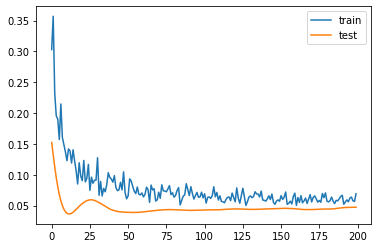

8.204119682312012
CallumRobinson
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



MarkNoble
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 5ms/step - loss: 0.1162 - mse: 0.1162 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 2/200
111/111 [==============================] - 0s 117us/step - loss: 0.0968 - mse: 0.0968 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 3/200
111/111 [==============================] - 0s 108us/step - loss: 0.0792 - mse: 0.0792 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 4/200
111/111 [==============================] - 0s 126us/step - loss: 0.0867 - mse: 0.0867 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 5/200
111/111 [==============================] - 0s 117us/step - loss: 0.0946 - mse: 0.0946 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 6/200
111/111 [==============================] - 0s 126us/step - loss: 0.0889 - mse: 0.0889 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 7/200
111/111 [==============================] - 0s 117us/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 8/200


Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 63/200
111/111 [==============================] - 0s 99us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 64/200
111/111 [==============================] - 0s 126us/step - loss: 0.0304 - mse: 0.0304 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 65/200
111/111 [==============================] - 0s 117us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 66/200
111/111 [==============================] - 0s 108us/step - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0179 - val_mse: 0.0179
Epoch 68/200
111/111 [==============================] - 0s 99us/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 69/200
111/111 [==============================

Epoch 123/200
111/111 [==============================] - 0s 99us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 124/200
111/111 [==============================] - 0s 99us/step - loss: 0.0305 - mse: 0.0305 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 125/200
111/111 [==============================] - 0s 108us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 126/200
111/111 [==============================] - 0s 108us/step - loss: 0.0271 - mse: 0.0271 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 127/200
111/111 [==============================] - 0s 108us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 128/200
111/111 [==============================] - 0s 108us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 129/200
111/111 [==============================] - 0s 99us/step - loss: 0.0258 - mse: 0.0258 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 130/200
111/111 [=====================

Epoch 183/200
111/111 [==============================] - 0s 108us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 184/200
111/111 [==============================] - 0s 117us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 185/200
111/111 [==============================] - 0s 126us/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 186/200
111/111 [==============================] - 0s 126us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 187/200
111/111 [==============================] - 0s 108us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 188/200
111/111 [==============================] - 0s 108us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 189/200
111/111 [==============================] - 0s 108us/step - loss: 0.0228 - mse: 0.0228 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 190/200
111/111 [==================

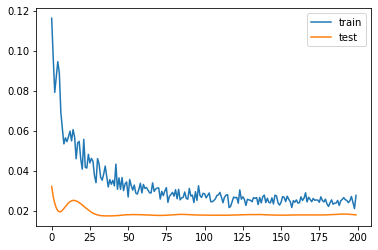

3.162765800952912
RobertSnodgrass
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 80 samples, validate on 20 samples
Epoch 1/200
80/80 [==============================] - 0s 6ms/step - loss: 0.1340 - mse: 0.1340 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 2/200
80/80 [==============================] - 0s 137us/step - loss: 0.1100 - mse: 0.1100 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 3/200
80/80 [==============================] - 0s 137us/step - loss: 0.0980 - mse: 0.0980 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 4/200
80/80 [==============================] - 0s 150us/step - loss: 0.0750 - mse: 0.0750 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 5/200
80/80 [==============================] - 0s 137us/step - loss: 0.1005 - mse: 0.1005 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 6/200
80/80 [==============================] - 0s 137us/step - loss: 0.0971 - mse: 0.0971 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 7/200
80/80 [==============================] - 0s 125us/step - loss: 0.0899 - mse: 0.0899 - val_loss: 0.0299 - val_mse: 0.0299
Epoch 8/200
80/80 [========

Epoch 62/200
80/80 [==============================] - 0s 150us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 63/200
80/80 [==============================] - 0s 137us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 64/200
80/80 [==============================] - 0s 137us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 65/200
80/80 [==============================] - 0s 125us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 66/200
80/80 [==============================] - 0s 125us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 67/200
80/80 [==============================] - 0s 137us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 68/200
80/80 [==============================] - 0s 125us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 69/200
80/80 [==============================] - 0s 137us

Epoch 123/200
80/80 [==============================] - 0s 150us/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 124/200
80/80 [==============================] - 0s 150us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 125/200
80/80 [==============================] - 0s 137us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 126/200
80/80 [==============================] - 0s 125us/step - loss: 0.0283 - mse: 0.0283 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 127/200
80/80 [==============================] - 0s 125us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 128/200
80/80 [==============================] - 0s 137us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 129/200
80/80 [==============================] - 0s 125us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 130/200
80/80 [==============================] - 

Epoch 184/200
80/80 [==============================] - 0s 137us/step - loss: 0.0280 - mse: 0.0280 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 185/200
80/80 [==============================] - 0s 150us/step - loss: 0.0299 - mse: 0.0299 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 186/200
80/80 [==============================] - 0s 150us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 187/200
80/80 [==============================] - 0s 150us/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 188/200
80/80 [==============================] - 0s 150us/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 189/200
80/80 [==============================] - 0s 137us/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 190/200
80/80 [==============================] - 0s 137us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 191/200
80/80 [==============================] - 

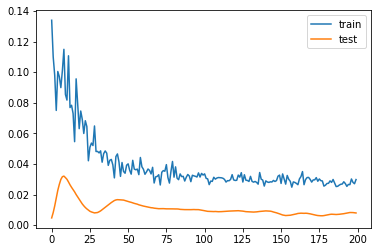

3.743479996919632
DavidMartin
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 16 samples, validate on 4 samples
Epoch 1/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0890 - mse: 0.0890 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 2/200
16/16 [==============================] - 0s 500us/step - loss: 0.0735 - mse: 0.0735 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 3/200
16/16 [==============================] - 0s 499us/step - loss: 0.1015 - mse: 0.1015 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 4/200
16/16 [==============================] - 0s 562us/step - loss: 0.0953 - mse: 0.0953 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 5/200
16/16 [==============================] - 0s 500us/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 6/200
16/16 [==============================] - 0s 561us/step - loss: 0.0852 - mse: 0.0852 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 7/200
16/16 [==============================] - 0s 500us/step - loss: 0.0855 - mse: 0.0855 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 8/200
16/16 [========

Epoch 62/200
16/16 [==============================] - 0s 500us/step - loss: 0.0133 - mse: 0.0133 - val_loss: 8.9795e-04 - val_mse: 8.9795e-04
Epoch 63/200
16/16 [==============================] - 0s 500us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 8.2582e-04 - val_mse: 8.2582e-04
Epoch 64/200
16/16 [==============================] - 0s 437us/step - loss: 0.0123 - mse: 0.0123 - val_loss: 7.6427e-04 - val_mse: 7.6427e-04
Epoch 65/200
16/16 [==============================] - 0s 562us/step - loss: 0.0162 - mse: 0.0162 - val_loss: 7.0282e-04 - val_mse: 7.0282e-04
Epoch 66/200
16/16 [==============================] - 0s 500us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 6.5937e-04 - val_mse: 6.5937e-04
Epoch 67/200
16/16 [==============================] - 0s 500us/step - loss: 0.0223 - mse: 0.0223 - val_loss: 6.2331e-04 - val_mse: 6.2331e-04
Epoch 68/200
16/16 [==============================] - 0s 500us/step - loss: 0.0194 - mse: 0.0194 - val_loss: 6.0820e-04 - val_mse: 6.0820e-04
Epoch 

Epoch 121/200
16/16 [==============================] - 0s 500us/step - loss: 0.0050 - mse: 0.0050 - val_loss: 6.3242e-04 - val_mse: 6.3242e-04
Epoch 122/200
16/16 [==============================] - 0s 500us/step - loss: 0.0102 - mse: 0.0102 - val_loss: 6.9519e-04 - val_mse: 6.9519e-04
Epoch 123/200
16/16 [==============================] - 0s 437us/step - loss: 0.0120 - mse: 0.0120 - val_loss: 7.2227e-04 - val_mse: 7.2227e-04
Epoch 124/200
16/16 [==============================] - 0s 500us/step - loss: 0.0093 - mse: 0.0093 - val_loss: 7.5003e-04 - val_mse: 7.5003e-04
Epoch 125/200
16/16 [==============================] - 0s 437us/step - loss: 0.0066 - mse: 0.0066 - val_loss: 8.1089e-04 - val_mse: 8.1089e-04
Epoch 126/200
16/16 [==============================] - 0s 437us/step - loss: 0.0088 - mse: 0.0088 - val_loss: 8.5632e-04 - val_mse: 8.5632e-04
Epoch 127/200
16/16 [==============================] - 0s 500us/step - loss: 0.0128 - mse: 0.0128 - val_loss: 8.7328e-04 - val_mse: 8.7328e-04

Epoch 179/200
16/16 [==============================] - 0s 437us/step - loss: 0.0095 - mse: 0.0095 - val_loss: 8.8959e-05 - val_mse: 8.8959e-05
Epoch 180/200
16/16 [==============================] - 0s 437us/step - loss: 0.0076 - mse: 0.0076 - val_loss: 9.2588e-05 - val_mse: 9.2588e-05
Epoch 181/200
16/16 [==============================] - 0s 500us/step - loss: 0.0018 - mse: 0.0018 - val_loss: 1.0116e-04 - val_mse: 1.0116e-04
Epoch 182/200
16/16 [==============================] - 0s 500us/step - loss: 0.0050 - mse: 0.0050 - val_loss: 1.0916e-04 - val_mse: 1.0916e-04
Epoch 183/200
16/16 [==============================] - 0s 500us/step - loss: 0.0046 - mse: 0.0046 - val_loss: 1.2269e-04 - val_mse: 1.2269e-04
Epoch 184/200
16/16 [==============================] - 0s 500us/step - loss: 0.0021 - mse: 0.0021 - val_loss: 1.3844e-04 - val_mse: 1.3844e-04
Epoch 185/200
16/16 [==============================] - 0s 500us/step - loss: 0.0062 - mse: 0.0062 - val_loss: 1.5981e-04 - val_mse: 1.5981e-04

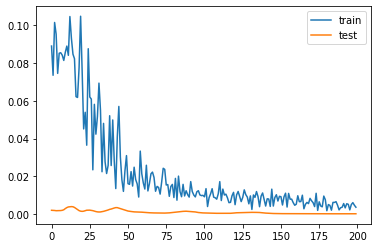

0.08926057256758213
LukaszFabianski
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 1s 5ms/step - loss: 0.1859 - mse: 0.1859 - val_loss: 0.0646 - val_mse: 0.0646
Epoch 2/200
110/110 [==============================] - 0s 109us/step - loss: 0.1743 - mse: 0.1743 - val_loss: 0.0612 - val_mse: 0.0612
Epoch 3/200
110/110 [==============================] - 0s 100us/step - loss: 0.1785 - mse: 0.1785 - val_loss: 0.0584 - val_mse: 0.0584
Epoch 4/200
110/110 [==============================] - 0s 100us/step - loss: 0.1374 - mse: 0.1374 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 5/200
110/110 [==============================] - 0s 109us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 6/200
110/110 [==============================] - 0s 118us/step - loss: 0.1567 - mse: 0.1567 - val_loss: 0.0518 - val_mse: 0.0518
Epoch 7/200
110/110 [==============================] - 0s 100us/step - loss: 0.1584 - mse: 0.1584 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 8/200


Epoch 62/200
110/110 [==============================] - 0s 109us/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 63/200
110/110 [==============================] - 0s 100us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 64/200
110/110 [==============================] - 0s 100us/step - loss: 0.0678 - mse: 0.0678 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 65/200
110/110 [==============================] - 0s 109us/step - loss: 0.0739 - mse: 0.0739 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 66/200
110/110 [==============================] - 0s 109us/step - loss: 0.0691 - mse: 0.0691 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 67/200
110/110 [==============================] - 0s 91us/step - loss: 0.0814 - mse: 0.0814 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 68/200
110/110 [==============================] - 0s 109us/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 69/200
110/110 [===========================

110/110 [==============================] - 0s 100us/step - loss: 0.0664 - mse: 0.0664 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 123/200
110/110 [==============================] - 0s 100us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 124/200
110/110 [==============================] - 0s 109us/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 125/200
110/110 [==============================] - 0s 109us/step - loss: 0.0641 - mse: 0.0641 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 126/200
110/110 [==============================] - 0s 109us/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 127/200
110/110 [==============================] - 0s 100us/step - loss: 0.0653 - mse: 0.0653 - val_loss: 0.0442 - val_mse: 0.0442
Epoch 128/200
110/110 [==============================] - 0s 109us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0443 - val_mse: 0.0443
Epoch 129/200
110/110 [==============================] 

Epoch 182/200
110/110 [==============================] - 0s 100us/step - loss: 0.0662 - mse: 0.0662 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 183/200
110/110 [==============================] - 0s 100us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 184/200
110/110 [==============================] - 0s 100us/step - loss: 0.0654 - mse: 0.0654 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 185/200
110/110 [==============================] - 0s 109us/step - loss: 0.0652 - mse: 0.0652 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 186/200
110/110 [==============================] - 0s 109us/step - loss: 0.0618 - mse: 0.0618 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 187/200
110/110 [==============================] - 0s 95us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 188/200
110/110 [==============================] - 0s 100us/step - loss: 0.0661 - mse: 0.0661 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 189/200
110/110 [===================

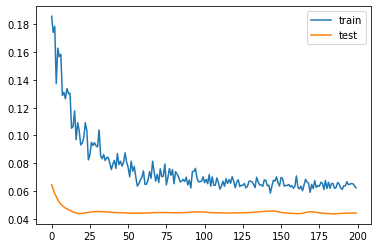

4.507215082645416
AngeloOgbonna
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 110 samples, validate on 28 samples
Epoch 1/200
110/110 [==============================] - 0s 4ms/step - loss: 0.2807 - mse: 0.2807 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 2/200
110/110 [==============================] - 0s 118us/step - loss: 0.3562 - mse: 0.3562 - val_loss: 0.0407 - val_mse: 0.0407
Epoch 3/200
110/110 [==============================] - 0s 109us/step - loss: 0.2752 - mse: 0.2752 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 4/200
110/110 [==============================] - 0s 109us/step - loss: 0.2294 - mse: 0.2294 - val_loss: 0.0254 - val_mse: 0.0254
Epoch 5/200
110/110 [==============================] - 0s 105us/step - loss: 0.2324 - mse: 0.2324 - val_loss: 0.0246 - val_mse: 0.0246
Epoch 6/200
110/110 [==============================] - 0s 118us/step - loss: 0.1990 - mse: 0.1990 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 7/200
110/110 [==============================] - 0s 118us/step - loss: 0.2064 - mse: 0.2064 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 8/200


110/110 [==============================] - 0s 100us/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0374 - val_mse: 0.0374
Epoch 62/200
110/110 [==============================] - 0s 109us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0368 - val_mse: 0.0368
Epoch 63/200
110/110 [==============================] - 0s 100us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0362 - val_mse: 0.0362
Epoch 64/200
110/110 [==============================] - 0s 109us/step - loss: 0.0485 - mse: 0.0485 - val_loss: 0.0356 - val_mse: 0.0356
Epoch 65/200
110/110 [==============================] - 0s 100us/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0349 - val_mse: 0.0349
Epoch 66/200
110/110 [==============================] - 0s 100us/step - loss: 0.0629 - mse: 0.0629 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 67/200
110/110 [==============================] - 0s 100us/step - loss: 0.0602 - mse: 0.0602 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 68/200
110/110 [==============================] - 0s 91

Epoch 122/200
110/110 [==============================] - 0s 109us/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 123/200
110/110 [==============================] - 0s 100us/step - loss: 0.0497 - mse: 0.0497 - val_loss: 0.0325 - val_mse: 0.0325
Epoch 124/200
110/110 [==============================] - 0s 100us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 125/200
110/110 [==============================] - 0s 100us/step - loss: 0.0493 - mse: 0.0493 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 126/200
110/110 [==============================] - 0s 91us/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 127/200
110/110 [==============================] - 0s 109us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0326 - val_mse: 0.0326
Epoch 128/200
110/110 [==============================] - 0s 91us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 129/200
110/110 [====================

Epoch 182/200
110/110 [==============================] - 0s 100us/step - loss: 0.0480 - mse: 0.0480 - val_loss: 0.0292 - val_mse: 0.0292
Epoch 183/200
110/110 [==============================] - 0s 109us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 184/200
110/110 [==============================] - 0s 100us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 185/200
110/110 [==============================] - 0s 100us/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 186/200
110/110 [==============================] - 0s 91us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 187/200
110/110 [==============================] - 0s 91us/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 188/200
110/110 [==============================] - 0s 100us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 189/200
110/110 [====================

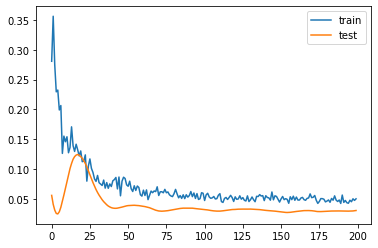

2.049399495124817
RobertoJimenez Gago
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 26ms/step - loss: 0.1235 - mse: 0.1235 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 2/200
21/21 [==============================] - 0s 381us/step - loss: 0.1035 - mse: 0.1035 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1625 - mse: 0.1625 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 4/200
21/21 [==============================] - 0s 428us/step - loss: 0.1770 - mse: 0.1770 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.0892 - mse: 0.0892 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 6/200
21/21 [==============================] - 0s 476us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 7/200
21/21 [==============================] - 0s 476us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 428us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.0428 - mse: 0.0428 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0601 - mse: 0.0601 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 66/200
21/21 [==============================] - 0s 333us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 68/200
21/21 [==============================] - 0s 428us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 69/200
21/21 [==============================] - 0s 428us

Epoch 123/200
21/21 [==============================] - 0s 428us/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 125/200
21/21 [==============================] - 0s 333us/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 129/200
21/21 [==============================] - 0s 428us/step - loss: 0.0236 - mse: 0.0236 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 381us/step - loss: 0.0172 - mse: 0.0172 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0185 - mse: 0.0185 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 187/200
21/21 [==============================] - 0s 381us/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 191/200
21/21 [==============================] - 

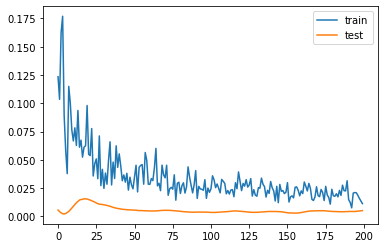

1.045452207326889
AaronCresswell
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 0s 4ms/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 2/200
112/112 [==============================] - 0s 107us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.0617 - mse: 0.0617 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 4/200
112/112 [==============================] - 0s 116us/step - loss: 0.0630 - mse: 0.0630 - val_loss: 0.0201 - val_mse: 0.0201
Epoch 5/200
112/112 [==============================] - 0s 98us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 6/200
112/112 [==============================] - 0s 98us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 7/200
112/112 [==============================] - 0s 89us/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 8/200
112

Epoch 62/200
112/112 [==============================] - 0s 107us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 63/200
112/112 [==============================] - 0s 98us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 64/200
112/112 [==============================] - 0s 98us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 65/200
112/112 [==============================] - 0s 98us/step - loss: 0.0372 - mse: 0.0372 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 66/200
112/112 [==============================] - 0s 98us/step - loss: 0.0380 - mse: 0.0380 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 67/200
112/112 [==============================] - 0s 98us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 68/200
112/112 [==============================] - 0s 98us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 69/200
112/112 [==============================] 

Epoch 123/200
112/112 [==============================] - 0s 98us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 124/200
112/112 [==============================] - 0s 107us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 125/200
112/112 [==============================] - 0s 89us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 126/200
112/112 [==============================] - 0s 107us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 127/200
112/112 [==============================] - 0s 98us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 128/200
112/112 [==============================] - 0s 89us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 129/200
112/112 [==============================] - 0s 98us/step - loss: 0.0345 - mse: 0.0345 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 130/200
112/112 [=======================

112/112 [==============================] - 0s 116us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 184/200
112/112 [==============================] - 0s 116us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 185/200
112/112 [==============================] - 0s 98us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 186/200
112/112 [==============================] - 0s 107us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 187/200
112/112 [==============================] - 0s 116us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 188/200
112/112 [==============================] - 0s 125us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 189/200
112/112 [==============================] - 0s 116us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 190/200
112/112 [==============================] -

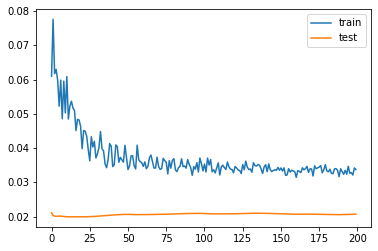

2.251030534505844
AndriyYarmolenko
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 10ms/step - loss: 0.1169 - mse: 0.1169 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 2/200
51/51 [==============================] - 0s 235us/step - loss: 0.1108 - mse: 0.1108 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 3/200
51/51 [==============================] - 0s 235us/step - loss: 0.0819 - mse: 0.0819 - val_loss: 7.8149e-04 - val_mse: 7.8149e-04
Epoch 4/200
51/51 [==============================] - 0s 235us/step - loss: 0.1076 - mse: 0.1076 - val_loss: 8.6053e-04 - val_mse: 8.6053e-04
Epoch 5/200
51/51 [==============================] - 0s 235us/step - loss: 0.1360 - mse: 0.1360 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 6/200
51/51 [==============================] - 0s 216us/step - loss: 0.1413 - mse: 0.1413 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 7/200
51/51 [==============================] - 0s 196us/step - loss: 0.1024 - mse: 0.1024 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 8/20

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 63/200
51/51 [==============================] - 0s 176us/step - loss: 0.0378 - mse: 0.0378 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 65/200
51/51 [==============================] - 0s 196us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 66/200
51/51 [==============================] - 0s 196us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 67/200
51/51 [==============================] - 0s 196us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 69/200
51/51 [==============================] - 0s 176us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 124/200
51/51 [==============================] - 0s 196us/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 125/200
51/51 [==============================] - 0s 196us/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 126/200
51/51 [==============================] - 0s 176us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 127/200
51/51 [==============================] - 0s 157us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 128/200
51/51 [==============================] - 0s 176us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0307 - mse: 0.0307 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 186/200
51/51 [==============================] - 0s 176us/step - loss: 0.0303 - mse: 0.0303 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 187/200
51/51 [==============================] - 0s 196us/step - loss: 0.0312 - mse: 0.0312 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0313 - mse: 0.0313 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 191/200
51/51 [==============================] - 

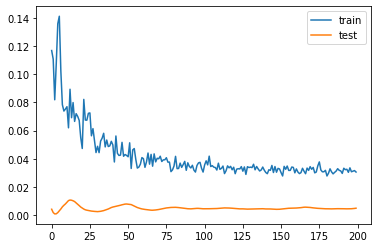

0.25064200535416603
MichailAntonio
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 111 samples, validate on 28 samples
Epoch 1/200
111/111 [==============================] - 1s 5ms/step - loss: 0.1571 - mse: 0.1571 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 2/200
111/111 [==============================] - 0s 108us/step - loss: 0.1086 - mse: 0.1086 - val_loss: 0.0295 - val_mse: 0.0295
Epoch 3/200
111/111 [==============================] - 0s 108us/step - loss: 0.1085 - mse: 0.1085 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 4/200
111/111 [==============================] - 0s 117us/step - loss: 0.1061 - mse: 0.1061 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 5/200
111/111 [==============================] - 0s 108us/step - loss: 0.1001 - mse: 0.1001 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 6/200
111/111 [==============================] - 0s 108us/step - loss: 0.0839 - mse: 0.0839 - val_loss: 0.0168 - val_mse: 0.0168
Epoch 7/200
111/111 [==============================] - 0s 108us/step - loss: 0.1001 - mse: 0.1001 - val_loss: 0.0164 - val_mse: 0.0164
Epoch 8/200


Epoch 62/200
111/111 [==============================] - 0s 99us/step - loss: 0.0237 - mse: 0.0237 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 63/200
111/111 [==============================] - 0s 99us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 64/200
111/111 [==============================] - 0s 99us/step - loss: 0.0278 - mse: 0.0278 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 65/200
111/111 [==============================] - 0s 99us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 66/200
111/111 [==============================] - 0s 108us/step - loss: 0.0206 - mse: 0.0206 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 67/200
111/111 [==============================] - 0s 99us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 68/200
111/111 [==============================] - 0s 108us/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 69/200
111/111 [==============================]

Epoch 123/200
111/111 [==============================] - 0s 108us/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0153 - val_mse: 0.0153
Epoch 124/200
111/111 [==============================] - 0s 108us/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0153 - val_mse: 0.0153
Epoch 125/200
111/111 [==============================] - 0s 99us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0153 - val_mse: 0.0153
Epoch 126/200
111/111 [==============================] - 0s 99us/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 127/200
111/111 [==============================] - 0s 99us/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 128/200
111/111 [==============================] - 0s 108us/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 129/200
111/111 [==============================] - 0s 108us/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 130/200
111/111 [=====================

111/111 [==============================] - 0s 108us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0156 - val_mse: 0.0156
Epoch 184/200
111/111 [==============================] - 0s 90us/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 185/200
111/111 [==============================] - 0s 99us/step - loss: 0.0217 - mse: 0.0217 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 186/200
111/111 [==============================] - 0s 99us/step - loss: 0.0203 - mse: 0.0203 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 187/200
111/111 [==============================] - 0s 108us/step - loss: 0.0202 - mse: 0.0202 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 188/200
111/111 [==============================] - 0s 99us/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 189/200
111/111 [==============================] - 0s 99us/step - loss: 0.0226 - mse: 0.0226 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 190/200
111/111 [==============================] - 0s 

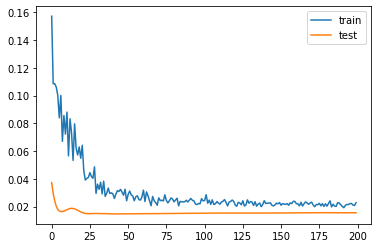

3.7205452024936676
RyanFredericks
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 0s 9ms/step - loss: 0.2835 - mse: 0.2835 - val_loss: 0.4306 - val_mse: 0.4306
Epoch 2/200
51/51 [==============================] - 0s 196us/step - loss: 0.2963 - mse: 0.2963 - val_loss: 0.3860 - val_mse: 0.3860
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.2005 - mse: 0.2005 - val_loss: 0.3466 - val_mse: 0.3466
Epoch 4/200
51/51 [==============================] - 0s 196us/step - loss: 0.2010 - mse: 0.2010 - val_loss: 0.3149 - val_mse: 0.3149
Epoch 5/200
51/51 [==============================] - 0s 176us/step - loss: 0.2401 - mse: 0.2401 - val_loss: 0.2871 - val_mse: 0.2871
Epoch 6/200
51/51 [==============================] - 0s 216us/step - loss: 0.1764 - mse: 0.1764 - val_loss: 0.2590 - val_mse: 0.2590
Epoch 7/200
51/51 [==============================] - 0s 216us/step - loss: 0.1580 - mse: 0.1580 - val_loss: 0.2304 - val_mse: 0.2304
Epoch 8/200
51/51 [========

Epoch 62/200
51/51 [==============================] - 0s 196us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0888 - val_mse: 0.0888
Epoch 63/200
51/51 [==============================] - 0s 176us/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0893 - val_mse: 0.0893
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0896 - val_mse: 0.0896
Epoch 65/200
51/51 [==============================] - 0s 176us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0901 - val_mse: 0.0901
Epoch 66/200
51/51 [==============================] - 0s 196us/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0905 - val_mse: 0.0905
Epoch 67/200
51/51 [==============================] - 0s 196us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0913 - val_mse: 0.0913
Epoch 69/200
51/51 [==============================] - 0s 176us

Epoch 123/200
51/51 [==============================] - 0s 196us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 124/200
51/51 [==============================] - 0s 196us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0931 - val_mse: 0.0931
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0933 - val_mse: 0.0933
Epoch 126/200
51/51 [==============================] - 0s 176us/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 127/200
51/51 [==============================] - 0s 196us/step - loss: 0.0311 - mse: 0.0311 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0341 - mse: 0.0341 - val_loss: 0.0931 - val_mse: 0.0931
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 196us/step - loss: 0.0292 - mse: 0.0292 - val_loss: 0.0964 - val_mse: 0.0964
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0970 - val_mse: 0.0970
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0975 - val_mse: 0.0975
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 188/200
51/51 [==============================] - 0s 157us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0977 - val_mse: 0.0977
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0975 - val_mse: 0.0975
Epoch 191/200
51/51 [==============================] - 

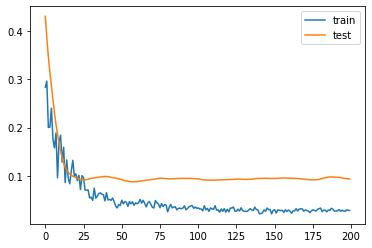

3.033518612384796
ManuelLanzini
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 112 samples, validate on 28 samples
Epoch 1/200
112/112 [==============================] - 1s 5ms/step - loss: 0.0894 - mse: 0.0894 - val_loss: 0.0924 - val_mse: 0.0924
Epoch 2/200
112/112 [==============================] - 0s 107us/step - loss: 0.0821 - mse: 0.0821 - val_loss: 0.0868 - val_mse: 0.0868
Epoch 3/200
112/112 [==============================] - 0s 107us/step - loss: 0.0806 - mse: 0.0806 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 4/200
112/112 [==============================] - 0s 116us/step - loss: 0.0844 - mse: 0.0844 - val_loss: 0.0777 - val_mse: 0.0777
Epoch 5/200
112/112 [==============================] - 0s 107us/step - loss: 0.0701 - mse: 0.0701 - val_loss: 0.0733 - val_mse: 0.0733
Epoch 6/200
112/112 [==============================] - 0s 98us/step - loss: 0.0676 - mse: 0.0676 - val_loss: 0.0702 - val_mse: 0.0702
Epoch 7/200
112/112 [==============================] - 0s 107us/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0678 - val_mse: 0.0678
Epoch 8/200
1

Epoch 62/200
112/112 [==============================] - 0s 107us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0713 - val_mse: 0.0713
Epoch 63/200
112/112 [==============================] - 0s 107us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 64/200
112/112 [==============================] - 0s 116us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0718 - val_mse: 0.0718
Epoch 65/200
112/112 [==============================] - 0s 107us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 66/200
112/112 [==============================] - 0s 98us/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0722 - val_mse: 0.0722
Epoch 67/200
112/112 [==============================] - 0s 98us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0723 - val_mse: 0.0723
Epoch 68/200
112/112 [==============================] - 0s 116us/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.0725 - val_mse: 0.0725
Epoch 69/200
112/112 [============================

112/112 [==============================] - 0s 107us/step - loss: 0.0395 - mse: 0.0395 - val_loss: 0.0716 - val_mse: 0.0716
Epoch 183/200
112/112 [==============================] - 0s 107us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0717 - val_mse: 0.0717
Epoch 184/200
112/112 [==============================] - 0s 98us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0719 - val_mse: 0.0719
Epoch 185/200
112/112 [==============================] - 0s 107us/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0721 - val_mse: 0.0721
Epoch 186/200
112/112 [==============================] - 0s 98us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0723 - val_mse: 0.0723
Epoch 187/200
112/112 [==============================] - 0s 98us/step - loss: 0.0368 - mse: 0.0368 - val_loss: 0.0724 - val_mse: 0.0724
Epoch 188/200
112/112 [==============================] - 0s 98us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0726 - val_mse: 0.0726
Epoch 189/200
112/112 [==============================] - 0s

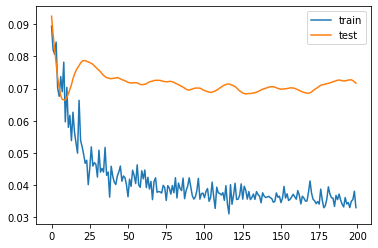

2.45769202709198
Felipe AndersonPereira Gomes
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 10ms/step - loss: 0.2702 - mse: 0.2702 - val_loss: 0.1387 - val_mse: 0.1387
Epoch 2/200
50/50 [==============================] - 0s 220us/step - loss: 0.2433 - mse: 0.2433 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.2228 - mse: 0.2228 - val_loss: 0.1014 - val_mse: 0.1014
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.2069 - mse: 0.2069 - val_loss: 0.0842 - val_mse: 0.0842
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.1556 - mse: 0.1556 - val_loss: 0.0695 - val_mse: 0.0695
Epoch 6/200
50/50 [==============================] - 0s 220us/step - loss: 0.1537 - mse: 0.1537 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1856 - mse: 0.1856 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 200us/step - loss: 0.0643 - mse: 0.0643 - val_loss: 0.0302 - val_mse: 0.0302
Epoch 63/200
50/50 [==============================] - 0s 180us/step - loss: 0.0775 - mse: 0.0775 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 64/200
50/50 [==============================] - 0s 200us/step - loss: 0.0736 - mse: 0.0736 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 65/200
50/50 [==============================] - 0s 180us/step - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0305 - val_mse: 0.0305
Epoch 66/200
50/50 [==============================] - 0s 180us/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 67/200
50/50 [==============================] - 0s 200us/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 68/200
50/50 [==============================] - 0s 200us/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 69/200
50/50 [==============================] - 0s 200us

Epoch 123/200
50/50 [==============================] - 0s 200us/step - loss: 0.0594 - mse: 0.0594 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 125/200
50/50 [==============================] - 0s 160us/step - loss: 0.0612 - mse: 0.0612 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0590 - mse: 0.0590 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 127/200
50/50 [==============================] - 0s 180us/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0316 - val_mse: 0.0316
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0608 - mse: 0.0608 - val_loss: 0.0316 - val_mse: 0.0316
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 200us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 185/200
50/50 [==============================] - 0s 180us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0328 - val_mse: 0.0328
Epoch 186/200
50/50 [==============================] - 0s 160us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0515 - mse: 0.0515 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 188/200
50/50 [==============================] - 0s 180us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0536 - mse: 0.0536 - val_loss: 0.0327 - val_mse: 0.0327
Epoch 191/200
50/50 [==============================] - 

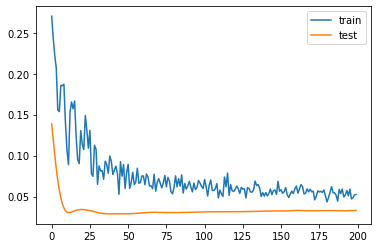

4.943612068891525
SébastienHaller
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 28ms/step - loss: 0.1689 - mse: 0.1689 - val_loss: 0.0171 - val_mse: 0.0171
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.0952 - mse: 0.0952 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 3/200
21/21 [==============================] - 0s 411us/step - loss: 0.1341 - mse: 0.1341 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1059 - mse: 0.1059 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.1292 - mse: 0.1292 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.1063 - mse: 0.1063 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.1062 - mse: 0.1062 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 63/200
21/21 [==============================] - 0s 381us/step - loss: 0.0334 - mse: 0.0334 - val_loss: 0.0355 - val_mse: 0.0355
Epoch 64/200
21/21 [==============================] - 0s 428us/step - loss: 0.0446 - mse: 0.0446 - val_loss: 0.0356 - val_mse: 0.0356
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 66/200
21/21 [==============================] - 0s 428us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 67/200
21/21 [==============================] - 0s 333us/step - loss: 0.0702 - mse: 0.0702 - val_loss: 0.0363 - val_mse: 0.0363
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.0488 - mse: 0.0488 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0399 - val_mse: 0.0399
Epoch 124/200
21/21 [==============================] - 0s 368us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0404 - val_mse: 0.0404
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.0408 - val_mse: 0.0408
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0414 - val_mse: 0.0414
Epoch 127/200
21/21 [==============================] - 0s 333us/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 128/200
21/21 [==============================] - 0s 428us/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0421 - mse: 0.0421 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0511 - val_mse: 0.0511
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0414 - mse: 0.0414 - val_loss: 0.0506 - val_mse: 0.0506
Epoch 188/200
21/21 [==============================] - 0s 428us/step - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0501 - val_mse: 0.0501
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 190/200
21/21 [==============================] - 0s 428us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 191/200
21/21 [==============================] - 

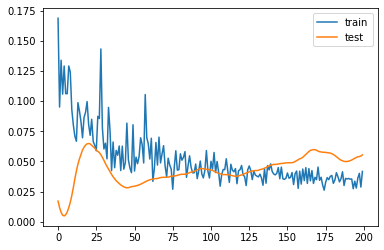

6.722450792789459
ArthurMasuaku
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 107 samples, validate on 27 samples
Epoch 1/200
107/107 [==============================] - 0s 4ms/step - loss: 0.2694 - mse: 0.2694 - val_loss: 0.1756 - val_mse: 0.1756
Epoch 2/200
107/107 [==============================] - 0s 112us/step - loss: 0.1915 - mse: 0.1915 - val_loss: 0.1422 - val_mse: 0.1422
Epoch 3/200
107/107 [==============================] - 0s 112us/step - loss: 0.2139 - mse: 0.2139 - val_loss: 0.1132 - val_mse: 0.1132
Epoch 4/200
107/107 [==============================] - 0s 121us/step - loss: 0.1663 - mse: 0.1663 - val_loss: 0.0890 - val_mse: 0.0890
Epoch 5/200
107/107 [==============================] - 0s 112us/step - loss: 0.1520 - mse: 0.1520 - val_loss: 0.0692 - val_mse: 0.0692
Epoch 6/200
107/107 [==============================] - 0s 112us/step - loss: 0.1285 - mse: 0.1285 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 7/200
107/107 [==============================] - 0s 103us/step - loss: 0.1318 - mse: 0.1318 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 8/200


Epoch 61/200
107/107 [==============================] - 0s 112us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0312 - val_mse: 0.0312
Epoch 62/200
107/107 [==============================] - 0s 121us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 63/200
107/107 [==============================] - 0s 112us/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 64/200
107/107 [==============================] - 0s 103us/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 65/200
107/107 [==============================] - 0s 103us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 66/200
107/107 [==============================] - 0s 112us/step - loss: 0.0301 - mse: 0.0301 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 67/200
107/107 [==============================] - 0s 112us/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 68/200
107/107 [==========================

107/107 [==============================] - 0s 103us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 122/200
107/107 [==============================] - 0s 112us/step - loss: 0.0277 - mse: 0.0277 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 123/200
107/107 [==============================] - 0s 112us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 124/200
107/107 [==============================] - 0s 121us/step - loss: 0.0194 - mse: 0.0194 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 125/200
107/107 [==============================] - 0s 121us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 126/200
107/107 [==============================] - 0s 112us/step - loss: 0.0220 - mse: 0.0220 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 127/200
107/107 [==============================] - 0s 112us/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0311 - val_mse: 0.0311
Epoch 128/200
107/107 [==============================] 

Epoch 181/200
107/107 [==============================] - 0s 112us/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 182/200
107/107 [==============================] - 0s 103us/step - loss: 0.0230 - mse: 0.0230 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 183/200
107/107 [==============================] - 0s 112us/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0313 - val_mse: 0.0313
Epoch 184/200
107/107 [==============================] - 0s 112us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 185/200
107/107 [==============================] - 0s 103us/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 186/200
107/107 [==============================] - 0s 121us/step - loss: 0.0219 - mse: 0.0219 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 187/200
107/107 [==============================] - 0s 121us/step - loss: 0.0214 - mse: 0.0214 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 188/200
107/107 [==================

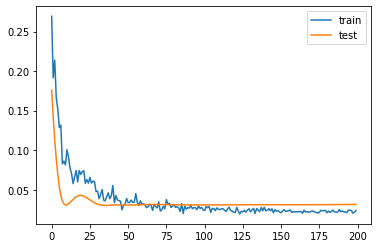

1.4153676629066465
FabiánBalbuena
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 10ms/step - loss: 0.1580 - mse: 0.1580 - val_loss: 0.0844 - val_mse: 0.0844
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.1885 - mse: 0.1885 - val_loss: 0.0742 - val_mse: 0.0742
Epoch 3/200
50/50 [==============================] - 0s 180us/step - loss: 0.1844 - mse: 0.1844 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 4/200
50/50 [==============================] - 0s 220us/step - loss: 0.0923 - mse: 0.0923 - val_loss: 0.0589 - val_mse: 0.0589
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.1454 - mse: 0.1454 - val_loss: 0.0536 - val_mse: 0.0536
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.0975 - mse: 0.0975 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 7/200
50/50 [==============================] - 0s 200us/step - loss: 0.1580 - mse: 0.1580 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 200us/step - loss: 0.0813 - mse: 0.0813 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 63/200
50/50 [==============================] - 0s 200us/step - loss: 0.0758 - mse: 0.0758 - val_loss: 0.0476 - val_mse: 0.0476
Epoch 64/200
50/50 [==============================] - 0s 180us/step - loss: 0.0721 - mse: 0.0721 - val_loss: 0.0474 - val_mse: 0.0474
Epoch 65/200
50/50 [==============================] - 0s 180us/step - loss: 0.0766 - mse: 0.0766 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 66/200
50/50 [==============================] - 0s 180us/step - loss: 0.0799 - mse: 0.0799 - val_loss: 0.0471 - val_mse: 0.0471
Epoch 67/200
50/50 [==============================] - 0s 180us/step - loss: 0.0680 - mse: 0.0680 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 68/200
50/50 [==============================] - 0s 160us/step - loss: 0.0746 - mse: 0.0746 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 69/200
50/50 [==============================] - 0s 180us

Epoch 123/200
50/50 [==============================] - 0s 200us/step - loss: 0.0633 - mse: 0.0633 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0593 - mse: 0.0593 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 125/200
50/50 [==============================] - 0s 160us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 126/200
50/50 [==============================] - 0s 180us/step - loss: 0.0648 - mse: 0.0648 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 128/200
50/50 [==============================] - 0s 220us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 129/200
50/50 [==============================] - 0s 280us/step - loss: 0.0694 - mse: 0.0694 - val_loss: 0.0455 - val_mse: 0.0455
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 180us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 185/200
50/50 [==============================] - 0s 200us/step - loss: 0.0670 - mse: 0.0670 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 186/200
50/50 [==============================] - 0s 180us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 187/200
50/50 [==============================] - 0s 200us/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 188/200
50/50 [==============================] - 0s 180us/step - loss: 0.0746 - mse: 0.0746 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 189/200
50/50 [==============================] - 0s 180us/step - loss: 0.0623 - mse: 0.0623 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 190/200
50/50 [==============================] - 0s 180us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 191/200
50/50 [==============================] - 

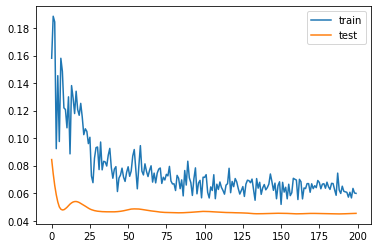

2.1861019134521484
JarrodBowen
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



DeclanRice
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 98 samples, validate on 25 samples
Epoch 1/200
98/98 [==============================] - 1s 5ms/step - loss: 0.1036 - mse: 0.1036 - val_loss: 0.0979 - val_mse: 0.0979
Epoch 2/200
98/98 [==============================] - 0s 143us/step - loss: 0.1037 - mse: 0.1037 - val_loss: 0.0860 - val_mse: 0.0860
Epoch 3/200
98/98 [==============================] - 0s 122us/step - loss: 0.0972 - mse: 0.0972 - val_loss: 0.0734 - val_mse: 0.0734
Epoch 4/200
98/98 [==============================] - 0s 122us/step - loss: 0.0946 - mse: 0.0946 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 5/200
98/98 [==============================] - 0s 133us/step - loss: 0.1027 - mse: 0.1027 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 6/200
98/98 [==============================] - 0s 122us/step - loss: 0.0860 - mse: 0.0860 - val_loss: 0.0460 - val_mse: 0.0460
Epoch 7/200
98/98 [==============================] - 0s 112us/step - loss: 0.0831 - mse: 0.0831 - val_loss: 0.0398 - val_mse: 0.0398
Epoch 8/200
98/98 [========

Epoch 62/200
98/98 [==============================] - 0s 133us/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 63/200
98/98 [==============================] - 0s 122us/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0192 - val_mse: 0.0192
Epoch 64/200
98/98 [==============================] - 0s 133us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 65/200
98/98 [==============================] - 0s 112us/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 66/200
98/98 [==============================] - 0s 112us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0188 - val_mse: 0.0188
Epoch 67/200
98/98 [==============================] - 0s 122us/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 68/200
98/98 [==============================] - 0s 122us/step - loss: 0.0417 - mse: 0.0417 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 69/200
98/98 [==============================] - 0s 122us

Epoch 123/200
98/98 [==============================] - 0s 112us/step - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 124/200
98/98 [==============================] - 0s 133us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 125/200
98/98 [==============================] - 0s 112us/step - loss: 0.0371 - mse: 0.0371 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 126/200
98/98 [==============================] - 0s 112us/step - loss: 0.0358 - mse: 0.0358 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 127/200
98/98 [==============================] - 0s 112us/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 128/200
98/98 [==============================] - 0s 112us/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 129/200
98/98 [==============================] - 0s 122us/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 130/200
98/98 [==============================] - 

Epoch 184/200
98/98 [==============================] - 0s 133us/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 185/200
98/98 [==============================] - 0s 122us/step - loss: 0.0336 - mse: 0.0336 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 186/200
98/98 [==============================] - 0s 122us/step - loss: 0.0310 - mse: 0.0310 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 187/200
98/98 [==============================] - 0s 133us/step - loss: 0.0325 - mse: 0.0325 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 188/200
98/98 [==============================] - 0s 122us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 189/200
98/98 [==============================] - 0s 133us/step - loss: 0.0338 - mse: 0.0338 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 190/200
98/98 [==============================] - 0s 143us/step - loss: 0.0321 - mse: 0.0321 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 191/200
98/98 [==============================] - 

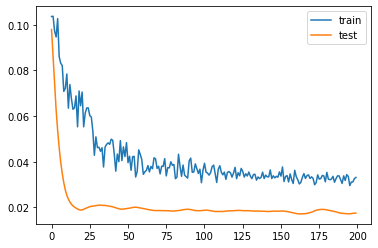

1.6859214752912521
TomasSoucek
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



PabloFornals
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 0s 23ms/step - loss: 0.1577 - mse: 0.1577 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1934 - mse: 0.1934 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 3/200
21/21 [==============================] - 0s 428us/step - loss: 0.1856 - mse: 0.1856 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1432 - mse: 0.1432 - val_loss: 0.0165 - val_mse: 0.0165
Epoch 5/200
21/21 [==============================] - 0s 476us/step - loss: 0.1736 - mse: 0.1736 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 6/200
21/21 [==============================] - 0s 428us/step - loss: 0.2376 - mse: 0.2376 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 7/200
21/21 [==============================] - 0s 381us/step - loss: 0.1759 - mse: 0.1759 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 428us/step - loss: 0.1146 - mse: 0.1146 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 63/200
21/21 [==============================] - 0s 429us/step - loss: 0.0989 - mse: 0.0989 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 64/200
21/21 [==============================] - 0s 428us/step - loss: 0.0665 - mse: 0.0665 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 65/200
21/21 [==============================] - 0s 476us/step - loss: 0.1190 - mse: 0.1190 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 66/200
21/21 [==============================] - 0s 381us/step - loss: 0.1072 - mse: 0.1072 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 67/200
21/21 [==============================] - 0s 381us/step - loss: 0.0911 - mse: 0.0911 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 68/200
21/21 [==============================] - 0s 428us/step - loss: 0.1374 - mse: 0.1374 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 69/200
21/21 [==============================] - 0s 333us

Epoch 123/200
21/21 [==============================] - 0s 333us/step - loss: 0.0807 - mse: 0.0807 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0690 - mse: 0.0690 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0985 - mse: 0.0985 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 126/200
21/21 [==============================] - 0s 381us/step - loss: 0.1044 - mse: 0.1044 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0823 - mse: 0.0823 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 128/200
21/21 [==============================] - 0s 381us/step - loss: 0.0838 - mse: 0.0838 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 129/200
21/21 [==============================] - 0s 381us/step - loss: 0.0947 - mse: 0.0947 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 333us/step - loss: 0.0746 - mse: 0.0746 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 185/200
21/21 [==============================] - 0s 381us/step - loss: 0.0814 - mse: 0.0814 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 186/200
21/21 [==============================] - 0s 428us/step - loss: 0.0779 - mse: 0.0779 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0666 - mse: 0.0666 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 188/200
21/21 [==============================] - 0s 333us/step - loss: 0.0851 - mse: 0.0851 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 190/200
21/21 [==============================] - 0s 333us/step - loss: 0.1001 - mse: 0.1001 - val_loss: 0.0129 - val_mse: 0.0129
Epoch 191/200
21/21 [==============================] - 

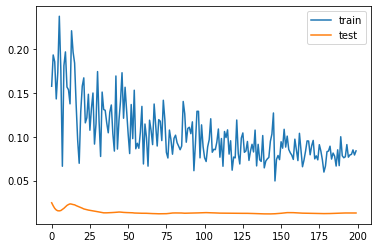

3.5298559069633484
IssaDiop
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 0s 9ms/step - loss: 0.1606 - mse: 0.1606 - val_loss: 0.0998 - val_mse: 0.0998
Epoch 2/200
51/51 [==============================] - 0s 196us/step - loss: 0.0996 - mse: 0.0996 - val_loss: 0.0926 - val_mse: 0.0926
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.0860 - val_mse: 0.0860
Epoch 4/200
51/51 [==============================] - 0s 196us/step - loss: 0.1282 - mse: 0.1282 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 5/200
51/51 [==============================] - 0s 176us/step - loss: 0.0925 - mse: 0.0925 - val_loss: 0.0772 - val_mse: 0.0772
Epoch 6/200
51/51 [==============================] - 0s 235us/step - loss: 0.1478 - mse: 0.1478 - val_loss: 0.0743 - val_mse: 0.0743
Epoch 7/200
51/51 [==============================] - 0s 196us/step - loss: 0.1267 - mse: 0.1267 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 8/200
51/51 [========

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0728 - val_mse: 0.0728
Epoch 63/200
51/51 [==============================] - 0s 196us/step - loss: 0.0467 - mse: 0.0467 - val_loss: 0.0729 - val_mse: 0.0729
Epoch 64/200
51/51 [==============================] - 0s 157us/step - loss: 0.0639 - mse: 0.0639 - val_loss: 0.0730 - val_mse: 0.0730
Epoch 65/200
51/51 [==============================] - 0s 176us/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0731 - val_mse: 0.0731
Epoch 66/200
51/51 [==============================] - 0s 176us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0732 - val_mse: 0.0732
Epoch 67/200
51/51 [==============================] - 0s 196us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0733 - val_mse: 0.0733
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0607 - mse: 0.0607 - val_loss: 0.0732 - val_mse: 0.0732
Epoch 69/200
51/51 [==============================] - 0s 171us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0741 - val_mse: 0.0741
Epoch 124/200
51/51 [==============================] - 0s 176us/step - loss: 0.0540 - mse: 0.0540 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 127/200
51/51 [==============================] - 0s 196us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0740 - val_mse: 0.0740
Epoch 128/200
51/51 [==============================] - 0s 157us/step - loss: 0.0399 - mse: 0.0399 - val_loss: 0.0739 - val_mse: 0.0739
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0737 - val_mse: 0.0737
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0466 - mse: 0.0466 - val_loss: 0.0725 - val_mse: 0.0725
Epoch 185/200
51/51 [==============================] - 0s 176us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0723 - val_mse: 0.0723
Epoch 186/200
51/51 [==============================] - 0s 157us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0722 - val_mse: 0.0722
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0721 - val_mse: 0.0721
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0364 - mse: 0.0364 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 189/200
51/51 [==============================] - 0s 176us/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.0719 - val_mse: 0.0719
Epoch 190/200
51/51 [==============================] - 0s 196us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 191/200
51/51 [==============================] - 

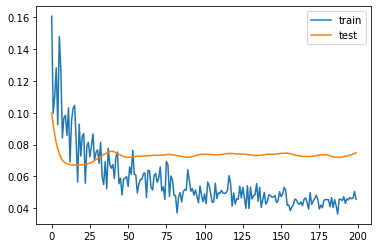

3.1714928150177006
João Filipe IriaSantos Moutinho
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 1s 10ms/step - loss: 0.1566 - mse: 0.1566 - val_loss: 0.0777 - val_mse: 0.0777
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.1634 - mse: 0.1634 - val_loss: 0.0726 - val_mse: 0.0726
Epoch 3/200
50/50 [==============================] - 0s 180us/step - loss: 0.1514 - mse: 0.1514 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 4/200
50/50 [==============================] - 0s 220us/step - loss: 0.1645 - mse: 0.1645 - val_loss: 0.0713 - val_mse: 0.0713
Epoch 5/200
50/50 [==============================] - 0s 180us/step - loss: 0.1788 - mse: 0.1788 - val_loss: 0.0719 - val_mse: 0.0719
Epoch 6/200
50/50 [==============================] - 0s 180us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.0722 - val_mse: 0.0722
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1861 - mse: 0.1861 - val_loss: 0.0723 - val_mse: 0.0723
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 180us/step - loss: 0.0677 - mse: 0.0677 - val_loss: 0.0645 - val_mse: 0.0645
Epoch 63/200
50/50 [==============================] - 0s 180us/step - loss: 0.0639 - mse: 0.0639 - val_loss: 0.0645 - val_mse: 0.0645
Epoch 64/200
50/50 [==============================] - 0s 160us/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0645 - val_mse: 0.0645
Epoch 65/200
50/50 [==============================] - 0s 180us/step - loss: 0.0560 - mse: 0.0560 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0594 - mse: 0.0594 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 67/200
50/50 [==============================] - 0s 160us/step - loss: 0.0678 - mse: 0.0678 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 68/200
50/50 [==============================] - 0s 180us/step - loss: 0.0502 - mse: 0.0502 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 69/200
50/50 [==============================] - 0s 200us

Epoch 123/200
50/50 [==============================] - 0s 220us/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 124/200
50/50 [==============================] - 0s 200us/step - loss: 0.0590 - mse: 0.0590 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 125/200
50/50 [==============================] - 0s 200us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0592 - mse: 0.0592 - val_loss: 0.0638 - val_mse: 0.0638
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0588 - mse: 0.0588 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 128/200
50/50 [==============================] - 0s 220us/step - loss: 0.0524 - mse: 0.0524 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0695 - mse: 0.0695 - val_loss: 0.0637 - val_mse: 0.0637
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 200us/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 185/200
50/50 [==============================] - 0s 220us/step - loss: 0.0546 - mse: 0.0546 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 186/200
50/50 [==============================] - 0s 200us/step - loss: 0.0501 - mse: 0.0501 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 187/200
50/50 [==============================] - 0s 191us/step - loss: 0.0553 - mse: 0.0553 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 188/200
50/50 [==============================] - 0s 240us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0542 - mse: 0.0542 - val_loss: 0.0621 - val_mse: 0.0621
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0564 - mse: 0.0564 - val_loss: 0.0620 - val_mse: 0.0620
Epoch 191/200
50/50 [==============================] - 

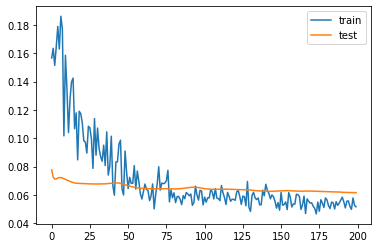

3.465092837810516
Rui Pedrodos Santos Patrício
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 0s 10ms/step - loss: 0.1962 - mse: 0.1962 - val_loss: 0.0614 - val_mse: 0.0614
Epoch 2/200
52/52 [==============================] - 0s 211us/step - loss: 0.2047 - mse: 0.2047 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 3/200
52/52 [==============================] - 0s 192us/step - loss: 0.2071 - mse: 0.2071 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 4/200
52/52 [==============================] - 0s 211us/step - loss: 0.1647 - mse: 0.1647 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 5/200
52/52 [==============================] - 0s 192us/step - loss: 0.1486 - mse: 0.1486 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 6/200
52/52 [==============================] - 0s 192us/step - loss: 0.1565 - mse: 0.1565 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 7/200
52/52 [==============================] - 0s 173us/step - loss: 0.1334 - mse: 0.1334 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 8/200
52/52 [=======

Epoch 62/200
52/52 [==============================] - 0s 173us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 63/200
52/52 [==============================] - 0s 192us/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0437 - val_mse: 0.0437
Epoch 64/200
52/52 [==============================] - 0s 173us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 65/200
52/52 [==============================] - 0s 192us/step - loss: 0.0785 - mse: 0.0785 - val_loss: 0.0435 - val_mse: 0.0435
Epoch 66/200
52/52 [==============================] - 0s 173us/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0436 - val_mse: 0.0436
Epoch 67/200
52/52 [==============================] - 0s 154us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 68/200
52/52 [==============================] - 0s 192us/step - loss: 0.0872 - mse: 0.0872 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 69/200
52/52 [==============================] - 0s 192us

Epoch 123/200
52/52 [==============================] - 0s 192us/step - loss: 0.0556 - mse: 0.0556 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 124/200
52/52 [==============================] - 0s 192us/step - loss: 0.0677 - mse: 0.0677 - val_loss: 0.0479 - val_mse: 0.0479
Epoch 125/200
52/52 [==============================] - 0s 173us/step - loss: 0.0706 - mse: 0.0706 - val_loss: 0.0480 - val_mse: 0.0480
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0615 - mse: 0.0615 - val_loss: 0.0482 - val_mse: 0.0482
Epoch 127/200
52/52 [==============================] - 0s 192us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0482 - val_mse: 0.0482
Epoch 128/200
52/52 [==============================] - 0s 192us/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0485 - val_mse: 0.0485
Epoch 129/200
52/52 [==============================] - 0s 192us/step - loss: 0.0723 - mse: 0.0723 - val_loss: 0.0484 - val_mse: 0.0484
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 192us/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0480 - val_mse: 0.0480
Epoch 185/200
52/52 [==============================] - 0s 192us/step - loss: 0.0562 - mse: 0.0562 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 186/200
52/52 [==============================] - 0s 192us/step - loss: 0.0691 - mse: 0.0691 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 187/200
52/52 [==============================] - 0s 173us/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0478 - val_mse: 0.0478
Epoch 188/200
52/52 [==============================] - 0s 192us/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0479 - val_mse: 0.0479
Epoch 189/200
52/52 [==============================] - 0s 192us/step - loss: 0.0572 - mse: 0.0572 - val_loss: 0.0481 - val_mse: 0.0481
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0648 - mse: 0.0648 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 191/200
52/52 [==============================] - 

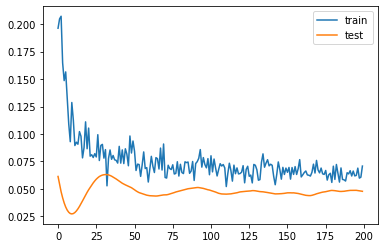

4.770220518112183
RyanBennett
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WillyBoly
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 9ms/step - loss: 0.1965 - mse: 0.1965 - val_loss: 0.1729 - val_mse: 0.1729
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.2172 - mse: 0.2172 - val_loss: 0.1451 - val_mse: 0.1451
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.2473 - mse: 0.2473 - val_loss: 0.1212 - val_mse: 0.1212
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.1594 - mse: 0.1594 - val_loss: 0.1015 - val_mse: 0.1015
Epoch 5/200
50/50 [==============================] - 0s 240us/step - loss: 0.1234 - mse: 0.1234 - val_loss: 0.0858 - val_mse: 0.0858
Epoch 6/200
50/50 [==============================] - 0s 220us/step - loss: 0.1391 - mse: 0.1391 - val_loss: 0.0735 - val_mse: 0.0735
Epoch 7/200
50/50 [==============================] - 0s 200us/step - loss: 0.0984 - mse: 0.0984 - val_loss: 0.0645 - val_mse: 0.0645
Epoch 8/200
50/50 [========

Epoch 62/200
50/50 [==============================] - 0s 220us/step - loss: 0.0547 - mse: 0.0547 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 63/200
50/50 [==============================] - 0s 200us/step - loss: 0.0684 - mse: 0.0684 - val_loss: 0.0521 - val_mse: 0.0521
Epoch 64/200
50/50 [==============================] - 0s 180us/step - loss: 0.0620 - mse: 0.0620 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 65/200
50/50 [==============================] - 0s 220us/step - loss: 0.0682 - mse: 0.0682 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 67/200
50/50 [==============================] - 0s 200us/step - loss: 0.0727 - mse: 0.0727 - val_loss: 0.0522 - val_mse: 0.0522
Epoch 68/200
50/50 [==============================] - 0s 200us/step - loss: 0.0625 - mse: 0.0625 - val_loss: 0.0523 - val_mse: 0.0523
Epoch 69/200
50/50 [==============================] - 0s 200us

Epoch 123/200
50/50 [==============================] - 0s 200us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0506 - mse: 0.0506 - val_loss: 0.0543 - val_mse: 0.0543
Epoch 125/200
50/50 [==============================] - 0s 180us/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0437 - mse: 0.0437 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 127/200
50/50 [==============================] - 0s 220us/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0545 - val_mse: 0.0545
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.0545 - val_mse: 0.0545
Epoch 129/200
50/50 [==============================] - 0s 180us/step - loss: 0.0521 - mse: 0.0521 - val_loss: 0.0546 - val_mse: 0.0546
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 200us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0554 - val_mse: 0.0554
Epoch 185/200
50/50 [==============================] - 0s 180us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 186/200
50/50 [==============================] - 0s 180us/step - loss: 0.0526 - mse: 0.0526 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 188/200
50/50 [==============================] - 0s 200us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 189/200
50/50 [==============================] - 0s 180us/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 191/200
50/50 [==============================] - 

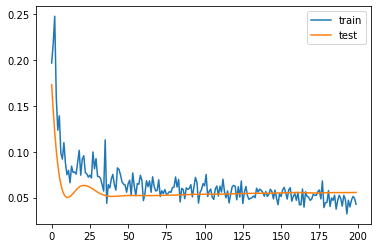

3.4657709002494816
ConorCoady
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 1s 11ms/step - loss: 0.3266 - mse: 0.3266 - val_loss: 0.0608 - val_mse: 0.0608
Epoch 2/200
50/50 [==============================] - 0s 220us/step - loss: 0.2657 - mse: 0.2657 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 3/200
50/50 [==============================] - 0s 220us/step - loss: 0.2551 - mse: 0.2551 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.2302 - mse: 0.2302 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.2208 - mse: 0.2208 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 6/200
50/50 [==============================] - 0s 220us/step - loss: 0.1629 - mse: 0.1629 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 7/200
50/50 [==============================] - 0s 220us/step - loss: 0.1783 - mse: 0.1783 - val_loss: 0.0381 - val_mse: 0.0381
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 200us/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0422 - val_mse: 0.0422
Epoch 63/200
50/50 [==============================] - 0s 160us/step - loss: 0.1059 - mse: 0.1059 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 64/200
50/50 [==============================] - 0s 240us/step - loss: 0.0697 - mse: 0.0697 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 65/200
50/50 [==============================] - 0s 200us/step - loss: 0.0800 - mse: 0.0800 - val_loss: 0.0415 - val_mse: 0.0415
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0756 - mse: 0.0756 - val_loss: 0.0410 - val_mse: 0.0410
Epoch 67/200
50/50 [==============================] - 0s 180us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0406 - val_mse: 0.0406
Epoch 68/200
50/50 [==============================] - 0s 200us/step - loss: 0.0825 - mse: 0.0825 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 69/200
50/50 [==============================] - 0s 180us

Epoch 123/200
50/50 [==============================] - 0s 220us/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0551 - mse: 0.0551 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 125/200
50/50 [==============================] - 0s 180us/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0866 - mse: 0.0866 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0530 - mse: 0.0530 - val_loss: 0.0428 - val_mse: 0.0428
Epoch 129/200
50/50 [==============================] - 0s 213us/step - loss: 0.0598 - mse: 0.0598 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 180us/step - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 185/200
50/50 [==============================] - 0s 200us/step - loss: 0.0664 - mse: 0.0664 - val_loss: 0.0449 - val_mse: 0.0449
Epoch 186/200
50/50 [==============================] - 0s 180us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0447 - val_mse: 0.0447
Epoch 187/200
50/50 [==============================] - 0s 200us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 188/200
50/50 [==============================] - 0s 180us/step - loss: 0.0614 - mse: 0.0614 - val_loss: 0.0444 - val_mse: 0.0444
Epoch 189/200
50/50 [==============================] - 0s 180us/step - loss: 0.0694 - mse: 0.0694 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0445 - val_mse: 0.0445
Epoch 191/200
50/50 [==============================] - 

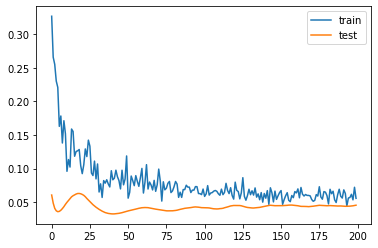

4.780469179153442
RaúlJiménez
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 10ms/step - loss: 0.2440 - mse: 0.2440 - val_loss: 0.1628 - val_mse: 0.1628
Epoch 2/200
51/51 [==============================] - 0s 196us/step - loss: 0.2636 - mse: 0.2636 - val_loss: 0.1582 - val_mse: 0.1582
Epoch 3/200
51/51 [==============================] - 0s 196us/step - loss: 0.2110 - mse: 0.2110 - val_loss: 0.1550 - val_mse: 0.1550
Epoch 4/200
51/51 [==============================] - 0s 216us/step - loss: 0.2295 - mse: 0.2295 - val_loss: 0.1528 - val_mse: 0.1528
Epoch 5/200
51/51 [==============================] - 0s 196us/step - loss: 0.3424 - mse: 0.3424 - val_loss: 0.1516 - val_mse: 0.1516
Epoch 6/200
51/51 [==============================] - 0s 196us/step - loss: 0.3008 - mse: 0.3008 - val_loss: 0.1515 - val_mse: 0.1515
Epoch 7/200
51/51 [==============================] - 0s 196us/step - loss: 0.2292 - mse: 0.2292 - val_loss: 0.1523 - val_mse: 0.1523
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 216us/step - loss: 0.0815 - mse: 0.0815 - val_loss: 0.1190 - val_mse: 0.1190
Epoch 63/200
51/51 [==============================] - 0s 216us/step - loss: 0.0890 - mse: 0.0890 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 64/200
51/51 [==============================] - 0s 216us/step - loss: 0.1249 - mse: 0.1249 - val_loss: 0.1194 - val_mse: 0.1194
Epoch 65/200
51/51 [==============================] - 0s 216us/step - loss: 0.0810 - mse: 0.0810 - val_loss: 0.1197 - val_mse: 0.1197
Epoch 66/200
51/51 [==============================] - 0s 235us/step - loss: 0.0887 - mse: 0.0887 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 67/200
51/51 [==============================] - 0s 196us/step - loss: 0.0586 - mse: 0.0586 - val_loss: 0.1201 - val_mse: 0.1201
Epoch 68/200
51/51 [==============================] - 0s 235us/step - loss: 0.0923 - mse: 0.0923 - val_loss: 0.1204 - val_mse: 0.1204
Epoch 69/200
51/51 [==============================] - 0s 216us

Epoch 123/200
51/51 [==============================] - 0s 235us/step - loss: 0.0765 - mse: 0.0765 - val_loss: 0.1202 - val_mse: 0.1202
Epoch 124/200
51/51 [==============================] - 0s 235us/step - loss: 0.0802 - mse: 0.0802 - val_loss: 0.1198 - val_mse: 0.1198
Epoch 125/200
51/51 [==============================] - 0s 235us/step - loss: 0.0796 - mse: 0.0796 - val_loss: 0.1196 - val_mse: 0.1196
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0784 - mse: 0.0784 - val_loss: 0.1194 - val_mse: 0.1194
Epoch 127/200
51/51 [==============================] - 0s 176us/step - loss: 0.0783 - mse: 0.0783 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0658 - mse: 0.0658 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 129/200
51/51 [==============================] - 0s 196us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.1189 - val_mse: 0.1189
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0733 - mse: 0.0733 - val_loss: 0.1182 - val_mse: 0.1182
Epoch 185/200
51/51 [==============================] - 0s 181us/step - loss: 0.0752 - mse: 0.0752 - val_loss: 0.1180 - val_mse: 0.1180
Epoch 186/200
51/51 [==============================] - 0s 196us/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.1179 - val_mse: 0.1179
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0715 - mse: 0.0715 - val_loss: 0.1178 - val_mse: 0.1178
Epoch 188/200
51/51 [==============================] - 0s 176us/step - loss: 0.0741 - mse: 0.0741 - val_loss: 0.1178 - val_mse: 0.1178
Epoch 189/200
51/51 [==============================] - 0s 196us/step - loss: 0.0660 - mse: 0.0660 - val_loss: 0.1179 - val_mse: 0.1179
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0663 - mse: 0.0663 - val_loss: 0.1179 - val_mse: 0.1179
Epoch 191/200
51/51 [==============================] - 

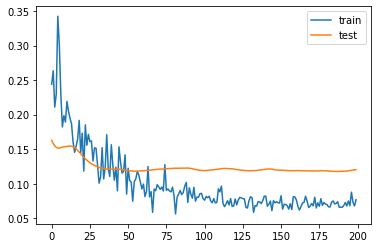

4.96133553981781
RomainSaïss
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 11ms/step - loss: 0.1286 - mse: 0.1286 - val_loss: 0.0864 - val_mse: 0.0864
Epoch 2/200
51/51 [==============================] - 0s 215us/step - loss: 0.0628 - mse: 0.0628 - val_loss: 0.0840 - val_mse: 0.0840
Epoch 3/200
51/51 [==============================] - 0s 216us/step - loss: 0.0924 - mse: 0.0924 - val_loss: 0.0819 - val_mse: 0.0819
Epoch 4/200
51/51 [==============================] - 0s 196us/step - loss: 0.1066 - mse: 0.1066 - val_loss: 0.0802 - val_mse: 0.0802
Epoch 5/200
51/51 [==============================] - 0s 216us/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0789 - val_mse: 0.0789
Epoch 6/200
51/51 [==============================] - 0s 196us/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.0778 - val_mse: 0.0778
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.0883 - mse: 0.0883 - val_loss: 0.0771 - val_mse: 0.0771
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 176us/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 63/200
51/51 [==============================] - 0s 176us/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 65/200
51/51 [==============================] - 0s 176us/step - loss: 0.0496 - mse: 0.0496 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 66/200
51/51 [==============================] - 0s 176us/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 67/200
51/51 [==============================] - 0s 196us/step - loss: 0.0456 - mse: 0.0456 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.0658 - val_mse: 0.0658
Epoch 69/200
51/51 [==============================] - 0s 176us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0655 - val_mse: 0.0655
Epoch 124/200
51/51 [==============================] - 0s 189us/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.0655 - val_mse: 0.0655
Epoch 125/200
51/51 [==============================] - 0s 176us/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 127/200
51/51 [==============================] - 0s 176us/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 128/200
51/51 [==============================] - 0s 176us/step - loss: 0.0443 - mse: 0.0443 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 129/200
51/51 [==============================] - 0s 176us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 176us/step - loss: 0.0495 - mse: 0.0495 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 185/200
51/51 [==============================] - 0s 196us/step - loss: 0.0435 - mse: 0.0435 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 186/200
51/51 [==============================] - 0s 176us/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0447 - mse: 0.0447 - val_loss: 0.0648 - val_mse: 0.0648
Epoch 188/200
51/51 [==============================] - 0s 196us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 189/200
51/51 [==============================] - 0s 196us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 190/200
51/51 [==============================] - 0s 196us/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0647 - val_mse: 0.0647
Epoch 191/200
51/51 [==============================] - 

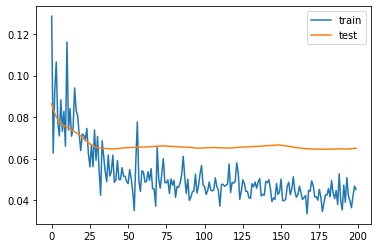

3.305863499641418
JonathanCastro Otto
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 10ms/step - loss: 0.2029 - mse: 0.2029 - val_loss: 0.0906 - val_mse: 0.0906
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.2177 - mse: 0.2177 - val_loss: 0.0785 - val_mse: 0.0785
Epoch 3/200
50/50 [==============================] - 0s 220us/step - loss: 0.1688 - mse: 0.1688 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.1764 - mse: 0.1764 - val_loss: 0.0626 - val_mse: 0.0626
Epoch 5/200
50/50 [==============================] - 0s 200us/step - loss: 0.1424 - mse: 0.1424 - val_loss: 0.0575 - val_mse: 0.0575
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.1519 - mse: 0.1519 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.2179 - mse: 0.2179 - val_loss: 0.0531 - val_mse: 0.0531
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 220us/step - loss: 0.0701 - mse: 0.0701 - val_loss: 0.0568 - val_mse: 0.0568
Epoch 63/200
50/50 [==============================] - 0s 220us/step - loss: 0.0825 - mse: 0.0825 - val_loss: 0.0569 - val_mse: 0.0569
Epoch 64/200
50/50 [==============================] - 0s 200us/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0570 - val_mse: 0.0570
Epoch 65/200
50/50 [==============================] - 0s 220us/step - loss: 0.0770 - mse: 0.0770 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 66/200
50/50 [==============================] - 0s 220us/step - loss: 0.0817 - mse: 0.0817 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 67/200
50/50 [==============================] - 0s 200us/step - loss: 0.0753 - mse: 0.0753 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 68/200
50/50 [==============================] - 0s 180us/step - loss: 0.0799 - mse: 0.0799 - val_loss: 0.0572 - val_mse: 0.0572
Epoch 69/200
50/50 [==============================] - 0s 220us

Epoch 123/200
50/50 [==============================] - 0s 220us/step - loss: 0.0767 - mse: 0.0767 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 124/200
50/50 [==============================] - 0s 220us/step - loss: 0.0619 - mse: 0.0619 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 125/200
50/50 [==============================] - 0s 220us/step - loss: 0.0811 - mse: 0.0811 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 126/200
50/50 [==============================] - 0s 240us/step - loss: 0.0642 - mse: 0.0642 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 127/200
50/50 [==============================] - 0s 240us/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 128/200
50/50 [==============================] - 0s 240us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 200us/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 185/200
50/50 [==============================] - 0s 200us/step - loss: 0.0656 - mse: 0.0656 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 186/200
50/50 [==============================] - 0s 200us/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 187/200
50/50 [==============================] - 0s 160us/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 188/200
50/50 [==============================] - 0s 200us/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0556 - val_mse: 0.0556
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 190/200
50/50 [==============================] - 0s 180us/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.0555 - val_mse: 0.0555
Epoch 191/200
50/50 [==============================] - 

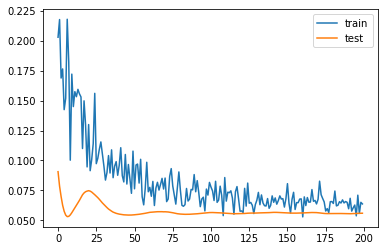

4.6151377856731415
LeanderDendoncker
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 1s 10ms/step - loss: 0.2206 - mse: 0.2206 - val_loss: 0.2783 - val_mse: 0.2783
Epoch 2/200
52/52 [==============================] - 0s 211us/step - loss: 0.2879 - mse: 0.2879 - val_loss: 0.2493 - val_mse: 0.2493
Epoch 3/200
52/52 [==============================] - 0s 211us/step - loss: 0.2306 - mse: 0.2306 - val_loss: 0.2216 - val_mse: 0.2216
Epoch 4/200
52/52 [==============================] - 0s 211us/step - loss: 0.2438 - mse: 0.2438 - val_loss: 0.1950 - val_mse: 0.1950
Epoch 5/200
52/52 [==============================] - 0s 192us/step - loss: 0.1866 - mse: 0.1866 - val_loss: 0.1704 - val_mse: 0.1704
Epoch 6/200
52/52 [==============================] - 0s 192us/step - loss: 0.2386 - mse: 0.2386 - val_loss: 0.1482 - val_mse: 0.1482
Epoch 7/200
52/52 [==============================] - 0s 211us/step - loss: 0.2400 - mse: 0.2400 - val_loss: 0.1283 - val_mse: 0.1283
Epoch 8/200
52/52 [=======

Epoch 62/200
52/52 [==============================] - 0s 173us/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 63/200
52/52 [==============================] - 0s 192us/step - loss: 0.0535 - mse: 0.0535 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 64/200
52/52 [==============================] - 0s 173us/step - loss: 0.0569 - mse: 0.0569 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 65/200
52/52 [==============================] - 0s 173us/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 66/200
52/52 [==============================] - 0s 192us/step - loss: 0.0654 - mse: 0.0654 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 67/200
52/52 [==============================] - 0s 173us/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 68/200
52/52 [==============================] - 0s 192us/step - loss: 0.0722 - mse: 0.0722 - val_loss: 0.0450 - val_mse: 0.0450
Epoch 69/200
52/52 [==============================] - 0s 192us

Epoch 123/200
52/52 [==============================] - 0s 192us/step - loss: 0.0519 - mse: 0.0519 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 124/200
52/52 [==============================] - 0s 211us/step - loss: 0.0633 - mse: 0.0633 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 125/200
52/52 [==============================] - 0s 192us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 126/200
52/52 [==============================] - 0s 177us/step - loss: 0.0574 - mse: 0.0574 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 127/200
52/52 [==============================] - 0s 192us/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 128/200
52/52 [==============================] - 0s 192us/step - loss: 0.0533 - mse: 0.0533 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 129/200
52/52 [==============================] - 0s 173us/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 211us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 185/200
52/52 [==============================] - 0s 192us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0451 - val_mse: 0.0451
Epoch 186/200
52/52 [==============================] - 0s 192us/step - loss: 0.0527 - mse: 0.0527 - val_loss: 0.0452 - val_mse: 0.0452
Epoch 187/200
52/52 [==============================] - 0s 192us/step - loss: 0.0538 - mse: 0.0538 - val_loss: 0.0453 - val_mse: 0.0453
Epoch 188/200
52/52 [==============================] - 0s 173us/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0454 - val_mse: 0.0454
Epoch 189/200
52/52 [==============================] - 0s 173us/step - loss: 0.0481 - mse: 0.0481 - val_loss: 0.0455 - val_mse: 0.0455
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0456 - val_mse: 0.0456
Epoch 191/200
52/52 [==============================] - 

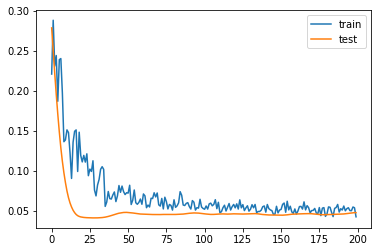

3.104333847761154
AdamaTraoré
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 51 samples, validate on 13 samples
Epoch 1/200
51/51 [==============================] - 1s 11ms/step - loss: 0.0605 - mse: 0.0605 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 2/200
51/51 [==============================] - 0s 216us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 3/200
51/51 [==============================] - 0s 216us/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 4/200
51/51 [==============================] - 0s 196us/step - loss: 0.0387 - mse: 0.0387 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 5/200
51/51 [==============================] - 0s 216us/step - loss: 0.0690 - mse: 0.0690 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 6/200
51/51 [==============================] - 0s 196us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 7/200
51/51 [==============================] - 0s 176us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 8/200
51/51 [=======

Epoch 62/200
51/51 [==============================] - 0s 196us/step - loss: 0.0306 - mse: 0.0306 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 63/200
51/51 [==============================] - 0s 196us/step - loss: 0.0329 - mse: 0.0329 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 64/200
51/51 [==============================] - 0s 176us/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 65/200
51/51 [==============================] - 0s 196us/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 66/200
51/51 [==============================] - 0s 196us/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 67/200
51/51 [==============================] - 0s 176us/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 68/200
51/51 [==============================] - 0s 176us/step - loss: 0.0326 - mse: 0.0326 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 69/200
51/51 [==============================] - 0s 196us

Epoch 123/200
51/51 [==============================] - 0s 176us/step - loss: 0.0294 - mse: 0.0294 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 124/200
51/51 [==============================] - 0s 196us/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 125/200
51/51 [==============================] - 0s 196us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 126/200
51/51 [==============================] - 0s 196us/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 127/200
51/51 [==============================] - 0s 216us/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 128/200
51/51 [==============================] - 0s 196us/step - loss: 0.0279 - mse: 0.0279 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 129/200
51/51 [==============================] - 0s 196us/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 130/200
51/51 [==============================] - 

Epoch 184/200
51/51 [==============================] - 0s 196us/step - loss: 0.0275 - mse: 0.0275 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 185/200
51/51 [==============================] - 0s 216us/step - loss: 0.0273 - mse: 0.0273 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 186/200
51/51 [==============================] - 0s 176us/step - loss: 0.0308 - mse: 0.0308 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 187/200
51/51 [==============================] - 0s 176us/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 188/200
51/51 [==============================] - 0s 176us/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 189/200
51/51 [==============================] - 0s 196us/step - loss: 0.0251 - mse: 0.0251 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 190/200
51/51 [==============================] - 0s 176us/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0109 - val_mse: 0.0109
Epoch 191/200
51/51 [==============================] - 

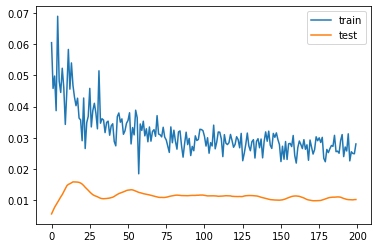

1.9009931087493896
Rúben Diogoda Silva Neves
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 1s 11ms/step - loss: 0.2904 - mse: 0.2904 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 2/200
50/50 [==============================] - 0s 260us/step - loss: 0.2071 - mse: 0.2071 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 3/200
50/50 [==============================] - 0s 200us/step - loss: 0.1680 - mse: 0.1680 - val_loss: 0.0519 - val_mse: 0.0519
Epoch 4/200
50/50 [==============================] - 0s 280us/step - loss: 0.1572 - mse: 0.1572 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 5/200
50/50 [==============================] - 0s 220us/step - loss: 0.1904 - mse: 0.1904 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.1306 - mse: 0.1306 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1585 - mse: 0.1585 - val_loss: 0.0505 - val_mse: 0.0505
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 200us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 63/200
50/50 [==============================] - 0s 180us/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 64/200
50/50 [==============================] - 0s 180us/step - loss: 0.0405 - mse: 0.0405 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 65/200
50/50 [==============================] - 0s 200us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0384 - mse: 0.0384 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 67/200
50/50 [==============================] - 0s 180us/step - loss: 0.0470 - mse: 0.0470 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 68/200
50/50 [==============================] - 0s 180us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 69/200
50/50 [==============================] - 0s 220us

Epoch 123/200
50/50 [==============================] - 0s 220us/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 124/200
50/50 [==============================] - 0s 200us/step - loss: 0.0424 - mse: 0.0424 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 125/200
50/50 [==============================] - 0s 180us/step - loss: 0.0354 - mse: 0.0354 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 126/200
50/50 [==============================] - 0s 200us/step - loss: 0.0361 - mse: 0.0361 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 127/200
50/50 [==============================] - 0s 220us/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0418 - val_mse: 0.0418
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0417 - val_mse: 0.0417
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 180us/step - loss: 0.0382 - mse: 0.0382 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 185/200
50/50 [==============================] - 0s 200us/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0421 - val_mse: 0.0421
Epoch 186/200
50/50 [==============================] - 0s 200us/step - loss: 0.0398 - mse: 0.0398 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0441 - mse: 0.0441 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 188/200
50/50 [==============================] - 0s 180us/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 190/200
50/50 [==============================] - 0s 200us/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0420 - val_mse: 0.0420
Epoch 191/200
50/50 [==============================] - 

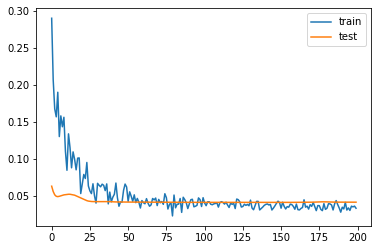

2.2260864973068237
DiogoJota
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 52 samples, validate on 13 samples
Epoch 1/200
52/52 [==============================] - 1s 10ms/step - loss: 0.1026 - mse: 0.1026 - val_loss: 0.1096 - val_mse: 0.1096
Epoch 2/200
52/52 [==============================] - 0s 211us/step - loss: 0.0866 - mse: 0.0866 - val_loss: 0.0991 - val_mse: 0.0991
Epoch 3/200
52/52 [==============================] - 0s 211us/step - loss: 0.0790 - mse: 0.0790 - val_loss: 0.0885 - val_mse: 0.0885
Epoch 4/200
52/52 [==============================] - 0s 211us/step - loss: 0.0874 - mse: 0.0874 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 5/200
52/52 [==============================] - 0s 192us/step - loss: 0.0907 - mse: 0.0907 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 6/200
52/52 [==============================] - 0s 211us/step - loss: 0.0833 - mse: 0.0833 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 7/200
52/52 [==============================] - 0s 192us/step - loss: 0.0740 - mse: 0.0740 - val_loss: 0.0606 - val_mse: 0.0606
Epoch 8/200
52/52 [=======

Epoch 62/200
52/52 [==============================] - 0s 173us/step - loss: 0.0461 - mse: 0.0461 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 63/200
52/52 [==============================] - 0s 173us/step - loss: 0.0534 - mse: 0.0534 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 64/200
52/52 [==============================] - 0s 173us/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0464 - val_mse: 0.0464
Epoch 65/200
52/52 [==============================] - 0s 173us/step - loss: 0.0558 - mse: 0.0558 - val_loss: 0.0463 - val_mse: 0.0463
Epoch 66/200
52/52 [==============================] - 0s 173us/step - loss: 0.0523 - mse: 0.0523 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 67/200
52/52 [==============================] - 0s 173us/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 68/200
52/52 [==============================] - 0s 173us/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0460 - val_mse: 0.0460
Epoch 69/200
52/52 [==============================] - 0s 173us

Epoch 123/200
52/52 [==============================] - 0s 173us/step - loss: 0.0445 - mse: 0.0445 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 124/200
52/52 [==============================] - 0s 192us/step - loss: 0.0532 - mse: 0.0532 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 125/200
52/52 [==============================] - 0s 192us/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 126/200
52/52 [==============================] - 0s 173us/step - loss: 0.0489 - mse: 0.0489 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 127/200
52/52 [==============================] - 0s 173us/step - loss: 0.0458 - mse: 0.0458 - val_loss: 0.0468 - val_mse: 0.0468
Epoch 128/200
52/52 [==============================] - 0s 173us/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 129/200
52/52 [==============================] - 0s 192us/step - loss: 0.0478 - mse: 0.0478 - val_loss: 0.0467 - val_mse: 0.0467
Epoch 130/200
52/52 [==============================] - 

Epoch 184/200
52/52 [==============================] - 0s 173us/step - loss: 0.0452 - mse: 0.0452 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 185/200
52/52 [==============================] - 0s 173us/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 186/200
52/52 [==============================] - 0s 173us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 187/200
52/52 [==============================] - 0s 192us/step - loss: 0.0472 - mse: 0.0472 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 188/200
52/52 [==============================] - 0s 192us/step - loss: 0.0505 - mse: 0.0505 - val_loss: 0.0463 - val_mse: 0.0463
Epoch 189/200
52/52 [==============================] - 0s 192us/step - loss: 0.0469 - mse: 0.0469 - val_loss: 0.0464 - val_mse: 0.0464
Epoch 190/200
52/52 [==============================] - 0s 173us/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 191/200
52/52 [==============================] - 

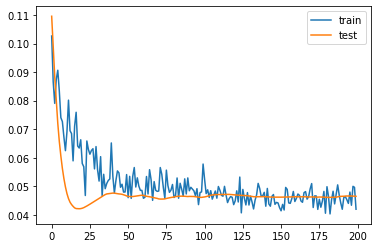

3.410645216703415
DanielCastelo Podence
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Rúben GonçaloSilva Nascimento Vinagre
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 50 samples, validate on 13 samples
Epoch 1/200
50/50 [==============================] - 0s 10ms/step - loss: 0.2115 - mse: 0.2115 - val_loss: 0.2673 - val_mse: 0.2673
Epoch 2/200
50/50 [==============================] - 0s 200us/step - loss: 0.2212 - mse: 0.2212 - val_loss: 0.2386 - val_mse: 0.2386
Epoch 3/200
50/50 [==============================] - 0s 180us/step - loss: 0.1577 - mse: 0.1577 - val_loss: 0.2146 - val_mse: 0.2146
Epoch 4/200
50/50 [==============================] - 0s 200us/step - loss: 0.2083 - mse: 0.2083 - val_loss: 0.1895 - val_mse: 0.1895
Epoch 5/200
50/50 [==============================] - 0s 220us/step - loss: 0.1696 - mse: 0.1696 - val_loss: 0.1676 - val_mse: 0.1676
Epoch 6/200
50/50 [==============================] - 0s 200us/step - loss: 0.1611 - mse: 0.1611 - val_loss: 0.1474 - val_mse: 0.1474
Epoch 7/200
50/50 [==============================] - 0s 180us/step - loss: 0.1447 - mse: 0.1447 - val_loss: 0.1294 - val_mse: 0.1294
Epoch 8/200
50/50 [=======

Epoch 62/200
50/50 [==============================] - 0s 160us/step - loss: 0.0465 - mse: 0.0465 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 63/200
50/50 [==============================] - 0s 180us/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 64/200
50/50 [==============================] - 0s 200us/step - loss: 0.0436 - mse: 0.0436 - val_loss: 0.0560 - val_mse: 0.0560
Epoch 65/200
50/50 [==============================] - 0s 200us/step - loss: 0.0438 - mse: 0.0438 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 66/200
50/50 [==============================] - 0s 200us/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 67/200
50/50 [==============================] - 0s 220us/step - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 68/200
50/50 [==============================] - 0s 200us/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 69/200
50/50 [==============================] - 0s 180us

Epoch 123/200
50/50 [==============================] - 0s 180us/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0557 - val_mse: 0.0557
Epoch 124/200
50/50 [==============================] - 0s 180us/step - loss: 0.0416 - mse: 0.0416 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 125/200
50/50 [==============================] - 0s 180us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0561 - val_mse: 0.0561
Epoch 126/200
50/50 [==============================] - 0s 180us/step - loss: 0.0379 - mse: 0.0379 - val_loss: 0.0562 - val_mse: 0.0562
Epoch 127/200
50/50 [==============================] - 0s 200us/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0563 - val_mse: 0.0563
Epoch 128/200
50/50 [==============================] - 0s 180us/step - loss: 0.0415 - mse: 0.0415 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 129/200
50/50 [==============================] - 0s 200us/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 130/200
50/50 [==============================] - 

Epoch 184/200
50/50 [==============================] - 0s 240us/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0535 - val_mse: 0.0535
Epoch 185/200
50/50 [==============================] - 0s 180us/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0536 - val_mse: 0.0536
Epoch 186/200
50/50 [==============================] - 0s 180us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0537 - val_mse: 0.0537
Epoch 187/200
50/50 [==============================] - 0s 180us/step - loss: 0.0351 - mse: 0.0351 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 188/200
50/50 [==============================] - 0s 200us/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.0538 - val_mse: 0.0538
Epoch 189/200
50/50 [==============================] - 0s 200us/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.0539 - val_mse: 0.0539
Epoch 190/200
50/50 [==============================] - 0s 160us/step - loss: 0.0370 - mse: 0.0370 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 191/200
50/50 [==============================] - 

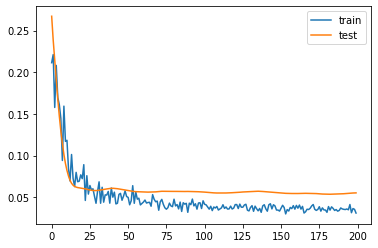

1.2047478258609772
PedroLomba Neto
no_player_data_so_far_this_season


C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jim\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Train on 21 samples, validate on 6 samples
Epoch 1/200
21/21 [==============================] - 1s 28ms/step - loss: 0.3276 - mse: 0.3276 - val_loss: 0.0248 - val_mse: 0.0248
Epoch 2/200
21/21 [==============================] - 0s 428us/step - loss: 0.1792 - mse: 0.1792 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 3/200
21/21 [==============================] - 0s 476us/step - loss: 0.2506 - mse: 0.2506 - val_loss: 0.0253 - val_mse: 0.0253
Epoch 4/200
21/21 [==============================] - 0s 381us/step - loss: 0.1762 - mse: 0.1762 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 5/200
21/21 [==============================] - 0s 428us/step - loss: 0.1599 - mse: 0.1599 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 6/200
21/21 [==============================] - 0s 524us/step - loss: 0.1469 - mse: 0.1469 - val_loss: 0.0280 - val_mse: 0.0280
Epoch 7/200
21/21 [==============================] - 0s 476us/step - loss: 0.1457 - mse: 0.1457 - val_loss: 0.0294 - val_mse: 0.0294
Epoch 8/200
21/21 [========

Epoch 62/200
21/21 [==============================] - 0s 381us/step - loss: 0.1104 - mse: 0.1104 - val_loss: 0.0616 - val_mse: 0.0616
Epoch 63/200
21/21 [==============================] - 0s 428us/step - loss: 0.0902 - mse: 0.0902 - val_loss: 0.0618 - val_mse: 0.0618
Epoch 64/200
21/21 [==============================] - 0s 381us/step - loss: 0.1014 - mse: 0.1014 - val_loss: 0.0621 - val_mse: 0.0621
Epoch 65/200
21/21 [==============================] - 0s 381us/step - loss: 0.0908 - mse: 0.0908 - val_loss: 0.0627 - val_mse: 0.0627
Epoch 66/200
21/21 [==============================] - 0s 428us/step - loss: 0.0959 - mse: 0.0959 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 67/200
21/21 [==============================] - 0s 428us/step - loss: 0.1088 - mse: 0.1088 - val_loss: 0.0633 - val_mse: 0.0633
Epoch 68/200
21/21 [==============================] - 0s 381us/step - loss: 0.1028 - mse: 0.1028 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 69/200
21/21 [==============================] - 0s 381us

Epoch 123/200
21/21 [==============================] - 0s 428us/step - loss: 0.0950 - mse: 0.0950 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 124/200
21/21 [==============================] - 0s 381us/step - loss: 0.0963 - mse: 0.0963 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 125/200
21/21 [==============================] - 0s 381us/step - loss: 0.0792 - mse: 0.0792 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 126/200
21/21 [==============================] - 0s 428us/step - loss: 0.0877 - mse: 0.0877 - val_loss: 0.0801 - val_mse: 0.0801
Epoch 127/200
21/21 [==============================] - 0s 381us/step - loss: 0.0923 - mse: 0.0923 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 128/200
21/21 [==============================] - 0s 333us/step - loss: 0.0749 - mse: 0.0749 - val_loss: 0.0801 - val_mse: 0.0801
Epoch 129/200
21/21 [==============================] - 0s 333us/step - loss: 0.0808 - mse: 0.0808 - val_loss: 0.0804 - val_mse: 0.0804
Epoch 130/200
21/21 [==============================] - 

Epoch 184/200
21/21 [==============================] - 0s 428us/step - loss: 0.0754 - mse: 0.0754 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 185/200
21/21 [==============================] - 0s 333us/step - loss: 0.0920 - mse: 0.0920 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 186/200
21/21 [==============================] - 0s 333us/step - loss: 0.0812 - mse: 0.0812 - val_loss: 0.0844 - val_mse: 0.0844
Epoch 187/200
21/21 [==============================] - 0s 333us/step - loss: 0.0993 - mse: 0.0993 - val_loss: 0.0841 - val_mse: 0.0841
Epoch 188/200
21/21 [==============================] - 0s 381us/step - loss: 0.0848 - mse: 0.0848 - val_loss: 0.0838 - val_mse: 0.0838
Epoch 189/200
21/21 [==============================] - 0s 381us/step - loss: 0.0795 - mse: 0.0795 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 190/200
21/21 [==============================] - 0s 381us/step - loss: 0.0749 - mse: 0.0749 - val_loss: 0.0836 - val_mse: 0.0836
Epoch 191/200
21/21 [==============================] - 

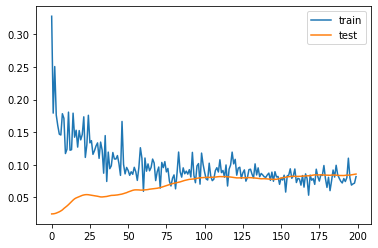

3.3068714141845703


In [12]:
predicted_points = []
player_names = []

for id_number in players_df["id_x"]:

    #get a list of team names for current season
    team_names_list = pd.DataFrame(np.unique(odds_data[['home_team', 'away_team']]), columns = ["team_name"])
    team_names_list['id'] = range(1,21)
    
    #get the player's web_name
    player_name = players_df['full_name'].loc[players_df['id_x'] == id_number]
    player_name = player_name.values
    player_name = player_name[0]
    print(player_name)

    #get this season's fpl point history data for player
    in_fpl_url="https://fantasy.premierleague.com/api/element-summary/" + str(id_number) + "/"
    fpl_player = requests.get(in_fpl_url)
    fpl_player = json.loads(fpl_player.content)
    fpl_df = pd.DataFrame.from_dict(fpl_player['history'])
    if len(fpl_df) > 0:
        fpl_df = fpl_df[['total_points', 'was_home', 'opponent_team']]
        fpl_df['was_home'] = fpl_df['was_home'].astype('bool')
        merged_fpl_teamids = pd.merge(fpl_df, team_names_list, how='left', left_on = ['opponent_team'], right_on=['id'])
        #get the player's team name
        team_name = players_df['team'].loc[players_df['id_x'] == id_number]
        team_name = team_name.values
        team_name = team_name[0]
        team_name = team_names_list['team_name'].loc[team_names_list['id'] == team_name]
        team_name = team_name.values
        team_name = team_name[0]
        for row in merged_fpl_teamids:
            merged_fpl_teamids['home_team'] = np.where(merged_fpl_teamids['was_home'] == True, team_name, merged_fpl_teamids['team_name'])
            merged_fpl_teamids['away_team'] = np.where(merged_fpl_teamids['was_home'] == True, merged_fpl_teamids['team_name'], team_name)

        fpl_odds_joined = merged_fpl_teamids.merge(odds_data, how = 'left', on=["home_team", "away_team"])
        fpl_odds_joined['odds'] = np.where(fpl_odds_joined['was_home'] == True, fpl_odds_joined['home_odds'], fpl_odds_joined['away_odds'])
        final = fpl_odds_joined[['total_points', 'was_home', 'odds']]
    else:
        print("no_player_data_so_far_this_season")
        final = pd.DataFrame(columns = ['total_points', 'was_home', 'odds'])


    #get past season fpl player history data
    for season in ['2019-20','2018-19', '2017-18', '2016-17']:
        #get the links data
        players_links = pd.read_csv(r"C:\Users\Jim\Documents\fantasy prediction/players_links_" + season +".csv")
        if player_name in players_links['full_name'].values:
            link = players_links['link'].loc[players_links['full_name'] == player_name]
            link = link.values
            link = link[0]

            #load the odds data and use it to get a list of past teams and team ids
            odds_data_past = pd.read_csv((folder_to_save_to + "odds_data_" + season +".csv"))
            team_names_list_past = pd.DataFrame(np.unique(odds_data_past['home_team']), columns = ["team_name"])
            team_names_list_past['id'] = range(1,21)

    
            
            #get the past season gameweek data
            gw_link = "https://github.com" + link + "/gw.csv"
            table_list_past = pd.read_html(gw_link)
            gw_table_past = table_list_past[0]
            gw_table_past = gw_table_past[['total_points', 'was_home', 'opponent_team']]
            gw_table_past['was_home'] = gw_table_past['was_home'].astype('bool')
            merged_fpl_teamids_past = pd.merge(gw_table_past, team_names_list_past, how='left', left_on = ['opponent_team'], right_on=['id'])
            #get team_name
            if len(np.setdiff1d([*range(1, 21)], gw_table_past['opponent_team'])) != 0:
                team_id_past = np.setdiff1d([*range(1, 21)], gw_table_past['opponent_team'])[0]
                team_name_past = team_names_list_past['team_name'].loc[team_names_list_past['id'] == team_id_past]
                for row in merged_fpl_teamids_past:
                    merged_fpl_teamids_past['home_team'] = np.where(merged_fpl_teamids_past['was_home'] == True, team_name_past, merged_fpl_teamids_past['team_name'])
                    merged_fpl_teamids_past['away_team'] = np.where(merged_fpl_teamids_past['was_home'] == True, merged_fpl_teamids_past['team_name'], team_name_past)


                fpl_odds_joined_past = merged_fpl_teamids_past.merge(odds_data_past, how = 'left', left_on=["home_team", "away_team"], right_on = ["home_team", "away_team"])
                fpl_odds_joined_past['odds'] = np.where(fpl_odds_joined_past['was_home'] == True, fpl_odds_joined_past['home_odds'], fpl_odds_joined_past['away_odds'])
                final_past = fpl_odds_joined_past[['total_points', 'was_home', 'odds']]
                final = final.append(final_past, ignore_index= True)
            else:
                break
        else:
            break
    final = final.reset_index()
    final = final[['total_points', 'was_home', 'odds']]
    if len(final) > 10:
        #get upcoming fixture data
        fpl_fixtures = pd.DataFrame.from_dict(fpl_player['fixtures'])
        fpl_fixtures = fpl_fixtures[fpl_fixtures['event']== gameweek_to_predict]
        fpl_fixtures = fpl_fixtures[['is_home', 'team_h', 'team_a']]
        fpl_fixtures['is_home'] = fpl_fixtures['is_home'].astype('bool')
        fpl_fixture_merge = pd.merge(fpl_fixtures, team_names_list, how='left', left_on = ['team_h'], right_on=['id'])
        fpl_fixture_merge = pd.merge(fpl_fixture_merge, team_names_list, how='left', left_on = ['team_a'], right_on=['id'])
        fpl_fixture_merge['home_team'] = fpl_fixture_merge['team_name_x']
        fpl_fixture_merge['away_team'] = fpl_fixture_merge['team_name_y']
        fpl_fixture_merge['was_home'] = fpl_fixture_merge['is_home']
        fpl_fixture_merge = fpl_fixture_merge[['was_home', 'home_team', 'away_team']]
        end_fixtures = pd.merge(fpl_fixture_merge, odds_data, how = 'left', left_on = ['home_team', 'away_team'], right_on = ['home_team', 'away_team'])
        end_fixtures['odds'] = np.where(end_fixtures['was_home'] == True, end_fixtures['home_odds'], end_fixtures['away_odds'])
        end_fixtures = end_fixtures[['was_home', 'odds']]
        end_fixtures = end_fixtures.dropna()   

        #select how many games to split off for testing 
        test_length = 20
        test_length = test_length * -1

        #concat + scale the data 
        final = final.drop_duplicates()
        pre_scale = pd.concat((final, end_fixtures))
        scaler = MinMaxScaler(feature_range = (0,1))
        scaled_data = scaler.fit_transform(pre_scale)
        #use this line if predicting one game ahead
        if len(end_fixtures == 2):
            scaled_data = np.delete(scaled_data, -2, axis=0)

       #split into train, test and predict
        model_X, model_y = to_supervised_window(scaled_data, 10, 1)
        if len(end_fixtures) == 1:
            predict_data = model_X[-1].reshape(1,10,5)
            model_X = model_X[:-len(end_fixtures)]


            model_y = model_y[:-len(end_fixtures)]


            if len(model_y)>5:
                epochs = 100
                batch_size = 16
                #model away
                model = Sequential()
                model.add(LSTM(32, input_shape = (10, 5), activation = 'tanh'))
                model.add(Dropout(0.8))
                model.add(Dense(4,activation = 'tanh'))
                model.add(Dense(1, activation = 'tanh'))
                model.compile(optimizer = 'adam', loss = 'mse', metrics=['mse'])

                history = model.fit(model_X, model_y, epochs = 200, validation_split=0.2, batch_size=len(scaled_data))

                plt.plot(history.history['mse'], label='train')
                plt.plot(history.history['val_mse'], label ='test')
                plt.legend()
                plt.show()
                #predict the data
                prediction = model.predict(predict_data)
                scaled_data[-1, 1] = prediction[0]
                scale_inverted = scaler.inverse_transform(scaled_data)
                predicted_row = scale_inverted[-1, 1]


                predicted_points.append(predicted_row)
                player_names.append(player_name)
                print(predicted_row)

In [19]:
game_prediction = pd.DataFrame(data = predicted_points, columns = [("predictions_gw"+gameweek_to_predict)])
game_prediction['name'] = player_names
print(game_prediction.sort_values(("predictions_gw" + gameweek_to_predict), ascending=False).head(20))
if save_to_file = True
    second_game_prediction.to_csv((folder_to_save_to +"point_prediction_gw" + gameweek_to_predict + ".csv"))

     predictions_gw2                      name
167        11.745067              MohamedSalah
3          11.314894  Pierre-EmerickAubameyang
168        10.532272           AndrewRobertson
211         9.539920            MasonGreenwood
184         9.020920            RaheemSterling
163         7.971308            Virgilvan Dijk
171         7.959474     TrentAlexander-Arnold
176         7.648641              SergioAgüero
11          7.541988             SeadKolasinac
4           7.308757        AlexandreLacazette
126         7.266125                LucasDigne
241         7.227848             GeorgeBaldock
0           7.103001                 MesutÖzil
164         7.063346                 SadioMané
274         6.883946                 HarryKane
143         6.608666                JamieVardy
198         6.392676                 PaulPogba
27          6.348630            ConorHourihane
239         6.184373               EndaStevens
195         6.151927                  JuanMata
